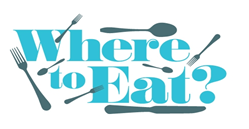

# TripAdvisor restaurants data for 31 European cities

In [1]:
# Importing packages for training 
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split

In [2]:
# Importing packages for visualization
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import plotly
plotly.tools.set_credentials_file(username = 'xxxx', api_key = 'xxxxxx')

import plotly.plotly as py
import plotly.graph_objs as go

In [4]:
# Loading and understanding the dataset
data = pd.read_csv("TA_restaurants_curated.csv")

In [5]:
data

,Unnamed: 0,Name,City,Cuisine Style,Ranking,Rating,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA
0,0,Martine of Martine's Table,Amsterdam,"['French', 'Dutch', 'European']",1.0,5.0,$$ - $$$,136.0,"[['Just like home', 'A Warm Welcome to Wintry ...",/Restaurant_Review-g188590-d11752080-Reviews-M...,d11752080
1,1,De Silveren Spiegel,Amsterdam,"['Dutch', 'European', 'Vegetarian Friendly', '...",2.0,4.5,$$$$,812.0,"[['Great food and staff', 'just perfect'], ['0...",/Restaurant_Review-g188590-d693419-Reviews-De_...,d693419
2,2,La Rive,Amsterdam,"['Mediterranean', 'French', 'International', '...",3.0,4.5,$$$$,567.0,"[['Satisfaction', 'Delicious old school restau...",/Restaurant_Review-g188590-d696959-Reviews-La_...,d696959
3,3,Vinkeles,Amsterdam,"['French', 'European', 'International', 'Conte...",4.0,5.0,$$$$,564.0,"[['True five star dinner', 'A superb evening o...",/Restaurant_Review-g188590-d1239229-Reviews-Vi...,d1239229
4,4,Librije's Zusje Amsterdam,Amsterdam,"['Dutch', 'European', 'International', 'Vegeta...",5.0,4.5,$$$$,316.0,"[['Best meal.... EVER', 'super food experience...",/Restaurant_Review-g188590-d6864170-Reviews-Li...,d6864170
5,5,Ciel Bleu Restaurant,Amsterdam,"['Contemporary', 'International', 'Vegetarian ...",6.0,4.5,$$$$,745.0,"[['A treat!', 'Wow just Wow'], ['01/01/2018', ...",/Restaurant_Review-g188590-d696902-Reviews-Cie...,d696902
6,6,Zaza's,Amsterdam,"['French', 'International', 'Mediterranean', '...",7.0,4.5,$$ - $$$,1455.0,"[['40th Birthday with my Family', 'One of the ...",/Restaurant_Review-g188590-d1014732-Reviews-Za...,d1014732
7,7,Blue Pepper Restaurant And Candlelight Cruises,Amsterdam,"['Asian', 'Indonesian', 'Vegetarian Friendly',...",8.0,4.5,$$$$,675.0,"[['Great Experience', 'A true delight'], ['01/...",/Restaurant_Review-g188590-d697058-Reviews-Blu...,d697058
8,8,Teppanyaki Restaurant Sazanka,Amsterdam,"['Japanese', 'Asian', 'Vegetarian Friendly', '...",9.0,4.5,$$$$,923.0,"[['Great Food & Service!', 'Superior food and ...",/Restaurant_Review-g188590-d697009-Reviews-Tep...,d697009
9,9,Rob Wigboldus Vishandel,Amsterdam,"['Dutch', 'Seafood', 'Fast Food']",10.0,4.5,$,450.0,"[['Excellent Herring', 'Lovely, rustic fish sh...",/Restaurant_Review-g188590-d1955652-Reviews-Ro...,d1955652


In [6]:
data.describe()

,Unnamed: 0,Ranking,Rating,Number of Reviews
count,125527.000000,115876.000000,115897.000000,108183.000000
mean,3974.686131,3657.463979,3.987441,125.184983
std,4057.687698,3706.255301,0.678814,310.833311
min,0.000000,1.000000,-1.000000,2.000000
25%,1042.000000,965.000000,3.500000,9.000000
50%,2445.000000,2256.000000,4.000000,32.000000
75%,5626.000000,5237.000000,4.500000,114.000000
max,18211.000000,16444.000000,5.000000,16478.000000


### Data Preprocessing 

In [7]:
# Number of missing values in the dataset
data.isna().sum()

Unnamed: 0               0
Name                     0
City                     0
Cuisine Style        31351
Ranking               9651
Rating                9630
Price Range          47855
Number of Reviews    17344
Reviews               9616
URL_TA                   0
ID_TA                    0
dtype: int64

In [8]:
# Renaming column 0
restaurant_data = data.rename(columns = {'Unnamed: 0':'Restaurant ID'})
restaurant_data.head(2)

,Restaurant ID,Name,City,Cuisine Style,Ranking,Rating,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA
0,0,Martine of Martine's Table,Amsterdam,"['French', 'Dutch', 'European']",1.0,5.0,$$ - $$$,136.0,"[['Just like home', 'A Warm Welcome to Wintry ...",/Restaurant_Review-g188590-d11752080-Reviews-M...,d11752080
1,1,De Silveren Spiegel,Amsterdam,"['Dutch', 'European', 'Vegetarian Friendly', '...",2.0,4.5,$$$$,812.0,"[['Great food and staff', 'just perfect'], ['0...",/Restaurant_Review-g188590-d693419-Reviews-De_...,d693419


In [9]:
restaurant_data.City.unique()

array(['Amsterdam', 'Athens', 'Barcelona', 'Berlin', 'Bratislava',
       'Brussels', 'Budapest', 'Copenhagen', 'Dublin', 'Edinburgh',
       'Geneva', 'Hamburg', 'Helsinki', 'Krakow', 'Lisbon', 'Ljubljana',
       'London', 'Luxembourg', 'Lyon', 'Madrid', 'Milan', 'Munich',
       'Oporto', 'Oslo', 'Paris', 'Prague', 'Rome', 'Stockholm', 'Vienna',
       'Warsaw', 'Zurich'], dtype=object)

In [10]:
restaurant_data.City.value_counts()

London        18212
Paris         14874
Madrid         9543
Barcelona      8425
Berlin         7078
Milan          6687
Rome           5949
Prague         4859
Lisbon         3986
Vienna         3724
Amsterdam      3434
Brussels       3204
Hamburg        3131
Munich         2995
Lyon           2930
Stockholm      2705
Budapest       2606
Warsaw         2352
Copenhagen     2109
Dublin         2082
Athens         1938
Edinburgh      1865
Zurich         1667
Oporto         1580
Geneva         1572
Krakow         1354
Helsinki       1228
Oslo           1213
Bratislava     1067
Luxembourg      657
Ljubljana       501
Name: City, dtype: int64

In [11]:
restaurant_data.groupby('City')['Price Range'].value_counts()

City        Price Range
Amsterdam   $$ - $$$       1915
            $               546
            $$$$            106
Athens      $$ - $$$        737
            $               458
            $$$$             67
Barcelona   $$ - $$$       3680
            $              1464
            $$$$            263
Berlin      $$ - $$$       2366
            $              1153
            $$$$            134
Bratislava  $$ - $$$        327
            $               123
            $$$$             25
Brussels    $$ - $$$       1599
            $               385
            $$$$            124
Budapest    $$ - $$$       1093
            $               573
            $$$$             74
Copenhagen  $$ - $$$        991
            $               262
            $$$$             95
Dublin      $$ - $$$       1098
            $               359
            $$$$             43
Edinburgh   $$ - $$$        968
            $               415
            $$$$             46
                

In [12]:
# Obtaining the data for a particular city
Amsterdam = data[data.City == 'Amsterdam']
Amsterdam.head()

,Unnamed: 0,Name,City,Cuisine Style,Ranking,Rating,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA
0,0,Martine of Martine's Table,Amsterdam,"['French', 'Dutch', 'European']",1.0,5.0,$$ - $$$,136.0,"[['Just like home', 'A Warm Welcome to Wintry ...",/Restaurant_Review-g188590-d11752080-Reviews-M...,d11752080
1,1,De Silveren Spiegel,Amsterdam,"['Dutch', 'European', 'Vegetarian Friendly', '...",2.0,4.5,$$$$,812.0,"[['Great food and staff', 'just perfect'], ['0...",/Restaurant_Review-g188590-d693419-Reviews-De_...,d693419
2,2,La Rive,Amsterdam,"['Mediterranean', 'French', 'International', '...",3.0,4.5,$$$$,567.0,"[['Satisfaction', 'Delicious old school restau...",/Restaurant_Review-g188590-d696959-Reviews-La_...,d696959
3,3,Vinkeles,Amsterdam,"['French', 'European', 'International', 'Conte...",4.0,5.0,$$$$,564.0,"[['True five star dinner', 'A superb evening o...",/Restaurant_Review-g188590-d1239229-Reviews-Vi...,d1239229
4,4,Librije's Zusje Amsterdam,Amsterdam,"['Dutch', 'European', 'International', 'Vegeta...",5.0,4.5,$$$$,316.0,"[['Best meal.... EVER', 'super food experience...",/Restaurant_Review-g188590-d6864170-Reviews-Li...,d6864170


In [13]:
# Filling missing values in Ranking
restaurant_data["Ranking"] = restaurant_data["Restaurant ID"] + 1

In [14]:
restaurant_data.head(2)

,Restaurant ID,Name,City,Cuisine Style,Ranking,Rating,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA
0,0,Martine of Martine's Table,Amsterdam,"['French', 'Dutch', 'European']",1,5.0,$$ - $$$,136.0,"[['Just like home', 'A Warm Welcome to Wintry ...",/Restaurant_Review-g188590-d11752080-Reviews-M...,d11752080
1,1,De Silveren Spiegel,Amsterdam,"['Dutch', 'European', 'Vegetarian Friendly', '...",2,4.5,$$$$,812.0,"[['Great food and staff', 'just perfect'], ['0...",/Restaurant_Review-g188590-d693419-Reviews-De_...,d693419


In [15]:
# Filling the missing values in Number of Reviews
restaurant_data["Number of Reviews"].fillna(restaurant_data['Number of Reviews'].mean(), inplace=True)
restaurant_data["Number of Reviews"] = restaurant_data['Number of Reviews'].round(0)

In [16]:
restaurant_data['Number of Reviews'].head()

0    136.0
1    812.0
2    567.0
3    564.0
4    316.0
Name: Number of Reviews, dtype: float64

In [17]:
# Missing values in Price Range
restaurant_data['Price Range'].fillna(restaurant_data['Price Range'].value_counts().index[0],inplace=True)

In [18]:
# Converting Price Range into numerical values
from sklearn.preprocessing import LabelEncoder

number = LabelEncoder()
restaurant_data['Price Range'] = number.fit_transform(restaurant_data['Price Range'].astype('str'))

In [19]:
restaurant_data['Price Range'].head(3)   #$:0, $$-$$$:1, $$$$:2

0    1
1    2
2    2
Name: Price Range, dtype: int64

In [20]:
# Creating dummy variables for Price Range
restaurant_price = pd.get_dummies(restaurant_data['Price Range'])

In [21]:
type(restaurant_price)

pandas.core.frame.DataFrame

In [22]:
restaurants = pd.concat([restaurant_data,restaurant_price], axis=1)   #concatenating

In [23]:
restaurants.head(2)

,Restaurant ID,Name,City,Cuisine Style,Ranking,Rating,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA,0,1,2
0,0,Martine of Martine's Table,Amsterdam,"['French', 'Dutch', 'European']",1,5.0,1,136.0,"[['Just like home', 'A Warm Welcome to Wintry ...",/Restaurant_Review-g188590-d11752080-Reviews-M...,d11752080,0,1,0
1,1,De Silveren Spiegel,Amsterdam,"['Dutch', 'European', 'Vegetarian Friendly', '...",2,4.5,2,812.0,"[['Great food and staff', 'just perfect'], ['0...",/Restaurant_Review-g188590-d693419-Reviews-De_...,d693419,0,0,1


In [24]:
# Renaming the new columns 
price_rename = restaurants.rename(columns = {0:'Price Range_$',1:'Price Range_$$-$$$',2:'Price Range_$$$$'})

In [25]:
price_rename.head(2)

,Restaurant ID,Name,City,Cuisine Style,Ranking,Rating,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA,Price Range_$,Price Range_$$-$$$,Price Range_$$$$
0,0,Martine of Martine's Table,Amsterdam,"['French', 'Dutch', 'European']",1,5.0,1,136.0,"[['Just like home', 'A Warm Welcome to Wintry ...",/Restaurant_Review-g188590-d11752080-Reviews-M...,d11752080,0,1,0
1,1,De Silveren Spiegel,Amsterdam,"['Dutch', 'European', 'Vegetarian Friendly', '...",2,4.5,2,812.0,"[['Great food and staff', 'just perfect'], ['0...",/Restaurant_Review-g188590-d693419-Reviews-De_...,d693419,0,0,1


In [26]:
# Drop the Price Range column
restaurants1 = price_rename.drop(['Price Range'], axis=1)

In [27]:
# Missing values in Reviews
restaurants1['Reviews'] = restaurants1['Reviews'].fillna('["No Review"]', axis=0)

In [28]:
restaurants1['Reviews'].tail()

125522    ["No Review"]
125523    ["No Review"]
125524    ["No Review"]
125525    ["No Review"]
125526    ["No Review"]
Name: Reviews, dtype: object

In [29]:
restaurants1['Reviews'][3233]

'[[], []]'

In [30]:
restaurants1['Reviews'] = restaurants1['Reviews'].replace(['[[], []]'], 'No Review')    # Replacing empty Review values

In [31]:
restaurants1['Reviews'].head()

0    [['Just like home', 'A Warm Welcome to Wintry ...
1    [['Great food and staff', 'just perfect'], ['0...
2    [['Satisfaction', 'Delicious old school restau...
3    [['True five star dinner', 'A superb evening o...
4    [['Best meal.... EVER', 'super food experience...
Name: Reviews, dtype: object

In [32]:
restaurants1['Reviews'][3233]

'No Review'

In [33]:
len(restaurants1)

125527

In [35]:
# Missing values in Cuisine Style
type(restaurants1['Cuisine Style'])

pandas.core.series.Series

In [36]:
type(restaurants1['Cuisine Style'][153])

str

In [37]:
restaurants1['Cuisine Style'] = restaurants1['Cuisine Style'].fillna('["Unknown"]', axis=0)

In [38]:
restaurants1.tail(3)

,Restaurant ID,Name,City,Cuisine Style,Ranking,Rating,Number of Reviews,Reviews,URL_TA,ID_TA,Price Range_$,Price Range_$$-$$$,Price Range_$$$$
125524,1664,Restaurant Bahnhof,Zurich,"[""Unknown""]",1665,NaN,125.0,"[""No Review""]",/Restaurant_Review-g188113-d13296092-Reviews-R...,d13296092,0,1,0
125525,1665,Yoyo Pizza,Zurich,['Fast Food'],1666,NaN,125.0,"[""No Review""]",/Restaurant_Review-g188113-d13323362-Reviews-Y...,d13323362,0,1,0
125526,1666,dieci,Zurich,"['Italian', 'Pizza', 'Mediterranean', 'Diner']",1667,NaN,125.0,"[""No Review""]",/Restaurant_Review-g188113-d13349842-Reviews-D...,d13349842,0,1,0


In [39]:
restaurants1['Cuisine Style'][175]

'["Unknown"]'

In [40]:
# Cleaning Cuisine Style data

cuisine_style = []

for i in range(len(restaurants1['Cuisine Style'])):
    word = restaurants1['Cuisine Style'].loc[i]
    j = word.replace("'","").replace("[","").replace("]","").replace("\"","")   # Escape sequence("\"")
    j = j.replace(" ", "")
    print(j,i)
    y = j.split(',')
    cuisine_style.append(y)

cuisine_style

French,Dutch,European 0
Dutch,European,VegetarianFriendly,GlutenFreeOptions 1
Mediterranean,French,International,European,VegetarianFriendly,VeganOptions 2
French,European,International,Contemporary,VegetarianFriendly,VeganOptions,GlutenFreeOptions 3
Dutch,European,International,VegetarianFriendly,VeganOptions,GlutenFreeOptions 4
Contemporary,International,VegetarianFriendly,VeganOptions,GlutenFreeOptions 5
French,International,Mediterranean,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 6
Asian,Indonesian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 7
Japanese,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 8
Dutch,Seafood,FastFood 9
American,Bar,European,VegetarianFriendly,GlutenFreeOptions 10
French,Dutch,International,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 11
French,European,CentralEuropean,VegetarianFriendly,VeganOptions,GlutenFreeOptions 12
Bar,Pub 13
French,Dutch,International,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions

Indian,VegetarianFriendly,VeganOptions 855
Dutch,Bar,European,VegetarianFriendly 856
Mediterranean,Spanish,VeganOptions,GlutenFreeOptions 857
French,European 858
Dutch,Cafe,Pub,Bar,European 859
American 860
Japanese,Sushi,Asian,VegetarianFriendly 861
Asian,Thai,VegetarianFriendly,VeganOptions 862
Dutch,Bar,European,Pub 863
Asian,Thai,VegetarianFriendly,VeganOptions,GlutenFreeOptions 864
American,Bar,FastFood,Pub,VegetarianFriendly 865
Bar,Pub 866
American,FastFood,Bar,European,VegetarianFriendly 867
European,French,VegetarianFriendly,GlutenFreeOptions 868
Dutch,Bar,International,European,Delicatessen,VegetarianFriendly,GlutenFreeOptions 869
Dutch,Seafood,European,VegetarianFriendly,VeganOptions 870
Japanese,Hawaiian,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 871
Steakhouse,Argentinean,SouthAmerican 872
Bar,Cafe,European,VegetarianFriendly 873
Italian,Pizza,European,VegetarianFriendly 874
Italian,Pizza,FastFood,VegetarianFriendly 875
Grill,Bar,European,VegetarianFriendly 87

Dutch,European,Healthy,CentralEuropean 1605
Chinese,Asian,Fusion,Japanese,VegetarianFriendly 1606
Chinese,Asian,Japanese 1607
Mediterranean,Spanish 1608
Italian,Pizza,Mediterranean,European,VegetarianFriendly 1609
Italian,Pizza,Mediterranean,European,VegetarianFriendly,VeganOptions 1610
Moroccan,Mediterranean,Delicatessen,Arabic,VegetarianFriendly 1611
French,International 1612
European,Dutch,International 1613
Unknown 1614
Lebanese,International,Mediterranean,Healthy 1615
French,Chinese,Asian,Fusion 1616
International,Healthy,Dutch,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 1617
Cafe,VegetarianFriendly,VeganOptions 1618
Dutch,European 1619
Asian,Thai,VegetarianFriendly 1620
Mexican,Latin,CentralAmerican,VegetarianFriendly 1621
Mediterranean,European,Greek 1622
Dutch,European 1623
Seafood,VegetarianFriendly 1624
Italian,FastFood,European,VegetarianFriendly 1625
Japanese,Sushi,Asian 1626
Italian,Mediterranean,European,WineBar 1627
Dutch,Bar,European,Pub 1628
Dutch,Cafe,E

Unknown 2355
Dutch,European 2356
Unknown 2357
Dutch,European 2358
Unknown 2359
European,Italian,Barbecue,Argentinean,SouthAmerican 2360
European,Italian,Pizza 2361
Bar,Mediterranean,European,Spanish,Pub 2362
Turkish,Healthy,VegetarianFriendly,VeganOptions 2363
Indian 2364
Unknown 2365
Mediterranean,MiddleEastern,Lebanese,VegetarianFriendly 2366
Unknown 2367
Cafe,European 2368
Dutch,Bar,European,Pub 2369
Dutch,Bar,European,Pub 2370
International,VegetarianFriendly 2371
Asian,Indonesian,Halal,VegetarianFriendly 2372
Unknown 2373
Unknown 2374
Unknown 2375
Unknown 2376
Unknown 2377
Unknown 2378
Steakhouse 2379
Cafe,European 2380
Unknown 2381
Italian,Mediterranean,European,Pizza,VegetarianFriendly 2382
American,Dutch,European,SouthAmerican 2383
Healthy,VegetarianFriendly 2384
Cafe,European 2385
European 2386
International 2387
Sushi,Asian,Vietnamese,Japanese,Soups,VegetarianFriendly 2388
Dutch,European,Fusion,Healthy,Soups,VegetarianFriendly,VeganOptions 2389
European 2390
Unknown 2391
Unkn

Unknown 3104
Unknown 3105
Mediterranean,Greek,European 3106
Bar,Seafood,International,Pub,Diner,Healthy 3107
Italian 3108
European,Dutch,VegetarianFriendly,VeganOptions 3109
Dutch,European 3110
Unknown 3111
European,Portuguese 3112
Unknown 3113
Italian 3114
Unknown 3115
Chinese,Asian 3116
Unknown 3117
Cafe 3118
Italian 3119
Italian,Pizza 3120
Italian,Pizza 3121
Italian,Pizza 3122
Italian,Pizza 3123
Unknown 3124
French,European 3125
Unknown 3126
European,Contemporary 3127
Italian 3128
Unknown 3129
Asian,Thai,VegetarianFriendly 3130
Chinese,Asian,Indonesian,VegetarianFriendly 3131
Mexican,Latin,Spanish,SouthAmerican 3132
Italian,Pizza,European 3133
Unknown 3134
Unknown 3135
American 3136
Asian,Indonesian 3137
French 3138
Unknown 3139
Unknown 3140
Bar,Pub 3141
Dutch,Bar,Cafe,European,Contemporary,VegetarianFriendly 3142
Italian,Pizza,European,VegetarianFriendly 3143
Bar 3144
Unknown 3145
Italian,Pizza,European 3146
Unknown 3147
Mexican,International 3148
Unknown 3149
Turkish 3150
Turkish,

Mediterranean,Greek,VegetarianFriendly,VeganOptions 3854
Italian,French,International,Greek 3855
VegetarianFriendly 3856
Mediterranean,Greek,VegetarianFriendly 3857
WineBar 3858
Mediterranean,European,Greek,VegetarianFriendly 3859
Indian,VegetarianFriendly,VeganOptions 3860
Unknown 3861
Mediterranean,Greek,VegetarianFriendly 3862
Greek,Mediterranean,European,VegetarianFriendly,VeganOptions 3863
Italian,Pizza,Mediterranean,VegetarianFriendly 3864
Japanese,Sushi,Asian,Korean,Soups,VegetarianFriendly 3865
European,Greek,Mediterranean 3866
American,British,Greek,FastFood,VegetarianFriendly 3867
Cafe,Mediterranean,Greek,VegetarianFriendly 3868
Cafe,Mediterranean,Greek,Bar,Pizza,European,VegetarianFriendly,VeganOptions 3869
American,Bar,CentralAmerican,VegetarianFriendly,VeganOptions,GlutenFreeOptions 3870
Pizza,Italian,Mediterranean,European 3871
Mediterranean,Greek,European,VegetarianFriendly 3872
American,Bar,CentralAmerican,VegetarianFriendly 3873
Greek,Mediterranean,VegetarianFriendly 3

American,Greek 4604
Mediterranean,Greek 4605
Greek,Mediterranean,Grill 4606
Italian,Pizza,Cafe,Diner 4607
Cafe,Mediterranean,Greek 4608
Italian,Mediterranean 4609
Mediterranean,Greek,Italian,Bar,Cafe,Pub 4610
Mediterranean,Greek 4611
Italian 4612
Australian 4613
Greek 4614
Mediterranean,European,Greek 4615
Greek,Halal 4616
Unknown 4617
Unknown 4618
Pizza 4619
Mediterranean,Greek 4620
Mediterranean 4621
Greek 4622
Mediterranean 4623
Greek 4624
Greek 4625
Unknown 4626
Unknown 4627
Mediterranean 4628
Greek 4629
Unknown 4630
Mediterranean,WineBar,Contemporary 4631
VeganOptions 4632
Unknown 4633
Mediterranean 4634
American,Greek 4635
Italian,Greek 4636
Unknown 4637
Unknown 4638
Bar,Pub 4639
Chinese,Asian 4640
European 4641
Cafe,Greek,Mediterranean 4642
Unknown 4643
American,African,European,Asian 4644
Bar,Cafe,Pub,Greek 4645
Cafe,FastFood,Greek 4646
Steakhouse,FastFood,Mediterranean,Barbecue,Greek 4647
Unknown 4648
Greek,Mediterranean 4649
International,Mediterranean 4650
Mediterranean,Gree

Steakhouse 5354
Italian 5355
Unknown 5356
Unknown 5357
Italian 5358
Mediterranean,Greek 5359
Unknown 5360
Italian,American,Cafe,Mediterranean,Greek 5361
Cafe,FastFood,Greek 5362
Italian 5363
Cafe 5364
Greek 5365
Greek 5366
Greek 5367
Greek 5368
Mediterranean 5369
Unknown 5370
Italian 5371
International,Mediterranean,Fusion,European,Spanish 5372
International,Mediterranean,Spanish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 5373
Mediterranean,European,Spanish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 5374
Mediterranean,European,Spanish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 5375
Mediterranean,Spanish,WineBar,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 5376
Mediterranean,Spanish,European,Fusion,VeganOptions,GlutenFreeOptions 5377
Mediterranean,Fusion,Spanish 5378
African,International,Asian,MiddleEastern,SouthAmerican,Brazilian,Peruvian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 5379
Mexican,Mediterranean,Delicatessen,Colombian,Latin,Central

Italian,Mediterranean,European,VegetarianFriendly 6031
Seafood,Mediterranean,Spanish,GlutenFreeOptions 6032
Seafood,Mediterranean,European,Spanish,Soups,GlutenFreeOptions,VegetarianFriendly 6033
Mediterranean,European,Spanish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 6034
Indian,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 6035
Mediterranean,European,Spanish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 6036
Mediterranean,British,Fusion,MiddleEastern,FastFood 6037
FastFood,Barbecue,VegetarianFriendly 6038
Seafood,Mediterranean,European,Spanish,Soups,VegetarianFriendly,GlutenFreeOptions 6039
Seafood,Mediterranean,Spanish,Soups,VegetarianFriendly 6040
Mediterranean,European,Spanish,Contemporary,VegetarianFriendly,VeganOptions,GlutenFreeOptions 6041
French,European,Delicatessen,VegetarianFriendly 6042
Japanese,Sushi,Asian,VegetarianFriendly 6043
Steakhouse,American,Barbecue 6044
Bar,Mediterranean,Spanish,Fusion,European,VegetarianFriendly,VeganOptions 6045
European,

International,Mediterranean,Spanish 6603
Italian,Pizza,Mediterranean,VegetarianFriendly 6604
Mediterranean,Spanish,WineBar 6605
Cafe,European,Fusion,VegetarianFriendly,VeganOptions,GlutenFreeOptions 6606
Mediterranean,Spanish,VegetarianFriendly,GlutenFreeOptions 6607
Mediterranean,Spanish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 6608
Spanish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 6609
Steakhouse,Mediterranean,European,Spanish 6610
Cafe,European,Spanish,VegetarianFriendly,VeganOptions 6611
Mediterranean,Spanish,European,VegetarianFriendly,VeganOptions 6612
Seafood,Mediterranean,Spanish,Fusion 6613
Cafe,European,Healthy,VegetarianFriendly,VeganOptions,GlutenFreeOptions 6614
Healthy,VegetarianFriendly,GlutenFreeOptions 6615
Mediterranean,Spanish,VegetarianFriendly 6616
Russian,EasternEuropean,VegetarianFriendly,GlutenFreeOptions 6617
Mediterranean,Fusion,VegetarianFriendly 6618
Mediterranean,European,Spanish,VegetarianFriendly,VeganOptions 6619
Mediterranean,Spanish,Wi

Japanese,Sushi,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 7353
Healthy,StreetFood,Venezuelan,VegetarianFriendly,GlutenFreeOptions 7354
Mediterranean,VegetarianFriendly,VeganOptions,GlutenFreeOptions 7355
Mediterranean,European,Spanish,VegetarianFriendly 7356
Mediterranean,Spanish 7357
Cafe,VegetarianFriendly,VeganOptions 7358
VegetarianFriendly 7359
Mediterranean,European,Spanish,VegetarianFriendly 7360
Indian,VegetarianFriendly,VeganOptions 7361
Mediterranean,Italian,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 7362
International,Mediterranean,Delicatessen,European,Spanish 7363
Steakhouse,Mediterranean,Spanish 7364
French,American,International,Asian,VegetarianFriendly 7365
Mediterranean,European,Spanish 7366
Bar,Mediterranean,Spanish,European,VegetarianFriendly 7367
Cafe,Spanish,Healthy,Mediterranean,European,GlutenFreeOptions 7368
Mediterranean,European,Spanish 7369
Latin,FastFood,Venezuelan,Healthy,SouthAmerican,VegetarianFriendly 7370
Italian,Mediterrane

Mediterranean,European 7960
Italian,Pizza,Mediterranean,Barbecue,European,Argentinean,VegetarianFriendly,VeganOptions 7961
Mediterranean 7962
Mediterranean,European,Spanish 7963
Unknown 7964
Mediterranean,Spanish 7965
Unknown 7966
Chinese,Asian,VegetarianFriendly 7967
Mediterranean,Spanish 7968
Unknown 7969
International,European,Spanish 7970
Bar,Cafe,Mediterranean,Spanish,Pub 7971
Italian,Pizza,Mediterranean,International,VegetarianFriendly 7972
Spanish 7973
Bar,Mediterranean,European,Spanish,Pub,VegetarianFriendly 7974
Mediterranean,Spanish 7975
Unknown 7976
Mediterranean,Spanish 7977
Italian,Pizza,Mediterranean,European,VegetarianFriendly,VeganOptions 7978
Cafe,Spanish 7979
Bar,Seafood,Mediterranean,European,Spanish 7980
Unknown 7981
Italian,Pizza,Mediterranean,European 7982
Italian 7983
Mediterranean,European,Spanish,VegetarianFriendly 7984
Mediterranean,Spanish,VegetarianFriendly 7985
Pizza,European,Spanish,Bar,Mediterranean,VegetarianFriendly 7986
Italian,Pizza,FastFood,Mediterra

Unknown 8602
Mexican,FastFood,Healthy,VegetarianFriendly 8603
Italian,European,Pizza,Mediterranean 8604
Mediterranean,Spanish,International,European,VegetarianFriendly 8605
Mediterranean,Spanish 8606
FastFood,American,Cafe 8607
Sushi,Asian 8608
Mediterranean,European,Spanish 8609
Spanish 8610
Cafe,Mediterranean,European,Pizza,VegetarianFriendly,VeganOptions 8611
Mediterranean,Spanish 8612
European,Spanish,Argentinean,VegetarianFriendly 8613
Mediterranean 8614
Unknown 8615
Italian,Pizza 8616
Argentinean,SouthAmerican,Steakhouse,Spanish 8617
Unknown 8618
American,Steakhouse,Barbecue 8619
Mediterranean,European,Spanish 8620
Chinese 8621
Bar,Mediterranean,European,Spanish,VegetarianFriendly 8622
Unknown 8623
American,Bar,Pub 8624
Unknown 8625
Unknown 8626
Mediterranean,Spanish 8627
Mediterranean 8628
Mediterranean,Spanish,Delicatessen 8629
Mediterranean 8630
Mediterranean,European,Spanish 8631
Unknown 8632
Unknown 8633
Japanese,Spanish 8634
American,Spanish 8635
Unknown 8636
Mediterranean,

Mediterranean,Pizza 9352
Unknown 9353
Unknown 9354
Japanese,Asian,Fusion 9355
Italian,Pizza,FastFood 9356
Unknown 9357
Pizza,European 9358
Cafe,European 9359
Chilean,SouthAmerican 9360
Mediterranean 9361
FastFood 9362
Unknown 9363
Mediterranean,Spanish,European,VegetarianFriendly 9364
Spanish,Bar,Pub 9365
Unknown 9366
Unknown 9367
Unknown 9368
Mediterranean,Spanish 9369
Mediterranean,Spanish 9370
European,Mediterranean,VegetarianFriendly 9371
Unknown 9372
Unknown 9373
Asian 9374
Unknown 9375
Mediterranean,Spanish 9376
Unknown 9377
Mediterranean,European,Spanish,Healthy 9378
Unknown 9379
Mediterranean,Spanish 9380
Cafe,Mediterranean,Healthy,VeganOptions 9381
Japanese 9382
Mediterranean,Barbecue,Spanish 9383
Japanese,Sushi 9384
Italian,Mediterranean 9385
Moroccan,MiddleEastern,Mediterranean 9386
Unknown 9387
Unknown 9388
Unknown 9389
Unknown 9390
Italian,VegetarianFriendly 9391
Delicatessen,Mediterranean,Spanish 9392
Unknown 9393
Mediterranean,European,Spanish,Bar,Pub 9394
Lebanese,Medit

Unknown 10102
Bar,Pub,Healthy,Gastropub 10103
Italian,Pizza 10104
Mediterranean,Spanish 10105
FastFood,Turkish,MiddleEastern,Halal 10106
Italian,Cafe,European,Mediterranean 10107
Italian 10108
Mediterranean 10109
Cafe,Mediterranean,Spanish 10110
Unknown 10111
Mediterranean,Spanish 10112
Unknown 10113
Unknown 10114
International,Spanish 10115
Mediterranean,European,Spanish,VegetarianFriendly 10116
Spanish 10117
Mediterranean 10118
Japanese,Sushi 10119
Mediterranean 10120
Mediterranean 10121
Spanish 10122
Spanish 10123
Unknown 10124
Mediterranean 10125
Mediterranean 10126
Italian,Mexican,Spanish 10127
Bar,Cafe,Spanish 10128
Unknown 10129
Spanish 10130
Japanese,Asian,Fusion,VegetarianFriendly,VeganOptions 10131
Unknown 10132
Unknown 10133
Spanish 10134
Unknown 10135
Mediterranean 10136
Mediterranean,Spanish 10137
Unknown 10138
Unknown 10139
Unknown 10140
Pizza,Mediterranean,Argentinean,SouthAmerican 10141
Spanish,Mediterranean 10142
Unknown 10143
WineBar 10144
Seafood,Mediterranean,Europe

Unknown 10852
Unknown 10853
Spanish,Mediterranean 10854
Mediterranean 10855
Unknown 10856
Mediterranean 10857
Spanish,Greek 10858
Mexican,Japanese,American,European,Spanish 10859
Mediterranean 10860
VegetarianFriendly 10861
Italian,Pizza,Mediterranean,Spanish 10862
Mexican,Peruvian,Fusion 10863
Unknown 10864
Bar,Pub 10865
Unknown 10866
Mediterranean,Spanish 10867
Spanish 10868
Spanish 10869
Unknown 10870
Pizza,European,Spanish 10871
Italian,Pizza,European,Mediterranean 10872
Unknown 10873
Spanish 10874
Unknown 10875
Italian 10876
Spanish 10877
Unknown 10878
FastFood,International,Spanish 10879
Unknown 10880
Mediterranean,European,Spanish 10881
Unknown 10882
Unknown 10883
Mediterranean,Spanish,Seafood 10884
Unknown 10885
Spanish 10886
Steakhouse,Mediterranean,European,Spanish 10887
Unknown 10888
Unknown 10889
Mediterranean,Spanish 10890
MiddleEastern,Turkish,Halal 10891
Spanish 10892
Unknown 10893
Unknown 10894
Spanish 10895
German 10896
Spanish 10897
Unknown 10898
Cafe 10899
Mediterran

Unknown 11489
Unknown 11490
Spanish 11491
Spanish 11492
Latin,Bar,Spanish,Pub 11493
Mexican 11494
Unknown 11495
Unknown 11496
Chinese 11497
Japanese,FastFood,Asian,Fusion 11498
Unknown 11499
Chinese,Spanish 11500
Unknown 11501
Italian,Steakhouse,Caribbean,Pizza 11502
Mediterranean,European,Spanish 11503
Unknown 11504
Mediterranean 11505
Cafe,Mediterranean 11506
European,Spanish,Cafe 11507
Spanish,Mediterranean,European 11508
Unknown 11509
International 11510
Mediterranean 11511
Spanish 11512
Seafood,International,Mediterranean,Spanish,Contemporary 11513
Peruvian,Latin,Seafood,SouthAmerican 11514
Spanish 11515
Belgian,European 11516
Mediterranean,Spanish,Contemporary 11517
Unknown 11518
Cafe,European,Spanish 11519
Unknown 11520
Unknown 11521
FastFood 11522
Unknown 11523
Unknown 11524
Unknown 11525
Seafood,Mediterranean,Spanish 11526
Italian,Pizza,VegetarianFriendly 11527
Unknown 11528
Italian,Mediterranean 11529
Spanish 11530
French,Cafe,FastFood 11531
BrewPub,Bar,Spanish,Pub 11532
Cafe

Italian,Mediterranean,Pizza,Cafe 12101
Unknown 12102
Unknown 12103
Unknown 12104
Unknown 12105
Unknown 12106
Pizza 12107
Mediterranean,Italian 12108
Unknown 12109
Unknown 12110
Mediterranean,European,Spanish 12111
Peruvian,SouthAmerican 12112
Unknown 12113
Unknown 12114
Italian 12115
Italian 12116
Bar,Spanish,Mediterranean,VegetarianFriendly 12117
Bar,Pub 12118
Spanish 12119
Mediterranean,European,Spanish 12120
Unknown 12121
Sushi 12122
Unknown 12123
Chinese 12124
Unknown 12125
Unknown 12126
Spanish,Mediterranean 12127
Spanish 12128
Unknown 12129
Unknown 12130
Mediterranean 12131
Unknown 12132
Unknown 12133
Japanese,Sushi 12134
Mediterranean,Spanish 12135
Unknown 12136
Seafood,Mediterranean,Spanish,European 12137
Mediterranean 12138
Pizza,International,Spanish 12139
Unknown 12140
Unknown 12141
Pizza,Spanish 12142
Chinese 12143
Spanish 12144
Unknown 12145
Unknown 12146
Argentinean,SouthAmerican 12147
Chinese 12148
Spanish 12149
Spanish,MiddleEastern 12150
Japanese,Sushi 12151
Spanish 12

Mediterranean 12851
Spanish,Bar,European,Pub 12852
Spanish 12853
Spanish 12854
Mediterranean,Spanish 12855
Spanish 12856
Pizza 12857
Japanese,Sushi 12858
Mediterranean,Spanish 12859
Unknown 12860
Mediterranean,European,Spanish 12861
Italian,Pizza,Mediterranean 12862
Unknown 12863
Mediterranean 12864
Italian,American,Turkish 12865
FastFood 12866
Unknown 12867
Mediterranean 12868
Italian,Pizza,Mediterranean 12869
Bar,Pub 12870
Mediterranean,Spanish,Diner 12871
Peruvian 12872
Mediterranean,European,Spanish 12873
Unknown 12874
Pizza 12875
Diner 12876
Spanish 12877
Unknown 12878
Unknown 12879
Spanish 12880
Italian 12881
Spanish 12882
Mediterranean,Fusion 12883
Italian 12884
Unknown 12885
Unknown 12886
Steakhouse,Cafe,Mediterranean,Spanish 12887
Spanish 12888
Unknown 12889
Mediterranean,Spanish,Fusion,WineBar 12890
Mediterranean,Spanish 12891
Thai 12892
Unknown 12893
Mediterranean,European,Spanish 12894
Cafe,Mediterranean,Spanish 12895
Chinese 12896
Mediterranean,Spanish,European 12897
Pizza

American 13565
Spanish 13566
Spanish 13567
Unknown 13568
Spanish 13569
Mexican,Bar,Cafe,FastFood,Pub 13570
Healthy 13571
Italian 13572
Chinese 13573
American 13574
Chinese,Japanese,Spanish 13575
Spanish 13576
Spanish 13577
Japanese,Asian 13578
American,Mediterranean,Spanish 13579
Japanese,Delicatessen,Healthy,StreetFood 13580
Italian 13581
French,Asian,StreetFood 13582
Unknown 13583
International 13584
African,Cajun&Creole,Mediterranean 13585
Unknown 13586
Spanish 13587
Spanish,Delicatessen 13588
Unknown 13589
Cafe 13590
International 13591
Spanish 13592
Spanish 13593
International 13594
Argentinean,SouthAmerican 13595
Unknown 13596
FastFood,StreetFood 13597
Spanish 13598
Asian 13599
Moroccan,Mediterranean 13600
Unknown 13601
Delicatessen 13602
Mediterranean 13603
Mediterranean 13604
Spanish 13605
Chinese,Japanese,Asian,Korean,Taiwanese 13606
Unknown 13607
Unknown 13608
Spanish 13609
Unknown 13610
Spanish 13611
American 13612
FastFood 13613
Peruvian,SouthAmerican 13614
Unknown 13615
Un

Bar 14100
Seafood,Mediterranean,European,Spanish,VegetarianFriendly,GlutenFreeOptions 14101
German,Grill,Healthy,CentralEuropean,BrewPub,VegetarianFriendly 14102
German,Bar,European,CentralEuropean,VegetarianFriendly 14103
Cafe,International,European,Contemporary,VegetarianFriendly,VeganOptions 14104
Steakhouse,European 14105
African,Ethiopian,VegetarianFriendly,VeganOptions 14106
German,European,CentralEuropean,VegetarianFriendly,VeganOptions 14107
Japanese,Asian,Cambodian,Sushi,Vietnamese,VegetarianFriendly,VeganOptions,GlutenFreeOptions 14108
Italian,Pizza,Mediterranean,European,VegetarianFriendly,VeganOptions 14109
International,Cafe,European,CentralEuropean,VegetarianFriendly,GlutenFreeOptions 14110
Seafood,Mediterranean,European,Greek,VegetarianFriendly,VeganOptions 14111
Indian,Asian,Pakistani,VegetarianFriendly,VeganOptions,Halal 14112
Italian,Mediterranean,European,VegetarianFriendly,GlutenFreeOptions 14113
German,VegetarianFriendly 14114
VegetarianFriendly 14115
German,Europe

Mediterranean,European 14759
German,European,CentralEuropean 14760
Steakhouse,International,German,Contemporary,VegetarianFriendly 14761
German,European,CentralEuropean 14762
German,International 14763
Italian,Pizza,Mediterranean,European,VegetarianFriendly 14764
Turkish,Mediterranean 14765
FastFood,Halal 14766
Mediterranean,Greek,Seafood 14767
VegetarianFriendly 14768
Indian,Asian,VegetarianFriendly,VeganOptions 14769
Cafe,European,VegetarianFriendly,VeganOptions 14770
French,Swiss,Mediterranean,European,WineBar,VegetarianFriendly 14771
Italian,Mediterranean,European 14772
Sushi,Asian,Vietnamese,Seafood,VegetarianFriendly 14773
Italian,Pizza,Mediterranean,European 14774
Italian,Pizza,Mediterranean,European,VegetarianFriendly 14775
International,European,German,Mediterranean,CentralEuropean,VegetarianFriendly 14776
Italian,German,Mediterranean,Fusion,Polish,European 14777
Lebanese,Mediterranean,FastFood,Turkish,MiddleEastern,VegetarianFriendly,VeganOptions,Halal 14778
Polish,European,E

German 15350
German,European 15351
Italian,Mediterranean 15352
Unknown 15353
Steakhouse,German,Mexican 15354
Unknown 15355
Asian,Korean 15356
Asian,Vietnamese,VegetarianFriendly 15357
German,European,CentralEuropean,VegetarianFriendly,VeganOptions 15358
Pizza,VegetarianFriendly 15359
Austrian,European,CentralEuropean,VegetarianFriendly 15360
Italian,Mediterranean,European,VegetarianFriendly 15361
French,Gastropub,StreetFood,WineBar 15362
Cafe 15363
Italian,Pizza 15364
Unknown 15365
Italian,Mediterranean,European,VegetarianFriendly 15366
Unknown 15367
Italian 15368
Sushi,Asian,Japanese,VegetarianFriendly 15369
Italian 15370
American,Cafe,VegetarianFriendly,VeganOptions 15371
Italian,Pizza,Mediterranean,European,VegetarianFriendly 15372
Asian,Vietnamese,Soups,VegetarianFriendly 15373
FastFood,Turkish,VegetarianFriendly 15374
Mediterranean,Fusion,Healthy,MiddleEastern 15375
Italian 15376
Lebanese,Moroccan,Mediterranean,MiddleEastern,Arabic 15377
Unknown 15378
Italian 15379
Unknown 15380
I

Unknown 16100
German 16101
Asian 16102
Italian,Mediterranean,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 16103
Italian 16104
Steakhouse,European,CentralEuropean,VegetarianFriendly 16105
Unknown 16106
Cafe,European,VegetarianFriendly 16107
German,Bar,European,Cafe,Pub,VegetarianFriendly 16108
Japanese,Sushi,Asian 16109
Austrian,European 16110
Cafe,European,VegetarianFriendly,VeganOptions 16111
Unknown 16112
Lebanese,Mediterranean,MiddleEastern,Arabic,VegetarianFriendly,VeganOptions 16113
Italian,Mediterranean,Pizza 16114
German 16115
Diner 16116
Unknown 16117
Unknown 16118
Unknown 16119
Thai,VegetarianFriendly 16120
Unknown 16121
German,European,CentralEuropean,VegetarianFriendly 16122
Bar,Cafe,European,VegetarianFriendly 16123
Spanish 16124
Unknown 16125
German 16126
Asian,Vietnamese,VegetarianFriendly 16127
German,FastFood 16128
Thai,VegetarianFriendly,VeganOptions 16129
Italian,Mediterranean 16130
German,European,VegetarianFriendly,VeganOptions 16131
European,German,In

Vietnamese 16849
German,FastFood 16850
Japanese,Sushi,Asian,VegetarianFriendly 16851
Unknown 16852
Italian,Mediterranean,European,VegetarianFriendly 16853
Italian 16854
Unknown 16855
European,French,German,VegetarianFriendly 16856
European,French,German,VegetarianFriendly 16857
Turkish,MiddleEastern,Mediterranean 16858
Unknown 16859
Unknown 16860
Vietnamese 16861
Indian 16862
American,Bar,Diner,Pub,VegetarianFriendly 16863
Unknown 16864
German 16865
International 16866
Unknown 16867
Unknown 16868
Italian,Pizza,Mediterranean,European 16869
Delicatessen,VegetarianFriendly,VeganOptions,GlutenFreeOptions 16870
Italian,Mediterranean,Spanish 16871
Italian 16872
Indian 16873
International 16874
Greek 16875
Unknown 16876
Mediterranean,MiddleEastern,Israeli,VegetarianFriendly,VeganOptions 16877
Unknown 16878
Unknown 16879
Unknown 16880
Italian,Pizza 16881
Spanish 16882
FastFood 16883
German 16884
Seafood,Italian 16885
German 16886
European,Croatian 16887
Italian,Pizza,European,Mediterranean,Veg

Unknown 17516
Unknown 17517
Unknown 17518
Arabic 17519
Unknown 17520
Japanese,Sushi,Vietnamese 17521
Japanese 17522
Unknown 17523
Unknown 17524
Pizza 17525
Unknown 17526
Unknown 17527
German,European,CentralEuropean 17528
Unknown 17529
Unknown 17530
Unknown 17531
Unknown 17532
Soups 17533
Turkish 17534
FastFood 17535
American,Pizza,Cafe,International 17536
Unknown 17537
Cafe 17538
Unknown 17539
Unknown 17540
Unknown 17541
Chinese,Sushi,Thai,Vietnamese 17542
Italian 17543
Unknown 17544
Unknown 17545
Italian,Spanish 17546
American,FastFood 17547
Unknown 17548
Italian,American,Fusion 17549
MiddleEastern 17550
Halal 17551
Bar,Pub,WineBar 17552
Turkish 17553
Mexican,VegetarianFriendly 17554
Italian,European,Mediterranean,Grill,CentralEuropean 17555
Delicatessen 17556
Unknown 17557
Unknown 17558
Greek 17559
Pizza 17560
Bar,Pub 17561
Unknown 17562
Barbecue,Asian,Korean 17563
Mediterranean,Spanish,Lebanese 17564
Unknown 17565
Asian,Cambodian 17566
German,VegetarianFriendly 17567
Unknown 17568


Unknown 18086
Unknown 18087
Unknown 18088
MiddleEastern,Persian 18089
Seafood,Mediterranean,European,Portuguese 18090
German,CentralEuropean,European,VegetarianFriendly 18091
International 18092
German 18093
Mexican,Latin,CentralAmerican,Spanish,SouthAmerican,VegetarianFriendly 18094
German 18095
Unknown 18096
Unknown 18097
German,Austrian,European 18098
Unknown 18099
Japanese,Sushi 18100
Unknown 18101
Cajun&Creole 18102
Unknown 18103
Unknown 18104
Unknown 18105
Unknown 18106
Unknown 18107
Italian,Thai,VegetarianFriendly 18108
Italian,German 18109
Unknown 18110
Unknown 18111
Unknown 18112
Unknown 18113
Unknown 18114
Chinese,Asian,VegetarianFriendly 18115
Unknown 18116
Bar,Pub 18117
Unknown 18118
Unknown 18119
Mediterranean,Turkish,FastFood,Barbecue,MiddleEastern,Halal 18120
FastFood,Asian,Korean,StreetFood 18121
Unknown 18122
Cafe 18123
Mediterranean 18124
Mediterranean,French 18125
American 18126
Turkish 18127
International 18128
Indian 18129
Unknown 18130
Unknown 18131
Mexican,German

Bar,Pub 18599
Italian,Pizza 18600
Unknown 18601
Italian,European,Pizza 18602
Unknown 18603
Chinese,Sushi,Asian 18604
FastFood 18605
Sushi,Japanese,Seafood 18606
Unknown 18607
Unknown 18608
Asian,Thai 18609
Italian,Mediterranean 18610
Unknown 18611
Unknown 18612
VegetarianFriendly 18613
Unknown 18614
Italian,Mediterranean 18615
Unknown 18616
Unknown 18617
Unknown 18618
Unknown 18619
French,European,VegetarianFriendly 18620
Unknown 18621
Chinese,Japanese,Sushi,Asian 18622
European,CentralEuropean,VegetarianFriendly 18623
Grill,EasternEuropean,Armenian,Caucasian 18624
Japanese,Sushi 18625
Unknown 18626
Unknown 18627
Unknown 18628
Russian 18629
VeganOptions 18630
Unknown 18631
Unknown 18632
Unknown 18633
Chinese 18634
Greek 18635
Italian,Pizza,European 18636
Unknown 18637
German 18638
Spanish,Fusion 18639
Cafe,MiddleEastern,Israeli,VegetarianFriendly,Kosher 18640
Unknown 18641
Italian,Pizza 18642
Greek 18643
German,European,Cafe,CentralEuropean 18644
Italian,Mediterranean 18645
European 18

Russian 19234
International,European,VegetarianFriendly 19235
French,German 19236
Unknown 19237
Unknown 19238
Chinese 19239
European,German,CentralEuropean 19240
Chinese,Asian,VegetarianFriendly 19241
Chinese,Asian,VegetarianFriendly 19242
Italian 19243
German,International,VegetarianFriendly 19244
Mexican,VegetarianFriendly 19245
Mediterranean,European,Spanish 19246
German 19247
Unknown 19248
Unknown 19249
Indian 19250
Chinese 19251
Unknown 19252
Unknown 19253
Pizza,Cafe,European 19254
Unknown 19255
Unknown 19256
Mediterranean,Italian,VegetarianFriendly 19257
Unknown 19258
Unknown 19259
German 19260
Unknown 19261
German 19262
Pub 19263
Unknown 19264
Asian,Tibetan 19265
Unknown 19266
German,Bar,Pub,European,CentralEuropean,VegetarianFriendly 19267
Italian,Pizza 19268
Unknown 19269
Italian 19270
Unknown 19271
Unknown 19272
German 19273
Sushi,Japanese,Asian 19274
Unknown 19275
FastFood,Asian 19276
Chinese 19277
Asian 19278
Unknown 19279
Unknown 19280
Indian,Asian 19281
Japanese,Sushi 192

Sushi 19844
Unknown 19845
Unknown 19846
German,Bar,European,VegetarianFriendly 19847
Mexican,CentralAmerican,SouthAmerican,VegetarianFriendly 19848
Unknown 19849
Unknown 19850
Italian,Argentinean,SouthAmerican 19851
Italian,European,International,Mediterranean,Contemporary 19852
Unknown 19853
Bar,European,German,Pub,CentralEuropean,VegetarianFriendly 19854
German,Austrian,European,CentralEuropean,VegetarianFriendly 19855
Italian,Bar,Delicatessen,Pub 19856
Japanese 19857
Italian,Pizza,Mediterranean,European,VegetarianFriendly,VeganOptions 19858
Mexican,Latin,CentralAmerican,VegetarianFriendly 19859
European,Swedish 19860
German 19861
German,Bar,European,CentralEuropean 19862
Unknown 19863
Asian 19864
Unknown 19865
Unknown 19866
Unknown 19867
Unknown 19868
Italian,Pizza,Mediterranean 19869
Italian,Bar,International,European,VegetarianFriendly,GlutenFreeOptions 19870
Unknown 19871
Unknown 19872
Unknown 19873
Italian,Pizza 19874
German,Pizza,European,CentralEuropean 19875
Italian 19876
Unk

Barbecue 20348
Unknown 20349
Unknown 20350
Unknown 20351
Unknown 20352
Italian 20353
Sushi 20354
Unknown 20355
Unknown 20356
Unknown 20357
Unknown 20358
Unknown 20359
Unknown 20360
Pizza 20361
Unknown 20362
Unknown 20363
Italian 20364
Unknown 20365
Pizza 20366
Pizza 20367
Unknown 20368
Unknown 20369
Italian 20370
Unknown 20371
Pizza 20372
Unknown 20373
Unknown 20374
Unknown 20375
Unknown 20376
Unknown 20377
Unknown 20378
Unknown 20379
Pizza 20380
Unknown 20381
Unknown 20382
Unknown 20383
Unknown 20384
Sushi 20385
Unknown 20386
Unknown 20387
Unknown 20388
Unknown 20389
Pizza 20390
Pizza 20391
Unknown 20392
Thai 20393
Unknown 20394
Thai 20395
Unknown 20396
Unknown 20397
Unknown 20398
Unknown 20399
Unknown 20400
Pizza 20401
Pub 20402
Unknown 20403
Unknown 20404
Sushi,Thai 20405
Unknown 20406
Unknown 20407
Unknown 20408
Unknown 20409
Unknown 20410
Unknown 20411
Unknown 20412
Unknown 20413
Unknown 20414
Unknown 20415
Unknown 20416
Chinese,Thai 20417
Unknown 20418
Sushi 20419
Unknown 20420
U

Asian,Thai,VegetarianFriendly,VeganOptions,GlutenFreeOptions 20878
European,EasternEuropean,CentralEuropean,International,VegetarianFriendly,VeganOptions,GlutenFreeOptions 20879
European,Slovenian,EasternEuropean,CentralEuropean,VegetarianFriendly,GlutenFreeOptions 20880
BrewPub,Grill,Gastropub,EasternEuropean,VegetarianFriendly 20881
Bar,European,Pub,CentralEuropean,BrewPub,International,VegetarianFriendly,GlutenFreeOptions 20882
European,EasternEuropean,CentralEuropean,VegetarianFriendly,VeganOptions,GlutenFreeOptions 20883
Bar,European,Pub,Slovenian,Czech,EasternEuropean,CentralEuropean,BrewPub,VegetarianFriendly,GlutenFreeOptions 20884
European,EasternEuropean,CentralEuropean,VegetarianFriendly 20885
Asian,Thai,Fusion,VegetarianFriendly,VeganOptions,GlutenFreeOptions 20886
Austrian,European,Czech,EasternEuropean,CentralEuropean,VegetarianFriendly,GlutenFreeOptions 20887
European,Asian,Thai,VegetarianFriendly,VeganOptions,GlutenFreeOptions 20888
European,EasternEuropean,CentralEurop

Pub 21534
Pub 21535
Pub 21536
Unknown 21537
Unknown 21538
Indian,CentralEuropean,VegetarianFriendly 21539
Cafe,WineBar 21540
Unknown 21541
Bar,European,Pub,CentralEuropean,International 21542
Unknown 21543
Italian,WineBar,European,VegetarianFriendly 21544
Unknown 21545
Italian 21546
Cafe,International,European 21547
Unknown 21548
Pizza,Pub 21549
Italian,Pizza 21550
Unknown 21551
Unknown 21552
Pizza,European 21553
Italian 21554
Unknown 21555
European 21556
Unknown 21557
Bar,Pub,CentralEuropean,European 21558
Unknown 21559
Unknown 21560
European,CentralEuropean,Bar,Pub 21561
Unknown 21562
Seafood 21563
Pub 21564
Pub 21565
Unknown 21566
Sushi,Asian,Japanese,FastFood,Thai 21567
Unknown 21568
Unknown 21569
Unknown 21570
Italian,Pizza 21571
Chinese 21572
Unknown 21573
Unknown 21574
Mexican 21575
Unknown 21576
Unknown 21577
European,Czech,CentralEuropean,EasternEuropean 21578
Unknown 21579
International,Argentinean,SouthAmerican 21580
FastFood 21581
Unknown 21582
Italian,European 21583
Pizza 

French,Belgian,Bar,European 22097
Lebanese,Moroccan,Healthy,MiddleEastern,Mediterranean,VegetarianFriendly,VeganOptions,Halal,GlutenFreeOptions 22098
French,Belgian,European,VegetarianFriendly 22099
Belgian,Pub,European 22100
Steakhouse,Barbecue,Grill,Argentinean,SouthAmerican 22101
French,Delicatessen,Belgian,European,GlutenFreeOptions 22102
Lebanese,Mediterranean,MiddleEastern,VegetarianFriendly,VeganOptions,GlutenFreeOptions 22103
Belgian,Bar,European 22104
French,Belgian,European 22105
Japanese,Asian,Soups,VegetarianFriendly,VeganOptions 22106
Japanese,Sushi,Asian,VegetarianFriendly,GlutenFreeOptions 22107
Mediterranean,European,VegetarianFriendly,VeganOptions 22108
Italian,French,European,VegetarianFriendly 22109
French,Belgian,European,VegetarianFriendly,GlutenFreeOptions 22110
French,Belgian,European 22111
French,Belgian,European 22112
MiddleEastern,Persian,VegetarianFriendly,Halal,GlutenFreeOptions 22113
French,Belgian,Seafood,European,Gastropub 22114
Belgian,French,European,Gl

Belgian,Bar,European,VegetarianFriendly 22597
Asian,Thai,Vietnamese,VegetarianFriendly 22598
Belgian,European,French 22599
Mediterranean,European,Portuguese 22600
VegetarianFriendly,VeganOptions 22601
VegetarianFriendly,VeganOptions 22602
Turkish,MiddleEastern 22603
Lebanese,Mediterranean,MiddleEastern,Halal,VeganOptions 22604
Italian 22605
Mediterranean,Greek,European 22606
French,Belgian,European,Bar,Grill,Pub 22607
Italian,Mediterranean,European,VegetarianFriendly 22608
French,European 22609
Mediterranean,Greek 22610
Belgian,Bar,European,French,BrewPub,Grill 22611
Belgian,European,Pub,Gastropub 22612
Moroccan,Mediterranean,MiddleEastern,VegetarianFriendly 22613
French,Belgian,European,VegetarianFriendly 22614
Belgian,Bar,European 22615
Unknown 22616
Belgian,FastFood,European 22617
Bar,Cafe,Belgian,European,Pub,VegetarianFriendly 22618
MiddleEastern,Persian,Halal 22619
Italian,Pizza,Mediterranean 22620
Unknown 22621
Vietnamese,VegetarianFriendly,VeganOptions 22622
Italian,Mediterrane

Bar,Pub 23347
Italian,Mediterranean 23348
Pizza,Turkish 23349
Unknown 23350
MiddleEastern,Pakistani 23351
European,Scandinavian 23352
Unknown 23353
Irish,Bar,Pub,British 23354
Unknown 23355
Unknown 23356
Japanese,Asian,Vietnamese,VegetarianFriendly 23357
Belgian,European 23358
Indian,Asian,Balti,VegetarianFriendly 23359
Brazilian,SouthAmerican 23360
Unknown 23361
Unknown 23362
Mediterranean,Thai 23363
Turkish,MiddleEastern,Halal 23364
Japanese,Soups,Asian 23365
Cafe,WineBar 23366
Italian,French,Indian,Belgian,European 23367
Unknown 23368
Unknown 23369
Asian,Thai,Vietnamese 23370
Unknown 23371
Italian,Pizza,Mediterranean,European 23372
Belgian,European 23373
Unknown 23374
Italian 23375
Unknown 23376
Italian,French,Belgian,European 23377
Italian,French,Pizza 23378
French,Belgian,European 23379
Belgian,Bar,Cafe,European 23380
Belgian,FastFood,European 23381
Belgian,FastFood,European 23382
Italian 23383
Seafood,Mediterranean,Moroccan 23384
Bar,European 23385
Italian 23386
Cafe 23387
Unknow

European 24096
Cafe 24097
Unknown 24098
Italian 24099
Italian 24100
Unknown 24101
Japanese 24102
VegetarianFriendly 24103
Indian 24104
Belgian,Bar,European 24105
Chinese,Asian 24106
Chinese,Asian,Thai,Vietnamese 24107
Unknown 24108
French,Belgian,European,Contemporary,Italian 24109
Unknown 24110
Unknown 24111
Unknown 24112
Unknown 24113
Italian 24114
Unknown 24115
Brazilian,European,Portuguese,SouthAmerican 24116
Unknown 24117
Unknown 24118
FastFood 24119
Unknown 24120
Unknown 24121
French 24122
Belgian,FastFood,European,Soups 24123
French 24124
Unknown 24125
Unknown 24126
Unknown 24127
Unknown 24128
Unknown 24129
Thai,Contemporary,Healthy 24130
Unknown 24131
American,Pub,Gastropub 24132
Unknown 24133
Belgian,European 24134
Italian 24135
Unknown 24136
American 24137
Unknown 24138
Unknown 24139
French 24140
Unknown 24141
Belgian,European 24142
Unknown 24143
Unknown 24144
Unknown 24145
Unknown 24146
French,Belgian,European 24147
Mediterranean 24148
Thai 24149
Unknown 24150
Unknown 24151


Unknown 24632
Belgian,European 24633
French,Belgian,International,European 24634
French,Belgian,European 24635
Brazilian,Mediterranean,European,Portuguese,SouthAmerican 24636
Italian 24637
Unknown 24638
Unknown 24639
French,Asian 24640
FastFood,Soups,VegetarianFriendly,VeganOptions 24641
FastFood,Soups,VegetarianFriendly,VeganOptions 24642
European 24643
Unknown 24644
Unknown 24645
Unknown 24646
FastFood,Soups,VegetarianFriendly,VeganOptions,GlutenFreeOptions 24647
Cafe,Delicatessen,Soups 24648
FastFood,Turkish 24649
Unknown 24650
European,Belgian 24651
Belgian,European 24652
Unknown 24653
Japanese 24654
Chinese,Asian 24655
Unknown 24656
Belgian,European,French,Bar,Pub 24657
Italian,Pizza,European,VegetarianFriendly 24658
Unknown 24659
Italian,Pizza,Mediterranean 24660
Chinese 24661
Belgian,Diner,Russian,BrewPub,Cafe,VegetarianFriendly 24662
Belgian,Bar,European,Pub 24663
Belgian,FastFood,European 24664
Italian,Pizza,Mediterranean,European 24665
European,VegetarianFriendly 24666
Lebane

European,Soups,EasternEuropean,CentralEuropean,Hungarian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 25285
European,EasternEuropean,CentralEuropean,Hungarian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 25286
European,EasternEuropean,CentralEuropean,Hungarian,VegetarianFriendly,VeganOptions,Kosher 25287
CentralEuropean,European,Fusion,EasternEuropean,Hungarian,VegetarianFriendly 25288
Bar,Mediterranean,European,MiddleEastern,Israeli,VegetarianFriendly,VeganOptions,GlutenFreeOptions 25289
Italian,Mediterranean,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 25290
European,EasternEuropean,CentralEuropean,Hungarian,VegetarianFriendly,GlutenFreeOptions 25291
Vietnamese,Soups,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 25292
Grill,EasternEuropean,Georgian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 25293
European,CentralEuropean,Hungarian,International,Contemporary,VegetarianFriendly,GlutenFreeOptions 25294
Bar,European,WineBar,CentralEuropean,Hungari

Indian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 25846
VegetarianFriendly,VeganOptions,GlutenFreeOptions 25847
Italian,Pizza,Mediterranean,European,VegetarianFriendly 25848
CentralEuropean,Hungarian,European 25849
Chinese,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 25850
International,European,Hungarian 25851
European,EasternEuropean,VegetarianFriendly 25852
Hungarian 25853
European,WineBar,Hungarian,CentralEuropean 25854
Italian,Pizza,European,VegetarianFriendly 25855
European,CentralEuropean,Hungarian,International,EasternEuropean 25856
European,WineBar 25857
Italian,Pizza,FastFood,VegetarianFriendly 25858
Japanese,Sushi,Asian 25859
Italian,Bar,Cafe,Delicatessen,Pub,StreetFood 25860
CentralEuropean,Cafe,European,EasternEuropean,Hungarian,VegetarianFriendly 25861
FastFood,European,Healthy,Hungarian,VegetarianFriendly 25862
Greek 25863
European,EasternEuropean,CentralEuropean,Hungarian 25864
Unknown 25865
Bar,European,International,Pub 25866
Italian 25867
European,E

Unknown 26595
FastFood,European,Soups,Hungarian 26596
International 26597
American,Grill 26598
Bar,CentralEuropean,International,European,VegetarianFriendly 26599
FastFood 26600
European,Hungarian 26601
Italian,European,Pizza 26602
American,FastFood,European,Hungarian,Italian 26603
Indian,VegetarianFriendly,VeganOptions 26604
American,British 26605
Pub 26606
European,CentralEuropean,Hungarian,EasternEuropean 26607
BrewPub,Pub 26608
StreetFood,Soups 26609
European,CentralEuropean,Hungarian,EasternEuropean 26610
Unknown 26611
Sushi,European,Japanese,International,Thai,Hungarian 26612
European,CentralEuropean 26613
European,Hungarian 26614
Unknown 26615
Unknown 26616
Unknown 26617
Unknown 26618
Unknown 26619
Unknown 26620
Pizza,European,WineBar,StreetFood,Hungarian 26621
Unknown 26622
Indian 26623
Bar,Pub 26624
Healthy 26625
Cafe 26626
Mexican,American,European,Hungarian 26627
Italian,Mediterranean,European,Pizza 26628
Unknown 26629
European,Hungarian 26630
Italian,Pizza,European,Hungaria

Austrian,European,Hungarian 27123
European,Italian,Bar,Pizza,Contemporary,Pub,CentralEuropean,Hungarian 27124
European,Hungarian,CentralEuropean 27125
European,Soups,CentralEuropean,Hungarian 27126
Unknown 27127
Italian,Pizza,StreetFood 27128
Unknown 27129
European,Hungarian 27130
American,FastFood 27131
Cafe,European,VegetarianFriendly 27132
FastFood,Russian,Soups 27133
European,Hungarian 27134
Pub 27135
European,EasternEuropean,CentralEuropean,Hungarian,Pub 27136
Bar,European,Pub,Hungarian 27137
Unknown 27138
Italian,Pizza,Mediterranean 27139
Cafe,International,European,Hungarian 27140
Chinese,Asian,VegetarianFriendly 27141
Unknown 27142
Unknown 27143
European,Hungarian 27144
American,FastFood 27145
European,Hungarian 27146
European,Hungarian 27147
Asian 27148
Gastropub 27149
Japanese,Seafood,Sushi,Thai,Soups 27150
Bar,European,Pub,International,Hungarian 27151
Indian 27152
Unknown 27153
Seafood,Sushi,Asian,Thai,Vietnamese 27154
Unknown 27155
Chinese 27156
Unknown 27157
European,Hung

Italian,Pizza,Mediterranean,European,VegetarianFriendly,VeganOptions 27845
European,Scandinavian,Danish,Contemporary,VegetarianFriendly 27846
European,Scandinavian,Danish,VegetarianFriendly,GlutenFreeOptions 27847
Bar,American,FastFood 27848
American,FastFood 27849
European,Scandinavian,Danish,VegetarianFriendly 27850
European,Scandinavian,Danish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 27851
European,Scandinavian,Danish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 27852
Asian,Vietnamese,VegetarianFriendly,VeganOptions 27853
Bar,Asian,Australian,VegetarianFriendly,GlutenFreeOptions 27854
Pub,Gastropub,European,Danish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 27855
Bar,European,Pub,Scandinavian,Danish,VegetarianFriendly 27856
Pub 27857
European,Scandinavian,Danish,VegetarianFriendly,GlutenFreeOptions 27858
Asian,Japanese,Seafood,Sushi,VegetarianFriendly,GlutenFreeOptions 27859
Cafe,European,Scandinavian,Danish,VegetarianFriendly 27860
Mediterranean,European,Spanish

French,European 28559
Unknown 28560
Cafe,Scandinavian,Danish,European,VegetarianFriendly 28561
Bar,European 28562
European,Scandinavian,Danish 28563
Unknown 28564
Asian,Tibetan,Nepali,VegetarianFriendly,VeganOptions 28565
American,Cafe,European,Danish,VegetarianFriendly 28566
Italian,Pizza,European,VegetarianFriendly 28567
Unknown 28568
European,Danish,International 28569
Chinese 28570
American,European 28571
Unknown 28572
Cafe,Scandinavian,Danish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 28573
Unknown 28574
Unknown 28575
Steakhouse,European 28576
Steakhouse,European 28577
Italian,Mediterranean 28578
Cafe 28579
European,Danish 28580
Steakhouse,American,European 28581
Italian,European,Pizza 28582
French,European,Danish 28583
European 28584
Unknown 28585
Unknown 28586
BrewPub,Pub 28587
FastFood,European,Healthy,Scandinavian,Danish 28588
NewZealand 28589
Seafood 28590
Italian,Pizza,WineBar 28591
Austrian,Bar,European,Contemporary,Fusion,Diner 28592
Cafe,Healthy 28593
Danish 28594


Unknown 29094
Cafe 29095
French,European,Danish 29096
Chinese,Asian,Korean 29097
Chinese,Seafood,Asian,Sushi 29098
Chinese 29099
Unknown 29100
Unknown 29101
Sushi,Japanese 29102
Italian,Pizza 29103
Unknown 29104
European,Scandinavian 29105
Asian,Vietnamese,Fusion 29106
Unknown 29107
Unknown 29108
European,French 29109
European,Scandinavian 29110
Unknown 29111
American 29112
Lebanese,Mediterranean,MiddleEastern 29113
Unknown 29114
American,Belgian,Dutch,European 29115
Italian,European 29116
Japanese,Brazilian,Seafood,Sushi,SouthAmerican 29117
Italian,French,Cafe,Diner,WineBar 29118
Unknown 29119
European,Healthy,Scandinavian 29120
Unknown 29121
European,Danish 29122
Unknown 29123
Unknown 29124
Unknown 29125
European,Danish,Scandinavian 29126
European,Scandinavian,Danish 29127
Unknown 29128
Chinese,Asian 29129
Unknown 29130
Thai 29131
Thai 29132
Italian,Indian,German,European,Thai,Danish 29133
Unknown 29134
American,Grill 29135
European,Danish 29136
Unknown 29137
VeganOptions 29138
Europ

Unknown 29844
Unknown 29845
Cafe,MiddleEastern 29846
European,Danish 29847
Cafe 29848
European,MiddleEastern,Danish 29849
Cafe,European,Danish 29850
Thai 29851
Thai 29852
Chinese,Japanese,Asian,Korean 29853
Cafe,European,Healthy,Danish 29854
Healthy 29855
Italian,Pizza,Grill 29856
European,Scandinavian 29857
European,Danish 29858
European,Danish 29859
International,Mediterranean,European,Scandinavian 29860
Irish,European,Contemporary,VegetarianFriendly,VeganOptions,GlutenFreeOptions 29861
Irish,European,WineBar,CentralEuropean,VegetarianFriendly,VeganOptions,GlutenFreeOptions 29862
Irish,European,Soups,VegetarianFriendly,VeganOptions,GlutenFreeOptions 29863
Irish,European,Contemporary,VegetarianFriendly,VeganOptions,GlutenFreeOptions 29864
French,European,Contemporary,Healthy,VegetarianFriendly,VeganOptions,GlutenFreeOptions 29865
Irish,European,Pub,Bar,VegetarianFriendly,VeganOptions,GlutenFreeOptions 29866
Irish,European,WineBar,VegetarianFriendly,GlutenFreeOptions,VeganOptions 29867

Irish,Bar,European,Pub,Gastropub,VegetarianFriendly,GlutenFreeOptions 30487
Italian,Pizza,European 30488
Irish,Bar,European,Pub 30489
Italian,European,Mediterranean,Soups,VegetarianFriendly 30490
Irish,Cafe,European,VegetarianFriendly 30491
Irish,European,International,VegetarianFriendly,VeganOptions,GlutenFreeOptions 30492
Mexican,FastFood,VegetarianFriendly,VeganOptions 30493
Italian,Mediterranean,European,VegetarianFriendly 30494
Irish,European,GlutenFreeOptions 30495
FastFood,European,Portuguese 30496
Steakhouse,Irish,GlutenFreeOptions 30497
Irish,Bar,European,Pub,Gastropub,VegetarianFriendly 30498
European,Irish,International,GlutenFreeOptions,VegetarianFriendly 30499
Italian,Mediterranean,European,Delicatessen,WineBar 30500
Asian,Fusion,VegetarianFriendly,GlutenFreeOptions 30501
Irish,European,International,GlutenFreeOptions,VegetarianFriendly,VeganOptions 30502
European,Spanish,Mediterranean,VegetarianFriendly 30503
Irish,Bar,European,Pub,VegetarianFriendly,GlutenFreeOptions 305

Unknown 31094
Pizza,FastFood,European,Healthy,CentralEuropean,Italian 31095
Unknown 31096
Pizza,StreetFood 31097
Unknown 31098
Unknown 31099
Indian 31100
Unknown 31101
French,Vietnamese 31102
Unknown 31103
Sushi,Thai 31104
Unknown 31105
Italian,Cafe 31106
Irish 31107
Unknown 31108
Unknown 31109
French 31110
Unknown 31111
Unknown 31112
Cafe 31113
Unknown 31114
Irish 31115
Chinese 31116
Unknown 31117
Unknown 31118
Unknown 31119
Irish,Pizza 31120
Irish 31121
Asian 31122
Unknown 31123
French 31124
Unknown 31125
Unknown 31126
Unknown 31127
Unknown 31128
Irish 31129
Unknown 31130
British 31131
Irish,International,Pub,Gastropub 31132
BrewPub,Bar,Gastropub,American,Irish,Pub 31133
FastFood,Seafood 31134
Unknown 31135
Pub 31136
European 31137
Unknown 31138
Unknown 31139
International,Contemporary,Irish,Bar,Cafe,VegetarianFriendly,GlutenFreeOptions 31140
FastFood,Pizza 31141
Seafood,Irish 31142
Italian,Pizza,European,VegetarianFriendly,GlutenFreeOptions 31143
Chinese 31144
Unknown 31145
European

Unknown 31843
European 31844
Unknown 31845
German 31846
Unknown 31847
Unknown 31848
Unknown 31849
Unknown 31850
Pub 31851
Pub 31852
Unknown 31853
Thai 31854
Unknown 31855
Unknown 31856
Seafood 31857
Unknown 31858
French 31859
Unknown 31860
Unknown 31861
Unknown 31862
Unknown 31863
Unknown 31864
Pub 31865
Unknown 31866
Unknown 31867
Indian 31868
French 31869
Unknown 31870
Unknown 31871
Unknown 31872
Unknown 31873
Unknown 31874
Unknown 31875
Unknown 31876
Unknown 31877
Unknown 31878
Steakhouse,Cafe 31879
Unknown 31880
Italian 31881
Unknown 31882
StreetFood 31883
Unknown 31884
Unknown 31885
Unknown 31886
Irish,VegetarianFriendly,VeganOptions 31887
Thai 31888
Cafe 31889
Cafe 31890
Unknown 31891
Unknown 31892
Unknown 31893
Unknown 31894
European 31895
American,Irish 31896
Japanese,Asian 31897
Chinese 31898
Unknown 31899
Unknown 31900
Pizza,Thai 31901
American 31902
Irish 31903
Unknown 31904
Japanese 31905
Cafe 31906
Mediterranean 31907
StreetFood 31908
Unknown 31909
American,Irish,Diner 319

British,Fusion,VegetarianFriendly 32468
European,British,Scottish 32469
European,British,VegetarianFriendly,GlutenFreeOptions 32470
Indian,Asian,VegetarianFriendly,VeganOptions,Halal,GlutenFreeOptions 32471
Italian,Pizza,Mediterranean,VegetarianFriendly,VeganOptions,GlutenFreeOptions 32472
Indian,FastFood,Asian,Pakistani,VegetarianFriendly,VeganOptions,Halal 32473
Spanish,VegetarianFriendly,GlutenFreeOptions 32474
British,Scottish,European,GlutenFreeOptions,VegetarianFriendly 32475
Italian,Pizza,European,WineBar,GlutenFreeOptions,VegetarianFriendly 32476
British,VegetarianFriendly,GlutenFreeOptions,VeganOptions 32477
Italian,Pizza,VegetarianFriendly,GlutenFreeOptions 32478
Chinese,Asian,VegetarianFriendly,GlutenFreeOptions 32479
FastFood,European,Portuguese,GlutenFreeOptions 32480
Cafe,Mediterranean,European,British,VegetarianFriendly,VeganOptions,GlutenFreeOptions 32481
Mediterranean,European,Turkish,MiddleEastern,VegetarianFriendly,VeganOptions,GlutenFreeOptions 32482
Japanese,Sushi,

Indian,Asian,VegetarianFriendly 33093
Unknown 33094
Italian,Pizza 33095
American,Italian 33096
Italian,Pizza 33097
Cafe,British 33098
Unknown 33099
Indian,FastFood,Asian 33100
Cafe,Mediterranean,British,Scottish 33101
Portuguese,VegetarianFriendly 33102
Bar,British,Pub 33103
Bar,Pub 33104
Italian,American,Pizza,British,VegetarianFriendly 33105
Turkish 33106
Unknown 33107
Bar,British,Scottish,Pub 33108
Mexican,FastFood,VegetarianFriendly,VeganOptions 33109
Bar,British,Pub 33110
Bar,British,Scottish 33111
Cafe,Turkish,VeganOptions,VegetarianFriendly 33112
Cafe,Turkish,VeganOptions,VegetarianFriendly 33113
Indian,Bangladeshi,VegetarianFriendly,Halal 33114
Cafe,British,Scottish 33115
Unknown 33116
Grill,American,Bar,Pub 33117
Unknown 33118
Unknown 33119
Unknown 33120
Unknown 33121
Unknown 33122
Italian,Pizza,Soups 33123
Unknown 33124
Unknown 33125
Unknown 33126
Indian 33127
American,Cafe,British,StreetFood,Scottish 33128
Unknown 33129
Cafe,Delicatessen,Healthy,Soups 33130
British 33131
Unk

Lebanese,Moroccan,Healthy,MiddleEastern,Mediterranean,VegetarianFriendly,Halal,VeganOptions 33843
American,VegetarianFriendly,VeganOptions,GlutenFreeOptions 33844
Swiss,Bar,European,Pub,VegetarianFriendly 33845
Indian,Asian,Contemporary,VegetarianFriendly,VeganOptions,GlutenFreeOptions 33846
Mexican,VegetarianFriendly,VeganOptions,GlutenFreeOptions 33847
French,Steakhouse,Swiss,European 33848
French,Swiss,European,VegetarianFriendly 33849
French,Swiss,European,VegetarianFriendly,GlutenFreeOptions 33850
Indian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 33851
Italian,FastFood,Sushi,European,Asian,Thai,VegetarianFriendly,GlutenFreeOptions 33852
French,European,VegetarianFriendly 33853
French,American,Steakhouse,European 33854
French,European,VegetarianFriendly 33855
French,Swiss,International,European,Healthy,WineBar 33856
Swiss,European,VegetarianFriendly 33857
French,Italian,Mediterranean,European,VegetarianFriendly 33858
Italian,Pizza,Mediterranean,European,VegetarianFriendly 33

Unknown 34592
French,Mediterranean 34593
Turkish 34594
Asian 34595
Unknown 34596
Unknown 34597
Swiss,European 34598
Bar,Pub 34599
Swiss,European,Healthy 34600
Unknown 34601
French,Mediterranean,European 34602
Unknown 34603
French,Swiss,VegetarianFriendly,VeganOptions 34604
Unknown 34605
European 34606
Unknown 34607
Italian 34608
European 34609
Italian,Mediterranean,European,Pizza 34610
French,Mediterranean,European 34611
Japanese 34612
French,European,VegetarianFriendly 34613
Unknown 34614
European,Grill 34615
Unknown 34616
Moroccan,MiddleEastern,Lebanese,Pizza,Mediterranean 34617
Thai 34618
Lebanese,Mediterranean 34619
European,Croatian,CentralEuropean,VegetarianFriendly 34620
Sushi,Asian,VegetarianFriendly 34621
Unknown 34622
French,Bar,Italian,Mediterranean 34623
Asian 34624
French,Mediterranean,European 34625
Unknown 34626
Asian,Thai 34627
Italian,French,Pizza 34628
Unknown 34629
Italian 34630
Mediterranean 34631
Italian 34632
French,Mediterranean,European 34633
Mediterranean,Frenc

Cafe 35342
Unknown 35343
Unknown 35344
Sushi 35345
Unknown 35346
Unknown 35347
French,Swiss,European,Spanish 35348
Unknown 35349
European 35350
Unknown 35351
Unknown 35352
International,European 35353
Arabic 35354
Unknown 35355
Unknown 35356
Unknown 35357
Unknown 35358
French 35359
Turkish 35360
SouthAmerican,CentralAmerican 35361
MiddleEastern,Pakistani 35362
Unknown 35363
Unknown 35364
Unknown 35365
Unknown 35366
Bar,European,Pub 35367
Swiss,International,European 35368
Cafe 35369
Bar,Cafe,Pub 35370
Japanese,Peruvian,SouthAmerican,Hawaiian 35371
Chinese,Thai 35372
Unknown 35373
FastFood,European,Contemporary,StreetFood,Soups 35374
FastFood,European,Contemporary,StreetFood,Soups 35375
Cafe,FastFood,Healthy,Australian 35376
Chinese,Vietnamese 35377
French,Swiss,Seafood,European,Soups 35378
FastFood,International 35379
Lebanese,Mediterranean,MiddleEastern,VegetarianFriendly,VeganOptions,Halal,GlutenFreeOptions 35380
Steakhouse,Brazilian,SouthAmerican,Latin,Mediterranean,VegetarianFriend

Italian,Pizza,Mediterranean,European,VegetarianFriendly 36092
Unknown 36093
Seafood 36094
Cafe 36095
Cafe 36096
Unknown 36097
Italian,Mediterranean 36098
International 36099
Greek 36100
Latin,Spanish,SouthAmerican 36101
African,Bar,Barbecue,Grill,Pub,Fusion,WineBar 36102
Unknown 36103
Italian,Mediterranean 36104
Thai 36105
Chinese 36106
German,FastFood,European,VegetarianFriendly 36107
Unknown 36108
Asian,Korean 36109
Chinese,Sushi,Asian 36110
Italian,Mediterranean,European 36111
Soups 36112
Italian 36113
Italian,American,Pizza 36114
Unknown 36115
Italian,Mediterranean,European,Seafood 36116
Japanese,Fusion,Healthy,VegetarianFriendly 36117
Greek 36118
German,Seafood,European,VegetarianFriendly 36119
MiddleEastern,Persian,Barbecue,VegetarianFriendly 36120
Unknown 36121
Greek 36122
Unknown 36123
Unknown 36124
Unknown 36125
Cafe 36126
MiddleEastern,VegetarianFriendly 36127
Unknown 36128
Unknown 36129
Italian 36130
American,Bar,CentralAmerican 36131
Unknown 36132
Italian,Pizza,Mediterranea

Chinese 36842
Vietnamese 36843
Contemporary 36844
Italian,VegetarianFriendly 36845
Unknown 36846
Unknown 36847
Vietnamese,VegetarianFriendly 36848
Unknown 36849
Unknown 36850
German,Seafood 36851
Unknown 36852
Unknown 36853
Italian 36854
Unknown 36855
Greek 36856
Unknown 36857
Brazilian,SouthAmerican 36858
Unknown 36859
Unknown 36860
Unknown 36861
Unknown 36862
VegetarianFriendly 36863
Unknown 36864
Greek 36865
American 36866
German,CentralEuropean,European 36867
Asian,Vietnamese,VegetarianFriendly,VeganOptions 36868
Unknown 36869
Italian,Mediterranean 36870
European 36871
Unknown 36872
Italian 36873
Italian 36874
Unknown 36875
Unknown 36876
Unknown 36877
Italian,Mediterranean 36878
Unknown 36879
Unknown 36880
Greek 36881
Unknown 36882
Unknown 36883
Unknown 36884
Asian,Chinese,Thai,Vietnamese 36885
Unknown 36886
Unknown 36887
German,Diner 36888
Indian 36889
German,Cafe,Diner,VegetarianFriendly 36890
German 36891
Italian,Bar,Pizza,Mediterranean,European,Pub,CentralEuropean,VegetarianFri

Pub 37480
Unknown 37481
Unknown 37482
Unknown 37483
Unknown 37484
Unknown 37485
Unknown 37486
Austrian,European 37487
Unknown 37488
MiddleEastern,Persian 37489
Unknown 37490
Unknown 37491
Unknown 37492
Steakhouse 37493
Unknown 37494
Unknown 37495
Italian 37496
Unknown 37497
Unknown 37498
Asian 37499
Unknown 37500
Unknown 37501
Unknown 37502
Mexican 37503
Unknown 37504
Bar,Grill,Pub 37505
German,Bar,Pub,Diner 37506
Unknown 37507
Unknown 37508
Italian 37509
Italian 37510
Unknown 37511
Unknown 37512
Italian,Pizza 37513
Unknown 37514
Italian 37515
Unknown 37516
Unknown 37517
Unknown 37518
Unknown 37519
Unknown 37520
Unknown 37521
Unknown 37522
Italian 37523
Thai,VegetarianFriendly 37524
Asian 37525
Italian 37526
Unknown 37527
Unknown 37528
Mediterranean,European,Bar,VegetarianFriendly 37529
Unknown 37530
Sushi 37531
Unknown 37532
Lebanese,Mediterranean,MiddleEastern,VegetarianFriendly 37533
Unknown 37534
Seafood,FastFood,Gastropub 37535
Unknown 37536
American,Steakhouse 37537
Seafood 37538

FastFood,Grill 38028
American,FastFood 38029
Unknown 38030
Unknown 38031
Unknown 38032
Sushi 38033
Chinese 38034
Brazilian 38035
Unknown 38036
Italian,Pizza 38037
Pizza 38038
Japanese 38039
Unknown 38040
Unknown 38041
Unknown 38042
Unknown 38043
Unknown 38044
Unknown 38045
German,European 38046
Unknown 38047
International 38048
Indian 38049
Indian 38050
Unknown 38051
Unknown 38052
African 38053
Italian,FastFood 38054
Unknown 38055
Unknown 38056
Unknown 38057
FastFood 38058
Unknown 38059
Unknown 38060
Italian 38061
Unknown 38062
Unknown 38063
Unknown 38064
Asian 38065
Chinese 38066
Unknown 38067
Unknown 38068
Healthy,Soups 38069
Unknown 38070
Unknown 38071
German 38072
European 38073
International 38074
Indian 38075
German,International 38076
Unknown 38077
Unknown 38078
Sushi 38079
Sushi 38080
Turkish 38081
Unknown 38082
Unknown 38083
Unknown 38084
Bar,Pub 38085
Unknown 38086
Chinese 38087
Mexican 38088
Unknown 38089
Unknown 38090
Unknown 38091
Unknown 38092
Unknown 38093
Unknown 38094


European,Soups,Scandinavian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 38529
Bar,European,Pub,Scandinavian,VegetarianFriendly 38530
European,Scandinavian,VegetarianFriendly,GlutenFreeOptions,VeganOptions 38531
European,Scandinavian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 38532
Scandinavian,VegetarianFriendly,GlutenFreeOptions,VeganOptions 38533
Japanese,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 38534
Bar,European,Scandinavian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 38535
Seafood,European,Russian,Scandinavian,GlutenFreeOptions 38536
European,Scandinavian,VegetarianFriendly,GlutenFreeOptions 38537
Italian,Pizza,European,VegetarianFriendly,VeganOptions 38538
European,Scandinavian,International,VegetarianFriendly,GlutenFreeOptions,VeganOptions 38539
European,CentralEuropean,VegetarianFriendly,GlutenFreeOptions,VeganOptions 38540
European,Scandinavian,VegetarianFriendly,GlutenFreeOptions 38541
Italian,European,Fusion,VegetarianFriendly,GlutenFreeOpti

Unknown 39091
European,Portuguese 39092
Italian,Indian 39093
WineBar 39094
Bar,Pub 39095
Unknown 39096
Cafe 39097
Sushi,Chinese 39098
Italian,European,Pizza 39099
Unknown 39100
Bar,Pub 39101
German,Bar,Pub,European 39102
European,Scandinavian 39103
British 39104
Bar,Cafe,Pub,Diner,WineBar 39105
Cafe,European,Scandinavian,VegetarianFriendly,VeganOptions 39106
Italian 39107
Japanese,Thai 39108
Bar,Pub 39109
Spanish,Bar,Mediterranean,Pub 39110
European,Scandinavian 39111
Bar,Scandinavian,European 39112
Asian,Thai,Sushi,VegetarianFriendly 39113
Asian,Vietnamese 39114
Bar,British 39115
Cafe,Delicatessen 39116
Cafe,Delicatessen 39117
Japanese,Asian 39118
Scandinavian,European 39119
Unknown 39120
Unknown 39121
Cafe,European 39122
Vietnamese 39123
Lebanese,Mediterranean,MiddleEastern,VegetarianFriendly,VeganOptions 39124
Unknown 39125
Bar,Australian 39126
Unknown 39127
Unknown 39128
Unknown 39129
Unknown 39130
Swedish,Scandinavian,European 39131
Sushi,Asian,Japanese 39132
American 39133
Scandi

Asian,Nepali 39674
Steakhouse,European 39675
Thai 39676
Bar,Pub 39677
Unknown 39678
Unknown 39679
Unknown 39680
Asian,Nepali 39681
Unknown 39682
Unknown 39683
Unknown 39684
Unknown 39685
Unknown 39686
Unknown 39687
Unknown 39688
Unknown 39689
American,FastFood 39690
Indian 39691
Thai 39692
FastFood,Barbecue,Grill,StreetFood 39693
Sushi 39694
International 39695
Unknown 39696
Italian 39697
European 39698
Unknown 39699
Asian 39700
Cafe,Vietnamese 39701
Cafe,European 39702
European,Asian,Thai,MiddleEastern,Burmese,Pakistani,Hungarian 39703
Cafe 39704
Asian,Nepali 39705
Unknown 39706
European,Danish 39707
Unknown 39708
International,Mediterranean 39709
Brazilian,SouthAmerican 39710
Latin,Mediterranean,Spanish 39711
Italian,Bar,Turkish,Grill,Pub,Diner 39712
Steakhouse,Seafood,International,European 39713
Japanese 39714
Cafe 39715
European,Scandinavian 39716
Indian 39717
French 39718
Indian,Pizza 39719
Cafe,International,Barbecue,Contemporary 39720
MiddleEastern,Cafe,Arabic 39721
Spanish 397

Italian,Bar,Pizza 40171
Mexican,Latin,VegetarianFriendly 40172
FastFood 40173
Unknown 40174
VegetarianFriendly 40175
Bar,Pub 40176
BrewPub,Polish,European,Pub,WineBar,EasternEuropean,VegetarianFriendly 40177
Italian,Polish,European,EasternEuropean,CentralEuropean 40178
Polish,Bar,European,Pub,EasternEuropean 40179
Polish,European,CentralEuropean,VegetarianFriendly 40180
American,FastFood,Diner 40181
Polish,Bar,Pub 40182
Polish,Cafe 40183
Italian,Cafe,WineBar 40184
Polish,European 40185
Bar,Pub,Polish,European 40186
Polish 40187
Italian,Mediterranean,European,Pizza,VegetarianFriendly 40188
Italian,Pizza 40189
Unknown 40190
Italian 40191
Japanese,Sushi,Asian,VegetarianFriendly 40192
Unknown 40193
Italian,Mediterranean,European 40194
Polish,European,EasternEuropean,CentralEuropean,VegetarianFriendly,Kosher 40195
Unknown 40196
French,Chinese,American 40197
Unknown 40198
Polish,European 40199
American,Bar,Pub,International,Barbecue,Grill 40200
Polish,European,CentralEuropean,VegetarianFrien

Unknown 40590
Italian 40591
European,Bar,International,WineBar,CentralEuropean,VegetarianFriendly 40592
European,Asian,Thai,Korean 40593
Polish,European,Russian,Czech,EasternEuropean,Ukrainian 40594
Unknown 40595
Polish,European 40596
Polish,European,Soups,EasternEuropean,CentralEuropean,VegetarianFriendly 40597
Unknown 40598
Polish,European 40599
Unknown 40600
Unknown 40601
Unknown 40602
Unknown 40603
French 40604
Unknown 40605
Unknown 40606
Polish,European,CentralEuropean,German,EasternEuropean 40607
Mediterranean,European 40608
Mediterranean,European 40609
FastFood,European,Greek,VegetarianFriendly 40610
Italian,International 40611
Unknown 40612
Pizza 40613
Unknown 40614
Polish,European 40615
Polish,Cafe,Mediterranean,European,Healthy 40616
Italian,Pizza 40617
European,Fusion 40618
Bar,Pub 40619
Pizza 40620
Unknown 40621
Unknown 40622
Unknown 40623
Italian,Polish,Bar,Pizza,European 40624
Unknown 40625
Unknown 40626
Unknown 40627
Unknown 40628
Cafe 40629
Unknown 40630
Italian,Pizza,S

Mediterranean,European,Portuguese 41340
Mediterranean,European,Portuguese,VegetarianFriendly,VeganOptions,GlutenFreeOptions 41341
Steakhouse,European 41342
Persian,VegetarianFriendly,VeganOptions,Halal 41343
Mediterranean,European,Portuguese 41344
Indian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 41345
Seafood,Mediterranean,European,Portuguese,Grill,VegetarianFriendly 41346
Mediterranean,European,Portuguese 41347
Italian,Seafood,VegetarianFriendly,VeganOptions 41348
Peruvian,VegetarianFriendly 41349
European,Portuguese 41350
Cafe,European,Portuguese,VegetarianFriendly 41351
Mediterranean,European,Fusion,Portuguese,VegetarianFriendly 41352
Seafood,Mediterranean,Barbecue,European,Portuguese 41353
Mediterranean,European,Portuguese,VegetarianFriendly 41354
Asian,Indian,VegetarianFriendly,VeganOptions,Halal,GlutenFreeOptions 41355
European,Portuguese,Mediterranean,VegetarianFriendly,VeganOptions,GlutenFreeOptions 41356
Bar,Cafe,European,Portuguese,VegetarianFriendly,VeganOptions 4135

Unknown 42028
Pizza,Cafe,WineBar,VegetarianFriendly 42029
Asian,Thai,VegetarianFriendly,VeganOptions 42030
Cafe,Bar,European,Pub,Portuguese,VegetarianFriendly 42031
Seafood,Portuguese,European 42032
VegetarianFriendly 42033
Seafood,Mediterranean,European,Portuguese 42034
European,Portuguese,Mediterranean 42035
Bar,European,Portuguese 42036
European,Portuguese 42037
Unknown 42038
Italian,Pizza,European,VegetarianFriendly 42039
European,Portuguese 42040
European,Portuguese 42041
Cafe,Mediterranean,European,Healthy,Portuguese,VegetarianFriendly 42042
Italian,Pizza,VegetarianFriendly 42043
Indian,Nepali,Asian,VegetarianFriendly 42044
French,European,Spanish,Portuguese 42045
Unknown 42046
Spanish,Portuguese,VegetarianFriendly 42047
FastFood 42048
Mediterranean,European,Portuguese,International,Fusion 42049
European,Portuguese 42050
Portuguese 42051
European,Portuguese,Mediterranean 42052
Fusion,Mediterranean,European,Portuguese 42053
European,Portuguese 42054
Chinese,Asian,VegetarianFriendl

Cafe,Portuguese,European 42589
Steakhouse,Spanish,Portuguese 42590
Japanese,Sushi 42591
Unknown 42592
European,Portuguese 42593
Unknown 42594
European,Portuguese,Seafood 42595
Indian,Asian 42596
Portuguese,European 42597
BrewPub,European,Portuguese,WineBar 42598
French 42599
Mediterranean,Turkish,MiddleEastern 42600
European,Italian,Pizza,Portuguese 42601
Bar,Cafe,European 42602
Seafood,Portuguese 42603
Indian,Mediterranean,Portuguese,European 42604
Seafood,Portuguese 42605
Chinese,Asian,VegetarianFriendly 42606
Indian 42607
European,Portuguese,Seafood,Grill 42608
European,Portuguese,Mediterranean 42609
Mediterranean,European,Portuguese,International,Soups 42610
Unknown 42611
Portuguese 42612
Portuguese 42613
Bar,Pizza,Cafe,StreetFood 42614
African 42615
Portuguese,Soups,Mediterranean,European 42616
European,Portuguese 42617
Unknown 42618
Unknown 42619
Mediterranean,European,Portuguese 42620
Portuguese,European 42621
French 42622
European,Portuguese 42623
Italian,Mediterranean,European

African 43339
European,Spanish,Portuguese 43340
European,Portuguese 43341
European,Portuguese 43342
Portuguese,Mediterranean,European 43343
Unknown 43344
Unknown 43345
Unknown 43346
European,Portuguese 43347
European,Portuguese 43348
Spanish 43349
European,Portuguese 43350
European,Portuguese 43351
FastFood 43352
African 43353
Unknown 43354
Indian,Asian,VegetarianFriendly,VeganOptions,Halal 43355
Contemporary 43356
Bar,Pub,WineBar 43357
European,Portuguese 43358
European 43359
Sushi,Portuguese 43360
Unknown 43361
European,Portuguese 43362
Portuguese,European 43363
Portuguese,Steakhouse,Seafood,European,Grill 43364
Italian 43365
Unknown 43366
European,Portuguese 43367
Unknown 43368
Mediterranean,European,Portuguese,International 43369
Indian 43370
Unknown 43371
WineBar 43372
Bar,Pub 43373
European,Portuguese 43374
Unknown 43375
Unknown 43376
European,Portuguese 43377
Unknown 43378
FastFood,European,Portuguese 43379
Unknown 43380
Unknown 43381
Unknown 43382
Seafood,Mediterranean,Portugue

Unknown 44047
Unknown 44048
Unknown 44049
Chinese,Indian,Asian,Nepali 44050
Chinese,Indian,Asian,Nepali 44051
Unknown 44052
European,Portuguese 44053
Cafe 44054
Cafe,Delicatessen 44055
Brazilian,European,Portuguese,SouthAmerican 44056
European,Portuguese 44057
Unknown 44058
Unknown 44059
European,Portuguese 44060
Unknown 44061
Unknown 44062
Portuguese 44063
Unknown 44064
Unknown 44065
European,Portuguese 44066
European,Portuguese 44067
European,Portuguese 44068
Unknown 44069
Unknown 44070
European,Portuguese 44071
European,Portuguese 44072
European,Portuguese 44073
Unknown 44074
Unknown 44075
Cafe 44076
Spanish 44077
Mediterranean 44078
Unknown 44079
European,Portuguese 44080
Chinese,Sushi,Asian 44081
Unknown 44082
European,Spanish,Portuguese 44083
Indian 44084
European,Portuguese 44085
Seafood,European,Portuguese 44086
Unknown 44087
European,Portuguese 44088
Chinese,Sushi,Asian 44089
Unknown 44090
Italian,Pizza,Mediterranean,European,VegetarianFriendly 44091
Mediterranean,Portuguese,E

Bar,European,Pub,Portuguese 44588
European,Portuguese 44589
Seafood,European,Portuguese 44590
Unknown 44591
Indian 44592
Unknown 44593
European,Portuguese 44594
Asian,Vietnamese 44595
European 44596
Seafood,Mediterranean,European,Portuguese 44597
Grill 44598
Portuguese,Mediterranean,European 44599
Unknown 44600
Chinese,Japanese,Seafood,Asian 44601
European,Portuguese 44602
European,Portuguese 44603
Mediterranean,European,Portuguese 44604
European,Portuguese 44605
European,Portuguese,Mediterranean 44606
Unknown 44607
Portuguese,European 44608
Unknown 44609
Mediterranean,Barbecue,European,Portuguese 44610
Unknown 44611
Portuguese,Soups,Seafood,European 44612
Unknown 44613
Bar,Mediterranean,European,Spanish,Portuguese 44614
Unknown 44615
Italian,European,Portuguese 44616
Unknown 44617
Portuguese,Spanish 44618
European,Portuguese 44619
Mediterranean,Portuguese,European 44620
Unknown 44621
Portuguese,European 44622
European,Portuguese 44623
Barbecue,European,Portuguese 44624
Seafood,Mediter

Italian,Mediterranean,Slovenian,CentralEuropean,European 45208
European,Slovenian,CentralEuropean,VegetarianFriendly 45209
European,Slovenian,EasternEuropean,CentralEuropean 45210
Italian,Pizza,European,Mediterranean,CentralEuropean,VegetarianFriendly 45211
European,Italian,American,FastFood,CentralEuropean,VegetarianFriendly,VeganOptions 45212
Slovenian,CentralEuropean,Mediterranean,European,VegetarianFriendly 45213
Bar,Pub,WineBar,European,Slovenian,CentralEuropean 45214
Bar,Cafe,European,CentralEuropean,VegetarianFriendly 45215
Cafe,European 45216
Chinese,Asian,VegetarianFriendly 45217
European,Slovenian,CentralEuropean,International,Mediterranean 45218
Asian,Thai,VegetarianFriendly 45219
Italian,Pizza,European,Slovenian,VegetarianFriendly,VeganOptions 45220
Unknown 45221
International,European,Barbecue,Slovenian,CentralEuropean,VegetarianFriendly 45222
Seafood,Mediterranean,European,Slovenian 45223
European,WineBar 45224
European,Slovenian 45225
Italian,Pizza,European,VegetarianFri

Barbecue,Steakhouse,British,GlutenFreeOptions 45838
Indian,Asian,Balti,Bangladeshi,VegetarianFriendly,VeganOptions,Halal,GlutenFreeOptions 45839
Italian,VegetarianFriendly,VeganOptions 45840
American,Bar,Barbecue,CentralAmerican,VegetarianFriendly,GlutenFreeOptions 45841
Indian,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 45842
Steakhouse,British,GlutenFreeOptions 45843
FastFood,American,Bar,British,VegetarianFriendly,GlutenFreeOptions 45844
FastFood,British,VegetarianFriendly,GlutenFreeOptions 45845
Steakhouse,European,British,Grill,Contemporary,GlutenFreeOptions,VegetarianFriendly 45846
FastFood,Mediterranean,Turkish,MiddleEastern,VegetarianFriendly,Halal,GlutenFreeOptions 45847
Italian,Pizza,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 45848
Japanese,Sushi,Asian,Grill,VegetarianFriendly,VeganOptions 45849
American,FastFood,VegetarianFriendly 45850
European,British,Pub,Gastropub,VegetarianFriendly,GlutenFreeOptions 45851
Steakhouse,Argentinean,GlutenFreeOptio

Mediterranean,Barbecue,Turkish,MiddleEastern,VegetarianFriendly,VeganOptions,Halal,GlutenFreeOptions 46588
Bar,British,Pub,VegetarianFriendly,GlutenFreeOptions 46589
Italian,European,Spanish,VegetarianFriendly,GlutenFreeOptions 46590
Chinese,Asian,VegetarianFriendly,VeganOptions 46591
British 46592
European,Contemporary,VegetarianFriendly,VeganOptions,GlutenFreeOptions 46593
Peruvian,Latin,SouthAmerican,VegetarianFriendly,GlutenFreeOptions,VeganOptions 46594
Indian,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 46595
Italian,European,Mediterranean,VegetarianFriendly,GlutenFreeOptions 46596
Bar,European,British,VegetarianFriendly,VeganOptions,GlutenFreeOptions 46597
Italian,VegetarianFriendly,GlutenFreeOptions 46598
Thai,VegetarianFriendly,VeganOptions,GlutenFreeOptions 46599
Italian,European,VegetarianFriendly,GlutenFreeOptions 46600
European,British,VegetarianFriendly,VeganOptions,GlutenFreeOptions 46601
Steakhouse,Argentinean,SouthAmerican,GlutenFreeOptions 46602
French,Medi

Bar,British,Pub,Gastropub,VegetarianFriendly,GlutenFreeOptions 47337
Mediterranean,European,Spanish,WineBar,VegetarianFriendly,VeganOptions 47338
Asian,Nepali,VegetarianFriendly,VeganOptions,GlutenFreeOptions 47339
French,European,Contemporary,GlutenFreeOptions,VegetarianFriendly 47340
Chinese,Asian,VegetarianFriendly 47341
Chinese,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 47342
Bar,British,Pub 47343
French,Cafe,European,Soups,VegetarianFriendly,VeganOptions,GlutenFreeOptions 47344
Steakhouse,Argentinean,GlutenFreeOptions 47345
Bar,Pizza,British,VegetarianFriendly,VeganOptions 47346
African,Moroccan,MiddleEastern,Mediterranean,VegetarianFriendly,VeganOptions,Halal,GlutenFreeOptions 47347
Chinese,Asian,VegetarianFriendly,GlutenFreeOptions 47348
Indian,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 47349
Italian,Pizza,VegetarianFriendly,GlutenFreeOptions 47350
Cafe,FastFood,VegetarianFriendly,VeganOptions,GlutenFreeOptions 47351
British,European,VegetarianFriendly,

British,VegetarianFriendly,VeganOptions,GlutenFreeOptions 48087
Steakhouse,Argentinean 48088
Indian,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 48089
Italian,Mediterranean,European,VegetarianFriendly,GlutenFreeOptions,VeganOptions 48090
Italian,Mediterranean,VegetarianFriendly,GlutenFreeOptions,VeganOptions 48091
European,VegetarianFriendly,GlutenFreeOptions 48092
Italian,Mediterranean,European,VegetarianFriendly,GlutenFreeOptions 48093
Mediterranean,Spanish,VegetarianFriendly,GlutenFreeOptions 48094
Indian,Asian,VegetarianFriendly,GlutenFreeOptions,VeganOptions 48095
Italian,Pizza,Mediterranean,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 48096
Italian,European,Contemporary,VegetarianFriendly,GlutenFreeOptions 48097
Bar,British,Pub,VegetarianFriendly 48098
Italian,Pizza,Mediterranean,VegetarianFriendly,VeganOptions 48099
FastFood,British,VegetarianFriendly 48100
Bar,British,Pub,Gastropub,VegetarianFriendly,GlutenFreeOptions 48101
Italian,Mediterranean,Europea

European,WineBar,British,GlutenFreeOptions,VegetarianFriendly 48837
Bar,British,Pub,VegetarianFriendly 48838
Mediterranean,European,Spanish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 48839
Italian,VegetarianFriendly,GlutenFreeOptions 48840
British,GlutenFreeOptions,VegetarianFriendly 48841
Mexican,Latin,CentralAmerican,Spanish,SouthAmerican,VegetarianFriendly 48842
Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 48843
Turkish,VegetarianFriendly,GlutenFreeOptions,Halal 48844
Cafe,British,VegetarianFriendly 48845
Cafe,British,European,VegetarianFriendly,VeganOptions 48846
Japanese,Asian,Fusion,VegetarianFriendly,VeganOptions,GlutenFreeOptions 48847
FastFood,Barbecue,Portuguese,European 48848
Pub 48849
American,Bar,British,Pub,VegetarianFriendly 48850
Bar,British,Pub,VegetarianFriendly,VeganOptions 48851
Caribbean,Jamaican,VegetarianFriendly,VeganOptions,GlutenFreeOptions 48852
Italian,Mediterranean,European,VegetarianFriendly,VeganOptions 48853
European,British,VegetarianF

American,Cafe,British,VegetarianFriendly,VeganOptions,GlutenFreeOptions 49587
MiddleEastern,Mediterranean,VegetarianFriendly,Halal 49588
FastFood,Mediterranean,MiddleEastern,Israeli,VegetarianFriendly,VeganOptions,Kosher 49589
Bar,Sushi,Japanese,Grill,Healthy,VegetarianFriendly,GlutenFreeOptions,VeganOptions 49590
Cafe 49591
Chinese,Asian 49592
Bar,British,Pub 49593
Bar,British,WineBar,International,GlutenFreeOptions,VegetarianFriendly 49594
Bar,British,Pub,VegetarianFriendly 49595
Mediterranean,European,Spanish,VegetarianFriendly 49596
Unknown 49597
Bar,British,Pub 49598
Italian,VegetarianFriendly 49599
European,British,International,GlutenFreeOptions 49600
British 49601
Mediterranean,European,Portuguese,VegetarianFriendly,GlutenFreeOptions 49602
WineBar,GlutenFreeOptions 49603
Bar,British,Contemporary,Pub,VegetarianFriendly 49604
Cajun&Creole,Pub,American,Bar,Seafood,VegetarianFriendly 49605
Bar,British,Pub,International,VegetarianFriendly 49606
Indian,Asian,SriLankan,VegetarianFrien

Indian,Asian,Balti,VegetarianFriendly 50336
British,VegetarianFriendly,GlutenFreeOptions 50337
MiddleEastern,Persian,VegetarianFriendly,Halal 50338
Japanese,Asian,VegetarianFriendly 50339
Unknown 50340
Mediterranean,Turkish,MiddleEastern,VegetarianFriendly,Halal 50341
Bar,British,Pub 50342
European,British 50343
Bar,British,Pub 50344
International,European,Contemporary 50345
Portuguese 50346
British,Italian,French,Bar,European,Pub 50347
Chinese,Asian,VegetarianFriendly 50348
Italian,British 50349
Cafe,British,Contemporary,French,VegetarianFriendly,VeganOptions,GlutenFreeOptions 50350
Italian,Pizza,European,VegetarianFriendly 50351
Japanese,Sushi,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 50352
FastFood,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 50353
Bar,British,Pub,VegetarianFriendly,VeganOptions 50354
European,Swedish,Scandinavian,GlutenFreeOptions,VegetarianFriendly 50355
Mediterranean,Spanish,European 50356
Bar 50357
Chinese,Japanese,Asian,Thai,Indonesi

British,GlutenFreeOptions 51086
Lebanese,Mediterranean,MiddleEastern,VegetarianFriendly,VeganOptions,Halal 51087
Cafe,FastFood,British,VegetarianFriendly 51088
Italian,Mediterranean 51089
Cafe,VegetarianFriendly 51090
Italian,European,Mediterranean,VegetarianFriendly,VeganOptions 51091
Bar,British,International 51092
Unknown 51093
Bar,British,WineBar,Grill,GlutenFreeOptions 51094
Seafood,FastFood,British 51095
Healthy,VegetarianFriendly,VeganOptions 51096
WineBar 51097
Mediterranean,Greek,VegetarianFriendly 51098
Spanish,Mediterranean,European 51099
Bar,British,Pub,Grill,Gastropub,VegetarianFriendly,GlutenFreeOptions 51100
Bar,British,Pub,VegetarianFriendly 51101
Cafe,Mediterranean,British,VegetarianFriendly 51102
Cafe,Italian,VegetarianFriendly 51103
Bar,British,Pub,WineBar,Gastropub,GlutenFreeOptions 51104
Indian,Asian,VegetarianFriendly,Halal 51105
Chinese,Asian,VegetarianFriendly,VeganOptions 51106
Bar,British,Pub,VegetarianFriendly 51107
Cafe,British 51108
Bar,British,Pub 51109
Am

French,European 51836
Bar,British,Pub 51837
Bar,British,Pub 51838
Caribbean,Jamaican,VegetarianFriendly 51839
Italian,Mediterranean,Pizza,European,Grill,VegetarianFriendly 51840
Cafe,Mediterranean,Turkish,European,MiddleEastern,VegetarianFriendly 51841
Mediterranean,Halal 51842
European 51843
WineBar,Cafe,Healthy,VegetarianFriendly,VeganOptions,GlutenFreeOptions 51844
FastFood,Grill,Pub,Gastropub,StreetFood 51845
Italian,Cafe,British,Diner,WineBar,VegetarianFriendly 51846
Bar,British,Pub 51847
Chinese,Asian,VegetarianFriendly 51848
European,French,Cafe,Soups,VegetarianFriendly,VeganOptions 51849
FastFood,British,Seafood 51850
FastFood,Turkish,Mediterranean,MiddleEastern,VegetarianFriendly 51851
Chinese,Asian 51852
Bar,British,Pub,European 51853
American,Diner 51854
Italian,Pizza,VegetarianFriendly,GlutenFreeOptions 51855
Cafe,European,British,VegetarianFriendly,VeganOptions,GlutenFreeOptions 51856
European,British 51857
Asian,Thai,VegetarianFriendly 51858
European,British 51859
Bar,Bri

Italian,Pizza,European,VegetarianFriendly 52586
Mediterranean,Turkish,MiddleEastern,Barbecue,Halal,VegetarianFriendly 52587
Cafe 52588
Chinese,Asian 52589
Bar,British,Pub,Gastropub 52590
British,French,European 52591
Cafe,British 52592
Lebanese,Mediterranean,MiddleEastern,VegetarianFriendly 52593
Chinese,Thai,Japanese,Asian,Sushi,VegetarianFriendly 52594
Moroccan,Cafe,Mediterranean,Halal,VegetarianFriendly 52595
Indian,Asian,Nepali,Bangladeshi,VegetarianFriendly,VeganOptions 52596
Italian,Pizza,VegetarianFriendly 52597
Bar,British 52598
Unknown 52599
Bar,British,Pub 52600
Bar,British,Pub,VegetarianFriendly 52601
Bar,British,Pub 52602
Bar,Barbecue,British,Pub,VegetarianFriendly 52603
Cafe,VegetarianFriendly 52604
Cafe,European,British,VegetarianFriendly 52605
Steakhouse,Latin,Barbecue,Grill,Argentinean 52606
Cafe,British,VegetarianFriendly,VeganOptions 52607
FastFood,Turkish,MiddleEastern,Halal 52608
Cafe,Diner 52609
Bar,Pub,British 52610
Indian,Asian,VegetarianFriendly 52611
Vietnamese

American 53335
Cafe,European,British,GlutenFreeOptions,VegetarianFriendly,VeganOptions 53336
Asian,Pakistani,Afghani,Indian,MiddleEastern,Halal 53337
Bar,British,Pub,Gastropub,VegetarianFriendly,GlutenFreeOptions 53338
Latin,FastFood,Venezuelan,Spanish 53339
Healthy 53340
Bar,British,Pub,VegetarianFriendly 53341
Unknown 53342
Unknown 53343
Italian,Cafe 53344
Mediterranean,Cafe,European,British,Turkish,VegetarianFriendly,VeganOptions 53345
British,European 53346
Chinese,Asian,VegetarianFriendly 53347
Asian,Thai,VegetarianFriendly,VeganOptions 53348
Lebanese,MiddleEastern,Mediterranean 53349
Bar,British,Pub,WineBar 53350
Indian,Asian 53351
Pizza,Italian 53352
Japanese,Asian,FastFood,Sushi,VegetarianFriendly,VeganOptions 53353
Unknown 53354
Bar,Pub,American 53355
Bar,European,British 53356
Turkish,MiddleEastern,Halal,VegetarianFriendly,GlutenFreeOptions 53357
Chinese 53358
MiddleEastern,Lebanese,Mediterranean,Halal 53359
Italian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 53360
Unkn

British 53852
British 53853
Unknown 53854
Bar,British,Pub,BrewPub,Gastropub,VegetarianFriendly,VeganOptions 53855
European,British 53856
Italian,Japanese,Brazilian,Greek,SouthAmerican 53857
Bar,British,Pub 53858
Cafe 53859
British 53860
Asian,Thai,VegetarianFriendly 53861
Cafe,British,VegetarianFriendly 53862
Cafe,Fusion 53863
Spanish 53864
Bar,British,Pub,Grill 53865
Bar,British,Pub,Gastropub 53866
British 53867
Unknown 53868
MiddleEastern,Persian,Halal 53869
FastFood,British,Seafood 53870
American,International,VegetarianFriendly 53871
Japanese,Sushi,Asian,Soups 53872
Cafe 53873
Unknown 53874
Cafe 53875
Unknown 53876
British,International,GlutenFreeOptions,VegetarianFriendly 53877
Bar,British,Pub,International,Gastropub 53878
British,VegetarianFriendly 53879
Indian 53880
Bar,Mediterranean,Grill,Pub,MiddleEastern,Persian,Arabic 53881
Italian,European,VegetarianFriendly 53882
European,British,VegetarianFriendly 53883
Bar,British,Pub 53884
Bar,British,Pub 53885
Cafe,VegetarianFriendly 5

Unknown 54585
Unknown 54586
Chinese 54587
Indian 54588
Unknown 54589
Unknown 54590
Unknown 54591
Unknown 54592
Barbecue 54593
Unknown 54594
Unknown 54595
Turkish 54596
Unknown 54597
Unknown 54598
Unknown 54599
Unknown 54600
Unknown 54601
Unknown 54602
Unknown 54603
Unknown 54604
Seafood 54605
Thai 54606
Indian 54607
Asian 54608
Unknown 54609
Unknown 54610
Italian,Pizza 54611
Mexican 54612
British 54613
Unknown 54614
Unknown 54615
Unknown 54616
Unknown 54617
Italian 54618
Unknown 54619
Unknown 54620
Mediterranean 54621
Italian 54622
Indian 54623
Italian,FastFood 54624
Italian,FastFood 54625
Barbecue 54626
Unknown 54627
Italian,FastFood 54628
Indian 54629
Turkish 54630
Caribbean,Cafe 54631
British 54632
Chinese,Asian,Malaysian,VegetarianFriendly 54633
Lebanese,Mediterranean 54634
Unknown 54635
Thai 54636
Unknown 54637
Indian 54638
Unknown 54639
Cafe 54640
Unknown 54641
MiddleEastern,Pakistani 54642
Unknown 54643
Unknown 54644
Unknown 54645
Unknown 54646
Unknown 54647
Unknown 54648
Unknow

Indian,Asian,VegetarianFriendly,VeganOptions 55209
Indian,Asian,VegetarianFriendly,VeganOptions 55210
Asian,Korean 55211
Italian,British 55212
Unknown 55213
Chinese,Indian,Asian,Halal 55214
Cafe,VegetarianFriendly 55215
Seafood 55216
Unknown 55217
British,Cafe,VegetarianFriendly 55218
Cafe 55219
Unknown 55220
Mexican 55221
Chinese,Asian 55222
Unknown 55223
Italian 55224
Bar,British,Pub 55225
Indian,Halal 55226
Unknown 55227
British 55228
Kosher,VegetarianFriendly,GlutenFreeOptions 55229
British,VegetarianFriendly 55230
MiddleEastern,FastFood,Mediterranean,VegetarianFriendly,VeganOptions 55231
Indian,Asian,VegetarianFriendly 55232
Fusion 55233
Spanish,Fusion,Healthy,Soups 55234
British 55235
Unknown 55236
Japanese,Sushi 55237
Unknown 55238
Caribbean,Cafe 55239
Steakhouse 55240
Bar,British 55241
Cafe 55242
Bar,British,International,WineBar 55243
Unknown 55244
Chinese,Asian,Seafood 55245
Cafe 55246
Italian,Pizza,VegetarianFriendly 55247
Indian,Asian,FastFood,Halal 55248
British 55249
Euro

Italian,Pizza 55778
Unknown 55779
European 55780
Unknown 55781
Italian 55782
Steakhouse,British 55783
Unknown 55784
Mexican 55785
Unknown 55786
French,Healthy,Mediterranean 55787
Chinese 55788
Indian,Asian,Healthy,Balti,VegetarianFriendly 55789
Asian,Thai 55790
Indian 55791
Spanish,Cafe 55792
Pizza 55793
VegetarianFriendly 55794
Italian,Pizza 55795
Bar,British,Pub,International,VegetarianFriendly,VeganOptions,GlutenFreeOptions 55796
Cafe,British 55797
Mediterranean 55798
Italian,VegetarianFriendly 55799
Bar,British,Pub,VegetarianFriendly 55800
Italian,Pizza,Mediterranean,VegetarianFriendly 55801
Unknown 55802
Italian,Pizza 55803
Unknown 55804
American,British,Soups,VegetarianFriendly 55805
Steakhouse,Halal 55806
Barbecue,Caribbean 55807
Unknown 55808
Unknown 55809
American,FastFood,Barbecue 55810
Italian,Mediterranean 55811
Unknown 55812
Fusion,British,GlutenFreeOptions 55813
British 55814
Italian,Bar,British,Pub 55815
Unknown 55816
European,Swedish 55817
Cafe,European,British,Vegetari

Unknown 56334
Unknown 56335
Unknown 56336
Italian,Mediterranean,GlutenFreeOptions 56337
Italian,WineBar 56338
Cafe 56339
Unknown 56340
British 56341
Unknown 56342
Unknown 56343
Indian,Asian,Bangladeshi,VegetarianFriendly,Halal 56344
Unknown 56345
Chinese,Asian 56346
Japanese,Asian,VegetarianFriendly 56347
Italian,Pizza,VegetarianFriendly 56348
Unknown 56349
Cafe,VeganOptions,VegetarianFriendly 56350
Bar,Pizza,Pub 56351
Bar,British,WineBar 56352
Mediterranean,MiddleEastern,Turkish,Halal,VegetarianFriendly 56353
European,British,Bar,Pub 56354
Unknown 56355
Italian 56356
British 56357
Seafood 56358
Indian,Asian,VegetarianFriendly 56359
International 56360
Turkish,MiddleEastern,Halal 56361
French 56362
Chinese,Asian 56363
Unknown 56364
Italian 56365
Japanese,Sushi 56366
Pizza,Italian 56367
Unknown 56368
Italian,Cafe 56369
FastFood 56370
Asian,Nepali,VeganOptions,VegetarianFriendly 56371
Unknown 56372
VegetarianFriendly,VeganOptions,GlutenFreeOptions 56373
Indian,Asian,Balti,EasternEuropean

Pizza 56887
Cafe,Soups,European,GlutenFreeOptions 56888
Cafe,Contemporary 56889
Barbecue 56890
Unknown 56891
Cafe 56892
Italian 56893
Bar,Pub 56894
Bar,Asian,Thai,Pub,Barbecue 56895
Cafe,British,VegetarianFriendly,GlutenFreeOptions 56896
Cafe,Italian 56897
British 56898
MiddleEastern 56899
Indian,Asian,VegetarianFriendly 56900
Italian 56901
Seafood 56902
Unknown 56903
Unknown 56904
Unknown 56905
Bar,British,Pub 56906
Bar,British,Pub,Contemporary,Gastropub,VegetarianFriendly 56907
Unknown 56908
British,European 56909
Indian,Balti,Asian,Bangladeshi,VegetarianFriendly 56910
Bar,British,Pub 56911
Bar,British,Pub 56912
Unknown 56913
Italian 56914
Seafood 56915
Bar,Spanish 56916
Mexican 56917
Unknown 56918
Cafe 56919
Bar,British,Pub 56920
Indian,VegetarianFriendly,Halal 56921
Unknown 56922
FastFood 56923
British 56924
Bar,Pub,British 56925
Chinese,Japanese,Asian,Korean 56926
Cafe 56927
Mediterranean,Turkish,MiddleEastern,FastFood,Barbecue,Halal 56928
Unknown 56929
Unknown 56930
Bar,British,P

FastFood,Turkish,MiddleEastern,Halal 57436
Spanish,Seafood,FastFood,Mediterranean 57437
Unknown 57438
Indian,Asian,Balti,EasternEuropean 57439
British 57440
Unknown 57441
Italian,Pizza 57442
Mediterranean,MiddleEastern,Persian 57443
Asian 57444
Unknown 57445
British 57446
Spanish 57447
Bar,British,European,WineBar 57448
Seafood,International 57449
Indian,Halal 57450
Bar,Pub 57451
Unknown 57452
Unknown 57453
Unknown 57454
Portuguese,FastFood,British 57455
Indian,Asian 57456
Japanese 57457
Unknown 57458
Italian,Pizza 57459
Indian,VeganOptions 57460
Italian 57461
Bar,British,Pub,Thai 57462
Unknown 57463
Seafood,FastFood,British 57464
Bar,British,Pub 57465
Asian,Thai,VegetarianFriendly 57466
European 57467
Japanese 57468
Italian,Mediterranean 57469
Asian,Fusion,VegetarianFriendly,GlutenFreeOptions 57470
Thai 57471
Cafe,British,Delicatessen,Diner 57472
Unknown 57473
Indian,Asian,VegetarianFriendly,Halal 57474
British 57475
Japanese,Sushi,Asian,GlutenFreeOptions,VegetarianFriendly 57476
Ital

Bar,British,Pub 57833
FastFood,Seafood,British 57834
Unknown 57835
Cafe,Turkish,FastFood 57836
British 57837
Contemporary,Filipino,Asian 57838
Delicatessen 57839
Chinese,FastFood,Asian 57840
Unknown 57841
Barbecue 57842
European,Soups,French,Cafe,VegetarianFriendly,VeganOptions,GlutenFreeOptions 57843
Unknown 57844
Turkish,MiddleEastern,Mediterranean,European,Halal 57845
Unknown 57846
Bar,British,American 57847
Italian,Pizza 57848
Italian 57849
Sushi 57850
Unknown 57851
Unknown 57852
Bar,Grill,Pub 57853
Italian,FastFood,StreetFood 57854
African 57855
Unknown 57856
Spanish 57857
Unknown 57858
Unknown 57859
Pub,Bar,British 57860
Japanese,Asian,FastFood 57861
American 57862
Unknown 57863
Seafood,FastFood 57864
Italian,Cafe,Bar,Pub 57865
Unknown 57866
British 57867
Seafood 57868
Bar,British,Pub 57869
French 57870
Italian 57871
Bar,International,Fusion 57872
Pizza 57873
Chinese,Asian,Japanese,Cafe 57874
Italian,Pizza 57875
Cafe,European,Cuban,Halal 57876
Unknown 57877
MiddleEastern,Israeli,

Unknown 58383
Lebanese,MiddleEastern,Grill,Halal 58384
Cafe 58385
Unknown 58386
Unknown 58387
American,Italian,European,VegetarianFriendly,GlutenFreeOptions 58388
MiddleEastern,Persian 58389
Italian 58390
Mediterranean,British 58391
Indian,Asian,Halal 58392
Asian,Vietnamese 58393
Unknown 58394
Chinese 58395
Cafe,British 58396
French,International 58397
Indian 58398
FastFood 58399
Chinese 58400
Bar,Pub 58401
Unknown 58402
Pub 58403
Chinese,VegetarianFriendly 58404
Unknown 58405
Cafe,Argentinean,SouthAmerican 58406
Indian 58407
MiddleEastern,Halal 58408
British 58409
Indian 58410
Steakhouse 58411
Mediterranean,Turkish 58412
Asian,Thai 58413
Bar,Pub,British,VegetarianFriendly 58414
Bar,British,Pub,VegetarianFriendly,GlutenFreeOptions 58415
Italian,British,Bar,Pub 58416
MiddleEastern 58417
Unknown 58418
Unknown 58419
Mexican,FastFood 58420
Unknown 58421
Bar,British,Pub 58422
Unknown 58423
Unknown 58424
Sushi 58425
French 58426
Bar,British,Pub,VegetarianFriendly 58427
Unknown 58428
Asian,Vi

British 58902
Pub 58903
Bar,Pub,British 58904
Cafe,British 58905
Unknown 58906
Cafe 58907
Asian,Chinese,Malaysian,VegetarianFriendly 58908
Unknown 58909
Italian,Mediterranean,Pizza,VegetarianFriendly,VeganOptions 58910
American,Mexican,Caribbean,Bar,Pub 58911
Vietnamese 58912
American,Cafe,FastFood,British 58913
Unknown 58914
Unknown 58915
Unknown 58916
Unknown 58917
WineBar 58918
Unknown 58919
Mediterranean,Fusion,Australian 58920
Unknown 58921
MiddleEastern,Lebanese,Mediterranean,Halal,VegetarianFriendly 58922
Indian 58923
Chinese,Asian 58924
Mediterranean,Egyptian 58925
Italian 58926
FastFood 58927
Unknown 58928
Cafe,FastFood,British,Delicatessen,VegetarianFriendly,GlutenFreeOptions 58929
Cafe,FastFood,British,Delicatessen,VegetarianFriendly,GlutenFreeOptions 58930
Unknown 58931
Unknown 58932
Italian 58933
Asian,Thai 58934
Healthy 58935
Asian,Pakistani,Afghani,Halal 58936
British 58937
Unknown 58938
British 58939
Unknown 58940
Unknown 58941
Bar,British,Pub 58942
VegetarianFriendly,V

French,Seafood 59505
Unknown 59506
Italian 59507
FastFood,Halal 59508
Pizza 59509
British,Contemporary 59510
Unknown 59511
Unknown 59512
Indian,Japanese,Asian 59513
American 59514
Unknown 59515
Unknown 59516
Vietnamese,Asian 59517
Bar,Pub,Grill 59518
Indian 59519
Unknown 59520
Unknown 59521
Pizza,Italian,FastFood 59522
Unknown 59523
Asian 59524
Unknown 59525
Chinese 59526
Cafe 59527
Indian 59528
Italian,VegetarianFriendly 59529
Italian,Pizza,Mediterranean,European 59530
Italian,Pizza,VegetarianFriendly 59531
American,Indian,Pizza,European,Portuguese 59532
Unknown 59533
Indian,Asian 59534
Unknown 59535
British 59536
Unknown 59537
Indian,Asian,VegetarianFriendly,VeganOptions 59538
Unknown 59539
American,FastFood 59540
Contemporary 59541
Unknown 59542
Cafe,Italian 59543
African 59544
Unknown 59545
Indian 59546
Indian,Balti,Asian,EasternEuropean,Halal 59547
Pub,Bar,British,VegetarianFriendly 59548
French,Belgian,Healthy,Soups,VegetarianFriendly,GlutenFreeOptions 59549
Seafood,British 59550

Unknown 60082
Chinese,Asian 60083
Chinese,Asian 60084
French 60085
Indian,Asian 60086
International,Greek,WineBar 60087
Thai,Asian 60088
Seafood,British 60089
Unknown 60090
Italian 60091
Sushi 60092
Chinese 60093
Italian,Cafe 60094
Indian,Thai 60095
Unknown 60096
Italian,Pizza,VegetarianFriendly 60097
Unknown 60098
Unknown 60099
Indian,Asian,VegetarianFriendly,Halal 60100
Jamaican,Caribbean 60101
Unknown 60102
MiddleEastern,Pakistani 60103
Indian 60104
Unknown 60105
Bar,British,Pub,Gastropub 60106
British 60107
Asian,Thai 60108
American,Bar,Pub 60109
Unknown 60110
Japanese,Sushi 60111
Seafood,European,British 60112
Diner,WineBar,British,Grill,Bar,Cafe,Pub,VegetarianFriendly,GlutenFreeOptions,VeganOptions 60113
Unknown 60114
FastFood 60115
FastFood 60116
Chinese 60117
Unknown 60118
Cafe 60119
Mexican,Halal 60120
Indian,Asian,MiddleEastern,Pakistani,Bangladeshi 60121
Bar,Pizza 60122
American 60123
British,GlutenFreeOptions,VegetarianFriendly,VeganOptions 60124
Unknown 60125
Bar,British,P

Bar,Pub,BrewPub,British 60582
Bar,Pub,Thai 60583
Unknown 60584
British 60585
British 60586
American 60587
Cafe 60588
Steakhouse 60589
Indian 60590
Unknown 60591
Bar,Pub 60592
French 60593
Bar,International,British 60594
Cafe 60595
Unknown 60596
Chinese 60597
Brazilian,SouthAmerican 60598
Chinese 60599
Portuguese 60600
Unknown 60601
Portuguese,FastFood,European 60602
Unknown 60603
Cafe,British 60604
FastFood,Barbecue,European,Grill,Portuguese,Halal 60605
Indian 60606
Italian,Pizza 60607
Mexican,Barbecue,Spanish,Diner 60608
Unknown 60609
Unknown 60610
Chinese,Asian 60611
Mediterranean,Spanish 60612
Unknown 60613
Unknown 60614
Unknown 60615
Unknown 60616
Indian,Asian,VegetarianFriendly 60617
Unknown 60618
Unknown 60619
Bar,British,Pub 60620
Italian,Cafe,European,VegetarianFriendly,VeganOptions 60621
Asian,Thai 60622
European,GlutenFreeOptions 60623
American,British,Mexican,FastFood,Mediterranean,Spanish,VegetarianFriendly 60624
Moroccan,Mediterranean 60625
Unknown 60626
Italian 60627
Indi

Portuguese,European 61162
FastFood,Vietnamese,Asian,VegetarianFriendly 61163
Unknown 61164
Pizza 61165
MiddleEastern 61166
Cafe 61167
Greek 61168
Bar,British,Pub 61169
Italian,Pizza 61170
Unknown 61171
Unknown 61172
Unknown 61173
Cafe,Bar 61174
Cafe,British 61175
Italian,VegetarianFriendly 61176
Unknown 61177
Unknown 61178
Mexican,Bar 61179
FastFood 61180
Unknown 61181
American,Diner 61182
Unknown 61183
Lebanese,Cafe,Mediterranean 61184
Unknown 61185
Asian,Indian 61186
Japanese,Sushi,Asian 61187
FastFood 61188
Unknown 61189
Pizza,FastFood 61190
Japanese,Sushi,Asian 61191
Japanese,Sushi,Asian 61192
MiddleEastern,VegetarianFriendly,Halal 61193
Indian 61194
Unknown 61195
European 61196
Bar,Pub,Gastropub,British 61197
Pub 61198
Japanese 61199
Unknown 61200
Thai,Asian 61201
Cafe,British 61202
Cafe 61203
Indian,Asian,Halal 61204
Persian,MiddleEastern,Afghani,Halal 61205
European 61206
Cafe,European,French,British,VegetarianFriendly,VeganOptions,GlutenFreeOptions 61207
Unknown 61208
Unknown 6

Italian 61716
Unknown 61717
Indian 61718
Indian,Asian,Balti,Bangladeshi,Halal,VegetarianFriendly,VeganOptions,GlutenFreeOptions 61719
Indian,Asian,Balti,Bangladeshi,Halal,VegetarianFriendly,VeganOptions,GlutenFreeOptions 61720
Chinese 61721
FastFood 61722
Unknown 61723
Chinese,Asian 61724
FastFood,Asian 61725
Unknown 61726
Pizza 61727
Italian 61728
Pizza 61729
Italian 61730
Cafe 61731
Bar,Pub 61732
Chinese,Asian,Thai 61733
European,Spanish,Portuguese 61734
Cafe 61735
Unknown 61736
Italian,Pizza,FastFood 61737
Pizza,FastFood 61738
Unknown 61739
Sushi,Asian,Japanese 61740
Unknown 61741
Chinese,Japanese,Asian,Thai,Malaysian 61742
Italian,American,Pizza,Thai 61743
Italian 61744
American 61745
Mediterranean,British 61746
Unknown 61747
Spanish 61748
Unknown 61749
Unknown 61750
Unknown 61751
Unknown 61752
Unknown 61753
American 61754
Thai,Asian 61755
Pizza,FastFood 61756
Unknown 61757
Unknown 61758
Indian 61759
Unknown 61760
Lebanese,FastFood,Mediterranean,Turkish 61761
FastFood,Grill,Halal 6

Unknown 62302
Unknown 62303
Unknown 62304
Unknown 62305
Unknown 62306
Unknown 62307
Chinese,Thai 62308
Unknown 62309
Unknown 62310
Unknown 62311
Unknown 62312
Unknown 62313
Unknown 62314
Unknown 62315
Unknown 62316
Unknown 62317
Unknown 62318
Unknown 62319
Chinese 62320
Seafood 62321
Chinese 62322
Unknown 62323
Unknown 62324
Unknown 62325
Unknown 62326
Chinese 62327
Thai 62328
French 62329
Indian 62330
Seafood 62331
Unknown 62332
Chinese 62333
Unknown 62334
Indian 62335
Unknown 62336
Unknown 62337
Unknown 62338
Unknown 62339
Unknown 62340
Unknown 62341
Unknown 62342
Unknown 62343
Thai 62344
Unknown 62345
Unknown 62346
Pub 62347
Unknown 62348
Unknown 62349
Unknown 62350
Unknown 62351
Unknown 62352
Chinese 62353
Unknown 62354
Pizza 62355
Seafood 62356
Chinese 62357
Unknown 62358
Unknown 62359
Unknown 62360
Unknown 62361
Unknown 62362
Unknown 62363
Unknown 62364
Unknown 62365
Unknown 62366
Thai 62367
American 62368
Unknown 62369
Unknown 62370
Unknown 62371
Chinese 62372
Chinese 62373
Unkn

Unknown 63331
Unknown 63332
Unknown 63333
Italian 63334
German 63335
Unknown 63336
Unknown 63337
Unknown 63338
British 63339
British 63340
Unknown 63341
Unknown 63342
Italian,French,European,British,Hungarian 63343
American,Cafe,British,Healthy 63344
Italian,Pizza,StreetFood 63345
Grill 63346
Cafe 63347
Unknown 63348
Cafe 63349
Pizza,FastFood 63350
Unknown 63351
Bar,Cafe,Barbecue,British,Pub,Scottish 63352
Indian 63353
Italian,Indian 63354
Chinese 63355
Unknown 63356
Cafe 63357
Unknown 63358
British 63359
FastFood 63360
American 63361
Japanese,Fusion,VeganOptions 63362
Unknown 63363
Barbecue,Grill,StreetFood 63364
American,British 63365
Italian,Pizza 63366
Indian,Asian,Nepali,Bangladeshi 63367
Bar,Asian,Pub,Tibetan 63368
Unknown 63369
Unknown 63370
Contemporary,Healthy 63371
Unknown 63372
Unknown 63373
French,Pizza,European 63374
Unknown 63375
Italian,StreetFood 63376
Unknown 63377
Chinese 63378
Lebanese,Seafood,Mediterranean,Turkish,Grill,WineBar 63379
Unknown 63380
European 63381
Ita

European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 63831
German,European,CentralEuropean,International,VegetarianFriendly,VeganOptions,GlutenFreeOptions 63832
Italian,European,VegetarianFriendly 63833
Indian,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 63834
Japanese,Sushi,Asian,VegetarianFriendly,GlutenFreeOptions 63835
Indian,Asian,VegetarianFriendly,VeganOptions 63836
French,European 63837
European,VegetarianFriendly 63838
Steakhouse,European 63839
Japanese,Sushi,Asian,VegetarianFriendly,GlutenFreeOptions 63840
European 63841
French,European,Fusion 63842
French,European 63843
Italian,Mediterranean,European,VegetarianFriendly,GlutenFreeOptions 63844
Indian,Asian,Tibetan,Nepali,VegetarianFriendly,VeganOptions,GlutenFreeOptions 63845
Asian,Thai,Vietnamese,VegetarianFriendly,VeganOptions 63846
Italian,Mediterranean,European,VegetarianFriendly 63847
Mediterranean,European,Spanish,Portuguese 63848
Italian,Mediterranean,European,VegetarianFriendly,VeganOptions 63849
Germ

Lebanese,Mediterranean 64330
Chinese 64331
Japanese,Sushi,Asian 64332
Japanese,Sushi,Asian 64333
Pizza 64334
Spanish 64335
Moroccan,Mediterranean 64336
Unknown 64337
Indian,Asian,VegetarianFriendly,VeganOptions 64338
Unknown 64339
International 64340
Unknown 64341
Italian,Bar,European,International,VegetarianFriendly 64342
French,European 64343
Chinese 64344
Unknown 64345
French 64346
Unknown 64347
African,International 64348
Unknown 64349
Unknown 64350
European,Portuguese 64351
Bar,European,Pub,French,International 64352
Italian,European 64353
Unknown 64354
Gastropub 64355
Unknown 64356
Unknown 64357
Unknown 64358
Unknown 64359
Unknown 64360
Italian 64361
French,Gastropub 64362
Pizza 64363
Unknown 64364
Unknown 64365
Mediterranean 64366
Unknown 64367
Unknown 64368
French 64369
Cafe,FastFood,European,Healthy,Danish 64370
Chinese 64371
Japanese 64372
Unknown 64373
Unknown 64374
Italian,Mediterranean,Pizza,VegetarianFriendly 64375
Italian,Pizza,Mediterranean,European,VegetarianFriendly 6

French,European 64850
French,Grill,Gastropub 64851
French,European 64852
French,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 64853
French 64854
Spanish 64855
French,BrewPub,Cafe,Pub,WineBar,MiddleEastern 64856
VegetarianFriendly,VeganOptions,GlutenFreeOptions 64857
Latin,Mediterranean,European,Spanish 64858
WineBar 64859
French 64860
French,VegetarianFriendly 64861
Italian,VegetarianFriendly 64862
French 64863
Italian 64864
French,European 64865
Pizza 64866
Cafe,Asian,Vietnamese,Gastropub 64867
Japanese 64868
French 64869
French 64870
Unknown 64871
French,Bar,Pub,VegetarianFriendly 64872
French 64873
FastFood,British 64874
Mexican 64875
Italian,Pizza 64876
Unknown 64877
French,European 64878
French,Steakhouse 64879
French,American,BrewPub,Cafe,Grill,Pub 64880
Unknown 64881
French 64882
Greek,VegetarianFriendly 64883
Italian 64884
French 64885
WineBar 64886
Irish,Bar,European,Pub 64887
French,FastFood,StreetFood,VegetarianFriendly 64888
Unknown 64889
French,Seafood,Europea

French 65580
French 65581
Unknown 65582
Unknown 65583
Unknown 65584
Unknown 65585
American,Bar,Pub,Mexican,European 65586
Italian 65587
Unknown 65588
European 65589
French,Caribbean 65590
French 65591
French 65592
Indian 65593
Unknown 65594
Unknown 65595
French,European,Delicatessen,Gastropub,VegetarianFriendly 65596
French,Cafe 65597
French 65598
Unknown 65599
French 65600
French 65601
FastFood,French 65602
French,American 65603
French 65604
Cafe,Delicatessen 65605
Moroccan,Mediterranean,Halal 65606
Unknown 65607
French,Bar,Pub 65608
Unknown 65609
French,Bar,European,Pub 65610
French 65611
French 65612
Delicatessen 65613
Unknown 65614
Chinese,Asian 65615
French 65616
Unknown 65617
Unknown 65618
Unknown 65619
American,CentralAmerican 65620
VegetarianFriendly,VeganOptions,GlutenFreeOptions 65621
French,FastFood 65622
European 65623
French 65624
French 65625
Unknown 65626
Unknown 65627
Unknown 65628
Pizza 65629
Unknown 65630
Unknown 65631
African,Mediterranean,Asian,Tunisian 65632
FastFo

Unknown 66080
Unknown 66081
Unknown 66082
Unknown 66083
Unknown 66084
French 66085
American,Bar,Pub,French,VegetarianFriendly 66086
Unknown 66087
French 66088
French 66089
French,BrewPub,WineBar,Bar,Cafe 66090
Unknown 66091
Pub,Gastropub 66092
Pizza 66093
Indian 66094
French,Bar,Cafe 66095
Unknown 66096
Bar,Pub,StreetFood 66097
Unknown 66098
Unknown 66099
Unknown 66100
Unknown 66101
Belgian,European 66102
Unknown 66103
Unknown 66104
French 66105
Cafe,StreetFood,Soups 66106
VegetarianFriendly 66107
Unknown 66108
French,Grill 66109
French 66110
Italian,French 66111
WineBar 66112
Unknown 66113
French 66114
Unknown 66115
Unknown 66116
Unknown 66117
Unknown 66118
American 66119
Pub 66120
Unknown 66121
Unknown 66122
French 66123
Seafood,Mediterranean,Diner 66124
Unknown 66125
Japanese,Sushi 66126
French 66127
Unknown 66128
French 66129
Unknown 66130
Canadian 66131
Unknown 66132
French 66133
French 66134
EasternEuropean,Armenian 66135
French,Steakhouse,Grill 66136
Spanish,WineBar,SouthAmerica

MiddleEastern,Pizza 66579
Unknown 66580
Indian,Pakistani,VegetarianFriendly,VeganOptions,Halal 66581
French,FastFood,Soups 66582
Chinese 66583
Unknown 66584
Unknown 66585
Unknown 66586
Unknown 66587
Unknown 66588
Unknown 66589
Unknown 66590
Steakhouse,American 66591
Unknown 66592
Unknown 66593
Japanese,Sushi 66594
Unknown 66595
Italian 66596
Pizza 66597
Bar 66598
Unknown 66599
French,Brazilian,SouthAmerican 66600
Asian 66601
Unknown 66602
Italian 66603
Unknown 66604
French 66605
Sushi 66606
French 66607
Unknown 66608
Unknown 66609
Unknown 66610
Unknown 66611
Unknown 66612
Unknown 66613
Unknown 66614
French 66615
French 66616
Barbecue,French 66617
MiddleEastern,Persian 66618
Unknown 66619
Steakhouse 66620
Unknown 66621
Unknown 66622
Italian 66623
French 66624
French,Bar 66625
Unknown 66626
Unknown 66627
French 66628
French 66629
American 66630
American 66631
BrewPub,Bar,Pub 66632
BrewPub,Delicatessen,WineBar 66633
Chinese,Asian,Vietnamese 66634
Unknown 66635
Brazilian,SouthAmerican 6663

Unknown 67079
Unknown 67080
French 67081
American 67082
Unknown 67083
FastFood,StreetFood 67084
American 67085
Unknown 67086
Unknown 67087
Unknown 67088
Unknown 67089
Unknown 67090
French 67091
Unknown 67092
Japanese 67093
Pizza 67094
Unknown 67095
Unknown 67096
Italian,Pizza 67097
Unknown 67098
StreetFood 67099
Unknown 67100
Unknown 67101
Seafood 67102
Unknown 67103
Unknown 67104
Unknown 67105
Unknown 67106
Unknown 67107
Unknown 67108
French 67109
French 67110
Unknown 67111
Pizza 67112
Unknown 67113
Unknown 67114
French,Chinese 67115
Unknown 67116
Thai 67117
Unknown 67118
Unknown 67119
Vietnamese,WineBar 67120
Unknown 67121
French 67122
Pub 67123
Unknown 67124
French 67125
African 67126
Unknown 67127
French 67128
Unknown 67129
Unknown 67130
Unknown 67131
Unknown 67132
Unknown 67133
Unknown 67134
Unknown 67135
Unknown 67136
Unknown 67137
Unknown 67138
Unknown 67139
Unknown 67140
Unknown 67141
Unknown 67142
Unknown 67143
Unknown 67144
Unknown 67145
Unknown 67146
Unknown 67147
Unknown 67

FastFood,Mediterranean,European,Spanish,Soups 67649
Indian,Asian,Balti,VegetarianFriendly,VeganOptions,Halal,GlutenFreeOptions 67650
Italian,Pizza,Mediterranean,American,VegetarianFriendly,VeganOptions 67651
Mediterranean,Spanish,VegetarianFriendly 67652
Mediterranean,Argentinean,VegetarianFriendly,GlutenFreeOptions 67653
Mediterranean,European,Spanish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 67654
Spanish,VegetarianFriendly,GlutenFreeOptions 67655
Mediterranean,Spanish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 67656
Mediterranean,European,Spanish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 67657
Japanese,Sushi,Asian,Fusion,VegetarianFriendly 67658
Mediterranean,European,Spanish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 67659
Mediterranean,European,Spanish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 67660
Chinese,Japanese,Asian,Fusion,Sushi,VegetarianFriendly,VeganOptions 67661
Mediterranean,European,Spanish,VegetarianFriendly,VeganOptions,GlutenFre

Mediterranean,Spanish 68253
Spanish 68254
Bar,Cafe 68255
Mediterranean,VegetarianFriendly 68256
International,Mediterranean,Contemporary,Fusion,Healthy,VegetarianFriendly 68257
Healthy,VegetarianFriendly,GlutenFreeOptions 68258
Italian,Pizza,Mediterranean,VegetarianFriendly,VeganOptions 68259
American,International 68260
Mediterranean,VegetarianFriendly,VeganOptions,GlutenFreeOptions 68261
Sushi,Japanese,Asian,VegetarianFriendly 68262
Spanish 68263
Japanese,Sushi,Asian,Korean,VegetarianFriendly,VeganOptions 68264
European,Spanish,Mediterranean,VegetarianFriendly,GlutenFreeOptions 68265
Mediterranean,Spanish 68266
Mediterranean,Spanish,European,VegetarianFriendly 68267
American,Mediterranean,European,Spanish,International,VegetarianFriendly 68268
European,Portuguese,Mediterranean 68269
Spanish 68270
Japanese,Asian,VegetarianFriendly 68271
Spanish,VegetarianFriendly 68272
Mexican,Latin,CentralAmerican,VegetarianFriendly 68273
French,Belgian,International,European,VegetarianFriendly,Glute

Chinese,FastFood,Asian,Fusion,Taiwanese 68828
Mediterranean,Spanish 68829
Mediterranean,Spanish,VegetarianFriendly 68830
Asian,Thai,VegetarianFriendly 68831
Unknown 68832
Unknown 68833
Mediterranean,Italian,European,VegetarianFriendly 68834
EasternEuropean,VegetarianFriendly 68835
Cafe,Delicatessen 68836
Mediterranean,European,Spanish 68837
Seafood,Spanish 68838
Mexican,Mediterranean,VegetarianFriendly 68839
Bar,Mediterranean,Pub,Spanish 68840
Bar,Mediterranean,European,Spanish,VegetarianFriendly,VeganOptions,GlutenFreeOptions 68841
Mediterranean,European,Spanish 68842
Cafe,Mediterranean,European,Spanish,Diner,VegetarianFriendly,VeganOptions 68843
Unknown 68844
Mexican,Peruvian,Thai,SouthAmerican,Spanish 68845
Mediterranean,Spanish,VegetarianFriendly 68846
Mexican,Latin,SouthAmerican,CentralAmerican 68847
Unknown 68848
Mediterranean,Spanish 68849
Argentinean,Barbecue,Steakhouse,Spanish 68850
Mediterranean,Spanish,European 68851
European,Spanish,GlutenFreeOptions 68852
Mediterranean,Spa

Mexican 69578
Seafood 69579
Spanish 69580
Chinese,Asian 69581
Spanish 69582
Asian,Thai,Soups,VegetarianFriendly,VeganOptions 69583
Unknown 69584
Unknown 69585
Unknown 69586
International,Mediterranean,European,Spanish,VegetarianFriendly,GlutenFreeOptions 69587
International,Spanish,VegetarianFriendly 69588
Spanish 69589
Seafood,Mediterranean,Spanish,VegetarianFriendly,VeganOptions 69590
Italian,Pizza,VegetarianFriendly,VeganOptions 69591
Unknown 69592
Mediterranean 69593
Italian,Mediterranean,European 69594
Mediterranean,Spanish,Fusion 69595
Italian,Pizza,Mediterranean 69596
Mediterranean,Spanish 69597
Barbecue,European,GlutenFreeOptions 69598
Seafood,International 69599
Italian,Pizza,Mediterranean,European 69600
Mediterranean,European,Spanish,VegetarianFriendly,VeganOptions 69601
Bar,Mediterranean,Spanish,Diner 69602
Delicatessen 69603
Mediterranean,European,Spanish,VegetarianFriendly 69604
Unknown 69605
Japanese,Fusion 69606
Mediterranean 69607
Mediterranean,Fusion 69608
Bar,Spanish,

Mexican,FastFood 70328
German,International 70329
Unknown 70330
Unknown 70331
Mediterranean,Spanish 70332
Spanish 70333
Pub,Gastropub 70334
Mediterranean,Spanish,Contemporary 70335
Spanish 70336
Steakhouse,Barbecue,Argentinean,SouthAmerican 70337
Spanish 70338
Seafood,Mediterranean,Spanish 70339
Unknown 70340
Italian,Pizza,Mediterranean,European,VegetarianFriendly 70341
American,FastFood,GlutenFreeOptions 70342
Mediterranean,Spanish,European 70343
Unknown 70344
Unknown 70345
Unknown 70346
Mediterranean,Spanish 70347
Unknown 70348
Italian,Pizza,FastFood 70349
Unknown 70350
Unknown 70351
Unknown 70352
Spanish,European 70353
Mediterranean 70354
Unknown 70355
Spanish,Russian 70356
Bar,Mediterranean,European,Spanish 70357
Chinese 70358
Asian 70359
Mediterranean,European,Spanish,VegetarianFriendly,GlutenFreeOptions 70360
International,American,FastFood,Diner,VegetarianFriendly 70361
Mediterranean,Spanish,European 70362
Pizza,Italian,Mediterranean,European 70363
Mediterranean,Spanish,European

Unknown 70999
European,Contemporary 71000
Spanish 71001
Unknown 71002
Unknown 71003
Unknown 71004
Spanish 71005
American 71006
Unknown 71007
Spanish 71008
Italian,American,Mediterranean,Spanish 71009
Spanish 71010
Unknown 71011
Japanese 71012
Cafe,International,Delicatessen,Contemporary,Healthy 71013
Spanish 71014
SouthAmerican,Ecuadorean 71015
Spanish 71016
Spanish 71017
Italian,American,Spanish,Venezuelan,SouthAmerican 71018
Unknown 71019
FastFood,Diner 71020
Unknown 71021
Spanish 71022
Unknown 71023
Healthy 71024
Unknown 71025
Unknown 71026
Unknown 71027
Unknown 71028
Unknown 71029
Unknown 71030
Indian,Asian,VegetarianFriendly 71031
Bar,International,Spanish,Contemporary 71032
Unknown 71033
Polish,Mediterranean,European,Russian,EasternEuropean,Ukrainian,Georgian 71034
Unknown 71035
Unknown 71036
Unknown 71037
FastFood,Contemporary,Healthy,StreetFood,VegetarianFriendly,VeganOptions,GlutenFreeOptions 71038
Pizza,Spanish,Italian 71039
Unknown 71040
International,Mediterranean,Spanish,V

Spanish 71577
Unknown 71578
Unknown 71579
Pizza 71580
Unknown 71581
Unknown 71582
International,Mediterranean,Delicatessen,VegetarianFriendly 71583
Unknown 71584
Unknown 71585
BrewPub,Bar,Spanish,Pub 71586
Unknown 71587
Bar,Pub 71588
FastFood 71589
Seafood,Mediterranean,Spanish 71590
Mediterranean,Spanish 71591
Peruvian,Spanish,Fusion,SouthAmerican 71592
Unknown 71593
Mediterranean 71594
Spanish 71595
Mediterranean,Fusion 71596
Unknown 71597
Unknown 71598
Unknown 71599
Unknown 71600
Unknown 71601
Cafe,Spanish 71602
Unknown 71603
Sushi 71604
Unknown 71605
Spanish 71606
Unknown 71607
Spanish 71608
Spanish 71609
Unknown 71610
Chinese,Yunnan 71611
Unknown 71612
American 71613
Mediterranean,Spanish 71614
Unknown 71615
Unknown 71616
Spanish 71617
Unknown 71618
Spanish 71619
Unknown 71620
Unknown 71621
Unknown 71622
Unknown 71623
International,Spanish 71624
American 71625
Mediterranean,Spanish 71626
Italian,Spanish,Argentinean,SouthAmerican 71627
Chinese,Asian,Japanese 71628
Unknown 71629
Caf

Italian,Pizza,Mediterranean 72165
Caribbean,Cuban 72166
European,Spanish,Mediterranean,VegetarianFriendly 72167
Unknown 72168
Unknown 72169
Unknown 72170
Peruvian,SouthAmerican 72171
Cafe 72172
Unknown 72173
Unknown 72174
Unknown 72175
Mediterranean 72176
Spanish 72177
Spanish 72178
Mediterranean,Spanish 72179
Unknown 72180
Spanish 72181
Spanish 72182
Spanish 72183
Spanish 72184
Spanish,Steakhouse,European 72185
Unknown 72186
Unknown 72187
Healthy 72188
Unknown 72189
Unknown 72190
Spanish 72191
Cafe,Spanish 72192
Spanish 72193
Japanese,Peruvian,Pizza,Mediterranean,Sushi,SouthAmerican 72194
Venezuelan,SouthAmerican 72195
Asian 72196
Unknown 72197
Unknown 72198
Unknown 72199
Italian,Spanish 72200
Unknown 72201
Unknown 72202
Unknown 72203
Spanish 72204
Bar,Mediterranean,European,Spanish,Pub 72205
Bar,Spanish,Pub,VegetarianFriendly 72206
Unknown 72207
Spanish 72208
Mediterranean,Diner 72209
Spanish 72210
Chinese,MinorityChinese 72211
Mexican,FastFood,Latin,VegetarianFriendly 72212
Mediterr

Unknown 72672
Argentinean,SouthAmerican 72673
Unknown 72674
Unknown 72675
American,Grill 72676
Unknown 72677
European,Mediterranean,Spanish,VegetarianFriendly,VeganOptions 72678
Unknown 72679
Mediterranean,Spanish 72680
Unknown 72681
Spanish 72682
Unknown 72683
Unknown 72684
Cafe,European,Portuguese 72685
FastFood,Spanish 72686
Spanish,Bar,Mediterranean,European,Pub 72687
Italian,Mediterranean,VegetarianFriendly,VeganOptions 72688
Spanish 72689
Unknown 72690
Spanish 72691
Mediterranean,Spanish 72692
International,Spanish,Delicatessen 72693
Mediterranean,European,Spanish,International,VegetarianFriendly 72694
Chinese 72695
Sushi 72696
Spanish 72697
Unknown 72698
Unknown 72699
Spanish 72700
Mediterranean 72701
Unknown 72702
Unknown 72703
Unknown 72704
Mediterranean 72705
Unknown 72706
Mediterranean 72707
Cafe 72708
Unknown 72709
Unknown 72710
Cafe,Mediterranean,Spanish 72711
Unknown 72712
Mediterranean,Spanish,Fusion 72713
Unknown 72714
Spanish 72715
Mediterranean,Spanish 72716
Unknown 7

Italian 73576
Unknown 73577
Unknown 73578
Unknown 73579
Unknown 73580
Pub,Gastropub 73581
Spanish 73582
Unknown 73583
Unknown 73584
Unknown 73585
Spanish 73586
Unknown 73587
Unknown 73588
Unknown 73589
Italian,Mediterranean,VegetarianFriendly,GlutenFreeOptions 73590
Latin,Spanish 73591
Unknown 73592
Spanish 73593
Unknown 73594
Unknown 73595
International 73596
Unknown 73597
Seafood,Spanish 73598
Japanese,Sushi,Spanish 73599
Spanish 73600
Unknown 73601
Unknown 73602
Mediterranean,Turkish,MiddleEastern,VegetarianFriendly 73603
Unknown 73604
Unknown 73605
Spanish 73606
Bar,Spanish,Pub,Diner,Gastropub 73607
Unknown 73608
Brazilian,SouthAmerican 73609
Spanish 73610
Unknown 73611
Mediterranean,Spanish 73612
Unknown 73613
Spanish 73614
Spanish 73615
Unknown 73616
Spanish 73617
International 73618
International 73619
Unknown 73620
Italian,Bar,Pizza,Pub,Diner,VegetarianFriendly 73621
Unknown 73622
Unknown 73623
Mexican,Asian 73624
French,International 73625
Unknown 73626
Japanese,American 73627

Mediterranean 74076
Unknown 74077
Unknown 74078
Italian 74079
Unknown 74080
Spanish 74081
Spanish 74082
Unknown 74083
Cafe 74084
FastFood 74085
Latin,Spanish 74086
Spanish 74087
Unknown 74088
Italian,Mexican,Pizza 74089
Spanish 74090
Italian 74091
Mediterranean 74092
Unknown 74093
Spanish 74094
Unknown 74095
Unknown 74096
Spanish,Grill 74097
Mediterranean,European,Spanish 74098
Mediterranean,European,Spanish 74099
Spanish 74100
Unknown 74101
Unknown 74102
Mexican,Spanish 74103
VegetarianFriendly 74104
Spanish 74105
Unknown 74106
Unknown 74107
Spanish 74108
Unknown 74109
Unknown 74110
Unknown 74111
Spanish,Grill 74112
Unknown 74113
Brazilian,SouthAmerican 74114
Spanish 74115
International 74116
Unknown 74117
Mediterranean,Spanish,Fusion,Healthy,VegetarianFriendly 74118
Chinese 74119
American,Spanish 74120
American,Fusion,Healthy 74121
Unknown 74122
Unknown 74123
Unknown 74124
Spanish,Cafe,Mediterranean,European 74125
Steakhouse,Spanish 74126
Unknown 74127
Unknown 74128
Unknown 74129
Unk

Mediterranean 74661
Unknown 74662
Italian 74663
Unknown 74664
Unknown 74665
Pizza 74666
Unknown 74667
Unknown 74668
Unknown 74669
Unknown 74670
Unknown 74671
Bar,Pub 74672
Spanish 74673
Unknown 74674
Unknown 74675
Unknown 74676
Spanish 74677
Bar,Pub 74678
Unknown 74679
Unknown 74680
Unknown 74681
Pizza 74682
Unknown 74683
Unknown 74684
Unknown 74685
Mediterranean,Spanish 74686
Unknown 74687
Unknown 74688
Spanish 74689
Unknown 74690
Belgian,Dutch,European 74691
Unknown 74692
Bar,Cafe,FastFood,Spanish,Pub 74693
Unknown 74694
Cafe 74695
Unknown 74696
Unknown 74697
Unknown 74698
Unknown 74699
Irish 74700
Mediterranean,Fusion 74701
Unknown 74702
Unknown 74703
Cafe 74704
Cajun&Creole,Mediterranean,European,Spanish 74705
Unknown 74706
Unknown 74707
Unknown 74708
Peruvian,SouthAmerican 74709
Spanish 74710
Spanish 74711
Spanish 74712
Asian 74713
Unknown 74714
Unknown 74715
Unknown 74716
Unknown 74717
Seafood,Spanish 74718
Unknown 74719
Unknown 74720
Spanish 74721
Unknown 74722
Unknown 74723
Win

Unknown 75199
Mediterranean,Spanish,Italian 75200
Unknown 75201
Mediterranean,Spanish,European 75202
Spanish 75203
Italian 75204
Spanish 75205
Mediterranean,European,Spanish 75206
Chinese 75207
Mediterranean,International 75208
Mediterranean,International 75209
Pizza 75210
Unknown 75211
Unknown 75212
Unknown 75213
Indian,Asian,Nepali,VegetarianFriendly,VeganOptions 75214
International,Mediterranean 75215
Spanish 75216
Unknown 75217
Unknown 75218
Unknown 75219
Spanish 75220
Bar,FastFood,Mediterranean,European,Spanish,Pub 75221
Unknown 75222
Unknown 75223
Japanese 75224
Unknown 75225
Unknown 75226
Spanish,European 75227
Unknown 75228
American 75229
Brazilian,SouthAmerican 75230
Mediterranean,Italian 75231
Unknown 75232
German,European 75233
Mediterranean,Spanish 75234
Cafe,Mediterranean,Spanish,European 75235
Unknown 75236
Unknown 75237
Mexican 75238
Spanish 75239
Mediterranean,Spanish 75240
Spanish 75241
Spanish 75242
International,Mediterranean 75243
Unknown 75244
Bar,Spanish 75245
Unk

Spanish 75675
Unknown 75676
Spanish 75677
Pizza 75678
Unknown 75679
Unknown 75680
Unknown 75681
Unknown 75682
Unknown 75683
European,Asian,Fusion 75684
International,Mediterranean 75685
Mediterranean,Spanish,Fusion 75686
Unknown 75687
Unknown 75688
Unknown 75689
Unknown 75690
Spanish 75691
Mediterranean 75692
Unknown 75693
Unknown 75694
Pizza 75695
Spanish 75696
Chinese,Spanish 75697
Mexican 75698
Mediterranean,Spanish,Fusion 75699
Mediterranean 75700
Unknown 75701
BrewPub,Bar,Spanish,Pub 75702
Unknown 75703
Unknown 75704
Mediterranean,Spanish,Cafe,European 75705
Unknown 75706
Unknown 75707
Unknown 75708
Unknown 75709
Spanish 75710
Contemporary 75711
Unknown 75712
Italian,Pizza 75713
Spanish 75714
Chinese 75715
Unknown 75716
Spanish 75717
Spanish,Mediterranean,European 75718
Chinese,Asian 75719
Unknown 75720
Unknown 75721
Unknown 75722
Pizza 75723
Mediterranean,Spanish 75724
Pizza 75725
International 75726
Italian 75727
Unknown 75728
Unknown 75729
International,Spanish 75730
Unknown 75

Unknown 76223
Unknown 76224
Pub 76225
Unknown 76226
Unknown 76227
Italian 76228
Italian 76229
Unknown 76230
Unknown 76231
Chinese 76232
Unknown 76233
Unknown 76234
Unknown 76235
Unknown 76236
Unknown 76237
Unknown 76238
Spanish 76239
Unknown 76240
Unknown 76241
Unknown 76242
Italian 76243
Unknown 76244
Unknown 76245
Unknown 76246
Unknown 76247
Pub 76248
Chinese 76249
Unknown 76250
Unknown 76251
Unknown 76252
Unknown 76253
Unknown 76254
Unknown 76255
Unknown 76256
Unknown 76257
Unknown 76258
Unknown 76259
Unknown 76260
Unknown 76261
Unknown 76262
Unknown 76263
Pub 76264
Unknown 76265
Unknown 76266
Unknown 76267
Chinese 76268
Spanish 76269
Mediterranean,Spanish 76270
Unknown 76271
Pub 76272
Unknown 76273
Spanish,Healthy,VegetarianFriendly,VeganOptions 76274
French,Contemporary 76275
Spanish 76276
Unknown 76277
Unknown 76278
Spanish 76279
Cafe 76280
Italian 76281
American 76282
Unknown 76283
Spanish 76284
Spanish 76285
Mediterranean 76286
Cafe 76287
Spanish 76288
Spanish 76289
Mediterrane

Italian,VegetarianFriendly,VeganOptions 77264
Italian,Bar,Mediterranean,VegetarianFriendly,VeganOptions 77265
Italian,Pizza,Mediterranean,VegetarianFriendly,VeganOptions 77266
Italian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 77267
Italian,Pizza,Seafood,Mediterranean,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 77268
Japanese,Seafood,Sushi,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 77269
Italian,Pizza,Mediterranean,VegetarianFriendly,VeganOptions,GlutenFreeOptions 77270
Italian 77271
Italian,Mediterranean,European,VegetarianFriendly,VeganOptions 77272
Italian,Seafood,Mediterranean,European,VegetarianFriendly,GlutenFreeOptions 77273
Italian,Seafood,Mediterranean,Contemporary,VegetarianFriendly 77274
Chinese,Asian,Thai,Singaporean,VegetarianFriendly,VeganOptions 77275
Bar,Mediterranean,Pub,Italian,VegetarianFriendly,VeganOptions 77276
Italian,Mediterranean,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 77277
Japanese,Brazilian,Sushi,Fusion,S

Japanese,VegetarianFriendly,GlutenFreeOptions 77824
Italian,Pizza,Mediterranean,VegetarianFriendly,VeganOptions,GlutenFreeOptions 77825
Italian,Pizza,VegetarianFriendly 77826
Italian,Mediterranean,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 77827
Chinese,Asian 77828
German,Austrian,Bar,Barbecue,European,Pub,CentralEuropean 77829
Japanese,Seafood,Sushi,Asian,Fusion,VegetarianFriendly 77830
Bar,Pizza,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 77831
Italian,Seafood,Argentinean 77832
Japanese,Seafood,Sushi,Asian,Soups,VegetarianFriendly 77833
American,Bar,FastFood,Barbecue 77834
Italian,Mediterranean,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 77835
Italian,Bar,Barbecue,BrewPub 77836
Seafood 77837
American,FastFood 77838
Chinese,Seafood,Asian,Fusion,VegetarianFriendly,VeganOptions 77839
Italian,Seafood,VegetarianFriendly 77840
Chinese,VegetarianFriendly 77841
Italian,Pizza,Mediterranean,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions

Italian,VegetarianFriendly 78480
BrewPub 78481
Italian,Bar,Cafe,Mediterranean,European,VegetarianFriendly,VeganOptions 78482
Unknown 78483
Italian,Bar,Pizza,Mediterranean,Pub,European,VegetarianFriendly 78484
Italian,Mediterranean,VegetarianFriendly 78485
Chinese,Japanese,Sushi 78486
Unknown 78487
Mediterranean,Italian,Seafood 78488
Italian,Bar,Cafe,European,Pub,Mediterranean,VegetarianFriendly,VeganOptions 78489
Italian,Seafood,Mediterranean 78490
Chinese,Japanese,VegetarianFriendly 78491
Italian 78492
Chinese,Japanese,Sushi,Asian,Fusion 78493
Unknown 78494
Italian,Pizza,Mediterranean,European,VegetarianFriendly 78495
Unknown 78496
Italian,Fusion,VegetarianFriendly,VeganOptions,GlutenFreeOptions 78497
Italian,BrewPub,Mediterranean,WineBar 78498
Latin,Seafood,Mediterranean,European,Spanish,VegetarianFriendly 78499
Pizza 78500
Italian 78501
Italian,Pizza,Mediterranean 78502
Chinese,Japanese,Fusion 78503
Italian,Seafood,Mediterranean 78504
Italian,Pizza,VegetarianFriendly,VeganOptions 78

Italian,Pizza,Seafood,Mediterranean,VegetarianFriendly 79074
Italian,Bar,Pub 79075
Japanese,Sushi 79076
Unknown 79077
Italian,FastFood,Delicatessen 79078
StreetFood,Bar,FastFood,Pub,VegetarianFriendly 79079
Italian,Bar 79080
Italian,FastFood,Mediterranean 79081
Italian,FastFood,Mediterranean 79082
StreetFood,FastFood,VegetarianFriendly,VeganOptions 79083
Mexican,Bar,VegetarianFriendly 79084
Italian 79085
Italian,Pizza,Seafood,Mediterranean,VegetarianFriendly 79086
Unknown 79087
Unknown 79088
Italian,Bar,Pizza,Mediterranean,European,Pub,VegetarianFriendly 79089
Chinese,Japanese,Sushi,Asian,Thai,VegetarianFriendly,VeganOptions 79090
Italian,Bar,Mediterranean,Pub,VegetarianFriendly 79091
Turkish 79092
Italian,Mediterranean 79093
Italian,Pizza,Mediterranean,European 79094
Italian,Pizza,VegetarianFriendly 79095
Italian 79096
Japanese 79097
Pizza 79098
Italian,Mediterranean,Barbecue 79099
Italian 79100
Italian 79101
Italian,International 79102
Italian,Pizza,Seafood,Mediterranean,European,Veg

Unknown 79770
Sushi,Fusion,StreetFood 79771
Sushi,Fusion,StreetFood 79772
WineBar 79773
Unknown 79774
Unknown 79775
Bar,International,Pub,VegetarianFriendly,GlutenFreeOptions 79776
VegetarianFriendly 79777
Italian 79778
Mediterranean 79779
Italian 79780
Unknown 79781
Italian 79782
Italian 79783
Unknown 79784
Pizza,MiddleEastern 79785
Italian 79786
Unknown 79787
Italian,Pub 79788
VegetarianFriendly 79789
Unknown 79790
Italian,Cafe,European,VeganOptions 79791
Unknown 79792
Italian,Pizza,Mediterranean,Seafood,European,VegetarianFriendly 79793
WineBar 79794
Healthy,VegetarianFriendly,VeganOptions,GlutenFreeOptions 79795
VegetarianFriendly,VeganOptions 79796
Unknown 79797
Unknown 79798
Italian,Pizza,European 79799
Italian 79800
Moroccan,VegetarianFriendly,Halal 79801
Chinese 79802
Italian,Pizza,Mediterranean,VegetarianFriendly 79803
Italian,Pizza,Seafood 79804
Japanese,Sushi 79805
Pizza 79806
Pizza 79807
Italian,International,Mediterranean,VegetarianFriendly 79808
Italian 79809
Italian,Pizz

Unknown 80323
Italian,Pizza 80324
Japanese 80325
Italian 80326
Italian 80327
Unknown 80328
Italian,Brazilian,SouthAmerican 80329
Unknown 80330
Italian,International 80331
Italian 80332
Asian 80333
Pizza 80334
Italian,International 80335
Pizza 80336
Unknown 80337
Italian,Bar,Pub 80338
Fusion 80339
Italian 80340
Unknown 80341
Italian 80342
Italian 80343
Italian,Chinese 80344
Pizza 80345
Italian 80346
Asian,SriLankan 80347
Italian 80348
Chinese 80349
Mediterranean,Egyptian,Arabic 80350
Unknown 80351
Italian,Lebanese,Mediterranean,MiddleEastern,Kosher 80352
Unknown 80353
Unknown 80354
Italian 80355
Italian 80356
Unknown 80357
Unknown 80358
Unknown 80359
Italian 80360
Pizza 80361
Italian 80362
Unknown 80363
Cafe,WineBar 80364
Unknown 80365
Japanese 80366
Italian,Cafe 80367
Italian 80368
Steakhouse,Argentinean,SouthAmerican 80369
Pizza 80370
Unknown 80371
Unknown 80372
Italian 80373
Unknown 80374
Cafe 80375
Unknown 80376
Unknown 80377
Unknown 80378
Unknown 80379
Unknown 80380
Unknown 80381
U

Unknown 80898
Unknown 80899
Unknown 80900
Unknown 80901
Italian,Chinese,Japanese,Pizza,Sushi 80902
Bar,Pub 80903
Italian,FastFood,Delicatessen,StreetFood 80904
Italian,Bar,Cafe,European,VegetarianFriendly 80905
Barbecue,Italian,WineBar 80906
Italian,Pizza,Seafood,Mediterranean,VegetarianFriendly 80907
Unknown 80908
Unknown 80909
Unknown 80910
Italian,Chinese 80911
Seafood 80912
Unknown 80913
Italian 80914
WineBar 80915
VegetarianFriendly 80916
Lebanese,Mediterranean,MiddleEastern,VegetarianFriendly 80917
Italian,VegetarianFriendly 80918
Japanese,Sushi 80919
Japanese,Sushi 80920
Unknown 80921
Italian,Bar,Cafe,Mediterranean,VegetarianFriendly 80922
Unknown 80923
Unknown 80924
Unknown 80925
Unknown 80926
Unknown 80927
Japanese,Sushi,Fusion,VegetarianFriendly 80928
Italian 80929
Unknown 80930
Pizza 80931
Indian,Pakistani 80932
Japanese 80933
Unknown 80934
Unknown 80935
Italian 80936
Italian,Cafe 80937
Mediterranean 80938
Unknown 80939
Pizza 80940
Unknown 80941
Italian,Bar,European,Vegetari

Italian 81374
Unknown 81375
Unknown 81376
Bar 81377
Mediterranean 81378
Delicatessen,Gastropub,VegetarianFriendly,VeganOptions 81379
Unknown 81380
Italian,Pizza,Seafood 81381
Delicatessen 81382
Italian,Pizza,VegetarianFriendly,VeganOptions 81383
Italian 81384
Bar,Cafe,Pub,VegetarianFriendly 81385
Unknown 81386
Japanese,Sushi 81387
Unknown 81388
Mexican,Steakhouse,American,FastFood,Barbecue 81389
Unknown 81390
BrewPub,Cafe 81391
Italian,Mediterranean,Egyptian 81392
Unknown 81393
Italian,Cafe,Bar 81394
Italian,American,Mediterranean,Asian,SriLankan 81395
Chinese 81396
Italian,Mediterranean 81397
Unknown 81398
Japanese 81399
Asian 81400
Unknown 81401
Italian,Mediterranean 81402
Italian,Pizza,Mediterranean,VegetarianFriendly 81403
Bar,Pub 81404
Italian 81405
Pizza 81406
Unknown 81407
Unknown 81408
Unknown 81409
Italian,Bar,Cafe 81410
Unknown 81411
Indian,VegetarianFriendly,VeganOptions 81412
European 81413
Italian,International 81414
Unknown 81415
Unknown 81416
Unknown 81417
VeganOptions 8

Unknown 81998
Unknown 81999
Chinese 82000
Pizza 82001
Unknown 82002
Unknown 82003
Unknown 82004
Chinese 82005
Italian 82006
Unknown 82007
Peruvian,SouthAmerican 82008
Unknown 82009
Italian,Bar,Cafe,Pub 82010
Pizza 82011
Unknown 82012
Italian,Seafood 82013
Unknown 82014
BrewPub,Pub 82015
Pizza 82016
Italian 82017
Italian,Bar,Pub 82018
Japanese 82019
Italian 82020
Pub 82021
Pub 82022
Pizza 82023
Unknown 82024
Contemporary,Italian,Seafood,Mediterranean,Pizza 82025
Italian,Mediterranean 82026
Italian 82027
Pizza,Cafe 82028
Japanese,Bar,Cafe,Sushi 82029
Italian,Pizza 82030
Italian,Seafood,Mediterranean 82031
Italian,Chinese,Japanese,Brazilian,SouthAmerican 82032
Barbecue,American,Steakhouse,BrewPub 82033
Unknown 82034
Chinese,Japanese 82035
Unknown 82036
Bar,Pub 82037
Unknown 82038
Italian 82039
Unknown 82040
Unknown 82041
Japanese,Fusion 82042
Mexican,Pizza,Italian 82043
Unknown 82044
Unknown 82045
Unknown 82046
Unknown 82047
Italian 82048
Italian 82049
Italian 82050
Italian 82051
Italian 

Unknown 82822
Unknown 82823
Unknown 82824
Italian,Pizza 82825
Italian,Pizza 82826
Unknown 82827
Unknown 82828
Italian,International 82829
Unknown 82830
Italian 82831
American,Steakhouse 82832
Italian,Cafe,WineBar 82833
Italian,Japanese,Sushi 82834
Italian 82835
Pizza 82836
Unknown 82837
Italian,Nepali,Asian,VeganOptions 82838
Unknown 82839
Unknown 82840
Italian,Pizza 82841
Italian,Cafe,European 82842
Unknown 82843
Italian 82844
Italian 82845
Unknown 82846
Seafood 82847
Unknown 82848
International 82849
Italian,Pizza 82850
Italian,Bar,Cafe,European,VegetarianFriendly 82851
Asian 82852
Unknown 82853
Pizza 82854
Italian 82855
Mediterranean 82856
Chinese 82857
Unknown 82858
VegetarianFriendly 82859
Unknown 82860
Unknown 82861
Unknown 82862
Italian,Pizza 82863
Italian,International 82864
Unknown 82865
Italian 82866
Unknown 82867
Italian,Mediterranean 82868
Unknown 82869
Unknown 82870
Unknown 82871
Italian,Bar,Cafe,Pub,Healthy 82872
Unknown 82873
Unknown 82874
Italian,Seafood,Mediterranean,B

Unknown 83322
Unknown 83323
Unknown 83324
Unknown 83325
Unknown 83326
Unknown 83327
Unknown 83328
Unknown 83329
Unknown 83330
Unknown 83331
Unknown 83332
Unknown 83333
Unknown 83334
Unknown 83335
Unknown 83336
Unknown 83337
Unknown 83338
Unknown 83339
Unknown 83340
Unknown 83341
Unknown 83342
Unknown 83343
Unknown 83344
Unknown 83345
Unknown 83346
Unknown 83347
Unknown 83348
Unknown 83349
Unknown 83350
Unknown 83351
Unknown 83352
Unknown 83353
Unknown 83354
Unknown 83355
Unknown 83356
Unknown 83357
Unknown 83358
Unknown 83359
Unknown 83360
Unknown 83361
Unknown 83362
Unknown 83363
Unknown 83364
Unknown 83365
Unknown 83366
Unknown 83367
Unknown 83368
Unknown 83369
Unknown 83370
Unknown 83371
Unknown 83372
Unknown 83373
Unknown 83374
Unknown 83375
Unknown 83376
Unknown 83377
Unknown 83378
Unknown 83379
Unknown 83380
Unknown 83381
Unknown 83382
Unknown 83383
Unknown 83384
Unknown 83385
Unknown 83386
Unknown 83387
Unknown 83388
Unknown 83389
Unknown 83390
Unknown 83391
Unknown 83392
Unknow

Italian,Seafood,Mediterranean,European,VegetarianFriendly,GlutenFreeOptions 83868
German,European,CentralEuropean,VegetarianFriendly 83869
Mediterranean 83870
Unknown 83871
Asian,Thai,VegetarianFriendly 83872
Mediterranean,European,Greek,Seafood,VegetarianFriendly 83873
Lebanese,Mediterranean,MiddleEastern,Arabic,VegetarianFriendly,Halal,VeganOptions 83874
Mediterranean,French,European,VegetarianFriendly,VeganOptions 83875
Chinese,Asian,VegetarianFriendly,VeganOptions 83876
Italian,Seafood,Mediterranean,European,VegetarianFriendly,GlutenFreeOptions 83877
Chinese,Sushi,Asian,Japanese,Fusion,VegetarianFriendly,VeganOptions 83878
Bar,Mediterranean,Spanish,European,VegetarianFriendly 83879
European,CentralEuropean,VegetarianFriendly 83880
Asian,Thai,VegetarianFriendly,VeganOptions,GlutenFreeOptions 83881
European,VegetarianFriendly 83882
Italian,Pizza,Seafood,Mediterranean,European,VegetarianFriendly,VeganOptions 83883
German,European 83884
French,International,Austrian,Seafood,VegetarianF

Italian,Mediterranean,European,WineBar,VegetarianFriendly 84071
Mediterranean,Greek 84072
Italian,Pizza,Mediterranean 84073
Asian,Vietnamese,VegetarianFriendly 84074
Italian,VegetarianFriendly 84075
European,Soups,CentralEuropean,VegetarianFriendly 84076
Italian,Mediterranean,European,VegetarianFriendly 84077
Thai,VegetarianFriendly,VeganOptions 84078
Italian,Seafood,Mediterranean,European,VegetarianFriendly 84079
Italian,Mediterranean,European,VegetarianFriendly 84080
German,CentralEuropean,Contemporary,VegetarianFriendly 84081
Cafe,European,VegetarianFriendly,VeganOptions 84082
Indian,VegetarianFriendly,VeganOptions 84083
Lebanese,Mediterranean,VegetarianFriendly 84084
Italian,European,Mediterranean,VegetarianFriendly 84085
Mediterranean,European,Spanish,Seafood,VegetarianFriendly 84086
German,Bar,International,Pub,Diner,Healthy,VegetarianFriendly 84087
Italian,Mediterranean,European,Seafood,VegetarianFriendly 84088
Italian,Mediterranean,European,Seafood,VegetarianFriendly 84089
Japa

European 84592
Mediterranean 84593
Unknown 84594
Indian,Asian,VegetarianFriendly,VeganOptions 84595
Cafe,CentralEuropean,German,European 84596
Italian,Pizza 84597
Thai 84598
Italian,Seafood,Mediterranean,European,Pizza,VegetarianFriendly 84599
Seafood,European,VegetarianFriendly 84600
Bar,European,International,VegetarianFriendly 84601
Unknown 84602
French,European 84603
Japanese,Seafood,Sushi,Asian,VegetarianFriendly 84604
Unknown 84605
Italian 84606
Unknown 84607
Unknown 84608
Italian,Pizza,European,Mediterranean,VegetarianFriendly 84609
German,European,CentralEuropean,VegetarianFriendly 84610
Unknown 84611
Mediterranean,European,Turkish,MiddleEastern,VegetarianFriendly 84612
Italian 84613
Italian,Pizza,Mediterranean,European,Seafood 84614
Italian,Seafood,Mediterranean,European 84615
Unknown 84616
Unknown 84617
Latin,Argentinean,SouthAmerican,Spanish 84618
Greek 84619
German 84620
Italian,Mediterranean 84621
Unknown 84622
Indian,Asian 84623
Unknown 84624
Unknown 84625
American,FastFo

Unknown 85300
Unknown 85301
Unknown 85302
Unknown 85303
Japanese,Sushi 85304
Unknown 85305
European 85306
International,Soups,VeganOptions,GlutenFreeOptions 85307
German 85308
Unknown 85309
Italian 85310
Unknown 85311
Chinese,Asian 85312
Unknown 85313
Unknown 85314
Italian 85315
Italian 85316
Bar,Pub,International 85317
Sushi,Asian,Vietnamese 85318
Sushi 85319
Diner 85320
Italian,Bar 85321
Unknown 85322
German,European,VegetarianFriendly 85323
Italian 85324
Unknown 85325
Unknown 85326
FastFood,Healthy 85327
Unknown 85328
Unknown 85329
Italian,Pizza,Mediterranean 85330
American,Bar,Pub 85331
Seafood,Mediterranean,European,Italian,Pizza 85332
American,FastFood,VegetarianFriendly 85333
Asian,Indonesian,Halal 85334
European,VegetarianFriendly 85335
Vietnamese 85336
Unknown 85337
Unknown 85338
Peruvian,SouthAmerican,CentralAmerican 85339
Unknown 85340
German 85341
Asian,Korean,VegetarianFriendly 85342
Japanese,Sushi,Asian 85343
Unknown 85344
Unknown 85345
Unknown 85346
European 85347
Unknow

Italian 86141
Unknown 86142
Unknown 86143
Italian,Cafe 86144
Pizza 86145
FastFood 86146
Unknown 86147
Italian 86148
Unknown 86149
American 86150
Unknown 86151
German 86152
Unknown 86153
Unknown 86154
Unknown 86155
Unknown 86156
Unknown 86157
Unknown 86158
Mexican 86159
Indian,VegetarianFriendly,VeganOptions 86160
Contemporary 86161
Unknown 86162
Cafe 86163
FastFood 86164
Unknown 86165
Japanese,Sushi 86166
American,Bar,Pub,VegetarianFriendly,VeganOptions 86167
Unknown 86168
Italian,Pizza,Mediterranean,European 86169
Japanese,Sushi,Thai,Vietnamese 86170
Peruvian,Mediterranean,Spanish,SouthAmerican 86171
Cafe,VegetarianFriendly,VeganOptions 86172
European,Portuguese 86173
International 86174
Unknown 86175
Mexican,Latin,CentralAmerican,Spanish,VegetarianFriendly 86176
Sushi 86177
German 86178
Unknown 86179
Unknown 86180
Unknown 86181
Unknown 86182
Steakhouse 86183
Chinese,VegetarianFriendly 86184
International,European,Grill 86185
Japanese,Sushi,Asian,VegetarianFriendly 86186
Italian 86187

Portuguese,WineBar,VegetarianFriendly 86820
Steakhouse,European,Portuguese,WineBar 86821
Portuguese,VegetarianFriendly 86822
European,Portuguese,Mediterranean 86823
Contemporary,Healthy,Portuguese,VegetarianFriendly,GlutenFreeOptions 86824
Steakhouse,European,GlutenFreeOptions 86825
Mediterranean,European,Fusion,Portuguese,VegetarianFriendly,VeganOptions 86826
Mediterranean,European,Portuguese,VegetarianFriendly 86827
Bar,Cafe,European,Portuguese,VegetarianFriendly 86828
Mediterranean,European,Portuguese,Grill 86829
Mediterranean,European,Portuguese,VegetarianFriendly,GlutenFreeOptions 86830
Mediterranean,European,Portuguese,VegetarianFriendly 86831
European,Portuguese 86832
Bar,Mediterranean,European,Portuguese,VegetarianFriendly,VeganOptions,GlutenFreeOptions 86833
Japanese,Sushi,Asian,GlutenFreeOptions 86834
Mediterranean,European,Portuguese,VegetarianFriendly,VeganOptions 86835
Italian,Pizza,Mediterranean,European,VegetarianFriendly,VeganOptions 86836
European,Portuguese,Vegetarian

European,Portuguese,Mediterranean 87320
European,Portuguese 87321
European,Portuguese 87322
European,Portuguese 87323
European,Portuguese 87324
Italian,Portuguese,European 87325
Chinese 87326
European,Portuguese,VegetarianFriendly 87327
Healthy 87328
Unknown 87329
Portuguese,European,Delicatessen,WineBar 87330
Bar,Pub,Portuguese,European,WineBar 87331
European,Portuguese 87332
Unknown 87333
European,Portuguese 87334
Mediterranean 87335
Italian 87336
European,Portuguese 87337
Portuguese 87338
Unknown 87339
Unknown 87340
Seafood 87341
Italian,Pizza,Mediterranean,European,VegetarianFriendly 87342
European,Portuguese 87343
Healthy 87344
European,Portuguese 87345
Italian,Pizza,Mediterranean,European,VegetarianFriendly 87346
Unknown 87347
European,Portuguese,Mediterranean 87348
Cafe,European,Portuguese 87349
European,Portuguese 87350
Unknown 87351
European,Portuguese 87352
European,Portuguese 87353
European,Portuguese 87354
Bar,Pub 87355
Italian,Pizza,Mediterranean,European,VegetarianFriendl

Seafood,Mediterranean,European,Portuguese 88024
Unknown 88025
Unknown 88026
Unknown 88027
European,Portuguese 88028
Unknown 88029
Mediterranean,European,Portuguese 88030
Cafe 88031
Cafe,European,Portuguese 88032
Portuguese,Bar,European,Spanish,Pub 88033
Unknown 88034
Seafood,Mediterranean,European,Portuguese 88035
Bar,Cafe,Pub 88036
European,Portuguese 88037
Unknown 88038
Unknown 88039
Mediterranean,Contemporary 88040
Unknown 88041
European,Portuguese 88042
Unknown 88043
Cafe,European,Portuguese 88044
Mediterranean,European,Portuguese,VegetarianFriendly 88045
Unknown 88046
Unknown 88047
European,Portuguese 88048
European,Portuguese 88049
Portuguese,International,European 88050
Mediterranean,European,Portuguese 88051
Mediterranean,European,Portuguese 88052
European,Portuguese,International,Mediterranean 88053
Unknown 88054
European,Portuguese 88055
Portuguese,European 88056
European,Portuguese 88057
Unknown 88058
European,Portuguese 88059
Portuguese,European 88060
Brazilian,Contemporary

Japanese,Sushi,Asian,Thai,VegetarianFriendly 88319
Bar,European,Scandinavian,Norwegian,VegetarianFriendly,GlutenFreeOptions 88320
French,European,VegetarianFriendly,GlutenFreeOptions,VeganOptions 88321
European,Norwegian 88322
Asian,Fusion,VegetarianFriendly,VeganOptions 88323
American,European,Norwegian,VegetarianFriendly,GlutenFreeOptions 88324
Asian,VegetarianFriendly,GlutenFreeOptions 88325
Asian,Vietnamese,VegetarianFriendly,VeganOptions,GlutenFreeOptions 88326
Chinese,Asian,VegetarianFriendly,GlutenFreeOptions,VeganOptions 88327
Mediterranean,European,Spanish,VegetarianFriendly,VeganOptions 88328
European,Scandinavian,Norwegian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 88329
American,International,Barbecue,European,Scandinavian,Italian,VegetarianFriendly,GlutenFreeOptions 88330
European,Scandinavian,Norwegian,VegetarianFriendly,VeganOptions 88331
Italian,Pizza,European,VegetarianFriendly,VeganOptions 88332
Italian,Mediterranean,European,WineBar,Pizza,VegetarianFriendly,Ve

Turkish,European,MiddleEastern 89021
Indian,MiddleEastern,Pakistani 89022
Thai 89023
Thai 89024
Unknown 89025
Unknown 89026
Mexican,FastFood,VegetarianFriendly,VeganOptions 89027
Unknown 89028
Unknown 89029
Unknown 89030
Pub 89031
MiddleEastern,Afghani 89032
Unknown 89033
Moroccan,Mediterranean 89034
Unknown 89035
Unknown 89036
Unknown 89037
Unknown 89038
Unknown 89039
Unknown 89040
European,Norwegian 89041
Japanese 89042
French,Greek 89043
Unknown 89044
Unknown 89045
Unknown 89046
Cafe 89047
Unknown 89048
Unknown 89049
Unknown 89050
Unknown 89051
Unknown 89052
European,Norwegian 89053
Steakhouse,Barbecue,American,Grill 89054
Bar,Pub,European 89055
Asian 89056
Barbecue 89057
European,Italian 89058
Italian 89059
Sushi,Japanese 89060
Japanese 89061
Unknown 89062
Unknown 89063
Unknown 89064
Unknown 89065
International,European 89066
Asian,Vietnamese,Thai 89067
French 89068
Unknown 89069
Unknown 89070
Cafe,FastFood,Scandinavian 89071
Steakhouse,Barbecue,European,Scandinavian,GlutenFreeOpti

French,European,VegetarianFriendly 89818
French,European,VegetarianFriendly,GlutenFreeOptions 89819
French,European,VegetarianFriendly 89820
Italian,Mediterranean,European,VegetarianFriendly,GlutenFreeOptions,VeganOptions 89821
Japanese,Fusion 89822
French,European,VegetarianFriendly 89823
French,European,VegetarianFriendly,VeganOptions 89824
French,European,VegetarianFriendly 89825
Mexican,Latin,StreetFood,CentralAmerican,VegetarianFriendly,VeganOptions 89826
French,European,Contemporary,VegetarianFriendly 89827
Italian,European,VegetarianFriendly 89828
French,European,VegetarianFriendly 89829
French,European,Gastropub,VegetarianFriendly 89830
French,European,VegetarianFriendly,GlutenFreeOptions 89831
French,European 89832
French,American,Steakhouse,Seafood,European 89833
French,European,VegetarianFriendly,GlutenFreeOptions 89834
French,WineBar 89835
French,WineBar,Gastropub,VegetarianFriendly,VeganOptions,GlutenFreeOptions 89836
European,Scandinavian 89837
French,European,VegetarianF

Chinese,Asian,Fusion 90457
French,European,Delicatessen 90458
French,European,VegetarianFriendly 90459
French,European,VegetarianFriendly 90460
French,European,Contemporary 90461
Vietnamese,VegetarianFriendly,VeganOptions 90462
French,European 90463
French,European 90464
French,European 90465
Moroccan,MiddleEastern,VegetarianFriendly 90466
French,European,VegetarianFriendly 90467
Turkish,Greek,VegetarianFriendly,VeganOptions 90468
French,European 90469
French,European 90470
French,Cafe,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 90471
French,European,VegetarianFriendly 90472
French,European 90473
Italian,Pizza,VegetarianFriendly,VeganOptions 90474
Italian,European,VegetarianFriendly,VeganOptions 90475
Lebanese,Mediterranean,MiddleEastern,VegetarianFriendly 90476
French,American,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 90477
French,VegetarianFriendly 90478
Italian,Pizza,European,Mediterranean,VegetarianFriendly,VeganOptions 90479
Latin,Argentinean 90480


French,VegetarianFriendly 91068
French,European,VegetarianFriendly 91069
French,European,WineBar 91070
French,European 91071
French,Bar,European,WineBar 91072
French,European,VegetarianFriendly 91073
Italian,Pizza,VegetarianFriendly 91074
Seafood,Mediterranean 91075
French,European,VegetarianFriendly,VeganOptions 91076
Italian,VegetarianFriendly 91077
Italian 91078
French,European 91079
Italian,Pizza,Mediterranean,European 91080
Moroccan,Mediterranean 91081
French,European 91082
Japanese,Asian 91083
French,European,Soups,Gastropub 91084
Italian,Pizza,Mediterranean,European,VegetarianFriendly,VeganOptions 91085
Asian,Vietnamese,VegetarianFriendly,VeganOptions,GlutenFreeOptions 91086
WineBar,French,Bar,European,BrewPub 91087
Italian,French,European,Fusion,VegetarianFriendly,VeganOptions 91088
French,European,VegetarianFriendly 91089
French,European 91090
French,European 91091
French,Cafe,European,VegetarianFriendly 91092
French,European,VegetarianFriendly 91093
Unknown 91094
French,Europ

Italian,Mediterranean 91818
French,WineBar 91819
Italian,European,VegetarianFriendly 91820
Unknown 91821
Asian,Tibetan,VegetarianFriendly,VeganOptions 91822
Japanese,Thai,Chinese,Asian,Vietnamese,VegetarianFriendly,VeganOptions 91823
Lebanese,Mediterranean,VegetarianFriendly 91824
Unknown 91825
French,European 91826
French,European,VegetarianFriendly 91827
French,European 91828
Italian,European 91829
American,French,VegetarianFriendly,VeganOptions 91830
Asian,Vietnamese,VegetarianFriendly,VeganOptions 91831
French,Belgian,Bar,European,Pub 91832
Asian,Thai,VegetarianFriendly 91833
French,Cafe,European,Soups,VegetarianFriendly 91834
French,Bar,Pub 91835
French,European 91836
French,European,GlutenFreeOptions 91837
Italian,Mediterranean 91838
Italian,Pizza,European,VegetarianFriendly 91839
Unknown 91840
French,Gastropub,WineBar 91841
French,BrewPub,European,VegetarianFriendly 91842
Italian,Pizza,Mediterranean,European 91843
Italian,Pizza,European,VegetarianFriendly 91844
French,Seafood,Eu

French,European 92553
Japanese,Asian,VegetarianFriendly 92554
Mexican,Caribbean,SouthAmerican,CentralAmerican 92555
Irish,Bar,Pub 92556
French,European 92557
Spanish,Delicatessen,French,European,Mediterranean 92558
French,European,Fusion,VegetarianFriendly 92559
Italian,Pizza,European,VegetarianFriendly 92560
Asian,Malaysian,Halal 92561
Vietnamese,VegetarianFriendly 92562
French,European 92563
Japanese,Barbecue,Asian,Korean,VegetarianFriendly 92564
French,Cafe,European,VegetarianFriendly 92565
Italian,Mediterranean,European 92566
Asian,Korean,VegetarianFriendly 92567
Fusion,Chinese,Asian,VegetarianFriendly,VeganOptions 92568
Italian,Pizza,European,VegetarianFriendly 92569
American,BrewPub 92570
Italian,European,VegetarianFriendly 92571
Italian,Pizza,Mediterranean,European,VegetarianFriendly 92572
French,Cafe,European,VegetarianFriendly 92573
Cafe,FastFood,European,Soups,VeganOptions,VegetarianFriendly 92574
French 92575
Moroccan,Mediterranean,VegetarianFriendly 92576
Chinese,Asian 9257

Greek,VegetarianFriendly 93067
French,American,Australian 93068
Moroccan,Mediterranean,MiddleEastern,Halal,VegetarianFriendly 93069
Chinese 93070
Steakhouse,French,Barbecue,European,Grill 93071
French,European 93072
Unknown 93073
Asian,Korean 93074
Pizza,Italian,VegetarianFriendly 93075
French,European 93076
French 93077
Mediterranean,Tunisian 93078
French,European 93079
French,European 93080
French,WineBar,BrewPub 93081
French,Italian,Mediterranean,European,VegetarianFriendly 93082
French,Bar,Cafe,European 93083
Lebanese,MiddleEastern,Mediterranean,VegetarianFriendly,VeganOptions 93084
WineBar 93085
Unknown 93086
Unknown 93087
French,Bar,Cafe,European,VegetarianFriendly 93088
International 93089
VegetarianFriendly 93090
French,European,Gastropub,VegetarianFriendly 93091
French,European 93092
French,Bar,European 93093
American,VegetarianFriendly,VeganOptions 93094
Vietnamese,VegetarianFriendly 93095
French,European 93096
French,Bar,Cafe,European 93097
French 93098
Italian 93099
French,

French 93746
Asian,Fusion 93747
French,Bar,European,Pub 93748
Japanese,Sushi,Asian 93749
French,Seafood 93750
French,European 93751
Asian,Thai 93752
French,European,VegetarianFriendly 93753
Unknown 93754
VegetarianFriendly 93755
Chinese,Vietnamese 93756
French,Cafe,European,VegetarianFriendly 93757
Japanese 93758
GlutenFreeOptions 93759
French,Bar,Cafe,Pub,Gastropub 93760
Mediterranean,European,Spanish 93761
French,Bar,European,VegetarianFriendly 93762
French,European,VegetarianFriendly 93763
Unknown 93764
French,Bar,European 93765
French,European 93766
WineBar,French 93767
French,BrewPub,Pub,Healthy,WineBar 93768
American,Seafood 93769
Japanese,Asian 93770
French,European 93771
European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 93772
Mediterranean,Spanish 93773
French 93774
French 93775
Irish,Bar,Pub 93776
Irish,Bar,Pub 93777
Japanese,Asian 93778
French 93779
Unknown 93780
French,Bar,European,Pub 93781
French,European 93782
Chinese,Asian,Vietnamese 93783
Italian,Pizza,Contempo

Unknown 94317
French,Bar,European 94318
French,European,International 94319
Unknown 94320
Moroccan,Mediterranean 94321
French,WineBar 94322
Unknown 94323
French,Bar,European 94324
French,European 94325
Unknown 94326
Unknown 94327
Chinese,Asian 94328
French,VegetarianFriendly 94329
Unknown 94330
Italian,French,VegetarianFriendly 94331
Sushi 94332
Unknown 94333
French,European 94334
WineBar,French,European 94335
French 94336
French,European 94337
Mexican,VegetarianFriendly 94338
Thai 94339
WineBar,Bar,Pub 94340
French,FastFood 94341
French,European 94342
French,WineBar 94343
Mediterranean,Greek,Armenian,European,VegetarianFriendly 94344
Cafe,FastFood,International,Soups 94345
Unknown 94346
French,Bar,European,Pub 94347
Italian 94348
Unknown 94349
Thai,VegetarianFriendly 94350
Asian,Korean,Vietnamese 94351
French 94352
Unknown 94353
French 94354
Cafe,Fusion,Healthy,StreetFood 94355
Japanese,Sushi 94356
Chinese 94357
American,VegetarianFriendly,VeganOptions 94358
Mediterranean,Turkish 9435

African 94912
Unknown 94913
Chinese 94914
French,Bar,European,Pub 94915
French,Bar,European 94916
French,Bar,European 94917
Vietnamese 94918
Lebanese,Mediterranean,MiddleEastern,VegetarianFriendly 94919
French 94920
Unknown 94921
Indian 94922
American,VegetarianFriendly 94923
Japanese,Sushi 94924
Unknown 94925
French,Cafe,European 94926
Pub,Bar,FastFood 94927
French 94928
French 94929
Unknown 94930
Unknown 94931
French,Chinese 94932
Unknown 94933
French,Bar,Cafe,European 94934
French,Bar,Cafe,International,VegetarianFriendly 94935
Steakhouse,Grill 94936
Unknown 94937
Chinese 94938
Thai,VegetarianFriendly 94939
Indian,VegetarianFriendly,VeganOptions 94940
Italian,European,GlutenFreeOptions 94941
French 94942
Vietnamese 94943
Unknown 94944
Mediterranean,MiddleEastern 94945
French,Cajun&Creole,Fusion,Seafood,Pub,Gastropub 94946
Chinese,VegetarianFriendly 94947
French,Bar,European 94948
Unknown 94949
Russian,EasternEuropean 94950
Asian,Thai 94951
Asian,Tibetan 94952
Sushi 94953
Unknown 949

French 95566
Unknown 95567
Unknown 95568
Vietnamese 95569
French 95570
Unknown 95571
French,European 95572
French,FastFood 95573
French,FastFood,Healthy 95574
Unknown 95575
FastFood,VegetarianFriendly,VeganOptions 95576
Brazilian 95577
Spanish 95578
Italian,Mediterranean 95579
French,Bar,European 95580
Pub 95581
Unknown 95582
Bar,Pub,French 95583
African 95584
Unknown 95585
Japanese 95586
Italian,Pizza,Mediterranean 95587
Japanese,Sushi 95588
French 95589
Unknown 95590
French,Bar,European 95591
Cajun&Creole 95592
French,Bar,European 95593
French 95594
VegetarianFriendly 95595
Sushi 95596
French 95597
Italian,Pizza,European,Kosher,VegetarianFriendly 95598
Vietnamese 95599
Vietnamese,Asian,VegetarianFriendly,VeganOptions 95600
Cafe 95601
Asian,Vietnamese 95602
Japanese 95603
Unknown 95604
French,Bar,Cafe,European,VegetarianFriendly 95605
Unknown 95606
French 95607
Unknown 95608
Italian 95609
French,Gastropub 95610
Italian 95611
French 95612
French,Bar,Cafe,European,Pub,VegetarianFriendly

French,Bar,European,Pub 96256
French 96257
Chinese 96258
French,Japanese,VegetarianFriendly,VeganOptions 96259
French,Cafe,European 96260
Chinese,Asian,Cambodian 96261
Unknown 96262
Belgian,European 96263
Unknown 96264
Caribbean,VegetarianFriendly 96265
Unknown 96266
Indian 96267
French,European 96268
Unknown 96269
Brazilian 96270
American,Steakhouse,Bar,Barbecue 96271
Unknown 96272
Italian,Mediterranean 96273
Lebanese,Mediterranean 96274
French,European 96275
Delicatessen 96276
French,Bar,Pub,European 96277
French,European,Delicatessen 96278
French,European,VegetarianFriendly 96279
American,VegetarianFriendly 96280
French,Seafood,WineBar 96281
French,European 96282
Unknown 96283
French,Bar,Cafe,European 96284
Italian,Pizza,VegetarianFriendly 96285
Italian,Mediterranean,European 96286
Indian,Asian 96287
VegetarianFriendly,VeganOptions 96288
Unknown 96289
Unknown 96290
Portuguese,European 96291
Unknown 96292
Caribbean,African 96293
Unknown 96294
Asian,Thai 96295
Unknown 96296
Japanese 9

Unknown 96816
French,Bar,Cafe,European 96817
French 96818
Indian,VegetarianFriendly 96819
Chinese,Thai,Fusion,Vietnamese 96820
Italian,Mediterranean 96821
Italian,Mediterranean,European 96822
French,Grill,StreetFood 96823
Unknown 96824
French,Moroccan,Mediterranean 96825
Thai 96826
Japanese 96827
Indian,Halal,VegetarianFriendly 96828
French,Bar,European,Pub 96829
Unknown 96830
French 96831
Bar,European,Pub,French 96832
French,International,European 96833
French 96834
WineBar,Gastropub 96835
Unknown 96836
French,Bar,European 96837
Italian 96838
French 96839
Japanese,Sushi 96840
French 96841
Thai 96842
French,Bar,Cafe,European 96843
French 96844
Italian 96845
Unknown 96846
WineBar 96847
French,Indian,StreetFood 96848
French 96849
French,Bar,Pub 96850
Italian,Mediterranean 96851
Unknown 96852
Unknown 96853
Unknown 96854
French 96855
French,European 96856
Italian,Pizza 96857
Italian 96858
French 96859
French 96860
WineBar 96861
Turkish 96862
French 96863
Chinese 96864
French,Cafe,European 

Unknown 97392
Unknown 97393
Unknown 97394
Italian,Mediterranean 97395
Italian 97396
African 97397
Asian,Contemporary,Fusion 97398
Unknown 97399
Unknown 97400
Unknown 97401
Unknown 97402
French 97403
Unknown 97404
Unknown 97405
Unknown 97406
Moroccan,Mediterranean 97407
French,Fusion 97408
Unknown 97409
French 97410
Unknown 97411
Unknown 97412
Unknown 97413
Unknown 97414
Unknown 97415
Asian,Korean 97416
Unknown 97417
French 97418
French 97419
Unknown 97420
Unknown 97421
Unknown 97422
Unknown 97423
Unknown 97424
Unknown 97425
Unknown 97426
Unknown 97427
French 97428
Unknown 97429
Indian 97430
Turkish 97431
Chinese 97432
Unknown 97433
Pizza 97434
Unknown 97435
Unknown 97436
Unknown 97437
FastFood,International,Spanish,WineBar 97438
Arabic 97439
Unknown 97440
French,European,FastFood,Healthy,Soups 97441
Asian,Vietnamese 97442
French,American 97443
Italian 97444
Unknown 97445
Italian,French,FastFood,Healthy 97446
Italian 97447
French 97448
Mediterranean 97449
French 97450
Unknown 97451
Unkn

Unknown 98050
Italian,Pizza,European 98051
French,European 98052
Unknown 98053
French,Bar,European,Pub,VegetarianFriendly 98054
French 98055
Unknown 98056
Japanese 98057
French,European 98058
Pizza 98059
Unknown 98060
French,BrewPub,Pub,WineBar 98061
Unknown 98062
French 98063
Chinese,Japanese,Asian,Thai,Korean 98064
Asian,Vietnamese 98065
Unknown 98066
Moroccan,Mediterranean 98067
French 98068
Unknown 98069
Unknown 98070
Unknown 98071
Japanese 98072
Unknown 98073
French 98074
French 98075
French 98076
Chinese,Thai 98077
American 98078
Japanese,Sushi 98079
French,European,Portuguese 98080
French,Healthy 98081
Unknown 98082
French 98083
French 98084
Unknown 98085
Unknown 98086
Mediterranean 98087
Thai 98088
Unknown 98089
Unknown 98090
Bar,Pub 98091
FastFood,Mediterranean,Turkish 98092
French,European 98093
Unknown 98094
French 98095
Chinese,Asian,Vietnamese 98096
French 98097
Japanese 98098
French,Seafood 98099
Unknown 98100
Vietnamese 98101
Italian,Pizza,Kosher 98102
Unknown 98103
Japa

Japanese,Asian 98565
Italian 98566
Unknown 98567
Unknown 98568
French,European 98569
Unknown 98570
Italian 98571
Unknown 98572
Belgian,European 98573
Unknown 98574
French 98575
Indian,FastFood,Asian,Albanian,Bangladeshi 98576
French 98577
Unknown 98578
French 98579
Pizza 98580
African 98581
Israeli,European,Kosher 98582
Asian 98583
French,Delicatessen 98584
Unknown 98585
European,French 98586
French,Bar,European,VegetarianFriendly 98587
Unknown 98588
Italian 98589
French,Bar,European,Pub 98590
Indian,VegetarianFriendly 98591
Unknown 98592
French,Cafe,European 98593
Spanish 98594
Unknown 98595
French 98596
VegetarianFriendly 98597
French,European,VegetarianFriendly 98598
French 98599
Unknown 98600
French,Spanish,WineBar 98601
Unknown 98602
Unknown 98603
Unknown 98604
Bar,Pub 98605
French,European 98606
French,Cafe 98607
Unknown 98608
Thai 98609
French,Bar,Cafe,Pub 98610
Lebanese,Mediterranean 98611
European 98612
French 98613
Indian 98614
French,Steakhouse 98615
French 98616
Unknown 986

French 99065
VegetarianFriendly 99066
Unknown 99067
Unknown 99068
Unknown 99069
Sushi 99070
Unknown 99071
Sushi 99072
Sushi 99073
Pizza 99074
Unknown 99075
French 99076
French 99077
French 99078
Unknown 99079
Barbecue 99080
French,FastFood,Healthy,Soups 99081
Unknown 99082
Unknown 99083
Japanese 99084
French 99085
Thai 99086
Asian 99087
Unknown 99088
Unknown 99089
Unknown 99090
Italian,Pizza,European 99091
French 99092
French 99093
French 99094
Unknown 99095
Asian,Cambodian 99096
French 99097
Asian,Indonesian 99098
Unknown 99099
French,Bar,Cafe,European,International 99100
French,Mediterranean 99101
Unknown 99102
French 99103
Japanese,Sushi 99104
French 99105
Unknown 99106
Italian 99107
French 99108
French 99109
French,Bar,Cafe,European 99110
Vietnamese 99111
Japanese,Sushi 99112
Unknown 99113
Italian 99114
Unknown 99115
Unknown 99116
French 99117
Unknown 99118
Unknown 99119
American 99120
Italian,BrewPub,Pub,WineBar 99121
French 99122
Italian 99123
Unknown 99124
Unknown 99125
Unknown 

Unknown 99644
Bar,French,European,Spanish 99645
Unknown 99646
Chinese 99647
Unknown 99648
Italian,Mediterranean,Pizza 99649
French 99650
French 99651
Japanese,Sushi 99652
American,Bar,Cafe 99653
French,European 99654
French 99655
Unknown 99656
French 99657
French 99658
Unknown 99659
Italian,French,Bar,Cafe,Pub 99660
Japanese,French,Sushi,Asian 99661
Unknown 99662
Italian 99663
Unknown 99664
European 99665
Unknown 99666
French,Bar,European 99667
French 99668
French,British 99669
Unknown 99670
Chinese,Japanese,Asian,Thai 99671
Unknown 99672
Vietnamese 99673
Chinese,Thai 99674
Unknown 99675
Unknown 99676
Japanese 99677
French,European 99678
French,European 99679
Steakhouse,French 99680
Asian 99681
Unknown 99682
French 99683
Contemporary 99684
Italian,French,Pizza 99685
Unknown 99686
Mediterranean 99687
French,Moroccan,Mediterranean 99688
Unknown 99689
French,Bar,European,Pub 99690
Unknown 99691
French 99692
French 99693
Unknown 99694
Unknown 99695
Mediterranean 99696
Unknown 99697
Japanes

Japanese 100215
Unknown 100216
Bar,Asian,Pub 100217
Unknown 100218
Lebanese,Mediterranean 100219
Chinese 100220
Unknown 100221
Indian 100222
Unknown 100223
French,Bar,Cafe,European,CentralEuropean 100224
Unknown 100225
Unknown 100226
Unknown 100227
Chinese,Asian 100228
Unknown 100229
Japanese 100230
Unknown 100231
Unknown 100232
Unknown 100233
Cafe,FastFood 100234
French,FastFood 100235
Italian 100236
African 100237
Korean,Healthy 100238
Unknown 100239
Turkish 100240
Fusion,WineBar 100241
Pizza 100242
Unknown 100243
Unknown 100244
Italian 100245
Moroccan,Mediterranean 100246
Unknown 100247
Unknown 100248
French 100249
Unknown 100250
Unknown 100251
Unknown 100252
Unknown 100253
French 100254
French 100255
Sushi 100256
Italian 100257
Unknown 100258
Italian 100259
French 100260
Unknown 100261
Moroccan,Mediterranean 100262
Unknown 100263
Unknown 100264
Pub 100265
Unknown 100266
Unknown 100267
Unknown 100268
French 100269
Japanese,Sushi 100270
Unknown 100271
Unknown 100272
Unknown 100273
Un

Mexican,Caribbean,Cuban 100814
American 100815
Italian 100816
French,American,Steakhouse,Grill 100817
French 100818
Unknown 100819
French,European 100820
French,European,Bar,Pub 100821
French 100822
Cafe 100823
Asian 100824
Russian 100825
Caribbean,French,Delicatessen 100826
Caribbean,French,Delicatessen 100827
French 100828
Unknown 100829
Asian 100830
French 100831
French 100832
French,Caribbean,Cajun&Creole 100833
Unknown 100834
French 100835
Unknown 100836
Unknown 100837
Spanish 100838
Unknown 100839
Japanese,Sushi 100840
Unknown 100841
Italian 100842
French,European,VegetarianFriendly 100843
Asian 100844
Japanese 100845
Italian,Pizza,European,VegetarianFriendly 100846
Japanese,Asian 100847
Chinese,Vietnamese 100848
Thai 100849
Mediterranean,Tunisian 100850
French,Asian 100851
Chinese 100852
Indian,VegetarianFriendly,VeganOptions,Halal 100853
French,Asian 100854
Italian 100855
Indian,VegetarianFriendly 100856
Steakhouse,Pub 100857
Unknown 100858
French 100859
Healthy,French,Gastropu

Unknown 101314
French 101315
American 101316
Unknown 101317
Unknown 101318
Unknown 101319
Japanese,Sushi 101320
Moroccan,Mediterranean 101321
Unknown 101322
French,Bar,Cafe,European 101323
International 101324
French 101325
Brazilian,SouthAmerican 101326
French,Bar,European,Pub 101327
Turkish 101328
American 101329
Italian 101330
Mexican,FastFood 101331
French 101332
Unknown 101333
Unknown 101334
French 101335
Thai 101336
Japanese 101337
French 101338
Gastropub 101339
Thai 101340
Unknown 101341
French 101342
Russian 101343
Unknown 101344
Italian 101345
European 101346
French,European 101347
Japanese,Sushi 101348
Indian 101349
Unknown 101350
French 101351
French,European 101352
Italian 101353
French 101354
African 101355
Pizza,Italian 101356
Italian 101357
French 101358
Pizza 101359
Bar,Pub 101360
Chinese,Asian,Soups 101361
BrewPub 101362
Unknown 101363
French 101364
Vietnamese 101365
Italian 101366
MiddleEastern 101367
Unknown 101368
French,European 101369
French,European 101370
Unknow

American 101813
French 101814
Unknown 101815
Asian,Korean 101816
French,Bar,Cafe,European,Pub 101817
French,Pub,Fusion,Gastropub,Lebanese,Mediterranean,VegetarianFriendly 101818
Unknown 101819
Unknown 101820
Vietnamese 101821
Japanese,Sushi 101822
Unknown 101823
American,Steakhouse,Barbecue 101824
Unknown 101825
Italian,French 101826
Pizza 101827
Unknown 101828
American,FastFood 101829
French 101830
Unknown 101831
French,Bar,Cafe,European 101832
French,Pub,Gastropub 101833
French,European 101834
Indian,Asian,VegetarianFriendly 101835
French 101836
Unknown 101837
French,Cafe,Delicatessen 101838
French,Seafood,European 101839
Unknown 101840
French 101841
Italian,French 101842
Asian,Thai,Vietnamese 101843
French,European 101844
Unknown 101845
Unknown 101846
Unknown 101847
Unknown 101848
Unknown 101849
French,VegetarianFriendly 101850
French,American,Grill,Diner 101851
Cafe,French 101852
French,European,Bar,Cafe,Pub 101853
Unknown 101854
French,European 101855
Unknown 101856
French,Europea

French 102563
American 102564
Lebanese,MiddleEastern,Mediterranean,Halal 102565
Unknown 102566
American 102567
Bar,European,French,Contemporary,VegetarianFriendly 102568
Bar,European,French,Cafe 102569
Unknown 102570
Unknown 102571
French,European,International,VegetarianFriendly 102572
American 102573
Unknown 102574
Chinese,Sushi 102575
Japanese,Sushi 102576
Unknown 102577
Italian 102578
French,Bar,Cafe 102579
Unknown 102580
Unknown 102581
French,Bar 102582
Unknown 102583
French,Bar,European 102584
Unknown 102585
Mexican,American,Bar,Pub 102586
Unknown 102587
Unknown 102588
Bar,Pub,European,Grill 102589
French,Cafe,European 102590
Unknown 102591
Unknown 102592
European 102593
French 102594
French,BrewPub,European,Pub,WineBar 102595
French 102596
Italian 102597
MiddleEastern 102598
French,European 102599
Unknown 102600
Unknown 102601
French 102602
French,Pizza,European 102603
Unknown 102604
Bar,American,Mexican 102605
French 102606
American,FastFood 102607
French,European 102608
French

Unknown 103082
French 103083
Japanese,Bar,Pub 103084
Unknown 103085
Unknown 103086
Pizza 103087
Japanese 103088
Unknown 103089
Japanese,Sushi 103090
Italian,European 103091
Unknown 103092
Unknown 103093
Unknown 103094
French 103095
Unknown 103096
French 103097
French,Spanish 103098
French,Cafe,International 103099
Unknown 103100
Unknown 103101
French 103102
Unknown 103103
French 103104
French 103105
Unknown 103106
American 103107
French 103108
French,Bar,Cafe 103109
French 103110
Unknown 103111
French,European 103112
French 103113
Indian 103114
Cafe 103115
Japanese,Sushi 103116
Asian 103117
French 103118
American 103119
Unknown 103120
Unknown 103121
Unknown 103122
Unknown 103123
Japanese,Sushi 103124
Brazilian,Sushi,SouthAmerican 103125
Unknown 103126
French 103127
Unknown 103128
French 103129
Greek 103130
Unknown 103131
Unknown 103132
Unknown 103133
French,Thai 103134
Unknown 103135
Unknown 103136
Unknown 103137
Sushi 103138
Unknown 103139
Unknown 103140
Unknown 103141
Unknown 103142


Pub 103813
Unknown 103814
Unknown 103815
Unknown 103816
Unknown 103817
Unknown 103818
Unknown 103819
Unknown 103820
Unknown 103821
Unknown 103822
Unknown 103823
Unknown 103824
Unknown 103825
Unknown 103826
Unknown 103827
Sushi 103828
Unknown 103829
Unknown 103830
Unknown 103831
Unknown 103832
French 103833
Sushi 103834
Unknown 103835
Unknown 103836
Unknown 103837
Unknown 103838
Unknown 103839
Unknown 103840
Unknown 103841
Unknown 103842
Unknown 103843
Unknown 103844
Unknown 103845
Unknown 103846
Unknown 103847
Sushi 103848
Greek 103849
Unknown 103850
Unknown 103851
Unknown 103852
Unknown 103853
French 103854
Unknown 103855
Unknown 103856
Unknown 103857
Unknown 103858
Unknown 103859
Unknown 103860
Unknown 103861
Chinese 103862
Unknown 103863
Sushi 103864
Unknown 103865
Unknown 103866
Unknown 103867
Unknown 103868
Unknown 103869
Unknown 103870
Unknown 103871
Cafe 103872
French 103873
French 103874
American 103875
Unknown 103876
Cafe 103877
Italian,French,Lebanese,Mediterranean,Greek 1038

Unknown 104254
Unknown 104255
American 104256
SouthAmerican,Colombian 104257
French 104258
African 104259
Unknown 104260
Asian 104261
French 104262
Healthy 104263
French 104264
French 104265
French,Cafe 104266
MiddleEastern 104267
Italian 104268
Italian,Pizza 104269
FastFood 104270
Italian,Mediterranean,European,WineBar,International,VegetarianFriendly,GlutenFreeOptions 104271
Indian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 104272
International,Bar,VegetarianFriendly,GlutenFreeOptions 104273
International,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 104274
International,European,Asian,VegetarianFriendly,VeganOptions 104275
Indian,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 104276
International,European,Czech,CentralEuropean,VegetarianFriendly,VeganOptions,GlutenFreeOptions 104277
French,Czech,International,VegetarianFriendly 104278
French,International,European,CentralEuropean,VegetarianFriendly,VeganOptions,GlutenFreeOptions 104279
Seafood,Italian,Me

Bar,European,Pub,Czech,CentralEuropean 104562
European,Czech,EasternEuropean,CentralEuropean,International,VegetarianFriendly,GlutenFreeOptions 104563
Asian,Vietnamese,VegetarianFriendly,VeganOptions 104564
French,European,VegetarianFriendly,GlutenFreeOptions 104565
American,Bar,European,Grill 104566
Bar,European,Czech,VegetarianFriendly 104567
Bar 104568
European,Grill,VegetarianFriendly,GlutenFreeOptions 104569
French,European 104570
Irish,Bar,European,Pub 104571
Cafe,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 104572
Asian,VegetarianFriendly,VeganOptions 104573
Irish,Bar,European,British,Pub 104574
International,European,CentralEuropean,VegetarianFriendly,VeganOptions 104575
European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 104576
Bar,European,Pub,Czech,VegetarianFriendly 104577
Italian,Pizza,Mediterranean,European,VegetarianFriendly,VeganOptions 104578
FastFood,Asian,Healthy,VegetarianFriendly,VeganOptions,GlutenFreeOptions 104579
International,European,Czec

Bar,Czech,European,Pub,CentralEuropean 105177
Bar,Pub,Czech,CentralEuropean,European 105178
European,Czech,CentralEuropean 105179
Mediterranean 105180
Italian,Pizza,European,Cafe,VegetarianFriendly 105181
Bar,European,Pub,Czech,EasternEuropean,CentralEuropean 105182
Italian,Pizza,European,Czech,VegetarianFriendly 105183
European,Czech,EasternEuropean,CentralEuropean,International,Contemporary 105184
Italian,Pizza,Mediterranean,European,VegetarianFriendly 105185
Bar,Czech,EasternEuropean,CentralEuropean,European 105186
Bar,European,Pub,Czech,CentralEuropean,EasternEuropean 105187
International,Mediterranean,European,Greek,VeganOptions,VegetarianFriendly 105188
European,Czech,EasternEuropean,CentralEuropean 105189
Mexican,Latin,FastFood,SouthAmerican,CentralAmerican,VegetarianFriendly 105190
Italian,Pizza,European,VegetarianFriendly 105191
European,Czech,CentralEuropean 105192
Indian,VegetarianFriendly,Halal,VeganOptions 105193
Bar,European,Pub,Czech,EasternEuropean,CentralEuropean 10519

European,Czech,EasternEuropean,CentralEuropean 105812
European,Czech 105813
Cafe,European,Delicatessen,Czech,VegetarianFriendly,VeganOptions 105814
Unknown 105815
Unknown 105816
European,Czech 105817
European,Czech,CentralEuropean,Bar,Pub,EasternEuropean 105818
Unknown 105819
Czech,EasternEuropean,CentralEuropean,European 105820
Cafe 105821
WineBar,Delicatessen 105822
FastFood,European,Healthy,CentralEuropean,VegetarianFriendly,VeganOptions 105823
Italian,Mediterranean,European,CentralEuropean 105824
Bar,Czech,European,Gastropub 105825
European,Czech,CentralEuropean,EasternEuropean 105826
Unknown 105827
Mediterranean,Italian,European,Pizza 105828
Unknown 105829
Italian,Pizza,European,VegetarianFriendly 105830
European,CentralEuropean,Czech 105831
Unknown 105832
Italian,Pizza,European,VegetarianFriendly,GlutenFreeOptions 105833
Mexican 105834
Unknown 105835
Czech,International,Mediterranean,European,CentralEuropean 105836
Asian,Soups 105837
European 105838
Mexican,CentralAmerican,Vegeta

European,Czech 106561
European,Diner,Czech 106562
Unknown 106563
Cafe,Vietnamese 106564
International,European,Czech,CentralEuropean 106565
European,Czech 106566
Unknown 106567
Italian 106568
Bar,Pub,CentralEuropean 106569
Unknown 106570
Bar,European,Pub,CentralEuropean,American,Czech 106571
Italian 106572
European,Czech 106573
Chinese,FastFood 106574
Japanese,Thai,Vietnamese 106575
Italian 106576
Unknown 106577
European,Czech 106578
Italian,European,Pizza,VegetarianFriendly 106579
Italian,European,Pizza 106580
Asian 106581
Indian,International 106582
European,Czech 106583
Unknown 106584
International 106585
Unknown 106586
Unknown 106587
FastFood,Turkish 106588
European,Czech 106589
European,Czech,Pub,EasternEuropean,CentralEuropean 106590
Indian,European,VegetarianFriendly,VeganOptions 106591
International,European,Czech 106592
European,Czech 106593
Cafe 106594
European,Czech 106595
Italian,European 106596
Czech,European 106597
Cafe 106598
Unknown 106599
European,Czech 106600
Unknown 

European,CentralEuropean 107061
International,Grill,Healthy,Soups 107062
European,Czech 107063
French,Mediterranean,European,Diner 107064
European 107065
European,Czech 107066
Unknown 107067
Japanese,Asian,Vietnamese 107068
European,Czech 107069
European,Czech 107070
FastFood,American 107071
WineBar 107072
European,Czech 107073
Spanish 107074
Italian 107075
European,Czech 107076
WineBar 107077
Unknown 107078
Mexican,Pub 107079
American,FastFood 107080
European,Czech 107081
Unknown 107082
American,European,Italian,Steakhouse,Cafe,International,Healthy,Czech 107083
Unknown 107084
European,Czech 107085
Chinese 107086
FastFood,American 107087
Chinese 107088
European 107089
Unknown 107090
Unknown 107091
FastFood 107092
French,European,International,Czech 107093
European,Czech 107094
Cafe 107095
European,Czech 107096
Cafe 107097
Unknown 107098
Italian,European,Seafood 107099
European,Czech 107100
European,Czech 107101
Cafe 107102
Unknown 107103
Seafood,FastFood,European 107104
European,Czech

FastFood,Turkish,MiddleEastern 107704
Asian,SriLankan,VegetarianFriendly 107705
Unknown 107706
FastFood,Asian 107707
Unknown 107708
Unknown 107709
European,Czech 107710
European,Czech 107711
Unknown 107712
Cafe 107713
Bar,Pub 107714
European,Czech 107715
American,FastFood 107716
Unknown 107717
Cafe 107718
Chinese 107719
Unknown 107720
FastFood 107721
European,Czech 107722
European,Czech 107723
Cafe 107724
Italian,Pizza,Mediterranean 107725
European,Czech 107726
Bar,Pub,European,Czech 107727
Unknown 107728
Bar,Pub 107729
European,Czech 107730
American,FastFood 107731
Italian,Pizza,Mediterranean,European,VegetarianFriendly 107732
European,Czech 107733
European,Diner,Czech 107734
European,Czech 107735
Unknown 107736
Unknown 107737
European,Czech 107738
Italian,European,Czech 107739
Sushi,European,Diner,Czech 107740
European,Czech 107741
American,FastFood 107742
European,Czech 107743
Unknown 107744
Unknown 107745
Unknown 107746
Unknown 107747
European,Czech,Cafe,EasternEuropean 107748
Mexi

French,International 108211
Bar,Czech,Cafe,European,Pub 108212
Italian,European 108213
Bar,Pub 108214
European,Czech 108215
Unknown 108216
Asian 108217
Chinese,Asian 108218
Chinese 108219
FastFood 108220
Pizza,FastFood 108221
European,Czech 108222
Unknown 108223
European,Czech 108224
European,Czech 108225
Unknown 108226
Unknown 108227
Unknown 108228
Unknown 108229
European,Czech,EasternEuropean,CentralEuropean,Bar,Pub 108230
American,FastFood 108231
Unknown 108232
Czech,European 108233
European 108234
Czech,Bar,European,Pub,CentralEuropean 108235
Italian 108236
Unknown 108237
European,Czech 108238
Bar,Czech,CentralEuropean,European,Pub 108239
Cafe,European 108240
Bar,European,Czech,EasternEuropean,Pub 108241
Cafe 108242
Cafe,European,Czech,International 108243
Unknown 108244
European,Czech 108245
Unknown 108246
Czech,European 108247
Pizza,International,European,Czech,SouthAmerican,CentralAmerican 108248
Czech,CentralEuropean,European 108249
Chinese 108250
Japanese,Sushi,Asian 108251
Un

French 109060
European,WineBar,Czech 109061
Unknown 109062
International 109063
Italian,Pizza,FastFood 109064
International,European,Pub,Gastropub,Czech 109065
Barbecue,European,Grill,Czech 109066
Barbecue,European,Grill,Czech 109067
Asian,Vietnamese,Healthy,StreetFood,Soups 109068
Healthy 109069
Cafe,European,Romanian 109070
European,Contemporary,Czech,CentralEuropean 109071
Bar,Pub 109072
Asian 109073
Cafe 109074
International 109075
Cafe,International,European,Healthy 109076
Bar,Pub 109077
Unknown 109078
European,Healthy,CentralEuropean,FastFood 109079
Italian,French,Mediterranean,European,Contemporary 109080
International,European,WineBar,Czech 109081
Cafe 109082
Japanese,Asian,Thai,Korean,Vietnamese 109083
Turkish,Arabic 109084
European,Czech,EasternEuropean,Ukrainian 109085
Cafe 109086
Unknown 109087
Italian,International,European,Czech 109088
Unknown 109089
Japanese,Sushi,Asian,Vietnamese 109090
International 109091
American,BrewPub,FastFood,European,Pub,Czech 109092
American 10

Steakhouse,Italian,Mediterranean,Barbecue,Soups,VegetarianFriendly 109560
Italian,Seafood,Mediterranean,VegetarianFriendly 109561
FastFood,Mediterranean,VegetarianFriendly 109562
Italian,Seafood,Mediterranean,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 109563
Italian,FastFood,Mediterranean,Gastropub,VegetarianFriendly 109564
Italian,Mediterranean,European 109565
Italian,Cafe,VegetarianFriendly,VeganOptions,GlutenFreeOptions 109566
Japanese,Seafood,Sushi,Asian,Soups,VegetarianFriendly,VeganOptions,GlutenFreeOptions 109567
Healthy,Seafood,International,Mediterranean,VegetarianFriendly,VeganOptions,GlutenFreeOptions 109568
Italian,Pizza,Mediterranean,Healthy,VegetarianFriendly,VeganOptions,GlutenFreeOptions 109569
Italian,Seafood,Mediterranean,Soups,VegetarianFriendly,VeganOptions,GlutenFreeOptions 109570
Italian,Mediterranean,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 109571
Italian,Seafood,Mediterranean,VegetarianFriendly,GlutenFreeOptions 109572
Italian,M

Italian,Pizza,Mediterranean,VegetarianFriendly,VeganOptions,GlutenFreeOptions 110060
Italian,Pizza,Seafood,Mediterranean,European,VegetarianFriendly,VeganOptions 110061
Pizza 110062
Italian,Mediterranean,Israeli,VegetarianFriendly,VeganOptions,Kosher,GlutenFreeOptions 110063
Italian,Pizza,Seafood,VegetarianFriendly,GlutenFreeOptions 110064
Italian,VegetarianFriendly 110065
Seafood 110066
Italian,Pizza,Barbecue,VegetarianFriendly 110067
Italian,Seafood,Mediterranean,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 110068
Italian,VegetarianFriendly,VeganOptions 110069
Italian,Bar,Cafe,Mediterranean,European,Pub,WineBar,Contemporary,VegetarianFriendly,VeganOptions 110070
Italian,Mediterranean,Fusion,VegetarianFriendly,GlutenFreeOptions 110071
Italian,Pizza,FastFood,Mediterranean,VegetarianFriendly,VeganOptions 110072
Italian,Mediterranean,VegetarianFriendly 110073
Italian,Mediterranean,VegetarianFriendly,VeganOptions 110074
Italian,Seafood,Mediterranean,GlutenFreeOptions,Vegetar

Bar,Pizza,Mediterranean,Pub,Italian,VegetarianFriendly 110809
Italian,Pizza 110810
Pizza,Italian,Mediterranean,VegetarianFriendly,VeganOptions,GlutenFreeOptions 110811
Italian,International,Mediterranean,Spanish,VegetarianFriendly 110812
Bar,Pizza,European,Pub,BrewPub 110813
Italian,Mediterranean,VegetarianFriendly 110814
Chinese,Asian,VegetarianFriendly 110815
Mexican,Latin,VegetarianFriendly,VeganOptions 110816
Italian,Pizza,Seafood,Mediterranean,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 110817
Italian,Pizza,Mediterranean,International,VegetarianFriendly,VeganOptions 110818
Italian,Seafood,Mediterranean,European,VegetarianFriendly 110819
Italian,Pizza,Seafood,VegetarianFriendly 110820
Italian,FastFood,Delicatessen,StreetFood,VegetarianFriendly 110821
Pizza 110822
Italian,Mediterranean,VegetarianFriendly 110823
Pizza,VegetarianFriendly 110824
Italian,VegetarianFriendly,VeganOptions 110825
Delicatessen,VegetarianFriendly,VeganOptions 110826
Italian,Mediterranean,Europe

Pizza,StreetFood 111559
Italian 111560
WineBar 111561
Japanese,Seafood,Sushi,VegetarianFriendly 111562
Unknown 111563
Chinese,Japanese,Asian,Thai 111564
Italian,Mediterranean,VegetarianFriendly 111565
Italian,Pizza,Seafood,Mediterranean,VegetarianFriendly,VeganOptions 111566
Italian,Mediterranean,MiddleEastern,Israeli,VegetarianFriendly,VeganOptions,Kosher 111567
Unknown 111568
Italian,Seafood 111569
Italian,Seafood,Mediterranean 111570
Italian,Seafood,Mediterranean,VegetarianFriendly 111571
Chinese,VegetarianFriendly 111572
Italian,Pizza 111573
Italian,Mediterranean 111574
Italian,FastFood 111575
Italian,Mediterranean,VegetarianFriendly 111576
Italian,Seafood,Mediterranean,Barbecue,International,VegetarianFriendly 111577
Italian,Brazilian,Barbecue 111578
Italian,Delicatessen,StreetFood,Mediterranean 111579
Italian,Mediterranean 111580
Italian,Steakhouse 111581
Italian,Pizza,Mediterranean,European,Gastropub,GlutenFreeOptions,VegetarianFriendly 111582
Italian,Pizza,FastFood,VegetarianFr

Italian,European 112309
Italian,European 112310
Italian,Pizza,Seafood,Mediterranean 112311
Italian,Mediterranean 112312
Italian,Seafood,Mediterranean 112313
BrewPub,Spanish,Pub,WineBar 112314
Italian,Pizza,Mediterranean,VegetarianFriendly 112315
Pub 112316
Unknown 112317
Spanish 112318
Unknown 112319
Seafood,Italian 112320
Unknown 112321
Italian 112322
Unknown 112323
Italian 112324
Italian,WineBar 112325
Italian,Seafood,Mediterranean 112326
Seafood 112327
Italian,European,British,Pizza 112328
Unknown 112329
Italian,Mediterranean 112330
Italian,Mediterranean,Seafood,VegetarianFriendly 112331
Italian,Seafood 112332
Italian,Seafood,Mediterranean,VegetarianFriendly 112333
Italian,Pizza 112334
Italian,Pizza,Mediterranean,VegetarianFriendly 112335
Bar,Pub 112336
Unknown 112337
Italian,Argentinean,SouthAmerican 112338
Italian,European,Mediterranean,VegetarianFriendly 112339
Chinese 112340
Italian,Pizza,International,Mediterranean,VegetarianFriendly,GlutenFreeOptions 112341
Italian 112342
Ital

Pizza 113059
Italian 113060
Italian,Pizza,Mediterranean 113061
Italian,Mediterranean 113062
Unknown 113063
Italian 113064
Italian,Mediterranean,European,VegetarianFriendly,VeganOptions,GlutenFreeOptions 113065
FastFood,Turkish,MiddleEastern,VegetarianFriendly,Halal 113066
Italian,Seafood 113067
Unknown 113068
Pizza 113069
Italian,Pizza 113070
Italian 113071
Italian,Pizza 113072
Unknown 113073
Italian,VegetarianFriendly 113074
Italian,WineBar 113075
Italian,Mediterranean 113076
FastFood,VegetarianFriendly 113077
Italian 113078
Unknown 113079
Chinese 113080
Unknown 113081
American,Italian,Pizza 113082
Italian,Mediterranean,VegetarianFriendly 113083
Seafood 113084
Italian 113085
Italian,Bar,Pizza,VegetarianFriendly 113086
Italian,Pizza,Cafe,Delicatessen,WineBar 113087
Cafe,Italian,VegetarianFriendly,VeganOptions 113088
French 113089
French 113090
Italian,Pizza,Mediterranean,VegetarianFriendly 113091
Italian,Mediterranean 113092
Italian,Seafood 113093
Japanese,Chinese,Brazilian,Thai 113094

Italian 113808
Steakhouse,Irish,Pub 113809
Steakhouse,Irish,Pub 113810
Italian 113811
Italian,Mediterranean,Pizza 113812
Italian,Pizza,Mediterranean,VegetarianFriendly 113813
Italian,Seafood,Delicatessen 113814
Italian 113815
Italian,Chinese,Japanese,Seafood,Barbecue,Sushi,Asian,Fusion,VegetarianFriendly 113816
Italian 113817
Italian,Mediterranean 113818
Chinese 113819
Unknown 113820
Bar,Cafe,Mediterranean,Italian 113821
Italian,Mediterranean,European 113822
Seafood,VegetarianFriendly 113823
American,Barbecue 113824
Unknown 113825
Healthy,VegetarianFriendly 113826
Italian,Pizza,Mediterranean,European,VegetarianFriendly 113827
Italian 113828
Mexican,American,SouthAmerican 113829
Italian,Pizza,VegetarianFriendly,GlutenFreeOptions 113830
Unknown 113831
Italian,Bar,Cafe,Pub 113832
Italian 113833
Italian,Mediterranean,Seafood 113834
Italian,Pizza,Mediterranean,VegetarianFriendly 113835
Bar,Delicatessen 113836
Unknown 113837
Unknown 113838
Chinese,Japanese,Greek 113839
Italian,Pizza,Gastropu

Unknown 114308
Unknown 114309
Unknown 114310
Italian,Pizza 114311
Bar,Pub 114312
Pub,BrewPub,Italian,FastFood 114313
Italian 114314
Pizza 114315
Unknown 114316
Unknown 114317
Italian 114318
Italian 114319
Italian 114320
Unknown 114321
Unknown 114322
BrewPub,Pub 114323
Unknown 114324
Pizza 114325
Italian 114326
Italian 114327
Italian,Bar,Delicatessen,Pub,WineBar 114328
Delicatessen 114329
Italian 114330
Italian,Spanish 114331
Unknown 114332
Unknown 114333
Cafe 114334
Italian 114335
Italian,Pizza,Cafe,Pub,WineBar 114336
Italian,FastFood,Delicatessen,StreetFood 114337
Unknown 114338
Japanese,Sushi,Asian 114339
Italian,Sushi 114340
Unknown 114341
Italian 114342
Italian 114343
Bar,Italian 114344
Unknown 114345
Pizza 114346
Unknown 114347
Italian,FastFood 114348
Contemporary 114349
Bar,Pub 114350
Unknown 114351
Unknown 114352
Italian,Bar,Cafe,FastFood,Pub 114353
Unknown 114354
Unknown 114355
Pizza 114356
Italian,Bar,Cafe,Pub,Healthy 114357
Italian 114358
Italian,Seafood 114359
Seafood 114360

Unknown 114859
Italian 114860
Italian 114861
Italian 114862
Italian,Pizza 114863
MiddleEastern,Persian 114864
Unknown 114865
Unknown 114866
Unknown 114867
Cafe 114868
Unknown 114869
Unknown 114870
Italian 114871
Unknown 114872
Italian,Moroccan,FastFood,Mediterranean,Tunisian 114873
Unknown 114874
Italian 114875
Mediterranean,Italian,Healthy 114876
Italian 114877
Italian,Mediterranean 114878
WineBar 114879
Latin,Spanish 114880
Unknown 114881
Pizza 114882
Italian 114883
BrewPub,Pizza,Delicatessen,StreetFood 114884
Unknown 114885
Italian,BrewPub,FastFood,Pub,StreetFood,VegetarianFriendly 114886
Italian 114887
Italian,Seafood,Mediterranean 114888
Pizza 114889
Pizza 114890
Unknown 114891
Unknown 114892
Unknown 114893
Unknown 114894
Unknown 114895
Pub 114896
Cafe,VegetarianFriendly,VeganOptions,GlutenFreeOptions 114897
Italian,Pizza,FastFood 114898
Unknown 114899
Italian,WineBar 114900
Italian 114901
Pizza 114902
FastFood,StreetFood 114903
Unknown 114904
Unknown 114905
Unknown 114906
Unknown

Japanese,Sushi,Asian,VegetarianFriendly 115273
Italian,Mediterranean,European,VegetarianFriendly,GlutenFreeOptions 115274
Chinese,Asian,VegetarianFriendly,VeganOptions 115275
American,Bar,FastFood,Swedish,VegetarianFriendly 115276
European,Swedish,Bar,Pub,GlutenFreeOptions,VegetarianFriendly 115277
European,Swedish,Scandinavian,GlutenFreeOptions,VegetarianFriendly 115278
Mediterranean,European,Spanish,VegetarianFriendly 115279
Japanese,Sushi,Asian,VegetarianFriendly 115280
European,Scandinavian,Swedish,VegetarianFriendly,GlutenFreeOptions,VeganOptions 115281
Bar,Pub,Swedish,Scandinavian,European 115282
Japanese,Sushi,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 115283
Lebanese,MiddleEastern,VegetarianFriendly,GlutenFreeOptions,VeganOptions 115284
Indian,Asian,Pakistani,VegetarianFriendly,VeganOptions,Halal,GlutenFreeOptions 115285
Japanese,Asian,Soups,VegetarianFriendly 115286
American,Bar,VegetarianFriendly,GlutenFreeOptions 115287
European,Swedish,Scandinavian,VegetarianFr

American,European,Contemporary,VegetarianFriendly 115807
Chinese,Asian,VegetarianFriendly,VeganOptions 115808
Unknown 115809
European,CentralEuropean 115810
Asian 115811
European,CentralEuropean,Swedish 115812
Bar,Pub,European 115813
Unknown 115814
European,Swedish,Scandinavian 115815
Unknown 115816
Bar,European,CentralEuropean,Belgian,Pub,Swedish,Scandinavian,VegetarianFriendly 115817
Georgian,VegetarianFriendly 115818
Unknown 115819
Unknown 115820
Japanese,Sushi,Asian,VegetarianFriendly 115821
European,Swedish,Scandinavian,French,VegetarianFriendly 115822
Cafe,Swedish,Scandinavian,European 115823
Thai 115824
Indian,VegetarianFriendly,VeganOptions 115825
Unknown 115826
Thai 115827
VegetarianFriendly,VeganOptions 115828
Indian 115829
European,Swedish,Scandinavian,VegetarianFriendly 115830
International 115831
Latin,Argentinean,Chilean,SouthAmerican 115832
Unknown 115833
European 115834
Unknown 115835
European,Spanish,Mediterranean,VegetarianFriendly 115836
Cafe 115837
Italian,Pizza,Eur

Japanese,Sushi 116495
Unknown 116496
Unknown 116497
European,Swedish 116498
Italian 116499
Unknown 116500
Pub 116501
Unknown 116502
Italian,Mediterranean,European 116503
Indian,VeganOptions 116504
Unknown 116505
Unknown 116506
Unknown 116507
Unknown 116508
Unknown 116509
Unknown 116510
Unknown 116511
Unknown 116512
Unknown 116513
European,Swedish,Scandinavian 116514
European,Swedish 116515
American,FastFood,VegetarianFriendly 116516
European,Scandinavian 116517
Swedish,Scandinavian,International,European 116518
Mediterranean 116519
Bar,Pub,European,Swedish 116520
Cafe 116521
Japanese,Asian 116522
Unknown 116523
Greek 116524
Mexican,FastFood,Healthy,Hawaiian 116525
European,Scandinavian 116526
European,Pub,Swedish,International 116527
Chinese 116528
Unknown 116529
International 116530
Barbecue,European,Pub,Swedish,Caucasian 116531
Unknown 116532
Unknown 116533
Unknown 116534
Spanish,Mediterranean,European,VegetarianFriendly 116535
European,Asian 116536
MiddleEastern,Persian 116537
Europ

Italian,European,Pizza,VegetarianFriendly 117057
Thai 117058
Indian,Pakistani,VegetarianFriendly 117059
Unknown 117060
Bar,European 117061
Diner 117062
Unknown 117063
Diner 117064
Bar,Pub,European 117065
African 117066
Unknown 117067
Pizza 117068
Japanese,Sushi 117069
European 117070
Unknown 117071
European,Scandinavian 117072
Unknown 117073
American 117074
European 117075
American 117076
Unknown 117077
Thai 117078
Italian,Pizza,European,Mediterranean,VegetarianFriendly 117079
Unknown 117080
Unknown 117081
Italian,Pizza,Mediterranean,European 117082
Unknown 117083
Unknown 117084
Indian 117085
Unknown 117086
MiddleEastern,Turkish 117087
Unknown 117088
Unknown 117089
Japanese,Sushi 117090
Unknown 117091
Unknown 117092
Chinese 117093
Unknown 117094
Grill 117095
Unknown 117096
Unknown 117097
Lebanese,Mediterranean,MiddleEastern 117098
Asian 117099
Unknown 117100
Unknown 117101
European,Swedish 117102
Unknown 117103
Unknown 117104
Unknown 117105
Cafe 117106
Unknown 117107
Unknown 117108
Jap

Unknown 117695
Japanese,Sushi 117696
Cafe,European,Danish 117697
Unknown 117698
Indian 117699
Pizza 117700
Unknown 117701
Unknown 117702
Unknown 117703
Unknown 117704
Unknown 117705
Unknown 117706
Unknown 117707
Unknown 117708
Unknown 117709
Unknown 117710
FastFood,Mediterranean,Barbecue,Greek,StreetFood 117711
International 117712
Unknown 117713
Unknown 117714
Unknown 117715
Italian,European,Swedish 117716
Unknown 117717
Unknown 117718
Unknown 117719
Unknown 117720
Pizza,FastFood,European,Grill,Diner,Swedish 117721
Unknown 117722
Unknown 117723
Unknown 117724
Sushi,Asian,Fusion,Healthy,Hawaiian 117725
Unknown 117726
Unknown 117727
Unknown 117728
Indian,European,Asian,Fusion 117729
Unknown 117730
Italian 117731
Sushi,Asian,Fusion 117732
European,Swedish,Hawaiian 117733
European,Swedish 117734
African,International,Mediterranean,European,Greek,Swedish 117735
Barbecue 117736
Seafood 117737
Mediterranean,European,Swedish,Israeli 117738
Unknown 117739
FastFood,Delicatessen,MiddleEastern,Ar

Seafood,Mediterranean,Croatian,European 118118
German,Austrian,European,CentralEuropean 118119
Bar,Cafe,International,CentralEuropean,European,VegetarianFriendly 118120
Italian,Pizza,Mediterranean,European,VegetarianFriendly 118121
European,CentralEuropean,Bar,Pub,VegetarianFriendly,VeganOptions 118122
Austrian,European,CentralEuropean,German,VegetarianFriendly 118123
VegetarianFriendly 118124
Bar 118125
German,Austrian,European,CentralEuropean,VegetarianFriendly 118126
Austrian,European,CentralEuropean,VegetarianFriendly,GlutenFreeOptions 118127
Italian,Pizza,Mediterranean,European,VegetarianFriendly,VeganOptions 118128
Italian,European,VegetarianFriendly,GlutenFreeOptions 118129
Austrian,European,CentralEuropean,VegetarianFriendly 118130
Cafe,European,CentralEuropean,Austrian,VegetarianFriendly 118131
Bar,European,CentralEuropean 118132
Austrian,Bar,Cafe,European,CentralEuropean,German,VegetarianFriendly 118133
Italian,Mediterranean,European,CentralEuropean,International,VegetarianFr

Unknown 118700
Unknown 118701
Austrian,Bar,Cafe,European,CentralEuropean 118702
Austrian,European,WineBar 118703
Chinese,Asian 118704
Asian,Tibetan,VegetarianFriendly,VeganOptions 118705
Italian,Mediterranean,VegetarianFriendly 118706
Austrian,European 118707
Austrian,European,WineBar,VegetarianFriendly 118708
CentralEuropean,European,VegetarianFriendly,VeganOptions 118709
German,Austrian,European,CentralEuropean,Bar,Pub 118710
American,Bar 118711
German,Austrian,European,CentralEuropean,VegetarianFriendly 118712
Unknown 118713
Diner,VegetarianFriendly 118714
VegetarianFriendly 118715
VegetarianFriendly 118716
American,Bar,FastFood,VegetarianFriendly 118717
Unknown 118718
Italian,Austrian,Pizza,International,European,Fusion,VegetarianFriendly 118719
Soups,VeganOptions,VegetarianFriendly 118720
Unknown 118721
Moroccan,MiddleEastern,Tunisian,Mediterranean,VegetarianFriendly 118722
German,Austrian,Bar,European,CentralEuropean,Pub 118723
German,Austrian,CentralEuropean,Bar,European,Pub 118

Italian,Mediterranean 119306
Italian,Pizza,European,Mediterranean 119307
Unknown 119308
Greek 119309
Unknown 119310
Unknown 119311
Unknown 119312
Italian,Mediterranean,Pizza 119313
Italian,Mediterranean,Pizza 119314
Austrian,European 119315
Cafe,Bar,International,European,CentralEuropean,VegetarianFriendly 119316
Seafood,Mediterranean,VegetarianFriendly 119317
Diner,WineBar,Mediterranean 119318
FastFood 119319
Austrian,European,Contemporary 119320
Unknown 119321
Bar 119322
Japanese,Sushi,Asian,VegetarianFriendly 119323
Unknown 119324
Italian,Pizza,Mediterranean,European 119325
International,European,Austrian,VegetarianFriendly 119326
Austrian,Cafe,European,WineBar 119327
Unknown 119328
Cafe 119329
Unknown 119330
Sushi 119331
Italian,French,Cafe,Mediterranean,Soups 119332
Unknown 119333
Sushi,Asian,Fusion 119334
SriLankan,Indian 119335
Unknown 119336
Unknown 119337
International,Mediterranean,Asian 119338
FastFood,Asian,Thai 119339
Austrian,European 119340
Unknown 119341
Unknown 119342


Austrian,European,CentralEuropean 120056
Unknown 120057
Japanese 120058
Unknown 120059
FastFood 120060
Unknown 120061
Contemporary 120062
Italian,Pizza,Seafood,Mediterranean 120063
Italian,Pizza,Seafood,Mediterranean 120064
Unknown 120065
Unknown 120066
American,FastFood,British,Scottish 120067
Unknown 120068
Austrian,European,WineBar 120069
Austrian,Cafe,European 120070
Italian 120071
Unknown 120072
Italian 120073
Unknown 120074
WineBar 120075
Unknown 120076
Unknown 120077
FastFood,Diner,Healthy,StreetFood,Soups 120078
Asian,Chinese 120079
Pub 120080
Pizza 120081
Fusion 120082
Asian,SriLankan,Indian,VegetarianFriendly,VeganOptions 120083
Pub,Gastropub 120084
Austrian,Contemporary 120085
Mediterranean 120086
Austrian,European,CentralEuropean 120087
Italian,Mediterranean 120088
European,WineBar,CentralEuropean 120089
Unknown 120090
Unknown 120091
Asian 120092
Unknown 120093
Austrian,European 120094
Unknown 120095
Unknown 120096
Italian 120097
Unknown 120098
Grill 120099
Austrian 120100


Unknown 120651
European,CentralEuropean 120652
Bar 120653
Unknown 120654
Bar,Pub 120655
Unknown 120656
Chinese,Sushi,Asian 120657
Unknown 120658
Unknown 120659
European,Scandinavian 120660
Italian,Pizza,European,CentralEuropean,VegetarianFriendly 120661
Italian,Austrian,European 120662
Italian 120663
Austrian,European 120664
European,Austrian,Mediterranean,VegetarianFriendly 120665
Cafe 120666
Sushi 120667
Japanese,Sushi,Asian 120668
Unknown 120669
Unknown 120670
Unknown 120671
Pizza 120672
Austrian,European 120673
Austrian,European 120674
Italian,Austrian,Pizza,European,Diner 120675
Italian,European,Bar,Pizza,VegetarianFriendly 120676
Unknown 120677
Italian 120678
Austrian,European,WineBar 120679
Indian,VegetarianFriendly,VeganOptions 120680
Austrian,European,Gastropub 120681
Spanish 120682
Asian 120683
German,Austrian,European,CentralEuropean,VegetarianFriendly 120684
Unknown 120685
Asian 120686
Austrian,European,WineBar 120687
Italian 120688
Unknown 120689
Barbecue,VegetarianFriendl

Austrian,European 121133
Pizza 121134
Asian,Thai 121135
Unknown 121136
Unknown 121137
Unknown 121138
Austrian,European 121139
Austrian,Cafe,European 121140
Unknown 121141
Unknown 121142
Unknown 121143
Japanese,FastFood,Asian,Fusion,Vietnamese 121144
Unknown 121145
Unknown 121146
Unknown 121147
Unknown 121148
Unknown 121149
Unknown 121150
Unknown 121151
Unknown 121152
Unknown 121153
Unknown 121154
Unknown 121155
French,GlutenFreeOptions 121156
Unknown 121157
Unknown 121158
Unknown 121159
Unknown 121160
Italian 121161
Indian 121162
Pub 121163
Unknown 121164
Austrian,FastFood,European 121165
Unknown 121166
Italian,Asian 121167
Unknown 121168
International,European,Grill,Gastropub,EasternEuropean,CentralEuropean,VegetarianFriendly 121169
Indian,FastFood 121170
Unknown 121171
Italian,Pizza,European,Mediterranean 121172
Grill 121173
Bar,International,European 121174
Unknown 121175
German,Austrian,European 121176
Italian,Indian,Pizza,FastFood 121177
Unknown 121178
Austrian,Cafe,European,Centr

Polish,European,EasternEuropean,VegetarianFriendly 121805
American,FastFood,Grill 121806
VegetarianFriendly 121807
French,European,International,VegetarianFriendly,VeganOptions 121808
Polish,European,CentralEuropean,Steakhouse,Seafood,WineBar,VegetarianFriendly 121809
European,Italian,Polish,VegetarianFriendly 121810
Polish,Fusion,European 121811
Japanese,Sushi,Asian,Fusion,Seafood,VegetarianFriendly,VeganOptions 121812
European,Soups,CentralEuropean,Hungarian 121813
Unknown 121814
Polish,European,EasternEuropean,CentralEuropean 121815
Mexican,Latin,Contemporary,Healthy,Bar,FastFood,VegetarianFriendly,VeganOptions 121816
Polish,European,CentralEuropean,VegetarianFriendly 121817
International,Spanish 121818
Japanese,Sushi,Asian,Soups,VegetarianFriendly,VeganOptions 121819
European 121820
Japanese,Sushi,VegetarianFriendly 121821
Italian,Pizza,VegetarianFriendly 121822
Bar,Pub,Healthy,VegetarianFriendly,VeganOptions 121823
Mexican,American,Steakhouse 121824
Mexican,Latin,CentralAmerican,V

Unknown 122447
Healthy 122448
Polish,International,European 122449
Unknown 122450
Indian,Thai,Asian,VegetarianFriendly 122451
Italian,Pizza,European,Contemporary 122452
Unknown 122453
Unknown 122454
Pizza,Polish,European 122455
Unknown 122456
Bar,Polish,European,CentralEuropean 122457
Japanese,Sushi 122458
Seafood,European,Mediterranean 122459
Sushi 122460
Unknown 122461
Cafe 122462
Cafe 122463
Unknown 122464
FastFood,Bar,Pub 122465
Polish,International,European 122466
Unknown 122467
Israeli,MiddleEastern,Kosher,VegetarianFriendly 122468
Unknown 122469
French,Polish,European 122470
Polish,European 122471
Unknown 122472
Polish,European 122473
Italian,Pizza 122474
Polish,European,EasternEuropean,CentralEuropean 122475
Unknown 122476
Unknown 122477
Turkish,Mediterranean,MiddleEastern,VegetarianFriendly,Halal 122478
Mexican 122479
Unknown 122480
International 122481
Unknown 122482
Unknown 122483
Unknown 122484
Unknown 122485
Unknown 122486
Unknown 122487
European,International,CentralEurop

Italian,Polish,Mediterranean,European 123054
Unknown 123055
Polish,European,CentralEuropean 123056
American,Steakhouse 123057
Polish,European 123058
Unknown 123059
Polish,Bar,European,Pub,CentralEuropean,VegetarianFriendly 123060
Polish,European 123061
Asian 123062
Italian,Polish,European 123063
Unknown 123064
Italian,Pizza,European 123065
Unknown 123066
Japanese,Sushi 123067
Japanese,Sushi,Asian 123068
Polish,International,European 123069
Polish,Cafe,European,Soups 123070
Italian,French,Polish,European 123071
Asian 123072
Unknown 123073
Polish,CentralEuropean 123074
Unknown 123075
FastFood,Turkish,MiddleEastern,Halal 123076
Italian 123077
Unknown 123078
Cafe,European,Soups 123079
Pizza,Mediterranean 123080
Unknown 123081
Polish,European 123082
Unknown 123083
Asian,Fusion 123084
Indian,European,Asian,Thai,SriLankan,VegetarianFriendly 123085
American,European 123086
Unknown 123087
French 123088
Japanese,Sushi,Thai 123089
Mediterranean,European,Grill,GlutenFreeOptions 123090
Unknown 1230

Lebanese,Mediterranean,Turkish 123649
Indian,MiddleEastern,Persian,Afghani,Arabic 123650
Unknown 123651
Unknown 123652
Unknown 123653
Unknown 123654
Italian 123655
Unknown 123656
Polish,European,Pub,Gastropub 123657
Argentinean,SouthAmerican,Healthy,VeganOptions,GlutenFreeOptions 123658
Chinese,Polish,European 123659
Unknown 123660
Unknown 123661
Cafe 123662
VegetarianFriendly 123663
Unknown 123664
Italian,Pizza 123665
Pub 123666
Unknown 123667
Pub 123668
Cafe 123669
Unknown 123670
Cafe 123671
Cafe 123672
Cafe 123673
Japanese,Sushi 123674
Polish,European 123675
Unknown 123676
Polish,European 123677
Polish,European 123678
Unknown 123679
European 123680
Kosher 123681
Unknown 123682
Italian,Polish,European,Contemporary,Swedish 123683
Polish,European 123684
Cafe 123685
Spanish 123686
Pizza 123687
European 123688
FastFood,European 123689
Polish,European,EasternEuropean 123690
Japanese,Sushi 123691
Greek 123692
American 123693
Japanese,Sushi,Asian,Fusion 123694
Italian 123695
Chinese 123696


Swiss,European,VegetarianFriendly 124054
Italian,Mediterranean,European,CentralEuropean,International,VegetarianFriendly 124055
European,GlutenFreeOptions,VegetarianFriendly 124056
Bar 124057
Italian,Mediterranean,European,VegetarianFriendly 124058
European,CentralEuropean,Swiss,VegetarianFriendly 124059
German,Swiss,European,CentralEuropean 124060
Swiss,European,CentralEuropean,VegetarianFriendly 124061
Chinese,Thai,Malaysian,Asian,VegetarianFriendly,VeganOptions,GlutenFreeOptions 124062
Italian,Mediterranean,European,VegetarianFriendly 124063
Korean,VegetarianFriendly,VeganOptions 124064
Italian,Mediterranean,European,VegetarianFriendly,VeganOptions 124065
Seafood,FastFood,European 124066
European,Healthy,VegetarianFriendly,VeganOptions,GlutenFreeOptions 124067
Swiss,European,CentralEuropean,VegetarianFriendly,VeganOptions 124068
International,Swiss,Bar,European,CentralEuropean,VegetarianFriendly 124069
Mediterranean,Italian,European 124070
Seafood,Mediterranean,European,Spanish,Cent

VegetarianFriendly 124696
Unknown 124697
Greek 124698
Vietnamese,Asian,Soups 124699
Italian,Swiss,Mediterranean,European,Asian,Fusion 124700
Pizza 124701
Swiss,International,European,French,CentralEuropean,VegetarianFriendly 124702
International 124703
European 124704
Asian,Thai 124705
Unknown 124706
Unknown 124707
Bar,Cafe 124708
Thai 124709
Bar,Italian 124710
Swiss,European 124711
Unknown 124712
Unknown 124713
Japanese,Sushi,Asian 124714
Mediterranean,SouthAmerican,CentralAmerican 124715
European,Cafe,VegetarianFriendly 124716
Bar,Pub 124717
Steakhouse,Barbecue,Grill,Argentinean,SouthAmerican 124718
Bar,Pub 124719
Italian,European,Pizza,VegetarianFriendly 124720
Unknown 124721
Swiss,Cafe,European,VegetarianFriendly 124722
European,CentralEuropean,Swiss 124723
Pakistani,Indian,Asian,MiddleEastern,Halal,VegetarianFriendly 124724
Lebanese,MiddleEastern,Mediterranean 124725
Unknown 124726
Swiss,European,CentralEuropean 124727
Chinese 124728
Italian,Mediterranean 124729
Italian,Mediterran

Bar,Pub,British 125303
Unknown 125304
Swiss,European,CentralEuropean 125305
Unknown 125306
Cafe,Healthy 125307
American,Bar 125308
Unknown 125309
Swiss,Bar,Barbecue,European 125310
Lebanese,MiddleEastern,Mediterranean,Halal 125311
Unknown 125312
Swiss,European 125313
Lebanese,Mediterranean 125314
Mexican 125315
Asian,Thai 125316
Unknown 125317
Pizza 125318
Chinese,Sushi,Asian,Japanese,Indian,VegetarianFriendly 125319
Sushi,Asian 125320
Bar,Pub 125321
Unknown 125322
Italian,Turkish 125323
Peruvian,Latin,Seafood,SouthAmerican,VegetarianFriendly,GlutenFreeOptions 125324
Chinese,Asian 125325
Italian 125326
Cafe,Healthy 125327
Bar,Indian,Irish,FastFood,British,Pub 125328
Unknown 125329
Unknown 125330
Unknown 125331
Unknown 125332
Unknown 125333
Mexican,Cafe 125334
Unknown 125335
French 125336
Unknown 125337
EasternEuropean 125338
Unknown 125339
Unknown 125340
American,Swiss,FastFood,European,Turkish 125341
Unknown 125342
Unknown 125343
Indian 125344
Unknown 125345
Unknown 125346
Unknown 125

[['French', 'Dutch', 'European'],
 ['Dutch', 'European', 'VegetarianFriendly', 'GlutenFreeOptions'],
 ['Mediterranean',
  'French',
  'International',
  'European',
  'VegetarianFriendly',
  'VeganOptions'],
 ['French',
  'European',
  'International',
  'Contemporary',
  'VegetarianFriendly',
  'VeganOptions',
  'GlutenFreeOptions'],
 ['Dutch',
  'European',
  'International',
  'VegetarianFriendly',
  'VeganOptions',
  'GlutenFreeOptions'],
 ['Contemporary',
  'International',
  'VegetarianFriendly',
  'VeganOptions',
  'GlutenFreeOptions'],
 ['French',
  'International',
  'Mediterranean',
  'European',
  'VegetarianFriendly',
  'VeganOptions',
  'GlutenFreeOptions'],
 ['Asian',
  'Indonesian',
  'VegetarianFriendly',
  'VeganOptions',
  'GlutenFreeOptions'],
 ['Japanese',
  'Asian',
  'VegetarianFriendly',
  'VeganOptions',
  'GlutenFreeOptions'],
 ['Dutch', 'Seafood', 'FastFood'],
 ['American', 'Bar', 'European', 'VegetarianFriendly', 'GlutenFreeOptions'],
 ['French',
  'Dutch',
 

In [41]:
len(cuisine_style)

125527

In [42]:
# Convert each cuisine style into a dataframe and vectorize using MultiLabelBinarizer
from sklearn.preprocessing import MultiLabelBinarizer

df = pd.DataFrame({'Cuisine Style':cuisine_style}, columns = ['Cuisine Style'])
transform_df = df['Cuisine Style']
mlb = MultiLabelBinarizer()
cuisines = pd.DataFrame(mlb.fit_transform(transform_df), columns = mlb.classes_, index = df.index)

In [43]:
cuisines

,Afghani,African,Albanian,American,Arabic,Argentinean,Armenian,Asian,Australian,Austrian,...,Unknown,Uzbek,VeganOptions,VegetarianFriendly,Venezuelan,Vietnamese,Welsh,WineBar,Xinjiang,Yunnan
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1,0,0,...,0,0,1,1,0,0,0,0,0,0
8,0,0,0,0,0,0,0,1,0,0,...,0,0,1,1,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [44]:
cuisines.loc[0,:]

Afghani               0
African               0
Albanian              0
American              0
Arabic                0
Argentinean           0
Armenian              0
Asian                 0
Australian            0
Austrian              0
Azerbaijani           0
Balti                 0
Bangladeshi           0
Bar                   0
Barbecue              0
Belgian               0
Brazilian             0
BrewPub               0
British               0
Burmese               0
Cafe                  0
Cajun&Creole          0
Cambodian             0
Canadian              0
Caribbean             0
Caucasian             0
CentralAmerican       0
CentralAsian          0
CentralEuropean       0
Chilean               0
                     ..
Scottish              0
Seafood               0
Singaporean           0
Slovenian             0
Soups                 0
SouthAmerican         0
Southwestern          0
Spanish               0
SriLankan             0
Steakhouse            0
StreetFood      

In [45]:
# Concatenate cuisines 
restaurants2 = pd.concat([restaurants1,cuisines], axis=1)
restaurants2.head(2)

,Restaurant ID,Name,City,Cuisine Style,Ranking,Rating,Number of Reviews,Reviews,URL_TA,ID_TA,...,Unknown,Uzbek,VeganOptions,VegetarianFriendly,Venezuelan,Vietnamese,Welsh,WineBar,Xinjiang,Yunnan
0,0,Martine of Martine's Table,Amsterdam,"['French', 'Dutch', 'European']",1,5.0,136.0,"[['Just like home', 'A Warm Welcome to Wintry ...",/Restaurant_Review-g188590-d11752080-Reviews-M...,d11752080,...,0,0,0,0,0,0,0,0,0,0
1,1,De Silveren Spiegel,Amsterdam,"['Dutch', 'European', 'Vegetarian Friendly', '...",2,4.5,812.0,"[['Great food and staff', 'just perfect'], ['0...",/Restaurant_Review-g188590-d693419-Reviews-De_...,d693419,...,0,0,0,1,0,0,0,0,0,0


In [46]:
list(restaurants2)

['Restaurant ID',
 'Name',
 'City',
 'Cuisine Style',
 'Ranking',
 'Rating',
 'Number of Reviews',
 'Reviews',
 'URL_TA',
 'ID_TA',
 'Price Range_$',
 'Price Range_$$-$$$',
 'Price Range_$$$$',
 'Afghani',
 'African',
 'Albanian',
 'American',
 'Arabic',
 'Argentinean',
 'Armenian',
 'Asian',
 'Australian',
 'Austrian',
 'Azerbaijani',
 'Balti',
 'Bangladeshi',
 'Bar',
 'Barbecue',
 'Belgian',
 'Brazilian',
 'BrewPub',
 'British',
 'Burmese',
 'Cafe',
 'Cajun&Creole',
 'Cambodian',
 'Canadian',
 'Caribbean',
 'Caucasian',
 'CentralAmerican',
 'CentralAsian',
 'CentralEuropean',
 'Chilean',
 'Chinese',
 'Colombian',
 'Contemporary',
 'Croatian',
 'Cuban',
 'Czech',
 'Danish',
 'Delicatessen',
 'Diner',
 'Dutch',
 'EasternEuropean',
 'Ecuadorean',
 'Egyptian',
 'Ethiopian',
 'European',
 'FastFood',
 'Filipino',
 'French',
 'Fujian',
 'Fusion',
 'Gastropub',
 'Georgian',
 'German',
 'GlutenFreeOptions',
 'Greek',
 'Grill',
 'Guatemalan',
 'Halal',
 'Hawaiian',
 'Healthy',
 'Hungarian',
 

In [47]:
# Drop the column with raw Cuisine Style data
restaurants3 = restaurants2.drop(['Cuisine Style'], axis=1)
restaurants3.head(2)

,Restaurant ID,Name,City,Ranking,Rating,Number of Reviews,Reviews,URL_TA,ID_TA,Price Range_$,...,Unknown,Uzbek,VeganOptions,VegetarianFriendly,Venezuelan,Vietnamese,Welsh,WineBar,Xinjiang,Yunnan
0,0,Martine of Martine's Table,Amsterdam,1,5.0,136.0,"[['Just like home', 'A Warm Welcome to Wintry ...",/Restaurant_Review-g188590-d11752080-Reviews-M...,d11752080,0,...,0,0,0,0,0,0,0,0,0,0
1,1,De Silveren Spiegel,Amsterdam,2,4.5,812.0,"[['Great food and staff', 'just perfect'], ['0...",/Restaurant_Review-g188590-d693419-Reviews-De_...,d693419,0,...,0,0,0,1,0,0,0,0,0,0


In [51]:
restaurants3.Rating.value_counts()

 4.0    39843
 4.5    31326
 3.5    19745
 5.0    11257
 3.0     8524
 2.5     2720
 2.0     1437
 1.0      620
 1.5      384
-1.0       41
Name: Rating, dtype: int64

In [52]:
restaurants3.Rating.unique()

array([ 5. ,  4.5,  4. ,  3.5,  3. ,  2.5,  2. ,  1.5,  1. , -1. ,  nan])

In [53]:
restaurants3["Rating"].fillna(restaurants3['Rating'].mean(), inplace=True)

In [54]:
# Discarding the decimal places and considering only the integer
for col in ['Rating']:
    restaurants3[col] = restaurants3[col].astype(int)   

In [55]:
restaurants3.Rating.value_counts()

 4    71169
 3    37899
 5    11257
 2     4157
 1     1004
-1       41
Name: Rating, dtype: int64

In [58]:
cleaned_data = restaurants3
cleaned_data.tail()

,Restaurant ID,Name,City,Ranking,Rating,Number of Reviews,Reviews,URL_TA,ID_TA,Price Range_$,...,Unknown,Uzbek,VeganOptions,VegetarianFriendly,Venezuelan,Vietnamese,Welsh,WineBar,Xinjiang,Yunnan
125522,1662,Konrad Kaffee- & Cocktailbar,Zurich,1663,3,125.0,"[""No Review""]",/Restaurant_Review-g188113-d13273526-Reviews-K...,d13273526,0,...,1,0,0,0,0,0,0,0,0,0
125523,1663,Blueberry American Bakery,Zurich,1664,3,125.0,"[""No Review""]",/Restaurant_Review-g188113-d13292844-Reviews-B...,d13292844,0,...,0,0,0,0,0,0,0,0,0,0
125524,1664,Restaurant Bahnhof,Zurich,1665,3,125.0,"[""No Review""]",/Restaurant_Review-g188113-d13296092-Reviews-R...,d13296092,0,...,1,0,0,0,0,0,0,0,0,0
125525,1665,Yoyo Pizza,Zurich,1666,3,125.0,"[""No Review""]",/Restaurant_Review-g188113-d13323362-Reviews-Y...,d13323362,0,...,0,0,0,0,0,0,0,0,0,0
125526,1666,dieci,Zurich,1667,3,125.0,"[""No Review""]",/Restaurant_Review-g188113-d13349842-Reviews-D...,d13349842,0,...,0,0,0,0,0,0,0,0,0,0


In [60]:
# Cleaning the text data in Reviews

In [61]:
sentiment_data = restaurants3[['Rating', 'Reviews']]
sentiment_data

,Rating,Reviews
0,5,"[['Just like home', 'A Warm Welcome to Wintry ..."
1,4,"[['Great food and staff', 'just perfect'], ['0..."
2,4,"[['Satisfaction', 'Delicious old school restau..."
3,5,"[['True five star dinner', 'A superb evening o..."
4,4,"[['Best meal.... EVER', 'super food experience..."
5,4,"[['A treat!', 'Wow just Wow'], ['01/01/2018', ..."
6,4,"[['40th Birthday with my Family', 'One of the ..."
7,4,"[['Great Experience', 'A true delight'], ['01/..."
8,4,"[['Great Food & Service!', 'Superior food and ..."
9,4,"[['Excellent Herring', 'Lovely, rustic fish sh..."


In [62]:
sdata = sentiment_data.values    # Gives a numpy array
sdata 

array([[5,
        "[['Just like home', 'A Warm Welcome to Wintry Amsterdam'], ['01/03/2018', '01/01/2018']]"],
       [4,
        "[['Great food and staff', 'just perfect'], ['01/06/2018', '01/04/2018']]"],
       [4,
        "[['Satisfaction', 'Delicious old school restaurant'], ['01/04/2018', '01/04/2018']]"],
       ...,
       [3, '["No Review"]'],
       [3, '["No Review"]'],
       [3, '["No Review"]']], dtype=object)

In [63]:
len(sdata)

125527

In [64]:
count = len(sdata)
all_data = []

In [65]:
for i in range(count):
    rating = sdata[i, 0]
    reviews = sdata[i, 1].split('], [')[0]     # Splitting the reviews and date strings from a single list and considering only the reviews
    reviews = reviews.replace("[[", "")
    reviews = reviews.replace("'", "")
    reviews = reviews.replace('"', '')
    reviews = reviews.split(',')
    print(reviews)
    for review in reviews:
        all_data.append([review, rating])

['Just like home', ' A Warm Welcome to Wintry Amsterdam']
['Great food and staff', ' just perfect']
['Satisfaction', ' Delicious old school restaurant']
['True five star dinner', ' A superb evening of fine dining', ' hospitali...']
['Best meal.... EVER', ' super food experience']
['A treat!', ' Wow just Wow']
['40th Birthday with my Family', ' One of the best meals ever!']
['Great Experience', ' A true delight']
['Great Food & Service!', ' Superior food and exciting setting around...']
['Excellent Herring', ' Lovely', ' rustic fish shop in the smack of A...']
['Simply AMAZING!', ' Delicious Burgers']
['A hidden gem', ' Fantastic!']
['Love it!', ' As pure as Paradise: Adam!']
['Awesome little pub', ' An amazing little place with a vast choice...']
['Best meal of our trip', ' It was like falling in love..']
['So. Much. Food', ' Hidden Gem']
['Brunch', ' Worth the wait!']
['Wonderful Christmas dinner', ' Fantastic restaurant with impeccable servi...']
['Very good tibetan and indian food',

['Love the food and set up', ' Lunch']
['Friendly welcoming and fun', ' Excellant restuarant in a fascinating old...']
['Great place and food', ' Gorgeous building']
['Now that is Great Indonesian Food', ' Hungry for QueLapis']
['My preferate place for sandwiches lunch']
['Clean kroket!', ' Some of the best fries in town']
['Nice place serving good food', ' Nice place']
['Great food!', ' Yum!']
['Lekker!!', ' Jenever tasting!']
['Nice fashionable relaxed restaurant with...', ' disappointingly poor']
['Cosy budget restaurant - Good pizza', ' Don’t expect too much', ' and you won’t be di...']
['Decent Drinks and Good Service', ' Try the yogurt with fruit and granola']
['Dinner with entertainment', ' Delightful asparagus', ' excellent service', ' f...']
['Beautiful place', ' Fine Chocloates']
['Superyummie!', ' Dinner']
['Good standard chinese', ' Super Staff and Value but Average Food']
['Place perfect for business and romantic di...', ' Happy Harbour Club Dining!']
['Italian Style; Baca

['Beautiful cafe', ' A place worth visiting!!']
['Greek Coffee Stop', ' Excellent plateia to sit and have coffee o...']
['Past its prime', ' Nice to be back']
['Small premises but very good Pizza!', ' small but full of wonders']
['regular visitor to Athens 2 months every y...', ' Just like yiayia used to make!']
['Great American Food', ' Great american style food in the heart of...']
['Fun vibes!', ' Authentic']
['Cute little corner bar in a quiet street', ' Excellent and Chilled place']
['Excellent place!!!']
['Good food', ' music and atmospaher', ' Touristy but cute taverna with lively wait...']
['A happy cheerful restaurant which made an...', ' Coupon Included']
['the less touristy place in Plaka', ' Quiet place', ' great food']
['A master chef that really impressed.', ' Superb food!']
['great place in central charming neighborho...', ' Those are the the kind of restaurants I lo...']
['Great and delicious find!', ' Best sandwiches in Athens']
['Pleasant night out on Xaritos.', ' Goo

['An amazing little place!', ' Best coffee in Barcelona!']
['Good food...and lots of it!!', ' First prize for visual display of tapas']
['Great Tacos', ' Tacos brought to you quickly']
['Amazing sushi!', ' Nice and fresh']
['Bittersweet meal', ' A great glimpse of catalan cuisine']
['Make a reservation!!!!', ' Great pasta in authentic Italian']
['The best mojitos - hands down', ' Great Food and Drinks']
['Wish we had visited sooner! 🍕', ' Gentle treatment']
['Good Tapas', ' Excellent Vermuts and Papas Bravas!']
['High mexican cuisine in the heart of Bacel...', ' Incredible.']
['Great italian food', ' with a twist', ' Real Italian cooking']
['Great cuisine', ' great place', ' Great place affordable food']
['Wide range of tapas', ' good quality of ingre...', ' A very well-known restaurant of tapas in B...']
['Fresh Fish', ' Perfect concept']
['Very good seafood', ' Outstanding Spanish omelette!']
['Top!', ' Empanadas were amazing!']
['Great deco and very good food', ' Lovely', ' but slig

['Great little Tapas Bar', ' Great service and friendly staff']
['Brilliant!!', ' Love this place!!!!']
['Great food at great value!', ' Great value set menu - lucky find! (avoid...']
['Arepas! The ultimate compact full-meal!', ' Wonderful Arepas at Palo Alto Market']
['Real italian pasta', ' Lovely Italian with interesting menu']
['Amazing paella!', ' Food fine Waiter not so fine']
['Rude service and not family friendly', ' Avarage']
['Good overall restaurant']
['Beautiful food', ' fantastic owner', ' Quick but memorable visit']
['No doubt - Best Mexican in Milan!', ' Good food']
['Nice cafeteria.', ' Casual Dining and Very Enjoyable']
['Excellent', ' Best lunch ever']
['Great', ' authentic Italian', ' Great surprise']
['Sagrada Familia Italian corner!', ' Sagrada Familia and Pasta']
['Oh my - just outstanding', ' Delicious']
['Comfortable Pub', ' Love this pub!']
['Great Dinner and Great Value', ' Absolutly amazing expierience']
['Good job', ' Decent pizza', ' good atmosphere']
['Exc

['Lovely', ' cozy bar in Poble Sec', ' Really nice place at Poble Sec']
['Great place to pick up snacks or a quick m...', ' Its become a classic for us...']
['You can eat well on a budget ..... Even in...']
['Nice', ' Great place for a jamon sandwich']
['Very good advice about wines and food', ' Exquisite Wine Bar']
['beautiful breakfast buffet', ' nice']
['No Review']
['mmmm. YES!', ' Very tasty frozen jogurt']
['good mix if all Asian cuisines', ' Cute little Asian restaraunt', ' better than...']
['No Review']
['El Robin Hood!!! Avoid..', ' Quality Tapas for lunch! Would recommend!']
['overprices but delicious ham']
['family meal', ' Value for Money']
['Dont eat here', ' it is not good Catalan foo...', ' The worst service I have ever seen']
['Beach garden in the back!', ' Beautiful bar']
['No Review']
['Very pleased with the buffet!', ' Nice Japanese plus some extras!']
['Dinner', ' Delicious Food OK service! Overall 3.5 ou...']
['Very Good', ' Japanese cuisine at Sant Gervasi']
['Val

['Good food.', ' Great place for a bite to eat']
['Good Gin Tonic on the perfect rooftop', ' Slow']
['No Review']
['No Review']
['Lunchtime stop']
['Coffee stop']
['Good Solid Pasta', ' How can a wood fire oven go wrong?']
['Good food', ' Great luch of the day']
['Always like to return', ' Interesting and unhappy ending']
['trés bonne pizza!', ' The food is amazing!']
['Good but slow.']
['Awful', ' Big surprise']
['Fake advertising', ' juices are in fact fruit...', ' Fabulous little juice bar']
['Variety of excellent Food']
['No Review']
['Accessibility?', ' Tapas and lunch menu']
['The Best Family Restaurant/Bar in the area']
['No Review']
['Good white wine but sea tappas is expensiv...', ' Just be mindful...otherwise great food 👍']
['Woodfired pizzas & San Juan beers...']
['Found: Great Seafood Paella!']
['Awesome lunch menu']
['No impresionante']
['No Review']
['Cheap & cheerful', ' Good prices for a last minute dinner']
['Nice place with Turkish food', ' Dont judge a book by its co

['No Review']
['Must go!', ' Perfect atmosphere and great wine']
['No Review']
['Fantastic find', ' Great local gin tonic bar']
['delcious launch', ' 1st time tour with family']
['Tasty pizza', ' Very good']
['Small portions', ' big prices', ' Excellent sushi and great service']
['No Review']
['No Review']
['No Review']
['No Review']
['A lovely lunch']
['Nice place and terrace. Overpriced food.', ' Nice terrace in Summer', ' but quite neutral']
['Incredible chocolate']
['Avoid....', ' Best cakes and pastries in town!']
['Great food', ' service ok...', ' Tourists not welcome!']
['Good food', ' horrible staff', ' Eat as much as you want']
['Good Indian Food with a Gracious and Kind...', ' Bad!!']
['Perfect spot', ' nothing outstanding']
['Good value for money']
['Local Establishment Wonderful Value', ' Servi...']
['Best snails', ' Absolutely wonderful']
['No Review']
['No Review']
['A beer stop over', ' Owner very freindly']
['Shameless service', ' Lunch']
['Good selection of quality dis

['Very good Chilean food with great service.', ' Very nice restaurant']
['The best beef restaurant', ' Great experience! Delicious food!']
['For The Asian Food', ' Authentic flavourful Asian tapas']
['Rodizio', ' Come for the all you can eat', ' stay for the...']
['Excellent traditional cuisine', ' Awesome food']
['Stop by for a lunch', ' Good', ' old school place for breakfast']
['Great food', ' lovely interior.', ' Really Good food', ' staff a bit uptight.']
['Amazing steak', ' Delicious']
['Save our day', ' Italian Restaurant']
['Great Italian with excellent food.', ' Excellent choice', ' close to our hotel']
['Tender steaks', ' Best steak']
['Burger with a side of Hip Hop', ' my first choice']
['Quaint cafe with lots of history', ' Great if you arrive too early in Berlin']
['Cool place with low prices', ' Tasty and simple Mexican']
['Nice but Quick!', ' No frills Thai food']
['Wow', ' superb food!', ' Great food', ' nice atmosphere', ' excellent ser...']
['Great lunch place!', ' Lo

['Delicious duck', ' Delicious', ' authentic Thai food!']
['Pleasant Breakfast at the right price', ' Excellent food and service']
['Simply very good', ' Friendly and tasty']
['Tasty food. Well worth a visit.', ' Great experience!']
['Fantastic food!!', ' Food that makes you feel good']
['Better that expectations', ' Delicious- A just reward for all the walki...']
['I had to go back!', ' Amazing']
['Very good', ' Worth a visit']
['Surprising', ' Zebra meat on the menu']
['Very good', ' Lunsj']
['Super friendly service and excellent food', ' one of the best in town']
['Dreamy food!', ' Perfect!']
['Great sushi', ' Mixed feelings']
['Home grown salad', ' Dont miss it!']
['Excellent Quality of food !!!!', ' Delicious!!']
['Very good breakfast options', ' Coffee and Cake']
['Just like dining in France!', ' Popped in for a drink', ' how lovely.']
['Family run local', ' Very friendly', ' great pasta']
['Nice', ' Good and cozy restaurant!']
['Fantastic', ' Good Italian food and very good pizz

['Just right and fine !', ' Good Italian food at a good price']
['Traditional german fayre', ' Cash only']
['Lunch under the shade of the trees', ' No frills', ' old school Berlin']
['Prices reased up', ' Lively Gathering Place for Sports Fans']
['Good Food', ' Highly Recommended - Thank Me Later!']
['Authentic German close to U line']
['Healthy food', ' Fresh and friendly']
['Stop here when you are PANKOW', ' just 2 minu...', ' Nice brunch location and best hot choc EVE...']
['One of best Japanese places weve been', ' Soups are good', ' service too slow']
['top', ' Great food', 'great price', 'great staff']
['Forget the Schnitzel', ' try the saltimbocca!', ' Very friendly family run Italian']
['Cute little restaurant tucked away in nice...', ' Amazing food']
['Dinner', ' Recomended']
['Good vegan pit stop', ' Vegan place']
['Cheap and cheerful', ' Nice cocktails']
['Affordable German breads', ' Our favourite breakfast']
['Bar', ' if there werent the smoke', ' it would be pe...']
['Coz

['Berliner sushi', ' Like the concept a lot and the rolls of co...']
['Excellent', ' fresh food. Friendly service.', ' Fantastic']
['Caters for the Vegetarian as Well', ' Family lunch']
['Fine', ' Veggie Wrap is just ok']
['Great coffee', ' italian cakes']
['No Review']
['Time out time.', ' Great Restaurant And Bar In Nice Area']
['No Review']
['There is nothing to be excited about', ' Good Italian Food option in Kaisrdamm area']
['Great Italian/excellent service']
['No Review']
['No Review']
['Very good food with minor errors']
['No Review']
['No Review']
['Finally here.']
['Excellent', ' Amazing Little Vegan Place']
['Convenient after museum visit', ' highly overpriced museum cafe']
['Good food but dont go there hungry!', ' 45 minutes waiting for fiod']
['Like an Adriatic Diner', ' Lovely meal']
['No Review']
['Sushi Bar but Sized as a Restaurant', ' Perfect!']
['Typical special offer scam', ' nice atmosphere and good for groups!']
['Awesome cocktails']
['A great little Italian resta

['Lovely food and friendly service!']
['fresh burgers and great bread']
['Lovely Bruch with View of the river', ' Enjoy a cup of coffee next to the river']
['fake restaurant horrible place', ' The Best gastrobar in Berlin!']
['The excellent duck - all u can eat']
['No Review']
['No Review']
['Great place for a quick lunch or drinks wh...']
['No Review']
['Traditions must be kept honored', ' The bill']
['Good restaurant - not recommend for brunch', ' Ambitious Restaurant in Popular Neigbourho...']
['good food reasonable price']
['No Review']
['No Review']
['Needs updating in all respects', ' Once was enough']
['No Review']
['Very rude staff', ' Cute little place for breakfast and coffee']
['I was bored']
['No Review']
['Not even good as a takeaway!', ' Great Mexican food at reasonable prices']
['Retrain your staff', ' Ignored.']
['No Review']
['No Review']
['Nice atmosphere', ' good cocktails']
['No Review']
['No Review']
['No Review']
['No Review']
['average vietnamese fare...']
['No R

['Hidden gem', ' Wine-and-seek']
['Tasty', ' fresh', ' well portioned and offered a...', ' Tasty and great value']
['Empty restaurant with quality food', ' Excellent Meat']
['Amazing', ' Excellent tea with a great atmosphere']
['Modern friendly deliciou', ' High end delicious Japanese fusion food']
['Surprising taste', ' top spokojnost ! gr8 place ! :)']
['Family lunch', ' Ristorante Italiano da Cono is a great pla...']
['All in all a nice evening', ' Fresh food', ' nice surrounds and atmosphere']
['Superb location', ' stunning views', ' good food', ' Amazing view!!']
['Really great little cafe / restaurant', ' Great place.']
['Big choice cousine', ' Good food!']
['Gret wine bar', ' Warm atmosphere']
['the most beautiful place to have your glas...', ' Charming atmosphere with delicious local w...']
['Starting place', ' Pleasant & cosy bar near Bratislava castle']
['Nice', ' cozy restaurant', ' GREAT place! We loved it']
['Wow!', ' Delightful']
['(Restaurant that feels) Like Home', ' Fi

['Mobile frites!', ' Sandwich and beer']
['Good but extremely packed', ' Great!']
['Hits The Spot', ' Good choice']
['Get there hungry!', ' Great Food and it just keeps coming!']
['Truffles galore', ' Wonderful Italian cuisine with a lovely at...']
['Good but', ' Really enjoyed this find']
['Cozy is the word', ' Tasty food and great atmosphere']
['One of the best restaurant in Brussels', ' nice atmosphere and great pizzas']
['Nice interior', ' good wine', ' little to no gas...', ' Delightful']
['Delicous Hot & Sour Soup', ' Good food.']
['Nice mussels and beer', ' Authentic Brussels']
['Haven in the centre of Brussels', ' Great place for a drink......courtyard is...']
['Beer and atmosphere', ' Where the cool people hang out']
['A good choice!', ' WHAT A DISAPPOINTMENT']
['More authentic than LIntermezzo doesnt e...', ' Always a great lunch!']
['good price/quality ratio', ' A travesty of Lebanese cuisine', ' avoid!.']
['Excellent food and value.', ' Freshly prepared and served with a sm

['No Review']
['Unbeatable value']
['No Review']
['Good food', ' fine dining']
['No Review']
['Yum!', ' Quick reasonable priced']
['Fantastic Service and food', ' Why couldnt we order the omelette??']
['A great alternative to a hotel breakfast', ' I liked it.']
['Good lunch in the EP area', ' Poor service and very loud!']
['Trendy', ' Cheap but tasty']
['No Review']
['No Review']
['Had a really good dinner there!', ' Poor service']
['Good choice', ' very tasty italian restaurant']
['Corfou / Brussels']
['A taste of the Carribean in the heart of B...', ' a lovely place for each time of the day']
['Excellent restaurant and very friendly ser...']
['Very tasty', ' Good simple food']
['Not one bad word to say :-)', ' Bad service']
['Have a Wabi!']
['April Day Visit', ' Brussels cannot do without Chez Nous']
['No Review']
['la la la la']
['Boff...not really impressed!', ' Lekker']
['A nice one', ' It\\s normal to have a mouthful of rotten...']
['No Review']
['Nice cosy area', ' A hype bar an

['Hungarian Experience', ' Superb dinner']
['Tasty foods', ' but dirty toilets', ' Birthday celebration lunch']
['Really decent burger for the price', ' Amazing chicken burger']
['Agradable y sorprendente', ' Best meal we had in Budapest']
['Good traditional food', ' Interesting little restaurant']
['A great selection', ' Best coffee Ive had in a long long time!']
['Perfect place for lunch stop. Highly recom...', ' Great Food and Quality']
['Great wine restaurant', ' Great Hungarian Wine']
['A must whilst in Budapest!', ' Friend visit']
['Pleasant surprise', ' Cool place and solid food']
['Liked that !', ' Lovely Staff and Atmosphere']
['Family visit', ' Good food', ' good service']
['Good Atmosphere', ' Really nice place']
['Fantastic place off the beaten path', ' Wonderful Italian restaurant']
['Citytrip Budapest', ' Vegan gem in 7th district']
['Big portions of authentic Hungarian food!', ' Traditional meal']
['Scrumptious', ' Top Spot: Premium Fish and Veggies (gf & v...']
['Unique

['No Review']
['Good food with bad news']
['Nice bar on the wrong place']
['No Review']
['No Review']
['No Review']
['Well its just a McDonalds']
['No Review']
['Good food', ' nice environment', '', ' Nice place']
['Touristic bar that turns into a pseudo str...', ' Ambience good and attitude average']
['Avoid!', ' Breakfast']
['Very average pizza', ' Terrible experience']
['A place to relax', ' Cafe dumas']
['great little cafe/restaurant']
['Good bar bad waitress!', ' Great fun!']
['It was ok', ' Rip-off']
['No Review']
['Not verygood', ' Small scoop size']
['Not much impressive but ok', ' Sunday lunch in a nice environment']
['Very nice restaurant']
['Not very good', ' Pretty low standard for Budapest']
['Chinese restaurant in the city center', ' Very Bad Experience']
['OK Food - OK Service', ' Not very good']
['Coffee and food', ' Decent Food', ' Great Service']
['Extremely Good', ' Marton days goose dishes were great']
['Bistro with simple food', ' What a find!!!']
['Yes', ' Yes', '

['A great pizzeria and its REAL italian!', ' Simple and good']
['MoshiBurger', ' Amazing']
['Great food', ' Always surprising me in a positive way']
['A great location and the best service', ' Good value for money']
['Best Baklava of all time!', ' best bakery in NV']
['Local hangout with a fabulous location', ' gr...', ' Uniq Danish culture']
['Local favorite', ' Good', ' not great.']
['Perfect little coffee shop']
['Value for money', ' Nice lunch!']
['Play billards with the locals.']
['Cozy and Cool', ' Great coffee', ' wine and vibe!']
['Tasty sandwich', ' Another good meal at Monellies']
['Not good enough...', ' Serious?']
['Nice start for a night in the town', ' Good meat and great service']
['Wanting to try something spicy we went to...', ' Cosy Indian restaurant']
['Tasty', ' but Expensive', ' Very nice freshly prepared soup']
['Special Ingridient: Love!', ' Good coffee and pancakes.']
['Pathetic food', ' Tried twice', ' disappointing food both times']
['Sad Samosa', ' Excellent'

['Lovely fresh pizza', ' Fantastic pizza by the slice']
['Excellent Japanese Cuisine', ' Excellent']
['Little piece of heaven', ' Great scones & Dublin Bay views.']
['Treat your taste budd', ' FANTASTIC']
['Cozy place', ' good food', ' Sandy’s birthday']
['Nice cozy spot if youre actually staying...', ' Lovely atmosphere']
['Amazing breakfast', ' Absolutely Delicious and Friendly as Can B...']
['Very local irish bar!', ' High quality pub food']
['Station Bar', ' Final beer of trip']
['Cozy cafee', ' Lunch in HX46']
['Down memory Lane', ' A rare gem in the city centre']
['Great Indian restaurant - I am a regular c...', ' Best Indian take out in Dublin']
['Nice bar', ' Typical Irish bar friendly and atmospheric']
['Great pint', ' One of our favorites']
['Never disappoints', ' Best meal i ever had']
['Nice italian restaurant', ' Adequate breakfast']
['Fresh Market --Salad Bar and Hot Tables', ' Fantastic but pricy']
['The Eagle has landed!', ' Very nice decor']
['Standard fare', ' Good', 

['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Re

['Fantastic food and service', ' A little bit of Turkish heaven']
['Up Up and away', ' Great start to our holiday']
['Avoid...spend your cash elsewhere', ' Plastic Cup Crystal Prices']
['Nice but expensive', ' Order went from one and a half hours to th...']
['Great pub', ' Worst service ever from two young female b...']
['Decent stop off on way to Murrayfield', ' Poor Service']
['How good is the duddingstone fry', ' Soggy']
['Great Quirky place to eat & be entertained...']
['relatively quite good value', ' Cheap takeout']
['Tasty', ' Delicious food']
['Limited late night menu but did their best...', ' Great takeout']
['Pre Panto Meal', ' Excellent service and fabulous food']
['Prosecco Afternoon Tea', ' Nice people but dry old cake']
['Pizza!', ' Great place']
['Reasonable food and pub', ' Lovely']
['old pub', ' Ok but nothing special']
['good food at reasonable proces', ' fast servi...', ' Nice place for coffee or a drink']
['Good quality food', ' Poor quality food. Shoddy delivery']


['Great coffee shop & tasty bread']
['Very bad', ' Good local café with reasonably priced foo...']
['Average Italian restaurant']
['Fresh', ' excellent', ' great variety', ' Sushi on the go']
['Very Good Restaurant', ' My Go-To Chinese Eatery']
['Horrible client service!', ' Terrible']
['Quick and easy', ' Great sandwiches and salads']
['The restaurants 3-choice menu is excellen...', ' Terrific service']
['Possibly one of the best Chinese/Thai Cuis...']
['nothing special', ' Great French food without the French Attit...']
['Thick crust Pizza', ' The smallest pizza in Geneva']
['Decent spanish food', ' Good food/parrillada but manana service']
['Literally the best kebabs in world.', ' Favourite kebab place']
['Good food but too expensive', ' Average food', ' pricey']
['Best risotto ever!', ' Rude service - run away!']
['Surprised by the food / wine quality']
['Good cheap food in Geneva', ' Boring']
['Terrible service and careless food standar...', ' Delicious food but overprices']
['Dis

['Guest', ' Lovely atmos and food']
['No Review']
['Hidden Gem', ' Nice surprise!']
['Delicious Indian food and very nice and fr...', ' Ok but im not an Indian food fan']
['Mixed quality', ' The owner thinks only to profit! Unprofess...']
['An original and tasty Vietnamese']
['Delicious Thai Street food', ' Authentic as you can find']
['Nice mixture of Polish and Russian cuisine...', ' Cozy and delicious']
['Great atmosphere', ' lovely area', ' Beers and burger']
['Fantastic fish soup', ' Great fish place']
['Great food & wine']
['Excellent Asian Food', ' Fresh homemade Korean food']
['A lovely peaceful cafe for breakfast brunc...']
['Visiting Hamburg', ' Decent hotel food....']
['Tasty Food', ' Nice People', ' Excellent lunch location']
['No Review']
['Off the beaten track', ' Local. Chill. Un-mainstream.']
['Tasty In´dian Food', ' nice place for a quick and home-made meal']
['Great little locals pub']
['Wow! Taste explosion at its best!', ' best falafel']
['Perfectly located little c

['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Re

['Wonderful food and great value!', ' wonderful food']
['This is the best gourmet burger you can ge...', ' Best vegetarian burger']
['Excellent!!', ' Funny restaurant with many dishes with gro...']
['A lovely sample of local cuisine!', ' Surprisingly good food']
['Italian food', ' December visit']
['Wedding anniversary celebration', ' Lovely restaurant in the heart of Krakow.']
['Great restaurant', ' good food', ' great locatio...', ' Nice dinner for good price']
['Very unusual', ' Back again!']
['Precious potato pierogi', ' Oh those dumplings']
['Local food', ' Good']
['Lovely place (PRICES INCLUDED)', ' Great find']
['For me was the best breakfast in krakow', ' Perfect for Brunch']
['Hidden gem', ' Quaint Authentic Polish Experience']
['Gorgeous food. Odd service.', ' Dinner']
['Almost excellent', ' Delicious food']
['Excellent', ' Chill out afternoon']
['Very good!', ' casual good food']
['Tasty shisha', ' nice staff', ' Chilled atmosphere']
['Whats not to like!!', ' Great experienc

['A great local lunch spot.', ' AROUND THE CORNER ... a Pink House !']
['Worse service ever', ' Wonderful authentic meal']
['Excellent duck', ' Old style but good food']
['Beware the unsolicited appetizers', ' Attentive service and great food']
['Simply the Best!', ' Best Pastel de Nata']
['Proper traditional Alentejo food', ' What a Dinner']
['Nice surprice...great wine!', ' Excellent food.']
['Very pure and honest kitchen and service!', ' Amazing']
['“Bacalhau especial”', ' Excellent']
['Good food', ' Very pleasant staff']
['Very nice place!', ' Great food', ' nice people']
['Dinner', ' Simply Amaaaaaaaaaazing']
['Portuguese food in a simple restaurant', ' Star: Arroz Con Mariscos - Order for 1 can...']
['Good food but better have a reservation', ' Little Italy in Lisbon']
['Holy seafood', ' Delicious']
['Average to very good.', ' surprisingly good']
['Not good', ' really great', ' Naan was great']
['Dinner at the Bridge', ' Really good familly restaurant']
['very testy food', ' Grea

['Good indian meal', ' Delicious indian food.']
['No Review']
['Gin and Tonics', ' Best Gin and Tonic on the Planet']
['No Review']
['Vacations', ' Too expensive']
['?Sushi? and Alentejo', ' Try the Portuguese sushi!']
['Great staff', ' great food', ' Convenient to Radisson Blu Hotel']
['Take a break at A Beirense', ' Friendly little cafe']
['Good Food', ' Just Be Aware', ' Typical Portuguese food']
['Pleasant Evening', ' Pleasntlylow']
['Probably the best pizza in Lisbon', ' Great pasta with lobster']
['Wine and chill', ' A must for portuguese wines']
['No Review']
['Wonderful night out.', ' Great service']
['Really taste food but a bit salty', ' Cheap business lunch in the heart of Lisbo...']
['great surprise', ' O melhor indiano/nepalês de Lisboa']
['Not a restaurant but did have food!']
['Superb little bar', ' Great little hole in the wall!']
['Nice easy place', ' Finely a bar !!']
['No Review']
['Medium value for price', ' All you can eat!!']
['No Review']
['Very good', ' very loc

['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Re

['Cozy little place with excellent food', ' Delicious and enjoyable meal--every time!']
['Nice food', ' Quality food and pleasant surroundings']
['Decent burgers', ' Very good burgers - tight space']
['Lunch time treat', ' Good food and efficient service']
['Lovely birthday dinner', ' Anniversary']
['Almost there but needs attention', ' Excellent food', ' no atmosphere']
['Friendly', ' flexible', ' a favourite', ' A fun place to eat']
['Steve & Elena', ' Home cooking']
['A good experience', ' Fun Family Lunch']
['Pie!', ' Quick stop']
['Good group meal', ' Good service and food']
['Birthday Meal', ' Lovely atmosphere']
['Pre Christmas Treat', ' Bring back traditional cheese platter']
['Good basic pub with food', ' Great location']
['Great Greek food - safe and friendly for w...', ' Little Greek Taverna in Bayswater']
['Genuine Italian Restaurant', ' Great annual Christmas meal']
['Need to reset the thermostat', ' Great Restaurant']
['Excellent food and service', ' Reliably good']
['Sli

['Interesting Pub', ' Cosy little pub/ restaurent']
['Enjoyable everytime!', ' Good authentic Italian food']
['Fun evening place for a laugh and food com...', ' Fun Night']
['Tiki Taka Tapas', ' Very authentic', ' quaint and delicious']
['Consistently great many dishes as good as...', ' Great Sushi']
['Pleasant Dinner', ' Traditional Wine Bar']
['Perfect Saturday night experience', ' We enjoyed our visit']
['The design is a 5!', ' Great food!']
['Interesting Menu', ' Beautiful place with lovely food']
['Light bite & music 🎶', ' A tenor was a nice addition']
['Jewel in East Barnet', ' Take away']
['A Chic Kosher restaurant', ' Impressed with the food and friendly waitr...']
['Always goid', ' Redeemed itself!']
['CHEESE IN CAMDEN TOWN', ' Cheesetastic']
['Great Burger', ' For burgers lovers!']
['Cheap', ' basic', ' great quality', ' Great pizza', ' great value']
['Friendly staff great location', ' Stop on the way to the Globe']
['Great Japanese restaurant', ' Craving sushi 🍣']
['F', ' gr

['lovely home cooked food', ' very good value', ' Reliving those Sri Lankan flavours']
['Enjoyable pint.', ' Cosy for a pint']
['The flavours rich and deep', ' We went as a large family of 11']
['Nice Food But........', ' Busy', ' but worth it for the food and especi...']
['Good coffee if you find it open', ' Local cafe with welcoming ambience']
['Great Whiskey Sours', ' Tea for Two']
['Quick convenient and friendly', ' Nice variety of food - self service essent...']
['Great fresh pizza to eat in or take away', ' Super child friendly']
['A quiet lunchtime pizza', ' Wood Fire Delight']
['Cafe break', ' Decor typical of Hirst']
['Quick service', ' Very good']
['Excellent service', ' Breakfast for hangovers']
['Fabulous food', ' Delicious brunch']
['Night out', ' OMG! All you can eat Authentic Tasty Japan...']
['Little Gem', ' Vibrant atmosphere', ' fine food', ' excellent s...']
['No Scotch Egg!', ' Atmospere and people watching. Not the foo...']
['Friendly', ' thoughtful staff', ' 50% o

['Delicious Austrian Food', ' Great Austrian food']
['Lovely', ' Brunch with daughters']
['Love without reason', ' Very Good Value and Lovely Outside Area']
['Good food & service at the heart of Brixto...', ' Nice place to eat']
['First impression', ' 10 stars restaurant', ' Excellent food']
['New years eve last minute booking', ' The Ultimate Italian Restaurant']
['Top toppings on pizza!!', ' Excellent pizza']
['Great vibe ♡', ' Good for a chat and cocktails']
['Definitely closed', ' Fantastic']
['DarWIN - best experience in town', ' Great new restaurant on St Johns Hill']
['Reliably good', ' Friday Night Take Away with the family']
['Great atmosphere', ' Night on Mare Street']
['Afternoon break', ' Excellent range of teas']
['The proof is in the queue', ' Awesome food']
['Fresh food', ' nice staff', ' Ragu Gnocchi is another level']
['Local Gem', ' Delicious food and great service']
['Tasty and Friendly', ' Quick Pizza Stop']
['Relaxing friendly evening meal', ' Fantastic kitchen and

['Tasty food and entertainment', ' Fast Food Thay May Not Be Bad For You']
['Lunch', ' Amazing all round!']
['Excellent toasties', ' Good toasties & friendly atmosphere']
['Tasty clebratory meal', ' Taste of South India']
['Saturday lunch', ' Mixed feelings']
['Fun pub for drink', ' food', ' and view', ' Friendly traditional English pub']
['Ballet supper', ' Creative but cold']
['Good pizzas and decent prices', ' Decent pizza', ' relaxed meal']
['Ok', ' Nice food', ' dreadful service']
['Bizarre but hilarious', ' Friendly local']
['Christmas meal', ' Disappointing Works Christmas party']
['Yum', ' Great food']
['Closed down?', ' Service a little frosty at first but good...']
['Craving for a bit of cod', ' Fish and Chip Fun ...']
['Good food and friendly staff', ' No 2 in small burger chain stakes']
['Pricey but good food', ' Lovely tomato risotto']
['Wonderful cafe by day and drinks by night', ' Great coffee and a nice little cafe / deli']
['Excellent beers', ' The beers are fantastic'

['great for breakfast', ' Disapointing']
['What a lovely surprise!', ' Recommended by The Gherkin receptionist']
['Super reliable', ' good value', ' Great']
['Great pub', ' LOVELY CHRISTMAS SUNDAY GET TOGETHER']
['Yummy breakfast!', ' A pearl - quiet and great food']
['Great Venue to meet a group of friends', ' Fun Spot']
['Great', ' Valuable pub in raynes park']
['Wee breakfast', ' Great Buzz']
['Great breakfasts!', ' Just what a greasy spoon should be.....']
['Thairific food but Oh! the toilets!', ' Oily curries']
['Toilets need attention', ' lovely place to stop for a bite to eat.']
['Brilliant...', ' I love Merals.']
['Amazing Churros!!!', ' £5 deal Tasty']
['Great dynamic English pub', ' Great fish and chips']
['Pleasant', ' quaint pub in good location', ' Of historical musical importance']
['Charming garden setting for afternoon tea', ' Beautiful oasis for Afternoon Tea in Londo...']
['fantastic day!', ' Great book launch venue']
['Warm welcome', ' Cosy restaurant', ' perfect for

['good', ' Good kebab !']
['Mr', ' Kans of Kingsington']
['Best Lunch', ' Amaziing food and service']
['Lovely meat!', ' Great service and tasty food']
['Best cafe ever!', ' my ACTUAL favourite cafe']
['Lovely:)', ' Ok but expensive lemonade']
['Loved the atmosphere and quality food', ' My favourite Italian store']
['Relaxed Lunch', ' Delicious Mexican Fast Food']
['Easy quick meal', ' Fresh and Healthy']
['Friendly Italian cafe', ' Great breakfast at a great price']
['For tourists on a budget', ' Amazing Thai Food delivered home']
['The one in St Pancra', ' Excellent salads']
['Just ok', ' does the job versus feeding my fo...', ' Wonderful']
['Lovely food', ' Cool Place']
['wonderful restaurant']
['Foood was amazing', ' Traditional Mauritian food']
['Not bad', ' all in all', ' Delicious cocktails']
['Excellent', ' Best Kebab and burger shop[']
['On my way to St. Pauls cathedral I had a...', ' Itsu is great when its 50% off !']
['Good food', ' wine too expensive', ' Decent food', ' but

['Best place for an authentic Italian lunch...', ' A bit confused', ' but who could blame them']
['A great place to eat before the theatre', ' Quick', ' fresh', ' inexpensive pre-theatre opti...']
['casual quick grab a bite place', ' For an interesting lunch']
['Breakfast from a Cabmens Shelter', ' Great breakfast rolls', ' super-cheap tea and...']
['Lovely location', ' little paris in london']
['Deep fried pizza!!', ' Gorgeous Fish']
['Love!!!!', ' On budget', ' meal take away food']
['Yummy', ' yummy', ' yum', ' yum', ' Hafiz']
['Nice Restaurant', ' A lovely meal after a tiring day']
['Delicious', ' Fabulous falafel']
['Good Quality Food', ' 2 star just for the staffs!']
['Needs a good clean', ' Friendly local cafe/restaurant.']
['Good coffee', ' service good enough', ' toilets...', ' Clean & friendly']
['Excellent Italian', ' Love the ambience ...']
['Needs a clean but still lovely', ' Charming']
['Great food but not cheap for a lunch', ' Its a Subway!']
['Smart', ' A Tasty Little F

['Christmas Lunch', ' Birthday drinks']
['Average London pub', ' Nice Pub']
['Owner is very helpful and food is okay', ' Really good food average service and place...']
['Convenient for a quick breakfast', ' Needs a good clean!']
['Very tasty chicken', ' DANK']
['Burrito Cafe for lunch', ' Needs a microwave']
['Very good - one of the best burgers Ive h...', ' Good but could be better!']
['Good', ' OK Pub']
['Beautiful hidden place', ' Brilliant place']
['Average', ' A favorite']
['No sense spending £45!!!!', ' Chicken curry delicious as heaven']
['Fish & chips', ' Good food friendly staff']
['Family and friends reunion', ' Didnt feel special']
['The great offering for Walthamstow.', ' Cheap Cafe Near Chinatown']
['Nothing Special', ' Anh Do has changed ownership to Mien Tay...']
['awesome', ' £1 STORE AFFORDABILITY....']
['Salmon tariaki and Jasmine tea', ' Owned by Thai people who cant even make s...']
['This Place Rally Tries...', ' Solid', ' always fresh - pace setter.']
['Hard to f

['Great value', ' very friendly', ' good simple fo...', ' gone off']
['Best beer garden in West London', ' Food OK', ' wine more expensive than numerous...']
['Worst pizza ever!!!!!!!!', ' Yummy']
['Great Find!', ' Great hidden gem!']
['Trendy little place with cool music.', ' Oh my good god']
['Good value', ' They charged me twice AND gave poor servic...']
['Chinese restaurant that meet the basics', ' Unplanned but okay']
['First time this place let me down', ' Nice place!']
['Most friendly place for Tai lunch', ' Farewell Thailand']
['Really Good for Small Groups', ' £15 deal is worth it but a crazy value']
['confessions of an inexperienced Nandos use...', ' Dull']
['Food was ok', ' Good fish n chips']
['Its not cheap but there are toilets there', ' Fine for a coffee and a snack']
['Good coffee and community run', ' Family place']
['Red chilli', ' Wow!']
['Nice decor', ' shame food and pricing didnt...', ' Good but expensive Thai food']
['Delicious !', ' slow service', ' but the food

['Just reopened for dinner so went Friday ni...', ' Used to be better!']
['Very disappointing', ' Disappointing']
['Great customer service', ' Dont bother. Really unreliable']
['Ha Noi Pho is great value! Good Pho broth...', ' Overpriced']
['Safe bet', ' stay away!!!!']
['Dreadful', ' Always good']
['cant fulfill as simple toasted egg and ba...', ' Regular user for breakfast']
['Poor hygiene unfortunately', ' Breakfasts']
['Improved but is it worth the money?', ' Restaurant']
['Eating in', ' food good', ' ambiance poor.', ' Lal Baag 30th September']
['excellent curry !! open late', ' Tasty and Reasonable']
['Good', ' local cafe', ' Decent food if overpriced', ' but absolutely...']
['Referb but not a revolution.', ' A Xmas meal disaster']
['Terrible customer service', ' Not a bad curry']
['Average chicken', ' Nice Chicken']
['Yet again', ' not good', ' Depressing bean counters go bust!']
['Home Delivery', ' Terrible customer service']
['Barman was rude', ' Fun vibe', ' decent food', ' g

['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Re

['Good wholesome food served by friendly peo...', ' Great Codfish']
['Great experience!', ' Excellent Dining & Evening Out']
['Great location but staffing not great', ' Good Place for a beer']
['Efficient and friendly service.', ' Decent food during the day', ' fun busy bar a...']
['All homemade! Very delicious! Nice staff...', ' Best crème brûlée ever!']
['One of the best in town since years', ' Correct menu but overpriced à la carte']
['worth a visit', ' Excelente Restaurant']
['Delicioouus!', ' Very nice vegan Pad Thai']
['Christmas with my family', ' Anniversary']
['Nice Mexican food but slow service', ' Very bad service although good food']
['Good Pizza and good service', ' Cosy Italian restaurant']
['Best Couscous in Luxembourg', ' Lovely place']
['Simple but good Italian food with a nice g...', ' Deliciously recommandable!']
['Amazing atmosphere and food', ' Great Atmosphere']
['Great authentic Thai food!', ' Great Thai in Luxembourg']
['Perfect for business lunch', ' Hotel dinn

['Great lunchtime spot in Lyon (Halles)', ' inside the great paul bocuse food court']
['Good India Food in Lyon', ' Delicious indian takeaway']
['No Review']
['No Review']
['No Review']
['Generous portions', ' Such Outstanding Service - Shame About the...']
['3', ' Place Gailleton: marvellous rapid dinne...']
['Oishii', ' Asian flavors']
['Very good products']
['Small on choice', ' big on quality', ' Very cool place']
['Good quality/price']
['No Review']
['No Review']
['No Review']
['Very good lunch restaurant close to the Ho...', ' Hardley ever open']
['Great lunch', ' Hidden gem ..... really hidden!']
['No Review']
['Great hotel', ' poor restaurant', ' adequate if staying at hotel']
['No Review']
['Great spot', ' Really interesting restaurante']
['No Review']
['Grate', ' Tasty food', ' super fresh vegetables', ' reason...']
['No Review']
['Cest perfect', ' Really good restaurant at Confluence Lyon']
['Expensive fast food', ' very rude staff']
['No Review']
['Fast service and good foo

['I like this chain', ' A bit slow for service']
['Quality is going down', ' Reasonalbe quality at a fair price']
['Pub😎', ' Gumps should be re-named Grumpys Corner']
['attractive garden and nice food']
['No Review']
['Another good point for French culinary art']
['Dream-like escape from the city by the riv...', ' Deceitful prices - wonderful location']
['Casual and inexpensive mussels', ' À fuir cette usine à moules']
['Nice suprise!', ' Disappointed']
['No Review']
['Good quality/ratio', ' If you are fond of beef (beouf)', ' sure neve...']
['No Review']
['A varied menu and kind service']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['Hose it out', ' amazing food for the price']
['No Review']
['Excellent']
['Ok by all standards', ' Lunch visit']
['Simone says!']
['No Review']
['No Review']
['No Review']
['Best raclette ever', ' Deconseillè']
['Asian buffet', ' Just a dinner']
['No Review']
['No Review']
['Never again', ' Great Steak

['Wonderful !', ' Great American Thanksgiving Off the Menu...']
['Good value for money in Peruvian food', ' A reduced but good menu. Servings could be...']
['Not easy to find', ' but well worth the effor...', ' Good tasty food with no fancy gimmicks']
['Serendipity', ' Solid sushi but pricey']
['Tasty', ' nice', ' quick', ' Great little place with great food']
['lovely experience!', ' Nice and worm atmosphere']
['Very highly recommended. One of my favouri...', ' very very good']
['No Review']
['Excellent Vegetarian Food!', ' Great Veggie Option in the Land of Ham']
['Beautiful garden restaurant', ' Super Expensive']
['Great food and service', ' Best Tortilla in Madrid']
['No Review']
['Good food', ' friendly staff', ' We loved this place especially the staff.']
['Novelty Peruvian', ' Good!']
['Nice function', ' Nice place to eat fish but not only']
['My favourite pizza in Madrid and beyond!', ' The most perfect crust ever']
['Wonderful', ' Superb']
['A Reason to Return to Madrid', ' Yu

['The real codido madrileño']
['Excellent Steakhouse!']
['Amazing lunch']
['Lovely views']
['Family Restaurant with Excellent Quality.', ' Quality homemade-like Galician food']
['Sad unfriendly staff', ' Good for a tapas while shopping']
['Tapas bar & Daily menu. Good food quality...']
['Great tapas!!', ' Superb food']
['Bustling', ' mouth watering colourful', ' Nice little restaurant']
['Nice Option Near Colombia Metro', ' Modern wine bar with good food - daily spe...']
['Very good creative tapas', ' Splendid. In every way']
['In love with Eusebio', ' Very good service and food!']
['Avoid going here']
['No Review']
['comfortable and convenient', ' Friendly staff', ' Delicious Tapas', ' and nice...']
['Wow. Interesting. Worth discovering', ' Terrible', ' slow service']
['No Review']
['A wonderful discovery', ' Perfect local spot']
['Healthy vegan doughnuts are posible', ' Best Vegan Donut in the world !!!']
['Absolutely authentic and delicious!', ' Wonderful discovery']
['Sat night', '

['No Review']
['No Review']
['Fantastic asian take away food with vegan...', ' If its an ingredient of Chinese food', ' cha...']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['Cant believe how good']
['Best barra for a casual meal in Madrid!']
['Very good tapas bar', ' One-stop Tapa Crawl']
['best stadium in the world']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['Authentic Spanish Dishes with very fair pr...']
['No Review']
['Great dinner with wine tasting! wonderful...']
['No Review']
['No Review']
['Cozy bar in nice', ' central neighborhood!']
['Good selection buffet', ' right outside of th...']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['Nice place full of

['No Review']
['Good Burgers', ' Cute and colorful']
['Good option for lunch']
['As satisfactory as always']
['Nice place but no English menu.', ' For art and reading lovers']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['Amazing margaritas and friendly staff', ' Mexican Tapas']
['Great tapas']
['No Review']
['No Review']
['Fabulous home cooked food', ' reasonably pric...']
['Launch at E-Bocado']
['No Review']
['No Review']
['No Review']
['Food is good', ' Service is tooo bad', ' Good chicken', ' the rest very average']
['Such a find']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['Cosy and laid back', ' A hidden gem']
['Best bread in Madrid', ' Never to return...']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['Most fulfulling meal we had in Spain', ' True Madrid culinary experience']
['Good and confortable eating at an outstan

['A classic cerveceria', ' Good place to do tapas']
['No Review']
['No Review']
['No Review']
['No Review']
['A Reasonably Priced Option', ' Great for breakfast and lunch!!']
['No Review']
['Original', ' Sustenance After a Prado or Thyssen Visit']
['No!', ' Just dont']
['No Review']
['Late night food at its best', ' Cheap', ' cheap', ' cheap']
['No Review']
['Outstanding food', ' Asturian rice pudding']
['Good meat... and that is why I went there!', ' Only worth with discount']
['No Review']
['Great service and food', ' May be the best at the airport!']
['No Review']
['Low energy', ' Food ok', ' service TERRIBLE']
['Great location', ' expensive', ' Great location but just ok food']
['Good service', ' Reasonable menú del día']
['No Review']
['Simple', ' local bar', ' A cosy place for tapas and pulgas near...']
['No Review']
['Wonderful Gallego Restaurant']
['I love this place!']
['Truly dreadful', ' Authentic', ' Tasty Lebanese Cuisine']
['No Review']
['Good for what it is', ' Very good

['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Re

['Great find', ' Best lunch option in the area']
['G.n.n']
['Good food. Quiet with old world charm.', ' A wonderful dinner place']
['After movie food', ' Had a great time!']
['Great pizza and reasonable price', ' Delicious Pizza and Great formal atmospher...']
['No Review']
['The Hot Choco!', ' Excellent!']
['Wonderful Dinner Experience', ' Tasty food and excellent service']
['Very good food', ' Local eatery', ' good service']
['Really nice local restaurant']
['Beautiful service', ' amazing food.', ' Nice Corner in Milan']
['Good choice!', ' Ideal place foir a good value meal']
['Best Panini and lasagne ive ever had!', ' Marvellous small cafe']
['Business diner', ' Yes it is']
['Fresh seafood and Sardinian delicacies', ' Lovely Seafood']
['Best place in the area', ' Great little place.']
['Lovely noodle soups.', ' Delicious food', ' waiting times can vary.']
['Excellent beer and food', ' Good beer but better options']
['Excellent food', ' Very nice all you can eat']
['Perfect - could n

['A must visit!', ' Amazing']
['No Review']
['No Review']
['No Review']
['No Review']
['On via Santa sofia']
['No Review']
['No Review']
['No Review']
['Eccellente', ' Outstanding מעולה']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['Pleasant and wonderful food selections! De...']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['I love this place']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['Surprice']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['Little gem']
['No Review']
['No Review']
['Stunning Food！Cannot be missed！']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['Delicious meals 

['Very bad', ' Good Visit']
['Chinese desserts', ' Awesome']
['Creative Japanese fusion', ' ideal for couple...']
['Okay', ' Authentic experience & service']
['Excellent']
['No Review']
['I asked for exactly what the off duty wait...']
['No Review']
['No Review']
['No Review']
['No Review']
['Nice waiter', ' good location', ' blah food', ' Great Location']
['No Review']
['No Review']
['No Review']
['No Review']
['not il Bragosso anymore', ' but the nice litt...', ' Great service', ' good food']
['No Review']
['No Review']
['No Review']
['No Review']
['Great Peruvian food']
['No Review']
['No Review']
['Cheap Arabian -run restaurant. Value for m...']
['Chinese and Japanese Food in Italy', ' Delicious food and super affordable!']
['No Review']
['No Review']
['Good', ' Bad']
['No Review']
['Terrible', ' Great service - great pizzas!']
['Great environment']
['No Review']
['Very good quality price ratio']
['It was okay', ' Great food and service']
['No Review']
['Changed name from Pizzeria 

['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Re

['One of Munichs hidden gems . . .', ' Quality for years and years', ' unforgettable...']
['Very good food', ' Disappointed.....not as good as it used to...']
['Next to the Seibels Park Hotel - Lovely It...', ' Decent Italian food']
['No Review']
['The real deal', ' Cosy Italian place with great food']
['Wonderful Find', ' Grate Italian food']
['Fabulous Italian restaurant tucked away', ' Pasta-licious']
['Top Thai food', ' Its been a long time']
['My go to backery']
['No Review']
['First Night Eats...', ' Incredible food !']
['always top experience', ' Delicious!']
['Real coffee', ' Real coffee and friendly service']
['Never fails to please', ' Lovely fresh menu', ' quality ingredients']
['No Review']
['Just lovely food and people', ' Worth going out of our way.']
['One of the best meals Ive had in Munich', ' Simple Food', ' rude service']
['Wonderful lunch and warm comfortable atosm...', ' have very pleasant comfort food with the l...']
['Good food and drinks', ' relaxed atmosphere',

['Terrible place', ' average food but dirty stowel.']
['No Review']
['No Review']
['No Review']
['No Review']
['Extremely Arrogant and Rude Service; Disgu...']
['bad food the worst coffee in a long time b...']
['No Review']
['Will not be returning']
['No Review']
['Easy', ' often', ' fresh and delicious']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No

['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['Family run bar']
['No Review']
['No Review']
['No Review']
['No Review']
['Poorly Trained', ' Eat here']
['No Review']
['No Review']
['Still dont understand the hive of this mo...', ' Excellent value and friendly service']
['Homem do Leme', ' Joaos place - stylish and with good food...']
['No Review']
['GREAT PLACE TO GO WITH FRIEND', ' vegetarian friendly']
['The original one. But not the best.', ' Try an authentic Franceshina with a cold b...']
['Nice Bar', ' A Nice Little Bar']
['Very friendly service', ' cheap and bad']
['No Review']
['Great environment', ' nice food']
['great singers', ' cozy atmosphere', ' Perhaps better than the many others nearby']
['Normal']
['No Review']
['No Review']
['Nice service', ' food to be improved', ' Decent Italian Cuisine']
['No Review']
['No Review']
['No no no no', ' Great time']
['Good historical ambiance', ' food', ' service an...', ' good food', ' old time pl

['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['You cant figure out from the outside the...', ' Cosy little restaurant on the border o

['Had a reservation but when I arrived it wa...', ' AMAZING FOOD!!']
['Good to have Favorite back!', ' We recommend it']
['Amazing real french food in the heart of P...', ' Dinner']
['Warm friendly atmosphere', ' Great pub food']
['Lucas Carton', ' Excellnet Diner']
['NICE', ' AUTHENTIC FRENCH CUISINE IN A GREAT...', ' Definitely have the Onion Soup!']
['Very Genuinely French Family Fun', ' Perfect', ' authentic', ' unique!!']
['Amazing place! Food', ' ambiance', ' and people...', ' EXCELLENT FOOD AND SERVICE']
['Amazing place', ' great thai food.', ' Excellent food', ' Really nice People!']
['Casual wine bar', ' Authentic french wine bar without tourists...']
['Diner time in Paris', ' Grumble grumble']
['Beautiful Parisian dinner', ' Good French cuisine', ' simple and tasty']
['My best meal in Paris & best people', ' Great Food', ' atmosphere and staff']
['Excellent Japanese-French Fusion Experienc...', ' Unique experience']
['Good for a quick lunch', ' Nice Italian restaurant - food 

['No Review']
['Loved this place!', ' Burrata and organic wine']
['Nice little place- Just as the name states', ' If youre gastronomically homesick', ' the so...']
['Great food and awesome hosts', ' Perfect']
['Great selection of vegetarian options', ' Best chicken']
['Lunch', ' Delicious homemade food']
['Best in class around Montparnasse...', ' Another great Paris bistro']
['Great spot', ' Friendly staff', ' tasty breakfast']
['A real bistro !', ' Very nice bistro']
['Just perfect. .', ' The best French Meals']
['The perfect place to meet friends for drin...', ' Fun noisy place']
['Amazing Italian Restaurant!', ' Italian delicius quisine']
['Seafood delight!', ' Very Good Sea Food']
['Good value of money', ' nice place for a cozy...', ' Friendly', ' cozy Parisian restaurant with ex...']
['Nice restaurant', ' Really good Turkish food served with a smi...']
['Thailand in Paris', ' An excellent authentic Thai restaurant']
['Friendly and welcoming', ' delicious food', ' Hidden gem!']
['B

['This is a solid neighborhood restaurant', ' Fantastic Food', ' Fun Atmosphere']
['More Italian saturation']
['Superb roast pork', ' Best roast ducks in Paris 13']
['Nice place with nice dishes', ' Fantastic little Bistro']
['Second visit to one of the best Moroccan r...', ' Awesome couscous!']
['Verte Vegetarian is this restos eating cui...', ' Wandered in for a great meal']
['Best thai food Ive had!', ' Average thai eatery']
['Fab little bar for late night beyonce danc...', ' Wonderfull']
['Veggie but pricey', ' Organic', ' Vegetarian', ' Tasty and Nicely Pric...']
['Quaint', ' Main dish was so-so', ' dessert made up for i...']
['Good Home Cooking', ' Perfect First time Parisian Dining Experi...']
['Amazing!', ' Amazing find']
['OMG Amazing', ' Excellent']
['A nice change', ' Best service people very friendly good foo...']
['Will continue to be a regular haunt in Par...', ' Poor excuse for a Japanese restaurant']
['Very friendly staff and delicious meal!', ' Charming place']
['Great

['Great crepes - cute place', ' Best crepe in Paris!']
['Nothing special', ' Classy & Boujee']
['The sashimi is super']
['A hidden Gem!', ' Keep coming back!']
['Great cakes!', ' Excellent breakfast/pastry/service/decorat...']
['Excellence well beyond the crack of dawn.', ' Amazing place to have really relaxed brunc...']
['Pleasantly surprised.', ' Excellent food', ' good price - would highly...']
['Nice place and delicious crepês!!', ' Great service', ' food and ambiance']
['Nice Pain Aux Raisins']
['Great Taiwanese food in Paris', ' very good Taiwanese food!']
['No Review']
['Yummy', ' cheap and quick', ' A good place to eat near la Gare de lyons']
['Excellent place', ' Not sure that this restaurant still exists']
['No Review']
['No Review']
['Birthday Cakes!', ' Lovely food at a fair price for the qualit...']
['Too expensive', ' Delicious Italian treats & awesome family...']
['Superb !']
['No Review']
['Great bagel sandwiches', ' Best bagel Ive tasted']
['very good', ' Great Japanes

['Coffee....', ' Great food']
['everything is delicious!', ' Excellent fast food']
['Deserves a Michelin star', ' NOT GREEK FOOD', ' dont be fooled!!']
['Guided tour around Paris top bars!', ' Fab']
['No Review']
['Very good ramen for a cheap price', ' great japanese food and good service']
['Very cosy and lively place', ' Poor bear']
['Melts-in-your-mouth sashimi at very reason...']
['Oh yeah', ' Pasta', ' Rissotto and tiramassu in the heart...']
['No Review']
['No Review']
['Nice little restaurant']
['Good small place', ' Good place for an afternoon drink']
['Best pizza outside of Napoli', ' Excellent pizza!!']
['Pretty good', ' Cold Soup', ' Quiche & Brioche for 2 people...']
['Very good Lebanese sandwiches!', ' Nearby and filling']
['Must Visit for Happy Hour Drinks']
['No Review']
['Not exactly Royal']
['A Parisian Hotdog?!?']
['No Review']
['Pleasant service tasty food', ' Best loclac of Paris']
['Awesome!!']
['Wicked bar in paris', ' German dive bar in Paris']
['No Review']
['No

['Fantastic sandwiches']
['No Review']
['Great plat du jour']
['No Review']
['An interesting stop off the beaten path']
['Very good italian restaurant', ' Very good but expensive']
['A lovely market', ' fresh fruits ad fish']
['Most relaxing Spa Day in Paris', ' One of the best thai in Paris']
['No Review']
['Tasty little creperie', ' Decent crèpes']
['No Review']
['Bagel beard', ' Try the Daim cake']
['A Great French Baugette Sandwich']
['Good value local Restaurant/Bar']
['No Review']
['Charming Cafe']
['Nice pho...', ' Kok has no cock phở', ' only beef phở']
['Lunch', ' Friendly welcome', ' drinks only']
['Great local bar']
['Very Freindly & Helping']
['Good Chinese Food at Reasonable Prices', ' best meal']
['No Review']
['food', ' OK']
['Good food great service reasonable price']
['Great deal on takeaway.', ' Good Pizza!']
['A really cool', ' retro bar', ' Súper chocolat et sandwich mixte']
['Just delicious']
['One of our favorite meals of Paris!', ' New favorite lunch spot']
['No 

['No Review']
['Good thai food', ' Good Thai food near Trocadero Plaza']
['Good food', ' little bit too expensive']
['Ok', ' Surprisingly authentic', ' reasonable', ' delici...']
['Our first night']
['I dont recommend', ' Nice bar']
['Wedding Success', ' Simple and delicious']
['For Us', ' It Was The Sauce That Made The Foo...', ' Good food and ok service']
['Simply horrible', ' Disgusting']
['Good burgers on the cheap']
['A relaxing dinner in a very personal atmos...']
['Mike']
['No Review']
['Not memorable food', ' but very good value']
['No Review']
['Great bho bun', ' sit outside if you can', ' Worst Chop Suey ever']
['Very good food.', ' Great home-cooked food']
['No Review']
['Good Lunch Spot', ' Cheap Eats']
['Scrumptious!', ' Nothing truly Italian']
['Very good omelettes for lunch']
['No Review']
['Very nice!', ' Italian restaurant', ' above average']
['Delicious', ' Its always a pleasure for the greeting', ' t...']
['Skip the crepes.', ' Georges Clooney pizza']
['Good friendly

['Great menu/price/location combination!', ' They cant even grill a Ribeye!']
['Typical Local', ' A simpatic bistro']
['No Review']
['Excellent seafood in a very small restaura...', ' Friendly café and tabac']
['pizza']
['No Review']
['Great service', ' Convenient location for quick bite']
['Fake', ' dishonest and bad.', ' not happy with raw fish...']
['busy', ' noisy and average food', ' An OK place for a quick bite.']
['Good small creperie']
['If I could give less than one star I would...', ' A great little family restaurant']
['No Review']
['Not so special', ' Average food', ' average service. great locat...']
['No Review']
['Well kept & clean']
['Yuck']
['No Review']
['Good for takeout sushi', ' So cute!']
['Great Location', ' It is a very interesting and economical wa...']
['No Review']
['Such a great deal', ' INTERESTING']
['Like any other mcdonalds', ' except with maca...', ' Dirty and gross']
['No Review']
['Nice pub', ' shame about the toilets', ' Choose another pub if you are

['Best veggie food!', ' Simply amazing', ' 5*']
['Great ambience and food', ' Superb']
['Great burguer', ' Finest']
['Excellent value', ' Best japanеse cuisine in town']
['Absolutely excellent take on Asian food', ' Worth a visit just for the crab!']
['Breakfast at La Bottega', ' Soup after the cold rain!']
['Amazing Italian!', ' New Years']
['Beautiful experience!', ' Fashionably sustainable - maybe. Terrrific...']
['Make sure you are not in the back room', ' Wonderful Birthday Dinner']
['A visit to Praga', ' Exelent Restaurant']
['Amazing', ' Sat at the Sushi Bar']
['Nice place and good ambiance', ' Our go to brekky place']
['Very nice place', ' Good service and excellent food!']
['Lunch after Vysehrad Castle', ' Typical Czech food']
['A touch of glamour', ' Dont miss seeing this place']
['Quirky restaurant', ' Great experience']
['great breakfast spot', ' Good Food... Great Service!']
['Amazing food', ' great atmosphere and good va...', ' 50th birthday.']
['Really tasty pizza', ' Sp

['Coudnt believe the price!', ' Basic']
['Excellente experience', ' Good enough for a short breakfast or coffe...']
['Delicious meal', ' friendly owners', ' Late night accident']
['Good food and service', ' Good option in the city']
['Good', ' simple Italian', ' Nice food']
['Good Food at Great Price', ' Good food for a even better price!']
['Best pastrami in Prague']
['High quality and engaged owner']
['You never leave empty-handed', ' Best']
['The nicest cafe place in Prague', ' Coffee with atmosphere']
['Nejlepsi', ' Very cool and friendly place']
['Lovely contemporary place']
['go for DUCK specialities or Bun Cha La Lo...', ' Really good!!']
['Love naplavka And this boat bar is top!', ' Chilling afternoon']
['Great staff', ' Perfect!']
['Very nice bar / coffee with great atmosphe...']
['Great New Club in Town', ' Party in 23downtown']
['Nice place and really cool hookah', ' Best place for relax in Prague']
['Nova pinta close to Dancing House']
['real Italian experience', ' one of t

['OK', ' Restaurant']
['Average experience', ' So Rude']
['Had a lunch there', ' Good climbing place']
['Unimpressed']
['Great local', ' Warm and homely with great food']
['No Review']
['No Review']
['Never again', ' Service with a smile?']
['Overpriced for the quality', ' Good traditional restaurant']
['Absolutely terrible', ' Do not bother...']
['Great pub with good between beers food']
['Lunch']
['Just for a Quick Stop', ' Quick Stop']
['Average', ' Good sandwiches', ' quite expensive']
['Good and bad.', ' Lunch the American Way in Prague']
['Disappointed in food', ' waiting take us 90 m...', ' STAY AWAY']
['No Review']
['Rude ladies on the cashier', ' Lunch']
['The rudest men in the Czech Republic were...', ' A cheap alternative...']
['Total disappointment due to change of menu', ' Not sure about it.']
['Good Service', ' Good beer and food']
['It is ok restaurant.', ' Not value for money']
['nice coffee', ' Quick meal']
['healthy snack / friendly chef', ' Very good breakfast']
['Ca

['Beautiful wine', ' In my top ten', ' wine lovers heaven']
['Great food in casual comfortable setting i...', ' Perfect restaurant to end our vacation in...']
['Try the Tiramisu', ' Lovely']
['Fantastic Restaurant', ' Amazing food', ' ambience', ' and service']
['It is not a value meal but a values meal']
['Good lunch', ' Ottimo']
['Fantastic recommendation!!!', ' Best pizza ever!']
['Great fresh meats', ' Not bad']
['Quite Good', ' Delicious Food and great service']
['Our favourite restaurant anywhere!', ' Superb']
['Amazing pasta!', ' Cosy restaurant with lovely food']
['Fantastic place with Italian vegan cuisine', ' Vegan restaurant in an unexpected area']
['Nice food', ' friendly service', ' Typical Roman cuisine']
['Dinner with a taste of Japan and Brasil', ' Incredible mix of flavors']
['Nice restaurant', ' Fantistic Experience']
['Now this one is worth...', ' Great local food!']
['Amazing food', ' Interesting restaurant']
['Husbands birthday', ' Amazing food and views']
['Casa M

['Great place for lunch after touring the Co...', ' Great Pit Stop...']
['A wonderful evening']
['A must do when in Rome', ' When in Rome...']
['The Best Cassata Siciliana', ' So delicious!!']
['Interesting place close to the Colosseum', ' Perfect place near Colosseum']
['Informal', ' fresh', ' good quality.', ' Im not a sushi lover']
['Nice spot in SW burbs', ' Dr.']
['Typical Roman pizza/bakery outlet', ' Great coffee', ' great food', ' great value']
['Wonderful time with our niece and nephew', ' My favorite restaurant in Rome']
['Great Outdoor Atmosphere', ' Very nice!']
['Good choice']
['Lovely meal and nice ambience', ' Great place to eat']
['Fantastic dinner in Rome', ' Not for food']
['No Review']
['Great experience', ' Best pizza in town']
['Great food', ' great service!', ' Great beer!']
['No Review']
['Excellent', ' Great takeaway food']
['Passing by and just popped in', ' Nice and pleasant']
['Typical Thai experience', ' very good.', ' Just excellent']
['Great butcher!', ' B

['Really good conference dinner with great f...', ' A great escape']
['No Review']
['Good points and bad', ' Hidden treasure', ' Fantastic restaurant!']
['Wow if you want to hang with the locals th...', ' Located in a small piazza', ' good for a quic...']
['Oh so romantic', ' Another restaurant in Rome CLOSED !']
['Steak house or Pizza.']
['My favourite CHINESE restaurant in Rome', ' Nice decor', ' average food & service']
['Lovely pizza', ' Dinner with a view']
['Great!']
['No Review']
['Very good meal', ' Condemned']
['Decent gelato', ' friendly staff', ' Gelato']
['No Review']
['No Review']
['Past this on our walk', ' Good food', ' friendly waiters']
['What a nice find in a Hotel. Local feel...', ' Fabulous']
['Fantastic crafted beer.', ' Go to Alvarado Street... across the Street']
['Excellent food', ' Italy trip']
['Best gelato in Rome!', ' Pick another.']
['Good bread for breakfast', ' Local reference']
['AUTHENTIC AND TASTY', ' Icelanders experiencing Bombay']
['Awesome Pizza', 

['Great breakfast stop!']
['No Review']
['Great']
['No Review']
['No Review']
['Excellent service']
['No Review']
['Excellent']
['Delicious!', ' Super Value!']
['No Review']
['No Review']
['No Review']
['!! Fantastic Hole in the Wall !!']
['No Review']
['No Review']
['No Review']
['Fantastic !']
['No Review']
['No Review']
['Amazing restaurant', ' Delicious food', ' clean and lively atmospher...']
['No Review']
['Great Bar', ' Great Cafe and Snacks']
['good for breakfast', ' Great agro - sandwichs']
['No Review']
['No Review']
['The local pizza place with a little extra']
['No Review']
['Perfect restaurant']
['No Review']
['No Review']
['No Review']
['No Review']
['No Review']
['A NO FRILLS CAFFE WITH AN EXCELLENT CHOICE...', ' Best deal on a delicious Panini']
['Great coffee and space to sit']
['No Review']
['No Review']
['So good', ' we stopped in after seeing the po...']
['No Review']
['No Review']
['No Review']
['Most authentic', ' original and delicious pla...', ' JUST FOR A QUICK

['DEFINITELY WORTH A VISIT!', ' Good sushi and excellent kimchi soup']
['An unexpected surprise #shuffleboardqueen...', ' Cramped and food dissapointing']
['Effortless and average at best', ' One of the best restaurants in Stockholm']
['Great lunch experience', ' Good sushi with tasty dressing']
['A Locals Favourite', ' Traditional Swedish and Other Choices Too']
['Vegan Stockholm at its Best', ' Cosy and chill']
['Cafe frankfurt no longer exists', ' Back in time']
['One more Indian Restaurant', ' Tiny and nice']
['No Review']
['No Review']
['Sweet service... just ok bagel', ' My favorite cafe!']
['Not bad', ' Good Service']
['Short break to Stockholm']
['Very good quality of food']
['No Review']
['Nice place for Lunch', ' Just as Italian as it gets restaurant']
['Good Thai and Chinese dishes', ' Fresh', ' tasty Asian all-you-can-eat']
['Excellent products to take away', ' Heaven']
['Great place', ' Quick', 'cheap', 'large portions.']
['Excellent service']
['No Review']
['Vegetarian Th

['Tasty', ' reliable and affordable sushi in Hö...', ' Sushi for locals']
['Good value lunch', ' Unsuccessful dinner']
['Amazing place with great food and atmosphe...', ' Catastrophy!']
['No Review']
['Too expensive', ' below avarage']
['Lovely view of the Medborgarplatsen square', ' Friday lunch']
['Overcooked chicken with overcooked pasta', ' What do you want? - NO way to greet gues...']
['If youre on a budget and want to get a dr...', ' Good for cheap beer but avoid the food']
['Camping brunch', ' mouthwateringly expensive']
['Perfect lunch diner', ' Perfect lunch!']
['With a nice friendly chat on the side']
['Very singular place', ' not bad at all']
['Impotrtant information', ' Bland and overpriced']
['Great', ' during the day...', ' Fun activities']
['Worst service ever']
['Drinks and a snack', ' Not great']
['Terrible place']
['Beautiful restaurant and great food', ' Live music on saturdays!']
['bad service', ' Not very latino/ little food/pricy']
['No Review']
['New and inexprie

['No Review']
['Wonderfully friendly local cafe']
['Nice place for lunch', ' Great Asian Cuisine']
['Great food and ambiance']
['Great food and value for money']
['Delicious and Authentic']
['Cevapcici the best', ' Amazing balkan charcoal grill meat']
['Lunch in Vienna']
['Great place for a healthy and tasty meal']
['No Review']
['Good vegan food!']
['No Review']
['No Review']
['Best Punsch in town!', ' Delicious hot wine and a cozy atmosphere a...']
['No Review']
['No Review']
['No Review']
['No Review']
['Just great!', ' Great food', ' great people', ' great value.']
['Really good pizza', ' Odlična ponuda', ' izvrsna hrana i super uslu...']
['Great breakfast and pastries spot']
['No Review']
['No Review']
['Viennese Traditional Food']
['Cozy personal place to eat', ' Delicious lunch and stunning range of cure...']
['No Review']
['Simple', ' but very tasty breakfast', ' Fresh interesting food friendly staff grea...']
['Great place to spend a few hours']
['No Review']
['No Review']
['F

['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Review]']
['[No Re

['No Review']
['Good provision for children.', ' A well needed refuel']
['No Review']
['Nice greek food']
['Ok but rather pricy', ' Big tasty omlette']
['Good food.', ' Good & Bad']
['Quick lunch on a budget. Not bad.', ' recommended']
['Another superb craft beer bar.', ' A good place to start your night out']
['No Review']
['Consistent in delivering decent culinary e...', ' Great Polish cuisine', ' very reasonable pric...']
['Tastes more like polish food', ' Mexican in Poland?']
['Lifesaver on a night out drinking at Pawil...']
['Small piece of Mexico', ' An interesting find']
['No Review']
['No Review']
['No Review']
['Lovely ', ' cosy and intimate', ' Delicious food', ' lovely atmosphere']
['Worth a try', ' Jamon is gone']
['Cozy but very poor service', ' Posh cafe & wine bar']
['very good sushi', ' The best sushi in Europe!']
['again... stay away from...']
['Ideal to avoid walking into town', ' Pricey food', ' mediocre service']
['Disappointing visit', ' Good for coffee or drink - 

['Average', ' Expensive? You betcha!']
['No Review']
['Small cafe at Schmiede-Wiedikon']
['Convenient place to stop for a beer whilst...']
['No Review']
['No Review']
['No Review']
['Large flavorful Fajita', ' quick service', ' out...', ' good honest fajitas and wraps']
['No Review']
['No Review']
['Good gelato', ' staff at times indifferent']
['No Review']
['No Review']
['No Review']
['Good but overpriced']
['No Review']
['No Review']
['Cappuccino & Gipfeli']
['No Review']
['Quiet cafe', ' sunny balcony']
['Good basic food but have to book tables wi...', ' Fantastic views with average food.']
['and overpriced', ' Im not coming back again']
['Good food', ' Neighther Tasty nor Fresh preprared ..Serv...']
['Run of hte mill lunch joint in a shopping...', ' Ok for a quick lunch']
['Great food in Zurich town centre', ' The service obliterates it all']
['Brunch by Lake Zürich', ' Smile please!']
['No Review']
['No Review']
['No Review']
['Excellent pizza and close to the stadium', ' disgusti

In [66]:
sent_data = pd.DataFrame(all_data, columns = ['Review', 'Rating'])

In [67]:
sent_data.head()

,Review,Rating
0,Just like home,5
1,A Warm Welcome to Wintry Amsterdam,5
2,Great food and staff,4
3,just perfect,4
4,Satisfaction,4


In [68]:
# Removing the puntuation marks
sent_data['Review'] = sent_data['Review'].str.replace('[^\w\s]','')
sent_data.head(3)

,Review,Rating
0,Just like home,5
1,A Warm Welcome to Wintry Amsterdam,5
2,Great food and staff,4


In [69]:
# Tokenization
# Splitting sentences into list of individual words  
tokenized_data = sent_data['Review'].apply(lambda x : x.lower().split())    
tokenized_data.head(5)

0                           [just, like, home]
1    [a, warm, welcome, to, wintry, amsterdam]
2                    [great, food, and, staff]
3                              [just, perfect]
4                               [satisfaction]
Name: Review, dtype: object

In [70]:
# Importing natural language toolkit
import nltk      
from nltk.stem.porter import *

In [71]:
# Stemming
# Reducing a word to its stem word
stemmer = PorterStemmer()
stem_data = tokenized_data.apply(lambda x: [stemmer.stem(i) for i in x])  

In [72]:
stem_data

0                                     [just, like, home]
1               [a, warm, welcom, to, wintri, amsterdam]
2                              [great, food, and, staff]
3                                        [just, perfect]
4                                            [satisfact]
5                         [delici, old, school, restaur]
6                             [true, five, star, dinner]
7                      [a, superb, even, of, fine, dine]
8                                            [hospitali]
9                                     [best, meal, ever]
10                                 [super, food, experi]
11                                            [a, treat]
12                                      [wow, just, wow]
13                    [40th, birthday, with, my, famili]
14                      [one, of, the, best, meal, ever]
15                                       [great, experi]
16                                    [a, true, delight]
17                             

In [73]:
# Joining the stemmed words to form sentences
stemmed_data = []
for i in range(len(stem_data)):
    stemmed_data.append(' '.join(stem_data[i]))    

stemmed_data

['just like home',
 'a warm welcom to wintri amsterdam',
 'great food and staff',
 'just perfect',
 'satisfact',
 'delici old school restaur',
 'true five star dinner',
 'a superb even of fine dine',
 'hospitali',
 'best meal ever',
 'super food experi',
 'a treat',
 'wow just wow',
 '40th birthday with my famili',
 'one of the best meal ever',
 'great experi',
 'a true delight',
 'great food servic',
 'superior food and excit set around',
 'excel her',
 'love',
 'rustic fish shop in the smack of a',
 'simpli amaz',
 'delici burger',
 'a hidden gem',
 'fantast',
 'love it',
 'as pure as paradis adam',
 'awesom littl pub',
 'an amaz littl place with a vast choic',
 'best meal of our trip',
 'it wa like fall in love',
 'so much food',
 'hidden gem',
 'brunch',
 'worth the wait',
 'wonder christma dinner',
 'fantast restaur with impecc servi',
 'veri good tibetan and indian food',
 'wonder meal',
 'fabul italian food',
 'one of the best meal of my life',
 'alway a special experi',
 'excel

In [74]:
np.array(stemmed_data).reshape(-1,1)   # Converting into a numpy array

array([['just like home'],
       ['a warm welcom to wintri amsterdam'],
       ['great food and staff'],
       ...,
       ['no review'],
       ['no review'],
       ['no review']], dtype='<U43')

In [75]:
sent_data['Cleaned_Review'] = np.array(stemmed_data).reshape(-1,1)  # Reshaping

In [76]:
sent_data.head()

,Review,Rating,Cleaned_Review
0,Just like home,5,just like home
1,A Warm Welcome to Wintry Amsterdam,5,a warm welcom to wintri amsterdam
2,Great food and staff,4,great food and staff
3,just perfect,4,just perfect
4,Satisfaction,4,satisfact


### Visualization

In [77]:
cleaned_data.City.unique()

array(['Amsterdam', 'Athens', 'Barcelona', 'Berlin', 'Bratislava',
       'Brussels', 'Budapest', 'Copenhagen', 'Dublin', 'Edinburgh',
       'Geneva', 'Hamburg', 'Helsinki', 'Krakow', 'Lisbon', 'Ljubljana',
       'London', 'Luxembourg', 'Lyon', 'Madrid', 'Milan', 'Munich',
       'Oporto', 'Oslo', 'Paris', 'Prague', 'Rome', 'Stockholm', 'Vienna',
       'Warsaw', 'Zurich'], dtype=object)

##### Restaurants in 31 European cities are listed in the dataset. 

### City

In [79]:
# Number of restaurants per city
city = go.Scatter(x = cleaned_data['City'], y = cleaned_data['Restaurant ID'])
py.iplot([city])

C:\ProgramData\Anaconda3\lib\site-packages\chart_studio\plotly\plotly.py:248: UserWarning:

Woah there! Look at all those points! Due to browser limitations, the Plotly SVG drawing functions have a hard time graphing more than 500k data points for line charts, or 40k points for other types of charts. Here are some suggestions:
(1) Use the `plotly.graph_objs.Scattergl` trace object to generate a WebGl graph.
(2) Trying using the image API to return an image instead of a graph URL
(3) Use matplotlib
(4) See if you can create your visualization with fewer data points

If the visualization you're using aggregates points (e.g., box plot, histogram, etc.) you can disregard this warning.



The draw time for this plot will be slow for all clients.


C:\ProgramData\Anaconda3\lib\site-packages\chart_studio\api\v1\clientresp.py:44: UserWarning:

Estimated Draw Time Too Long



##### Among the listed European cities, London has the highest and Paris has the second highest number of restaurants, accounting to 18.212k and 14.873k respectively. Ljubljana and Luxembourg has the least with 500 and 656 restaurants respectively. 

Text(0.5,1,'Number of Restaurants per city')

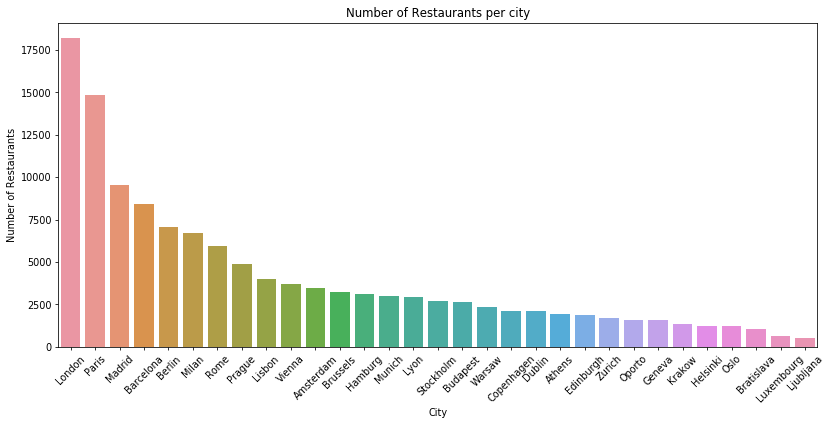

In [80]:
plt.figure(figsize = (12, 6), dpi = 70)
plot = sns.countplot(cleaned_data['City'], order = cleaned_data['City'].value_counts().index)
plot.set_xticklabels(plot.get_xticklabels(), rotation = 45)
plt.tight_layout()
plt.ylabel('Number of Restaurants')
plt.title('Number of Restaurants per city')

### Price Range

In [81]:
# Price range of restaurants
# Approximate cost per person for a meal

In [82]:
Low = cleaned_data['Price Range_$'].sum()
Low

19005

In [83]:
Mid = cleaned_data['Price Range_$$-$$$'].sum()
Mid

102215

In [84]:
High = cleaned_data['Price Range_$$$$'].sum()
High

4307

In [86]:
#There are three classes of price range:
#Price Range_$       = Low Range
#Price Range_$$-$$$  = Mid Range
#Price Range_$$$$    = High Range

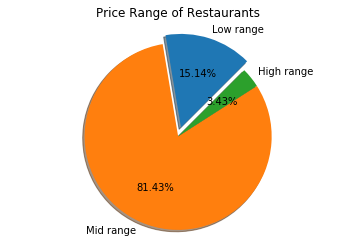

In [87]:
# Price range of restaurants in all the cities put together
# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = 'Low range', 'Mid range', 'High range'
sizes = [Low, Mid, High]
explode = (0.1, 0, 0)  # only "explode" the 1st slice (i.e. 'Low_range')

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode = explode, labels = labels, autopct = '%1.2f%%',
        shadow = True, startangle = 45)
ax1.axis('equal')  # equal aspect ratio ensures that pie is drawn as a circle.

plt.title('Price Range of Restaurants')
plt.show()

##### 15.14% restaurants have a low price range and 3.43% fall under the category of high price range per meal. On the other hand, a significant percentage of 81.43 have a nominal price range.

In [88]:
price = []
for city in cleaned_data.City.unique():
    a = cleaned_data[cleaned_data.City == city].iloc[:,9:12].sum()
    price.append(a)
print(price)    

[Price Range_$          546
Price Range_$$-$$$    2782
Price Range_$$$$       106
dtype: int64, Price Range_$          458
Price Range_$$-$$$    1413
Price Range_$$$$        67
dtype: int64, Price Range_$         1464
Price Range_$$-$$$    6698
Price Range_$$$$       263
dtype: int64, Price Range_$         1153
Price Range_$$-$$$    5791
Price Range_$$$$       134
dtype: int64, Price Range_$         123
Price Range_$$-$$$    919
Price Range_$$$$       25
dtype: int64, Price Range_$          385
Price Range_$$-$$$    2695
Price Range_$$$$       124
dtype: int64, Price Range_$          573
Price Range_$$-$$$    1959
Price Range_$$$$        74
dtype: int64, Price Range_$          262
Price Range_$$-$$$    1752
Price Range_$$$$        95
dtype: int64, Price Range_$          359
Price Range_$$-$$$    1680
Price Range_$$$$        43
dtype: int64, Price Range_$          415
Price Range_$$-$$$    1404
Price Range_$$$$        46
dtype: int64, Price Range_$           78
Price Range_$$-$$$    137

In [89]:
df = pd.DataFrame(price)
df.head()

,Price Range_$,Price Range_$$-$$$,Price Range_$$$$
0,546,2782,106
1,458,1413,67
2,1464,6698,263
3,1153,5791,134
4,123,919,25


In [90]:
cities = pd.DataFrame(restaurants3.City.unique(), columns = ['City_Name'])
cities.head()

,City_Name
0,Amsterdam
1,Athens
2,Barcelona
3,Berlin
4,Bratislava


In [91]:
city_price = pd.concat([cities, df], axis=1)
city_price

,City_Name,Price Range_$,Price Range_$$-$$$,Price Range_$$$$
0,Amsterdam,546,2782,106
1,Athens,458,1413,67
2,Barcelona,1464,6698,263
3,Berlin,1153,5791,134
4,Bratislava,123,919,25
5,Brussels,385,2695,124
6,Budapest,573,1959,74
7,Copenhagen,262,1752,95
8,Dublin,359,1680,43
9,Edinburgh,415,1404,46


In [92]:
city_price.values[0]

array(['Amsterdam', 546, 2782, 106], dtype=object)

In [93]:
city_price.values[0][0]

'Amsterdam'

In [94]:
# Price Range_$       = Low range
# Price Range_$$-$$$  = Mid range
# Price Range_$$$$    = High range

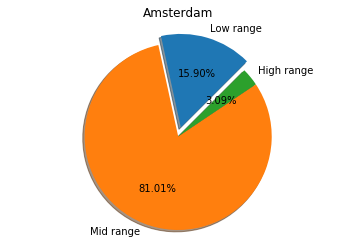

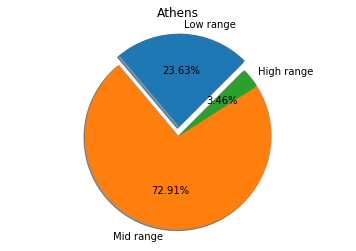

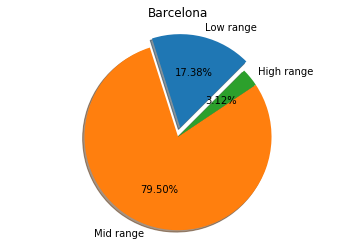

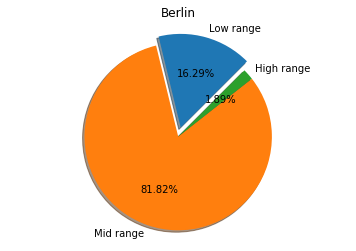

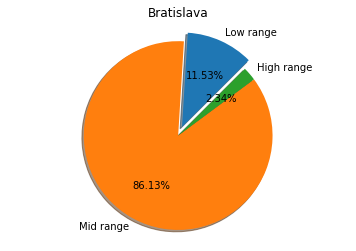

...

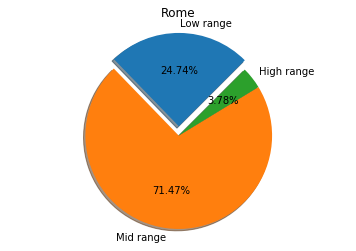

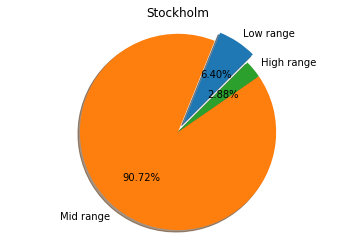

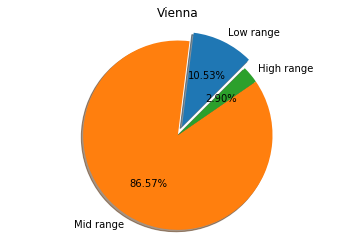

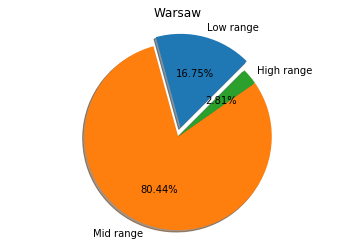

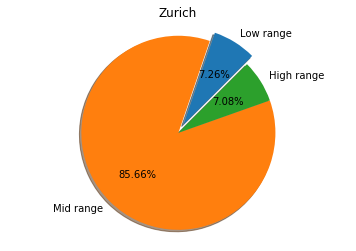

In [95]:
# Price range of the restaurants in each city
for row in city_price.values:
    city = row[0]
    #print(city)
    price = row[1:]
    
    labels = 'Low range', 'Mid range', 'High range'
    sizes = price
    explode = (0.1, 0, 0)  # only "explode" the 1st slice (i.e. 'Low_range')

    fig1, ax1 = plt.subplots()
    ax1.pie(sizes, explode = explode, labels = labels,  autopct = '%1.2f%%',
        shadow = True, startangle = 45)
    ax1.axis('equal')  # equal aspect ratio ensures that pie is drawn as a circle.
    
    plt.title(city)
    plt.show()

##### Geneva and Zurich, the cities of Switzerland have the highest percentage of expensive restaurants with a high price range. Krakow, Oporto, Athens and Rome has an average of 25% of the restaurants falling in a low price range.

##### London has 18,212 restaurants listed, out of which 16.40% of restuarants fall in a low price range and 3.56% in a high price range. On the other hand, a majority of 80.05% fall under the category of mid price range.
##### Whereas, in Rome out of 14,873 restaurants, a fairly higher percentage of 24.74 fall in a low price range and 3.78% of restaurants are expensive.

### Rating

##### Ratings of the restaurants (there are 6 clsses of ratings):
##### Excellent = [5]
##### Very good = [4]
##### Good = [3]
##### Average = [2]
##### Bad = [1]
##### Terrible = [-1]

In [98]:
cleaned_data['Rating'].value_counts()

 4    71169
 3    37899
 5    11257
 2     4157
 1     1004
-1       41
Name: Rating, dtype: int64

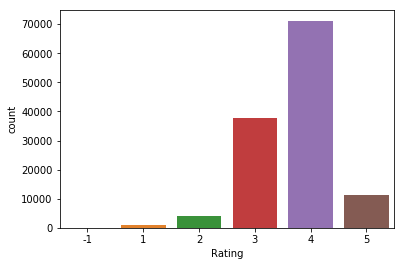

In [99]:
# Number of restaurants in each class of rating 
sns.countplot(x = 'Rating', data = cleaned_data)

##### A significant number of 71169 restaurants have a rating equal to 4, wheresas only 11257 restaurants have a top rating of 5.  41 restaurants in whole of Europe have a negative rating equal to -1.

In [101]:
# List of restaurants rated as terrible
restaurants_names = []
for i in range(len(cleaned_data)):
    if cleaned_data.iloc[i,:]['Rating'] == -1:
        restaurants_names.append((cleaned_data.iloc[i,:]['Name'],cleaned_data.iloc[i,:]['City']))
        
restaurants_names

[("Reggae Rita's", 'Amsterdam'),
 ('Lokaal Spaanders', 'Amsterdam'),
 ('Bistro Berlage', 'Amsterdam'),
 ('Fondue oost', 'Amsterdam'),
 ('Pigs&Punch', 'Amsterdam'),
 ('Sah', 'Athens'),
 ('La Petite Champagnerie', 'Barcelona'),
 ('Les Dues Sicilies Rec Comtal', 'Barcelona'),
 ('Vapiano', 'Barcelona'),
 ('Cafe MokannTi', 'Berlin'),
 ('Spazio - Italian Bistrot', 'Berlin'),
 ('Belga & Co', 'Brussels'),
 ('Bistrot Bocaux', 'Brussels'),
 ('Kujaku', 'Copenhagen'),
 ('Karma Sushi Kodbyen', 'Copenhagen'),
 ('PS Bar', 'Copenhagen'),
 ('Taqueria Los Cunados', 'Geneva'),
 ('Alberto Pizza', 'Krakow'),
 ('Per Tutti', 'Krakow'),
 ('Per Tutti', 'Krakow'),
 ('Roti Kitchen Limited', 'London'),
 ('Wine Cellar & Kitchen', 'London'),
 ('The Athenian', 'London'),
 ('Revolution Putney', 'London'),
 ('Julio Cevicheria', 'Luxembourg'),
 ('Le Resto Chinois', 'Lyon'),
 ('Riviere Kwai 2', 'Lyon'),
 ('Faborit', 'Madrid'),
 ('La Tushpa', 'Madrid'),
 ('Foster`s', 'Madrid'),
 ('Green Cafe', 'Milan'),
 ('Hambroeus', 'M

Text(0.5,1,'Maximum Rating per City')

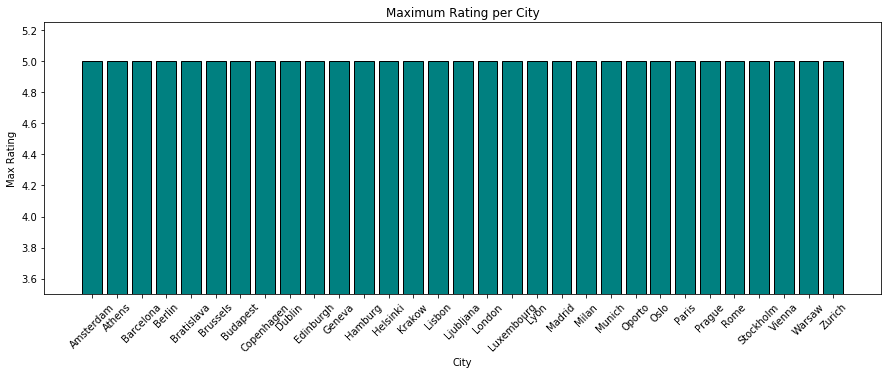

In [102]:
# Maximum rating earned by the restaurants in each city
x = list()
y = list()
for city in list(cleaned_data['City'].unique()):
    x.append(city)
    y.append(cleaned_data[cleaned_data['City'] == city]['Rating'].max())
fig, ax = plt.subplots(1, 1, figsize = (15, 5))
ax.bar(x, y, color = 'teal', edgecolor = 'black')
ax.set_ylim(bottom = 3.5)
ax.set_xticklabels(labels = x, rotation = 45)
ax.set_xlabel('City')
ax.set_ylabel('Max Rating')
ax.set_title('Maximum Rating per City')

##### Atleast one of the restaurants in each city has got a maximum rating of 5. Each city has atleast one of the best restaurants in Europe.

Text(0.5,1,'Minimum Rating per City')

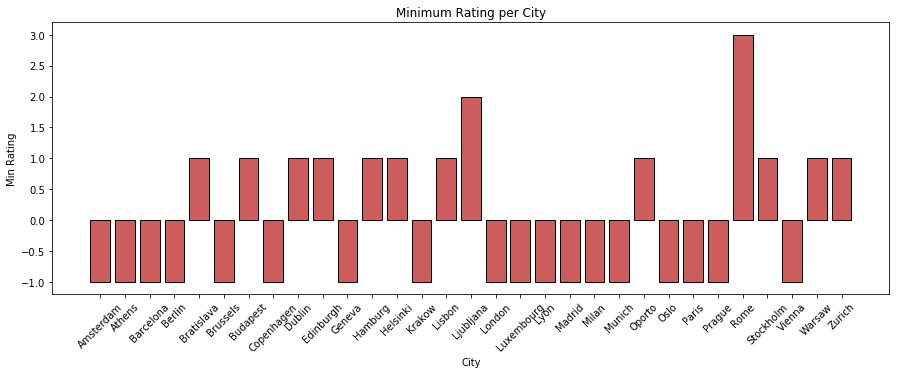

In [103]:
# Minimum rating earned by the restaurants in each city
x = list()
y = list()
for city in list(cleaned_data['City'].unique()):
    x.append(city)
    y.append(cleaned_data[cleaned_data['City'] == city]['Rating'].min())
fig, ax = plt.subplots(1, 1, figsize = (15, 5))
ax.bar(x, y, color = 'indianred', edgecolor = 'black')
ax.set_xticklabels(labels = x, rotation = 45)
ax.set_xlabel('City')
ax.set_ylabel('Min Rating')
ax.set_title('Minimum Rating per City')

Text(0.5,1,'Average Rating per City')

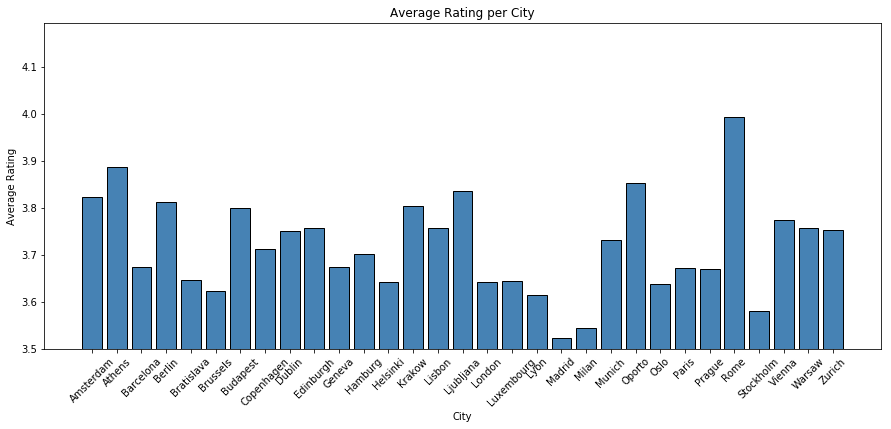

In [104]:
# Average rating of the restaurants in each city
x = list()
y = list()
for city in list(cleaned_data['City'].unique()):
    x.append(city)
    y.append(cleaned_data[cleaned_data['City'] == city]['Rating'].mean())
    #print(y)
fig, ax = plt.subplots(1, 1, figsize = (15, 6))
ax.bar(x, y, color = 'steelblue', edgecolor = 'black')
ax.set_ylim(bottom = 3.5)
ax.set_xticklabels(labels = x, rotation = 45)
ax.set_xlabel('City')
ax.set_ylabel('Average Rating')
ax.set_title('Average Rating per City')

Text(0.5,1,'Number of Negative Ratings per City')

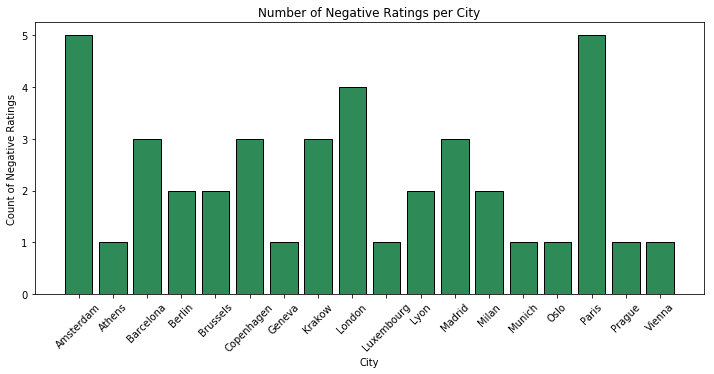

In [105]:
# Cities with negative ratings and its counts
x = list()
y = list()
count = 0
for city in list(cleaned_data['City'].unique()):
    count = len(cleaned_data[(cleaned_data['City'] == city) & (cleaned_data['Rating'] < 0)])
    if count > 0:
        y.append(count)
        x.append(city)
    count = 0
fig, ax = plt.subplots(1, 1, figsize = (12, 5))
ax.bar(x,y,color = 'seagreen', edgecolor = 'black')
ax.set_xticklabels(labels = x, rotation = 45)
ax.set_xlabel('City')
ax.set_ylabel('Count of Negative Ratings')
ax.set_title('Number of Negative Ratings per City')

##### In to the above plots, the restaurants in Rome do not have any negative ratings, the least rating earned is 3, and the average rating of the restaurants in the city is 4. Hence, Rome (in Italy) is a preferable city to eat in Europe, according to the customer ratings.
##### Secondly, the restaurants in Ljublijana (the capital city of Slovenia) does not have any negative ratings either, has a least rating of 2, and an average rating of 3.82.

Text(0.5,1,'Number of restaurants with Maximum Rating per City')

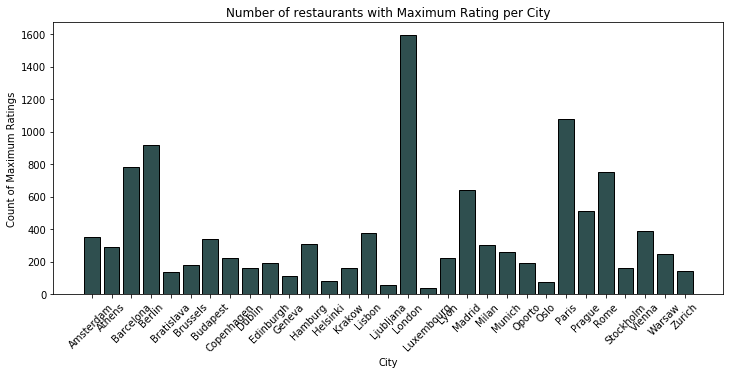

In [106]:
# Number of restaurants with rating 5 in each city
x = list()
y = list()
count = 0
for city in list(cleaned_data['City'].unique()):
    count = len(cleaned_data[(cleaned_data['City'] == city) & (cleaned_data['Rating'] == 5)])
    #print(count)
    if count > 0:
        y.append(count)
        x.append(city)
    count = 0
fig, ax = plt.subplots(1, 1, figsize = (12, 5))
ax.bar(x, y, color = 'darkslategray', edgecolor = 'black')
ax.set_xticklabels(labels = x, rotation = 45)
ax.set_xlabel('City')
ax.set_ylabel('Count of Maximum Ratings')
ax.set_title('Number of restaurants with Maximum Rating per City')  

In [107]:
excellent = (cleaned_data['Rating'] == 5).sum()     # excellent = 5
very_good = (cleaned_data['Rating'] == 4).sum()     # very_good = 4
good = (cleaned_data['Rating'] == 3).sum()          # good = 3
average = (cleaned_data['Rating'] == 2).sum()       # average = 2
bad = (cleaned_data['Rating'] == 1).sum()           # bad = 1
terrible = (cleaned_data['Rating'] == -1).sum()     # terrible = -1

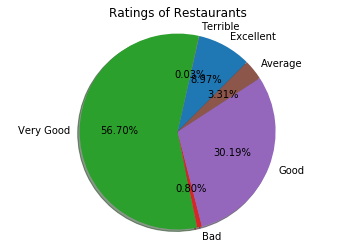

In [108]:
# Customer ratings for all the restaurants
labels = 'Excellent', 'Terrible', 'Very Good', 'Bad', 'Good', 'Average'
sizes = [excellent, terrible, very_good, bad, good, average]
explode = (0.1, 0, 0, 0, 0, 0)  # only "explode" the 1st slice (i.e. 'Low_range')

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels = labels, autopct = '%1.2f%%',
        shadow = True, startangle = 45)
ax1.axis('equal')  # equal aspect ratio ensures that pie is drawn as a circle.

plt.title('Ratings of Restaurants')
plt.show()

##### 8.97% out of 125527 restaurants are rated as excellent and 0.83% are rated below average.

### Cuisine Styles

In [109]:
# Different cuisine styles in European restaurants

In [110]:
columnNames = list(cuisines.head())

In [111]:
cuisine_name = pd.DataFrame(columnNames, columns = ['cuisine'])
cuisine_name

,cuisine
0,Afghani
1,African
2,Albanian
3,American
4,Arabic
5,Argentinean
6,Armenian
7,Asian
8,Australian
9,Austrian


In [112]:
#All the 31 European cities put together, there are 128 varieties of cuisines available.

In [113]:
cuisines.Afghani.sum()

73

In [114]:
cuisine_count = pd.DataFrame(cuisines.sum())
cuisine_count

,0
Afghani,73
African,486
Albanian,21
American,4052
Arabic,175
Argentinean,527
Armenian,42
Asian,9064
Australian,87
Austrian,1183


In [115]:
styles = pd.concat([cuisine_name, pd.DataFrame(cuisine_count.iloc[:,0].values.reshape(-1,1), columns = ['count'])], axis = 1)
styles

,cuisine,count
0,Afghani,73
1,African,486
2,Albanian,21
3,American,4052
4,Arabic,175
5,Argentinean,527
6,Armenian,42
7,Asian,9064
8,Australian,87
9,Austrian,1183


In [116]:
plot = go.Scatter(x = styles['cuisine'], y = styles['count'])
py.iplot([plot])

In [117]:
# Different cuisine styles in each city

In [118]:
style = []
for city in cleaned_data.City.unique():
    z = cleaned_data[cleaned_data.City == city].iloc[:,12:].sum()
    style.append(z)
print(style)    

[Afghani                  3
African                 24
Albanian                 0
American               157
Arabic                  12
Argentinean             75
Armenian                 0
Asian                  378
Australian               6
Austrian                 1
Azerbaijani              0
Balti                    5
Bangladeshi              0
Bar                    516
Barbecue                91
Belgian                 19
Brazilian               11
BrewPub                  4
British                 19
Burmese                  0
Cafe                   335
Cajun&Creole             3
Cambodian                0
Canadian                 0
Caribbean               17
Caucasian                0
CentralAmerican         11
CentralAsian             1
CentralEuropean         54
Chilean                  0
                      ... 
Scottish                 0
Seafood                133
Singaporean              2
Slovenian                0
Soups                   47
SouthAmerican           63


In [119]:
styles = pd.DataFrame(style)
styles.head()

,Afghani,African,Albanian,American,Arabic,Argentinean,Armenian,Asian,Australian,Austrian,...,Unknown,Uzbek,VeganOptions,VegetarianFriendly,Venezuelan,Vietnamese,Welsh,WineBar,Xinjiang,Yunnan
0,3,24,0,157,12,75,0,378,6,1,...,538,0,541,1351,0,25,0,23,0,0
1,0,6,1,57,8,2,4,56,1,0,...,402,0,297,445,1,2,0,65,0,0
2,1,14,1,198,7,116,2,396,2,2,...,2037,1,1038,2039,29,20,0,125,1,2
3,1,25,0,181,26,29,6,546,8,57,...,2468,0,655,1778,0,279,0,73,0,0
4,0,1,0,33,2,2,1,36,0,2,...,424,0,48,105,0,12,0,28,0,0


In [120]:
cities.head()

,City_Name
0,Amsterdam
1,Athens
2,Barcelona
3,Berlin
4,Bratislava


In [121]:
# Cuisine styles and their count in each city 
city_cuisine = pd.concat([cities, styles], axis=1)
city_cuisine

,City_Name,Afghani,African,Albanian,American,Arabic,Argentinean,Armenian,Asian,Australian,...,Unknown,Uzbek,VeganOptions,VegetarianFriendly,Venezuelan,Vietnamese,Welsh,WineBar,Xinjiang,Yunnan
0,Amsterdam,3,24,0,157,12,75,0,378,6,...,538,0,541,1351,0,25,0,23,0,0
1,Athens,0,6,1,57,8,2,4,56,1,...,402,0,297,445,1,2,0,65,0,0
2,Barcelona,1,14,1,198,7,116,2,396,2,...,2037,1,1038,2039,29,20,0,125,1,2
3,Berlin,1,25,0,181,26,29,6,546,8,...,2468,0,655,1778,0,279,0,73,0,0
4,Bratislava,0,1,0,33,2,2,1,36,0,...,424,0,48,105,0,12,0,28,0,0
5,Brussels,1,29,0,76,1,8,1,249,0,...,737,0,244,704,0,78,0,50,0,0
6,Budapest,1,2,0,152,3,2,1,146,0,...,503,0,313,731,0,33,0,50,0,0
7,Copenhagen,0,2,0,112,6,5,1,195,3,...,522,0,191,497,1,26,0,42,0,0
8,Dublin,4,3,1,103,2,2,0,231,5,...,347,0,350,727,0,13,0,38,0,0
9,Edinburgh,0,9,0,79,0,4,0,229,1,...,265,0,471,906,1,4,0,30,0,0


In [122]:
city_cuisine.values[0]

array(['Amsterdam', 3, 24, 0, 157, 12, 75, 0, 378, 6, 1, 0, 5, 0, 516, 91,
       19, 11, 4, 19, 0, 335, 3, 0, 0, 17, 0, 11, 1, 54, 0, 101, 3, 57, 0,
       1, 0, 2, 43, 35, 869, 2, 1, 6, 14, 1509, 131, 0, 227, 1, 60, 21, 1,
       8, 514, 30, 91, 0, 52, 5, 88, 0, 76, 84, 371, 7, 8, 405, 4, 120,
       10, 4, 33, 0, 17, 2, 369, 44, 84, 2, 0, 30, 0, 11, 4, 1, 8, 6, 4,
       199, 0, 0, 11, 307, 0, 1, 1, 0, 4, 0, 133, 2, 0, 47, 63, 6, 91, 0,
       119, 25, 90, 3, 6, 1, 74, 6, 2, 76, 0, 538, 0, 541, 1351, 0, 25, 0,
       23, 0, 0], dtype=object)

##### Number of Reviews

In [123]:
# Number of reviews for restaurants in each city

In [124]:
cleaned_data['Number of Reviews']

0          136.0
1          812.0
2          567.0
3          564.0
4          316.0
5          745.0
6         1455.0
7          675.0
8          923.0
9          450.0
10         295.0
11         967.0
12         368.0
13         586.0
14        1246.0
15        1391.0
16        1633.0
17         958.0
18         426.0
19         421.0
20        1380.0
21         239.0
22         996.0
23         716.0
24        1958.0
25        2360.0
26         666.0
27        1642.0
28         344.0
29         646.0
           ...  
125497     125.0
125498     125.0
125499     125.0
125500     125.0
125501     125.0
125502     125.0
125503     125.0
125504     125.0
125505     125.0
125506     125.0
125507     125.0
125508     125.0
125509     125.0
125510     125.0
125511     125.0
125512     125.0
125513     125.0
125514     125.0
125515     125.0
125516     125.0
125517     125.0
125518     125.0
125519     125.0
125520     125.0
125521     125.0
125522     125.0
125523     125.0
125524     125

Text(0.5,1,'Number of Reviwes per City')

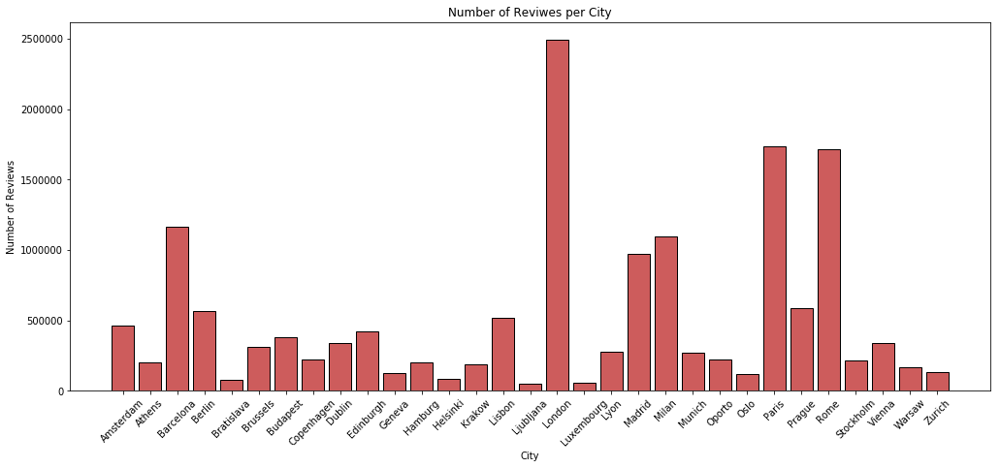

In [125]:
x = list()
y = list()
for city in list(cleaned_data['City'].unique()):
    x.append(city)
    y.append(cleaned_data[cleaned_data['City'] == city]['Number of Reviews'].sum())
    #print(y)
fig, ax = plt.subplots(1, 1, figsize = (17, 7))
ax.bar(x, y, color = 'indianred', edgecolor = 'black')
ax.set_ylim(bottom = 3.5)
ax.set_xticklabels(labels = x, rotation = 45)
ax.set_xlabel('City')
ax.set_ylabel('Number of Reviews')
ax.set_title('Number of Reviwes per City')

### Analysis of Best restaurants

In [127]:
# Best restaurants in London and Paris (they have the highest number of restuarants)

In [128]:
# List of restaurants in London
London = cleaned_data[cleaned_data.City == 'London']
London

,Restaurant ID,Name,City,Ranking,Rating,Number of Reviews,Reviews,URL_TA,ID_TA,Price Range_$,...,Unknown,Uzbek,VeganOptions,VegetarianFriendly,Venezuelan,Vietnamese,Welsh,WineBar,Xinjiang,Yunnan
45580,0,R & H cafe gallery,London,1,5,146.0,"[['Amazing cakes', 'Breakfatst'], ['01/08/2018...",/Restaurant_Review-g186338-d10517849-Reviews-R...,d10517849,0,...,0,0,1,1,0,0,0,0,0,0
45581,1,Osteria Romana,London,2,5,112.0,[['Small restaurant with the touch of Italian....,/Restaurant_Review-g186338-d13149344-Reviews-O...,d13149344,0,...,0,0,0,1,0,0,0,0,0,0
45582,2,The Oystermen Seafood Bar & Kitchen,London,3,5,255.0,"[['Fantasic!!', 'Superb Food, Warm and Welcomi...",/Restaurant_Review-g186338-d12518072-Reviews-T...,d12518072,0,...,0,0,0,0,0,0,0,0,0,0
45583,3,Liman Restaurant,London,4,5,945.0,"[['A good experience', 'Excellent Establishmen...",/Restaurant_Review-g186338-d10444968-Reviews-L...,d10444968,0,...,0,0,1,1,0,0,0,0,0,0
45584,4,Holy Smoke,London,5,5,433.0,"[['Always consistently good food and service',...",/Restaurant_Review-g186338-d7697088-Reviews-Ho...,d7697088,0,...,0,0,1,1,0,0,0,0,0,0
45585,5,The Ledbury,London,6,4,2535.0,"[['Decades New, A Sublime Evening to Cherish',...",/Restaurant_Review-g186338-d720761-Reviews-The...,d720761,0,...,0,0,1,1,0,0,0,0,0,0
45586,6,The Clink Restaurant,London,7,5,588.0,"[['Weird but such a good experience!', 'Fantas...",/Restaurant_Review-g186338-d6635485-Reviews-Th...,d6635485,0,...,0,0,1,1,0,0,0,0,0,0
45587,7,Bar 61 Restaurant,London,8,5,1730.0,"[['A Gem of a Tapas Bar!', 'Very good'], ['01/...",/Restaurant_Review-g186338-d1316206-Reviews-Ba...,d1316206,0,...,0,0,1,1,0,0,0,0,0,0
45588,8,Taste Of Nawab,London,9,5,520.0,"[['Amazing takeaway', 'Amazing Restaurant!'], ...",/Restaurant_Review-g186338-d813149-Reviews-Tas...,d813149,0,...,0,0,1,1,0,0,0,0,0,0
45589,9,Pizza Union Aldgate,London,10,5,369.0,"[['Fast and tasty', 'Great pizza'], ['01/07/20...",/Restaurant_Review-g186338-d12379859-Reviews-P...,d12379859,1,...,0,0,1,1,0,0,0,0,0,0


In [129]:
# Best budget friendly restaurants 
# Restaurants with rating 5 and low price range
London_best = London[London.Rating == 5]
a = London_best[London_best["Price Range_$"] == 1]
a

,Restaurant ID,Name,City,Ranking,Rating,Number of Reviews,Reviews,URL_TA,ID_TA,Price Range_$,...,Unknown,Uzbek,VeganOptions,VegetarianFriendly,Venezuelan,Vietnamese,Welsh,WineBar,Xinjiang,Yunnan
45589,9,Pizza Union Aldgate,London,10,5,369.0,"[['Fast and tasty', 'Great pizza'], ['01/07/20...",/Restaurant_Review-g186338-d12379859-Reviews-P...,d12379859,1,...,0,0,1,1,0,0,0,0,0,0
45595,15,The Golden Chippy,London,16,5,1015.0,"[['Best in London! Best food, best guys!', 'Th...",/Restaurant_Review-g186338-d5244301-Reviews-Th...,d5244301,1,...,0,0,0,0,0,0,0,0,0,0
45637,57,The Calabash of Culture,London,58,5,196.0,"[['Delicious', 'The Calabash of Cultures'], ['...",/Restaurant_Review-g186338-d7316621-Reviews-Th...,d7316621,1,...,0,0,1,1,0,0,0,0,0,0
45847,267,EaTurkish,London,268,5,66.0,"[['Best Turkish Kebab in London!', 'Service wi...",/Restaurant_Review-g186338-d12213063-Reviews-E...,d12213063,1,...,0,0,0,1,0,0,0,0,0,0
46000,420,Pizzetta Pizza,London,421,5,135.0,"[['A slice of Italy in South Ken!', 'Great piz...",/Restaurant_Review-g186338-d8756059-Reviews-Pi...,d8756059,1,...,0,0,1,1,0,0,0,0,0,0
46105,525,The Lounge Cafe,London,526,5,73.0,"[['Lovely lovely community cafe', 'Top cafè'],...",/Restaurant_Review-g186338-d10519837-Reviews-T...,d10519837,1,...,0,0,1,1,0,0,0,0,0,0
46160,580,Saka Maka cafe,London,581,5,69.0,"[['Great food', 'Superb restaurant / takeaway ...",/Restaurant_Review-g186338-d12269625-Reviews-S...,d12269625,1,...,0,0,1,1,0,0,0,0,0,0
46173,593,Pizza Union Dalston,London,594,5,56.0,"[['AMAZING', '11/10'], ['01/06/2018', '01/06/2...",/Restaurant_Review-g186338-d13148685-Reviews-P...,d13148685,1,...,0,0,0,1,0,0,0,0,0,0
46390,810,Oi Vita Pizzeria,London,811,5,58.0,"[['Authentic Pizza', 'Home away from home'], [...",/Restaurant_Review-g186338-d11961993-Reviews-O...,d11961993,1,...,0,0,1,1,0,0,0,0,0,0
46493,913,Magic Falafel,London,914,5,55.0,"[['Best Falafel in London', 'Best Best! Besttt...",/Restaurant_Review-g186338-d10701915-Reviews-M...,d10701915,1,...,0,0,1,1,0,0,0,0,0,0


In [130]:
# Best moderately priced restaurants 
# Restaurants with rating 5 and high price range
London_moderate = London[London.Rating == 5]
b = London_moderate[London_moderate["Price Range_$$-$$$"] == 1]
b

,Restaurant ID,Name,City,Ranking,Rating,Number of Reviews,Reviews,URL_TA,ID_TA,Price Range_$,...,Unknown,Uzbek,VeganOptions,VegetarianFriendly,Venezuelan,Vietnamese,Welsh,WineBar,Xinjiang,Yunnan
45580,0,R & H cafe gallery,London,1,5,146.0,"[['Amazing cakes', 'Breakfatst'], ['01/08/2018...",/Restaurant_Review-g186338-d10517849-Reviews-R...,d10517849,0,...,0,0,1,1,0,0,0,0,0,0
45582,2,The Oystermen Seafood Bar & Kitchen,London,3,5,255.0,"[['Fantasic!!', 'Superb Food, Warm and Welcomi...",/Restaurant_Review-g186338-d12518072-Reviews-T...,d12518072,0,...,0,0,0,0,0,0,0,0,0,0
45583,3,Liman Restaurant,London,4,5,945.0,"[['A good experience', 'Excellent Establishmen...",/Restaurant_Review-g186338-d10444968-Reviews-L...,d10444968,0,...,0,0,1,1,0,0,0,0,0,0
45584,4,Holy Smoke,London,5,5,433.0,"[['Always consistently good food and service',...",/Restaurant_Review-g186338-d7697088-Reviews-Ho...,d7697088,0,...,0,0,1,1,0,0,0,0,0,0
45586,6,The Clink Restaurant,London,7,5,588.0,"[['Weird but such a good experience!', 'Fantas...",/Restaurant_Review-g186338-d6635485-Reviews-Th...,d6635485,0,...,0,0,1,1,0,0,0,0,0,0
45587,7,Bar 61 Restaurant,London,8,5,1730.0,"[['A Gem of a Tapas Bar!', 'Very good'], ['01/...",/Restaurant_Review-g186338-d1316206-Reviews-Ba...,d1316206,0,...,0,0,1,1,0,0,0,0,0,0
45588,8,Taste Of Nawab,London,9,5,520.0,"[['Amazing takeaway', 'Amazing Restaurant!'], ...",/Restaurant_Review-g186338-d813149-Reviews-Tas...,d813149,0,...,0,0,1,1,0,0,0,0,0,0
45591,11,taNgia,London,12,5,539.0,"[['""Delicious! Christmas meal ""', 'Delicious! ...",/Restaurant_Review-g186338-d7391044-Reviews-Ta...,d7391044,0,...,0,0,1,1,0,0,0,0,0,0
45594,14,Zeret Kitchen,London,15,5,474.0,"[['Excellent Service, Delicious and Authentic....",/Restaurant_Review-g186338-d1748899-Reviews-Ze...,d1748899,0,...,0,0,1,1,0,0,0,0,0,0
45599,19,Kibele Restaurant & Bar,London,20,5,273.0,"[['Birthday treat', 'After show meal'], ['01/0...",/Restaurant_Review-g186338-d12290895-Reviews-K...,d12290895,0,...,0,0,1,1,0,0,0,0,0,0


In [131]:
# Best expensive restaurants
# Restaurants with rating 5 and mid price range
London_expensive = London[London.Rating == 5]
c = London_expensive[London_expensive["Price Range_$$$$"] == 1]
c

,Restaurant ID,Name,City,Ranking,Rating,Number of Reviews,Reviews,URL_TA,ID_TA,Price Range_$,...,Unknown,Uzbek,VeganOptions,VegetarianFriendly,Venezuelan,Vietnamese,Welsh,WineBar,Xinjiang,Yunnan
45581,1,Osteria Romana,London,2,5,112.0,[['Small restaurant with the touch of Italian....,/Restaurant_Review-g186338-d13149344-Reviews-O...,d13149344,0,...,0,0,0,1,0,0,0,0,0,0
45590,10,Core by Clare Smyth,London,11,5,99.0,"[['Outstanding', 'Outstanding'], ['01/07/2018'...",/Restaurant_Review-g186338-d12801049-Reviews-C...,d12801049,0,...,0,0,1,1,0,0,0,0,0,0
45592,12,Gastronhome,London,13,5,572.0,"[['Not expected there', 'Excellent dinnee'], [...",/Restaurant_Review-g186338-d5561842-Reviews-Ga...,d5561842,0,...,0,0,1,1,0,0,0,0,0,0
45596,16,The Five Fields,London,17,5,1129.0,"[['Special Dining Experience', 'Top restaurant...",/Restaurant_Review-g186338-d3853609-Reviews-Th...,d3853609,0,...,0,0,1,1,0,0,0,0,0,0
45598,18,Peninsula Restaurant,London,19,5,228.0,"[['A Delightful Celebration', 'Marvellous rest...",/Restaurant_Review-g186338-d10148721-Reviews-P...,d10148721,0,...,0,0,1,1,0,0,0,0,0,0
45706,126,Lorne Restaurant,London,127,5,97.0,"[['Thespy Heaven', 'Fabulous little restaurant...",/Restaurant_Review-g186338-d12113945-Reviews-L...,d12113945,0,...,0,0,1,1,0,0,0,0,0,0
46026,446,London Shell Co,London,447,5,73.0,"[['A Christmas Highlight', 'Xmas party'], ['01...",/Restaurant_Review-g186338-d11838878-Reviews-L...,d11838878,0,...,0,0,0,0,0,0,0,0,0,0
46336,756,Sunday Champagne Brunch at The Landmark London,London,757,5,200.0,"[['This Hotel is not just for Christmas', 'Sup...",/Restaurant_Review-g186338-d3869685-Reviews-Su...,d3869685,0,...,0,0,0,1,0,0,0,0,0,0
46515,935,Alexandrie Restaurant,London,936,5,141.0,"[['Amazing fine restaurant', 'excellent'], ['1...",/Restaurant_Review-g186338-d7589353-Reviews-Al...,d7589353,0,...,0,0,1,1,0,0,0,0,0,0
46519,939,Restaurant Flat Three,London,940,5,121.0,"[['Truly unique', 'My favourite restaurant in ...",/Restaurant_Review-g186338-d7932677-Reviews-Re...,d7932677,0,...,0,0,1,1,0,0,0,0,0,0


In London there are 328 restaurants which provide best budget friendly food and 1225 moderately priced restaurants.
There are 39 restaurants which are expensive and the best.

In [132]:
# List of restaurants in Paris
Paris = cleaned_data[cleaned_data.City == 'Paris']
Paris

,Restaurant ID,Name,City,Ranking,Rating,Number of Reviews,Reviews,URL_TA,ID_TA,Price Range_$,...,Unknown,Uzbek,VeganOptions,VegetarianFriendly,Venezuelan,Vietnamese,Welsh,WineBar,Xinjiang,Yunnan
89397,0,La Meduse,Paris,1,5,178.0,"[[""You can't figure out from the outside the.....",/Restaurant_Review-g187147-d10622151-Reviews-L...,d10622151,0,...,0,0,1,1,0,0,0,0,0,0
89398,1,Le Cappiello,Paris,2,5,208.0,"[['Incredible!', 'Amazing food, wonderful atmo...",/Restaurant_Review-g187147-d12082727-Reviews-L...,d12082727,0,...,0,0,1,1,0,0,0,0,0,0
89399,2,ASPIC,Paris,3,5,427.0,"[['Second time and just as good', 'Best dinner...",/Restaurant_Review-g187147-d9806534-Reviews-AS...,d9806534,0,...,0,0,0,0,0,0,0,0,0,0
89400,3,Les Apotres de Pigalle,Paris,4,5,1152.0,"[['Wonderful culinary experience', 'Must go re...",/Restaurant_Review-g187147-d10514254-Reviews-L...,d10514254,0,...,0,0,1,1,0,0,0,0,0,0
89401,4,Epicure,Paris,5,5,2305.0,"[['Very nice place', 'Speechless'], ['01/08/20...",/Restaurant_Review-g187147-d719052-Reviews-Epi...,d719052,0,...,0,0,1,1,0,0,0,0,0,0
89402,5,Sourire Le Restaurant,Paris,6,5,198.0,"[['Great service', 'Just excellent'], ['01/06/...",/Restaurant_Review-g187147-d11857149-Reviews-S...,d11857149,0,...,0,0,0,0,0,0,0,0,0,0
89403,6,Le Cinq,Paris,7,4,1887.0,"[['Breath taking ambience and great service', ...",/Restaurant_Review-g187147-d699456-Reviews-Le_...,d699456,0,...,0,0,1,1,0,0,0,0,0,0
89404,7,Il Etait Un Square,Paris,8,5,1600.0,"[['Excellent dining experience', 'Great burger...",/Restaurant_Review-g187147-d6575305-Reviews-Il...,d6575305,0,...,0,0,0,1,0,0,0,0,0,0
89405,8,Boutary,Paris,9,5,533.0,"[['They will get the star for 2 reasons', 'A f...",/Restaurant_Review-g187147-d9783452-Reviews-Bo...,d9783452,0,...,0,0,0,1,0,0,0,0,0,0
89406,9,Kei Restaurant,Paris,10,4,689.0,"[['Amazing!!', 'Magnifique'], ['12/23/2017', '...",/Restaurant_Review-g187147-d2105853-Reviews-Ke...,d2105853,0,...,0,0,0,1,0,0,0,0,0,0


In [133]:
## Best budget friendly restaurants 
# Restaurants with rating 5 and low price range
Paris_best = Paris[Paris.Rating == 5]
d = Paris_best[Paris_best["Price Range_$"] == 1]
d

,Restaurant ID,Name,City,Ranking,Rating,Number of Reviews,Reviews,URL_TA,ID_TA,Price Range_$,...,Unknown,Uzbek,VeganOptions,VegetarianFriendly,Venezuelan,Vietnamese,Welsh,WineBar,Xinjiang,Yunnan
89681,284,Cook' n Saj,Paris,285,5,93.0,"[['Warm, friendly, and fantastic food', 'Most ...",/Restaurant_Review-g187147-d11929974-Reviews-C...,d11929974,1,...,0,0,1,1,0,0,0,0,0,0
89722,325,Restaurant Argana,Paris,326,5,69.0,"[['Authentic taste of Morocco, real great foo....",/Restaurant_Review-g187147-d5969794-Reviews-Re...,d5969794,1,...,0,0,1,1,0,0,0,0,0,0
89815,418,Chez Maxence,Paris,419,5,122.0,"[['Sweet Dessert Delights', 'Delicious crepes!...",/Restaurant_Review-g187147-d6713340-Reviews-Ch...,d6713340,1,...,0,0,0,1,0,0,0,0,0,0
90049,652,Marche Ou Crepe,Paris,653,5,39.0,"[['The best in Paris', 'Cracking Crepe!!!'], [...",/Restaurant_Review-g187147-d12322841-Reviews-M...,d12322841,1,...,0,0,0,1,0,0,0,0,0,0
90086,689,Jeongane,Paris,690,5,58.0,"[['Absolutely amazing', 'Non-barbecue dishes w...",/Restaurant_Review-g187147-d11434744-Reviews-J...,d11434744,1,...,0,0,0,1,0,0,0,0,0,0
90150,753,ToTon,Paris,754,5,52.0,"[['Kurztrip', 'great place for real italian fo...",/Restaurant_Review-g187147-d10506083-Reviews-T...,d10506083,1,...,0,0,0,1,0,0,0,0,0,0
90218,821,Ensuite,Paris,822,5,64.0,"[['Good healthy options', 'Delicious!'], ['08/...",/Restaurant_Review-g187147-d11808429-Reviews-E...,d11808429,1,...,0,0,1,1,0,0,0,0,0,0
90357,960,XV Burger,Paris,961,5,52.0,"[['Amazing food and lovely staff !', 'Excellen...",/Restaurant_Review-g187147-d11691269-Reviews-X...,d11691269,1,...,0,0,0,1,0,0,0,0,0,0
90422,1025,Chez Cleopatre,Paris,1026,5,148.0,"[['Best kebab', 'Scrumptuous place to eat casu...",/Restaurant_Review-g187147-d6845364-Reviews-Ch...,d6845364,1,...,0,0,1,1,0,0,0,0,0,0
90468,1071,La Grotte de Chypre,Paris,1072,5,45.0,"[['Wonderful', 'A must-try, wonderful find! (A...",/Restaurant_Review-g187147-d11823628-Reviews-L...,d11823628,1,...,0,0,1,1,0,0,0,0,0,0


In [134]:
# Best moderately priced restaurants 
# Restaurants with rating 5 and high price range
London_moderate = London[London.Rating == 5]
e = London_moderate[London_moderate["Price Range_$$-$$$"] == 1]
e

,Restaurant ID,Name,City,Ranking,Rating,Number of Reviews,Reviews,URL_TA,ID_TA,Price Range_$,...,Unknown,Uzbek,VeganOptions,VegetarianFriendly,Venezuelan,Vietnamese,Welsh,WineBar,Xinjiang,Yunnan
45580,0,R & H cafe gallery,London,1,5,146.0,"[['Amazing cakes', 'Breakfatst'], ['01/08/2018...",/Restaurant_Review-g186338-d10517849-Reviews-R...,d10517849,0,...,0,0,1,1,0,0,0,0,0,0
45582,2,The Oystermen Seafood Bar & Kitchen,London,3,5,255.0,"[['Fantasic!!', 'Superb Food, Warm and Welcomi...",/Restaurant_Review-g186338-d12518072-Reviews-T...,d12518072,0,...,0,0,0,0,0,0,0,0,0,0
45583,3,Liman Restaurant,London,4,5,945.0,"[['A good experience', 'Excellent Establishmen...",/Restaurant_Review-g186338-d10444968-Reviews-L...,d10444968,0,...,0,0,1,1,0,0,0,0,0,0
45584,4,Holy Smoke,London,5,5,433.0,"[['Always consistently good food and service',...",/Restaurant_Review-g186338-d7697088-Reviews-Ho...,d7697088,0,...,0,0,1,1,0,0,0,0,0,0
45586,6,The Clink Restaurant,London,7,5,588.0,"[['Weird but such a good experience!', 'Fantas...",/Restaurant_Review-g186338-d6635485-Reviews-Th...,d6635485,0,...,0,0,1,1,0,0,0,0,0,0
45587,7,Bar 61 Restaurant,London,8,5,1730.0,"[['A Gem of a Tapas Bar!', 'Very good'], ['01/...",/Restaurant_Review-g186338-d1316206-Reviews-Ba...,d1316206,0,...,0,0,1,1,0,0,0,0,0,0
45588,8,Taste Of Nawab,London,9,5,520.0,"[['Amazing takeaway', 'Amazing Restaurant!'], ...",/Restaurant_Review-g186338-d813149-Reviews-Tas...,d813149,0,...,0,0,1,1,0,0,0,0,0,0
45591,11,taNgia,London,12,5,539.0,"[['""Delicious! Christmas meal ""', 'Delicious! ...",/Restaurant_Review-g186338-d7391044-Reviews-Ta...,d7391044,0,...,0,0,1,1,0,0,0,0,0,0
45594,14,Zeret Kitchen,London,15,5,474.0,"[['Excellent Service, Delicious and Authentic....",/Restaurant_Review-g186338-d1748899-Reviews-Ze...,d1748899,0,...,0,0,1,1,0,0,0,0,0,0
45599,19,Kibele Restaurant & Bar,London,20,5,273.0,"[['Birthday treat', 'After show meal'], ['01/0...",/Restaurant_Review-g186338-d12290895-Reviews-K...,d12290895,0,...,0,0,1,1,0,0,0,0,0,0


In [135]:
# Best expensive priced restaurants
# Restaurants with rating 5 and mid price range
Paris_expensive = Paris[Paris.Rating == 5]
f = Paris_expensive[Paris_expensive["Price Range_$$$$"] == 1]
f

,Restaurant ID,Name,City,Ranking,Rating,Number of Reviews,Reviews,URL_TA,ID_TA,Price Range_$,...,Unknown,Uzbek,VeganOptions,VegetarianFriendly,Venezuelan,Vietnamese,Welsh,WineBar,Xinjiang,Yunnan
89399,2,ASPIC,Paris,3,5,427.0,"[['Second time and just as good', 'Best dinner...",/Restaurant_Review-g187147-d9806534-Reviews-AS...,d9806534,0,...,0,0,0,0,0,0,0,0,0,0
89401,4,Epicure,Paris,5,5,2305.0,"[['Very nice place', 'Speechless'], ['01/08/20...",/Restaurant_Review-g187147-d719052-Reviews-Epi...,d719052,0,...,0,0,1,1,0,0,0,0,0,0
89402,5,Sourire Le Restaurant,Paris,6,5,198.0,"[['Great service', 'Just excellent'], ['01/06/...",/Restaurant_Review-g187147-d11857149-Reviews-S...,d11857149,0,...,0,0,0,0,0,0,0,0,0,0
89405,8,Boutary,Paris,9,5,533.0,"[['They will get the star for 2 reasons', 'A f...",/Restaurant_Review-g187147-d9783452-Reviews-Bo...,d9783452,0,...,0,0,0,1,0,0,0,0,0,0
89413,16,Alliance,Paris,17,5,267.0,"[['Superb as usual', 'Perfect'], ['12/29/2017'...",/Restaurant_Review-g187147-d9467731-Reviews-Al...,d9467731,0,...,0,0,1,1,0,0,0,0,0,0
89416,19,Restaurant H,Paris,20,5,264.0,[['Outstanding meal - both innovative and cla....,/Restaurant_Review-g187147-d9750183-Reviews-Re...,d9750183,0,...,0,0,0,1,0,0,0,0,0,0
89503,106,L'Arcane,Paris,107,5,112.0,"[['Sensational', 'Simply Brilliant!'], ['12/07...",/Restaurant_Review-g187147-d10837643-Reviews-L...,d10837643,0,...,0,0,0,1,0,0,0,0,0,0
89519,122,Arnaud Nicolas,Paris,123,5,118.0,"[['Fabulous dinner', 'Amazing food experience'...",/Restaurant_Review-g187147-d12423849-Reviews-A...,d12423849,0,...,0,0,0,1,0,0,0,0,0,0
89665,268,L'Orangerie,Paris,269,5,130.0,"[['Top class', 'Amazing new restaurant at the ...",/Restaurant_Review-g187147-d10443323-Reviews-L...,d10443323,0,...,0,0,1,1,0,0,0,0,0,0
89713,316,La Scene Theleme,Paris,317,5,134.0,"[['i offerd to ""marry"" the chef - amazing exp....",/Restaurant_Review-g187147-d11180479-Reviews-L...,d11180479,0,...,0,0,0,1,0,0,0,0,0,0


##### In Paris, 112 restaurants are budget friendly and 1225 are moderately priced. There are 45 expensive restaurants which are rated the best, which is more than what London has got to offer.  

### Reviews

In [136]:
# Visualizing customer reviews using WordCloud module

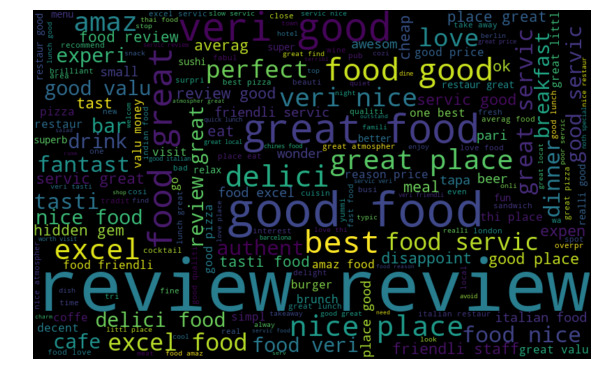

In [137]:
# ALl the words in the reviews for the restaurants
all_words = ' '.join([text for text in sent_data['Cleaned_Review']])    #stemmed words

from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

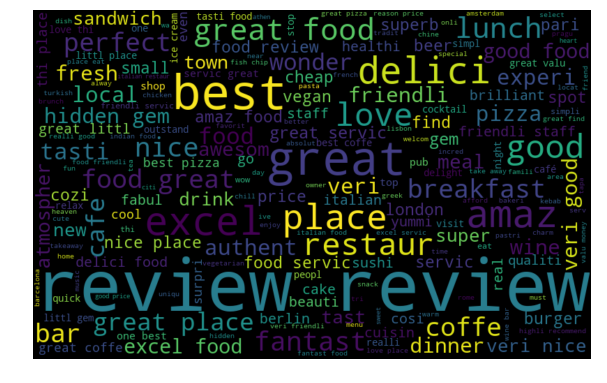

In [139]:
# Words used by the customers in reviews corresponding to rating 5
# Rating the restaurants as excellent
excellent_words = ' '.join([text for text in sent_data['Cleaned_Review'][sent_data['Rating'] == 5]])

wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(excellent_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

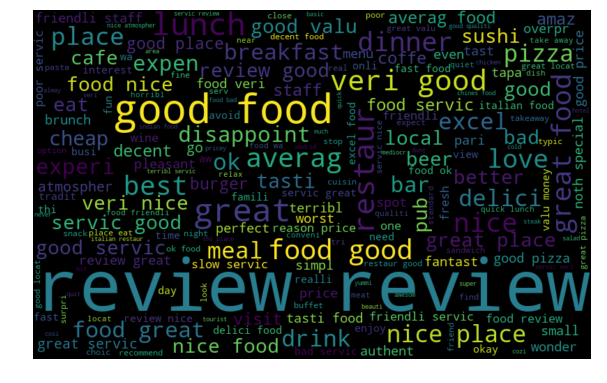

In [140]:
# Words used by the customers in reviews corresponding to rating 3
# Rating the restaurants as good
good_words = ' '.join([text for text in sent_data['Cleaned_Review'][sent_data['Rating'] == 3]])

wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(good_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

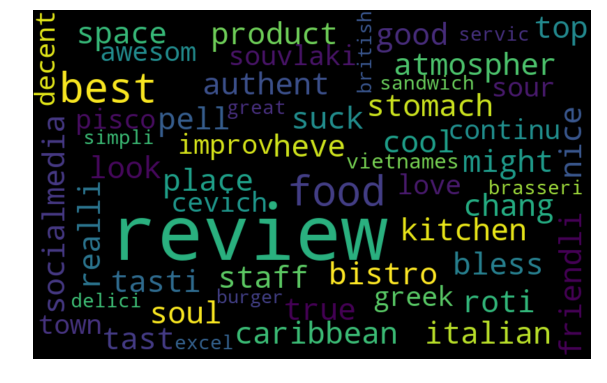

In [141]:
# Words used by the customers in reviews corresponding to rating -1
# Rating the restaurants as terrible 
terrible_words = ' '.join([text for text in sent_data['Cleaned_Review'][sent_data['Rating'] == -1]])

wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(terrible_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()